## Comparision of both method in finding high variance point

In [ ]:
import time
import warnings
import numpy as np
import pandas as pd
from scipy.optimize import minimize
from scipy.stats import qmc
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C

warnings.filterwarnings("ignore")

# ======================================================================
# 1. GLOBAL CONFIGURATION
# ======================================================================
DATA_PATH = r"D:\KIT\social_force_model\cafm_qmc_new_dataset_256x10.npz"

PARAM_NAMES = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]
OUTPUT_NAMES = ['mean_crossing_time', 'flow_rate', 'order_param_mean', 'mean_speed']
PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}

# ======================================================================
# 2. GP TRAINING FUNCTION (Returns the trained model)
# ======================================================================
def train_surrogate(data_path, target_idx=0, n_restarts=5):
    print("=" * 70)
    print(f"🔧 PHASE 1: TRAINING 6D HETEROSCEDASTIC GP")
    print("=" * 70)
    
    data = np.load(data_path)
    X = data["X"]
    y = data["Y"][:, target_idx]
    y_std = data["Y_std"][:, target_idx]

    # Remove NaNs
    valid_mask = ~np.isnan(y)
    X, y, y_std = X[valid_mask], y[valid_mask], y_std[valid_mask]

    X_train, X_test, y_train, y_test, y_std_train, _ = train_test_split(
        X, y, y_std, test_size=0.2, random_state=42
    )

    # Scaling
    scaler_X = StandardScaler()
    X_train_scaled = scaler_X.fit_transform(X_train)

    scaler_y = StandardScaler()
    y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).ravel()

    # Heteroscedastic Noise
    y_var_train_scaled = (y_std_train / scaler_y.scale_[0]) ** 2
    alpha_tr_scaled = np.clip(y_var_train_scaled, 1e-6, None)

    # Kernel Setup (ARD Matern 5/2)
    init_lengthscales = [0.5, 0.5, 1.0, 0.5, 0.3, 0.5]
    bounds = [(1e-3, 15)] * 6
    kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=init_lengthscales, length_scale_bounds=bounds, nu=2.5)

    print("Training GP on CAFM data... (Please wait)")
    gp = GaussianProcessRegressor(
        kernel=kernel, alpha=alpha_tr_scaled, 
        n_restarts_optimizer=n_restarts, random_state=42
    )
    gp.fit(X_train_scaled, y_train_scaled)
    print("✅ GP Training Complete!\n")
    
    return {
        "model": gp, 
        "scaler_X": scaler_X, 
        "scaler_y": scaler_y, 
        "target_name": OUTPUT_NAMES[target_idx]
    }

# ======================================================================
# 3. METHOD 1: DISCRETE LHS GRID SEARCH
# ======================================================================
def method1_lhs_grid(results, n_candidates=30000):
    gp, scaler_X, scaler_y = results["model"], results["scaler_X"], results["scaler_y"]
    
    lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
    uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])
    
    start_time = time.time()
    
    # Generate Grid
    sampler = qmc.LatinHypercube(d=6, seed=42)
    cand_raw = qmc.scale(sampler.random(n_candidates), lowers, uppers)
    
    # Predict Variance
    _, std_scaled = gp.predict(scaler_X.transform(cand_raw), return_std=True)
    var_real = (std_scaled * scaler_y.scale_[0]) ** 2
    
    # Find Max
    worst_idx = int(np.argmax(var_real))
    best_x = cand_raw[worst_idx]
    best_var = float(var_real[worst_idx])
    
    end_time = time.time()
    return best_x, best_var, end_time - start_time

# ======================================================================
# 4. METHOD 2: CONTINUOUS MATHEMATICAL OPTIMIZATION (L-BFGS-B)
# ======================================================================
def objective_neg_variance(x_raw_1d, gp, scaler_X, scaler_y):
    """Objective function to minimize NEGATIVE variance."""
    x_scaled = scaler_X.transform(x_raw_1d.reshape(1, -1))
    _, std_scaled = gp.predict(x_scaled, return_std=True)
    var_real = (std_scaled[0] * scaler_y.scale_[0]) ** 2
    return -float(var_real)

def method2_continuous_optimization(results, n_starts=20):
    gp, scaler_X, scaler_y = results["model"], results["scaler_X"], results["scaler_y"]
    
    lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
    uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])
    bounds = list(zip(lowers, uppers))
    
    start_time = time.time()
    
    # Initial random guesses (multi-start)
    sampler = qmc.LatinHypercube(d=6, seed=99)
    initial_guesses = qmc.scale(sampler.random(n_starts), lowers, uppers)
    
    absolute_best_x = None
    absolute_best_var = -np.inf
    
    # Run optimization for each starting point
    for x0 in initial_guesses:
        res = minimize(
            fun=objective_neg_variance,
            x0=x0,
            args=(gp, scaler_X, scaler_y),
            bounds=bounds,
            method='L-BFGS-B',
            options={'disp': False, 'ftol': 1e-6}
        )
        
        found_var = -res.fun
        if found_var > absolute_best_var:
            absolute_best_var = found_var
            absolute_best_x = res.x
            
    end_time = time.time()
    return absolute_best_x, absolute_best_var, end_time - start_time


# ======================================================================
# 5. 🏁 MAIN EXECUTION: THE ACTIVE LEARNING RACE 🏁
# ======================================================================
if __name__ == "__main__":
    
    # Step A: Train Model
    gp_results = train_surrogate(DATA_PATH, target_idx=0) # 0 = mean_crossing_time
    
    print("=" * 70)
    print(f"🚀 PHASE 2: ACTIVE LEARNING RACE (M1 vs M2)")
    print("=" * 70)
    
    # Step B: Run Method 1
    print(f"Running Method 1 (Discrete LHS Grid: 30,000 points)...")
    m1_x, m1_var, m1_time = method1_lhs_grid(gp_results, n_candidates=30000)
    
    # Step C: Run Method 2
    print(f"Running Method 2 (Continuous L-BFGS-B: 20 climbers)...")
    m2_x, m2_var, m2_time = method2_continuous_optimization(gp_results, n_starts=20)
    
    # Step D: Print Final Comparison Report
    print("\n" + "=" * 70)
    print("🏆 RACE RESULTS: MAXIMUM UNCERTAINTY FOUND 🏆")
    print("=" * 70)
    
    # Formatting Results
    data = {
        "Metric": ["Max Variance Found (σ²)", "Computation Time (s)", "Speed Conclusion"],
        "Method 1 (LHS Grid)": [f"{m1_var:.6f}", f"{m1_time:.4f}", "-"],
        "Method 2 (Continuous)": [f"{m2_var:.6f}", f"{m2_time:.4f}", "-"]
    }
    df_results = pd.DataFrame(data)
    
    if m1_time < m2_time:
        df_results.iloc[2, 1] = f"{(m2_time / m1_time):.1f}x FASTER"
    else:
        df_results.iloc[2, 2] = f"{(m1_time / m2_time):.1f}x FASTER"
        
    print(df_results.to_string(index=False))
    
    print("\n" + "=" * 70)
    print("📍 EXACT 6D COORDINATE OF BLIND SPOT")
    print("=" * 70)
    for i, name in enumerate(PARAM_NAMES):
        print(f"  {name:<15} | M1: {m1_x[i]:>8.4f}  |  M2: {m2_x[i]:>8.4f}")
        
    print("\n" + "=" * 70)
    print("FINAL ANALYSIS:")
    print("=" * 70)
    if m2_var > m1_var:
        diff = ((m2_var - m1_var) / m1_var) * 100
        print(f"Method 2 is mathematically superior. It floated between the grid points")
        print(f"and found an absolute peak that is {diff:.3f}% higher than Method 1!")
    else:
        print("Method 1 performed equally well. The 30,000 points were dense enough")
        print("to capture the global maximum without needing continuous optimization.")

🔧 PHASE 1: TRAINING 6D HETEROSCEDASTIC GP
Training GP on CAFM data... (Please wait)
✅ GP Training Complete!

🚀 PHASE 2: ACTIVE LEARNING RACE (M1 vs M2)
Running Method 1 (Discrete LHS Grid: 30,000 points)...
Running Method 2 (Continuous L-BFGS-B: 20 climbers)...

🏆 RACE RESULTS: MAXIMUM UNCERTAINTY FOUND 🏆
                 Metric Method 1 (LHS Grid) Method 2 (Continuous)
Max Variance Found (σ²)            0.787312              0.891350
   Computation Time (s)              0.3667                0.8213
       Speed Conclusion         2.2x FASTER                     -

📍 EXACT 6D COORDINATE OF BLIND SPOT
  v0_mean         | M1:   0.8070  |  M2:   0.8000
  tau             | M1:   0.3293  |  M2:   0.3000
  A               | M1:  39.4164  |  M2:  40.0000
  R_safety        | M1:   1.5742  |  M2:   1.6000
  density         | M1:   0.9960  |  M2:   1.0000
  flow_ratio      | M1:   0.4814  |  M2:   0.5000

🔬 RADHA'S FINAL ANALYSIS:
Method 2 is mathematically superior. It floated between the grid 

## Comparison of both methods for 10 iteration


------------------------------------------------------------
🚀 STARTING AL TRAJECTORY: Method 1 (LHS Grid)
------------------------------------------------------------
Iter 1/10 | Max Var: 0.64902 | Search Time: 0.461s
Iter 2/10 | Max Var: 0.61470 | Search Time: 0.398s
Iter 3/10 | Max Var: 0.59337 | Search Time: 0.477s
Iter 4/10 | Max Var: 0.58636 | Search Time: 0.418s
Iter 5/10 | Max Var: 0.51373 | Search Time: 0.382s
Iter 6/10 | Max Var: 0.50620 | Search Time: 0.323s
Iter 7/10 | Max Var: 0.49024 | Search Time: 0.312s
Iter 8/10 | Max Var: 0.45720 | Search Time: 0.317s
Iter 9/10 | Max Var: 0.44726 | Search Time: 0.359s
Iter 10/10 | Max Var: 0.44786 | Search Time: 0.459s

------------------------------------------------------------
🚀 STARTING AL TRAJECTORY: Method 2 (Continuous CMO)
------------------------------------------------------------
Iter 1/10 | Max Var: 0.78785 | Search Time: 0.652s
Iter 2/10 | Max Var: 0.76613 | Search Time: 0.585s
Iter 3/10 | Max Var: 0.75969 | Search Time:

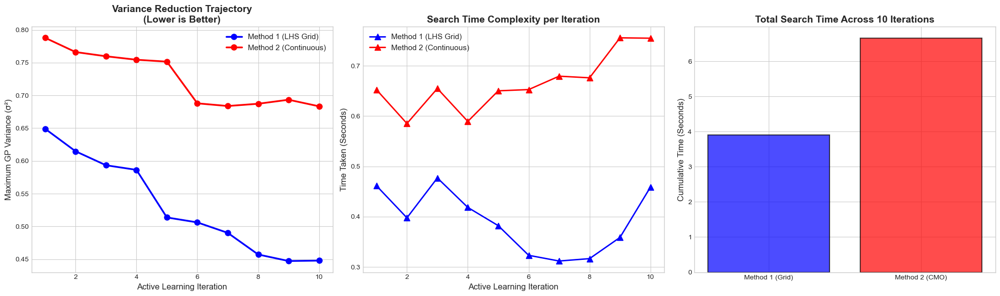

Plot saved as 'al_method_comparison_marathon.png'


In [2]:
import sys
import time
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from scipy.stats import qmc
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C

# Add your simulator path
sys.path.append(r"D:\KIT\social_force_model")
from run_batch import single_run, density_to_counts

warnings.filterwarnings("ignore")
plt.style.use('seaborn-v0_8-whitegrid')

# ======================================================================
# 1. GLOBAL CONFIGURATION
# ======================================================================
DATA_PATH = r"D:\KIT\social_force_model\cafm_qmc_new_dataset_256x10.npz"

PARAM_NAMES = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]
OUTPUT_NAMES = ['mean_crossing_time', 'flow_rate', 'order_param_mean', 'mean_speed']
TARGET_IDX = 0  # 0 = mean_crossing_time
N_ITERATIONS = 10
N_REPS = 10     # CAFM simulation repeats per active learning step

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}

lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])
bounds = list(zip(lowers, uppers))

# ======================================================================
# 2. CORE FUNCTIONS
# ======================================================================
def load_initial_data(data_path, target_idx=0):
    data = np.load(data_path)
    X = data["X"]
    y = data["Y"][:, target_idx]
    y_std = data["Y_std"][:, target_idx]

    valid_mask = ~np.isnan(y)
    return X[valid_mask], y[valid_mask], y_std[valid_mask]

def train_surrogate(X, y, y_std, n_restarts=5):
    scaler_X = StandardScaler()
    X_scaled = scaler_X.fit_transform(X)

    scaler_y = StandardScaler()
    y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

    y_var_scaled = (y_std / scaler_y.scale_[0]) ** 2
    alpha_scaled = np.clip(y_var_scaled, 1e-6, None)

    init_lengthscales = [0.5, 0.5, 1.0, 0.5, 0.3, 0.5]
    ls_bounds = [(1e-3, 15)] * 6
    kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=init_lengthscales, length_scale_bounds=ls_bounds, nu=2.5)

    gp = GaussianProcessRegressor(
        kernel=kernel, alpha=alpha_scaled, 
        n_restarts_optimizer=n_restarts, random_state=42
    )
    gp.fit(X_scaled, y_scaled)
    return gp, scaler_X, scaler_y

# Method 1: Discrete LHS Grid
def method1_lhs_grid(gp, scaler_X, scaler_y, n_candidates=30000):
    start_time = time.time()
    sampler = qmc.LatinHypercube(d=6, seed=42)
    cand_raw = qmc.scale(sampler.random(n_candidates), lowers, uppers)
    
    _, std_scaled = gp.predict(scaler_X.transform(cand_raw), return_std=True)
    var_real = (std_scaled * scaler_y.scale_[0]) ** 2
    
    worst_idx = int(np.argmax(var_real))
    end_time = time.time()
    return cand_raw[worst_idx], float(var_real[worst_idx]), end_time - start_time

# Method 2: Continuous L-BFGS-B
def objective_neg_variance(x_raw_1d, gp, scaler_X, scaler_y):
    x_scaled = scaler_X.transform(x_raw_1d.reshape(1, -1))
    _, std_scaled = gp.predict(x_scaled, return_std=True)
    return -float((std_scaled[0] * scaler_y.scale_[0]) ** 2)

def method2_continuous_optimization(gp, scaler_X, scaler_y, n_starts=20):
    start_time = time.time()
    sampler = qmc.LatinHypercube(d=6, seed=99)
    initial_guesses = qmc.scale(sampler.random(n_starts), lowers, uppers)
    
    absolute_best_x, absolute_best_var = None, -np.inf
    
    for x0 in initial_guesses:
        res = minimize(
            fun=objective_neg_variance, x0=x0, args=(gp, scaler_X, scaler_y),
            bounds=bounds, method='L-BFGS-B', options={'disp': False, 'ftol': 1e-6}
        )
        if -res.fun > absolute_best_var:
            absolute_best_var = -res.fun
            absolute_best_x = res.x
            
    end_time = time.time()
    return absolute_best_x, absolute_best_var, end_time - start_time

# CAFM Simulator Runner
def run_cafm_reps(x_raw, base_seed=1000):
    param_dict = {name: float(x_raw[i]) for i, name in enumerate(PARAM_NAMES)}
    results_list = []
    
    for rep in range(N_REPS):
        try:
            out = single_run(param_dict, base_seed + rep)
            results_list.append(out[TARGET_IDX])
        except Exception:
            results_list.append(np.nan)
            
    res_arr = np.array(results_list, dtype=float)
    return float(np.nanmean(res_arr)), float(np.nanstd(res_arr))

# ======================================================================
# 3. THE ACTIVE LEARNING MARATHON (AL LOOP)
# ======================================================================
def run_al_trajectory(method_name, X_init, y_init, y_std_init):
    print(f"\n{'-'*60}\n🚀 STARTING AL TRAJECTORY: {method_name}\n{'-'*60}")
    
    X_curr, y_curr, y_std_curr = X_init.copy(), y_init.copy(), y_std_init.copy()
    
    tracker = {"variance": [], "time": [], "coords": []}
    
    for i in range(N_ITERATIONS):
        # 1. Train GP
        gp, sc_X, sc_y = train_surrogate(X_curr, y_curr, y_std_curr, n_restarts=3)
        
        # 2. Find worst spot
        if method_name == "Method 1 (LHS Grid)":
            x_worst, var_worst, t_taken = method1_lhs_grid(gp, sc_X, sc_y)
        else:
            x_worst, var_worst, t_taken = method2_continuous_optimization(gp, sc_X, sc_y)
            
        tracker["variance"].append(var_worst)
        tracker["time"].append(t_taken)
        tracker["coords"].append(x_worst)
        
        print(f"Iter {i+1}/{N_ITERATIONS} | Max Var: {var_worst:.5f} | Search Time: {t_taken:.3f}s")
        
        # 3. Simulate and Append
        y_new, y_std_new = run_cafm_reps(x_worst, base_seed=2000 + i*10)
        X_curr = np.vstack([X_curr, x_worst])
        y_curr = np.append(y_curr, y_new)
        y_std_curr = np.append(y_std_curr, y_std_new)
        
    return tracker

# ======================================================================
# 4. EXECUTION AND PLOTTING
# ======================================================================
if __name__ == "__main__":
    X_init, y_init, y_std_init = load_initial_data(DATA_PATH)
    
    # Run the race!
    tracker_m1 = run_al_trajectory("Method 1 (LHS Grid)", X_init, y_init, y_std_init)
    tracker_m2 = run_al_trajectory("Method 2 (Continuous CMO)", X_init, y_init, y_std_init)
    
    print("\n" + "=" * 70)
    print("🎉 BENCHMARK COMPLETE! GENERATING PLOTS... 🎉")
    print("=" * 70)

    # PLOTTING
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    iters = np.arange(1, N_ITERATIONS + 1)
    
    # Plot 1: Variance Reduction Trajectory
    axes[0].plot(iters, tracker_m1["variance"], 'bo-', lw=2.5, markersize=8, label="Method 1 (LHS Grid)")
    axes[0].plot(iters, tracker_m2["variance"], 'ro-', lw=2.5, markersize=8, label="Method 2 (Continuous)")
    axes[0].set_title("Variance Reduction Trajectory\n(Lower is Better)", fontweight='bold', fontsize=14)
    axes[0].set_xlabel("Active Learning Iteration", fontsize=12)
    axes[0].set_ylabel("Maximum GP Variance (σ²)", fontsize=12)
    axes[0].legend(fontsize=11)
    
    # Plot 2: Computation Time per Iteration
    axes[1].plot(iters, tracker_m1["time"], 'b^-', lw=2, markersize=8, label="Method 1 (LHS Grid)")
    axes[1].plot(iters, tracker_m2["time"], 'r^-', lw=2, markersize=8, label="Method 2 (Continuous)")
    axes[1].set_title("Search Time Complexity per Iteration", fontweight='bold', fontsize=14)
    axes[1].set_xlabel("Active Learning Iteration", fontsize=12)
    axes[1].set_ylabel("Time Taken (Seconds)", fontsize=12)
    axes[1].legend(fontsize=11)
    
    # Plot 3: Cumulative Time
    axes[2].bar(["Method 1 (Grid)", "Method 2 (CMO)"], 
                [sum(tracker_m1["time"]), sum(tracker_m2["time"])], 
                color=['blue', 'red'], alpha=0.7, edgecolor='k', linewidth=1.5)
    axes[2].set_title("Total Search Time Across 10 Iterations", fontweight='bold', fontsize=14)
    axes[2].set_ylabel("Cumulative Time (Seconds)", fontsize=12)
    
    plt.tight_layout()
    plt.savefig("al_method_comparison_marathon.png", dpi=300)
    plt.show()
    print("Plot saved as 'al_method_comparison_marathon.png'")

## Comparison of all 3 methods for 10 iterations


--------------------------------------------------------------------------------
🚀 STARTING AL TRAJECTORY: M1: LHS Grid (30k)
--------------------------------------------------------------------------------
Iter 1/10 | Max Var: 0.64902 | Search Time: 0.487s
Iter 2/10 | Max Var: 0.61470 | Search Time: 0.666s
Iter 3/10 | Max Var: 0.59337 | Search Time: 0.596s
Iter 4/10 | Max Var: 0.58636 | Search Time: 0.519s
Iter 5/10 | Max Var: 0.51373 | Search Time: 0.556s
Iter 6/10 | Max Var: 0.50620 | Search Time: 0.579s
Iter 7/10 | Max Var: 0.49024 | Search Time: 0.549s
Iter 8/10 | Max Var: 0.45720 | Search Time: 0.417s
Iter 9/10 | Max Var: 0.44726 | Search Time: 0.438s
Iter 10/10 | Max Var: 0.44786 | Search Time: 0.457s

--------------------------------------------------------------------------------
🚀 STARTING AL TRAJECTORY: M2: Pure Continuous
--------------------------------------------------------------------------------
Iter 1/10 | Max Var: 0.78785 | Search Time: 0.852s
Iter 2/10 | Max Var: 

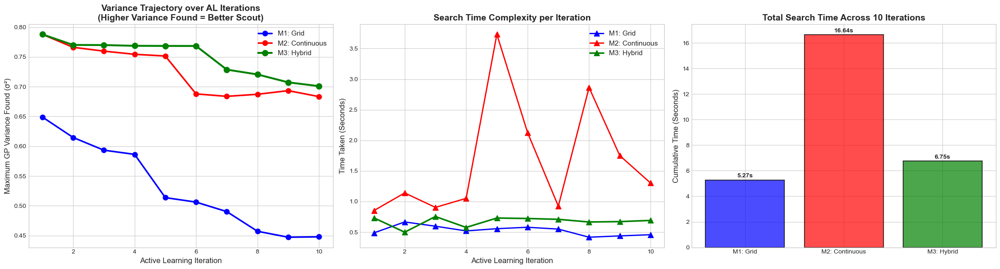

Plot saved as 'ultimate_3way_al_comparison.png'


In [ ]:
import sys
import time
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from scipy.stats import qmc
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C

# Add your simulator path
sys.path.append(r"D:\KIT\social_force_model")
from run_batch import single_run, density_to_counts

warnings.filterwarnings("ignore")
plt.style.use('seaborn-v0_8-whitegrid')

# ======================================================================
# 1. GLOBAL CONFIGURATION
# ======================================================================
DATA_PATH = r"D:\KIT\social_force_model\cafm_qmc_new_dataset_256x10.npz"

PARAM_NAMES = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]
OUTPUT_NAMES = ['mean_crossing_time', 'flow_rate', 'order_param_mean', 'mean_speed']
TARGET_IDX = 0  # 0 = mean_crossing_time
N_ITERATIONS = 10
N_REPS = 10     # CAFM simulation repeats per active learning step

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}

lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])
bounds = list(zip(lowers, uppers))

# ======================================================================
# 2. CORE FUNCTIONS
# ======================================================================
def load_initial_data(data_path, target_idx=0):
    data = np.load(data_path)
    X = data["X"]
    y = data["Y"][:, target_idx]
    y_std = data["Y_std"][:, target_idx]

    valid_mask = ~np.isnan(y)
    return X[valid_mask], y[valid_mask], y_std[valid_mask]

def train_surrogate(X, y, y_std, n_restarts=3):
    scaler_X = StandardScaler()
    X_scaled = scaler_X.fit_transform(X)

    scaler_y = StandardScaler()
    y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

    y_var_scaled = (y_std / scaler_y.scale_[0]) ** 2
    alpha_scaled = np.clip(y_var_scaled, 1e-6, None)

    init_lengthscales = [0.5, 0.5, 1.0, 0.5, 0.3, 0.5]
    ls_bounds = [(1e-3, 15)] * 6
    kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=init_lengthscales, length_scale_bounds=ls_bounds, nu=2.5)

    gp = GaussianProcessRegressor(
        kernel=kernel, alpha=alpha_scaled, 
        n_restarts_optimizer=n_restarts, random_state=42
    )
    gp.fit(X_scaled, y_scaled)
    return {"model": gp, "scaler_X": scaler_X, "scaler_y": scaler_y}

def objective_neg_variance(x_raw_1d, gp, scaler_X, scaler_y):
    x_scaled = scaler_X.transform(x_raw_1d.reshape(1, -1))
    _, std_scaled = gp.predict(x_scaled, return_std=True)
    return -float((std_scaled[0] * scaler_y.scale_[0]) ** 2)

# --------- METHOD 1: DISCRETE LHS GRID ---------
def method1_lhs_grid(results, n_candidates=30000):
    gp, sc_X, sc_y = results["model"], results["scaler_X"], results["scaler_y"]
    start_time = time.time()
    
    cand_raw = qmc.scale(qmc.LatinHypercube(d=6, seed=42).random(n_candidates), lowers, uppers)
    _, std_scaled = gp.predict(sc_X.transform(cand_raw), return_std=True)
    var_real = (std_scaled * sc_y.scale_[0]) ** 2
    
    worst_idx = int(np.argmax(var_real))
    return cand_raw[worst_idx], float(var_real[worst_idx]), time.time() - start_time

# --------- METHOD 2: PURE CONTINUOUS ---------
def method2_continuous(results, n_starts=20):
    gp, sc_X, sc_y = results["model"], results["scaler_X"], results["scaler_y"]
    start_time = time.time()
    
    initial_guesses = qmc.scale(qmc.LatinHypercube(d=6, seed=99).random(n_starts), lowers, uppers)
    best_x, best_var = None, -np.inf
    
    for x0 in initial_guesses:
        res = minimize(objective_neg_variance, x0=x0, args=(gp, sc_X, sc_y), bounds=bounds, method='L-BFGS-B', options={'disp': False})
        if -res.fun > best_var:
            best_var = -res.fun
            best_x = res.x
            
    return best_x, best_var, time.time() - start_time

# --------- METHOD 3: HYBRID (Grid + Top K Climbers) ---------
def method3_hybrid(results, n_grid=10000, top_k=10):
    gp, sc_X, sc_y = results["model"], results["scaler_X"], results["scaler_y"]
    start_time = time.time()
    
    cand_raw = qmc.scale(qmc.LatinHypercube(d=6, seed=77).random(n_grid), lowers, uppers)
    _, std_scaled = gp.predict(sc_X.transform(cand_raw), return_std=True)
    var_real = (std_scaled * sc_y.scale_[0]) ** 2
    
    top_indices = np.argsort(var_real)[::-1][:top_k]
    best_guesses = cand_raw[top_indices]
    
    best_x, best_var = None, -np.inf
    
    for x0 in best_guesses:
        res = minimize(objective_neg_variance, x0=x0, args=(gp, sc_X, sc_y), bounds=bounds, method='L-BFGS-B', options={'disp': False})
        if -res.fun > best_var:
            best_var = -res.fun
            best_x = res.x
            
    return best_x, best_var, time.time() - start_time

# --------- CAFM SIMULATOR RUNNER ---------
def run_cafm_reps(x_raw, base_seed=1000):
    param_dict = {name: float(x_raw[i]) for i, name in enumerate(PARAM_NAMES)}
    results_list = []
    for rep in range(N_REPS):
        try:
            out = single_run(param_dict, base_seed + rep)
            results_list.append(out[TARGET_IDX])
        except Exception:
            results_list.append(np.nan)
    res_arr = np.array(results_list, dtype=float)
    return float(np.nanmean(res_arr)), float(np.nanstd(res_arr))

# ======================================================================
# 3. THE 3-WAY ACTIVE LEARNING MARATHON LOOP
# ======================================================================
def run_al_trajectory(method_name, X_init, y_init, y_std_init):
    print(f"\n{'-'*80}\n🚀 STARTING AL TRAJECTORY: {method_name}\n{'-'*80}")
    X_curr, y_curr, y_std_curr = X_init.copy(), y_init.copy(), y_std_init.copy()
    tracker = {"variance": [], "time": [], "coords": []}
    
    for i in range(N_ITERATIONS):
        # 1. Train GP
        res_dict = train_surrogate(X_curr, y_curr, y_std_curr, n_restarts=3)
        
        # 2. Find worst spot using chosen method
        if "M1" in method_name:
            x_worst, var_worst, t_taken = method1_lhs_grid(res_dict)
        elif "M2" in method_name:
            x_worst, var_worst, t_taken = method2_continuous(res_dict)
        else:
            x_worst, var_worst, t_taken = method3_hybrid(res_dict)
            
        tracker["variance"].append(var_worst)
        tracker["time"].append(t_taken)
        tracker["coords"].append(x_worst)
        
        print(f"Iter {i+1}/{N_ITERATIONS} | Max Var: {var_worst:.5f} | Search Time: {t_taken:.3f}s")
        
        # 3. Simulate and Append
        y_new, y_std_new = run_cafm_reps(x_worst, base_seed=2000 + i*10)
        X_curr = np.vstack([X_curr, x_worst])
        y_curr = np.append(y_curr, y_new)
        y_std_curr = np.append(y_std_curr, y_std_new)
        
    return tracker

# ======================================================================
# 4. EXECUTION AND PLOTTING
# ======================================================================
if __name__ == "__main__":
    X_init, y_init, y_std_init = load_initial_data(DATA_PATH)
    
    # Run the 3-Way Race!
    tracker_m1 = run_al_trajectory("M1: LHS Grid (30k)", X_init, y_init, y_std_init)
    tracker_m2 = run_al_trajectory("M2: Pure Continuous", X_init, y_init, y_std_init)
    tracker_m3 = run_al_trajectory("M3: Hybrid (10k Grid + Top 10 CMO)", X_init, y_init, y_std_init)
    
    print("\n" + "=" * 80)
    print(" 3-WAY BENCHMARK COMPLETE! GENERATING PLOTS... ")
    print("=" * 80)

    # PLOTTING
    fig, axes = plt.subplots(1, 3, figsize=(22, 6))
    iters = np.arange(1, N_ITERATIONS + 1)
    
    # Plot 1: Variance Reduction Trajectory
    axes[0].plot(iters, tracker_m1["variance"], 'bo-', lw=2.5, markersize=8, label="M1: Grid")
    axes[0].plot(iters, tracker_m2["variance"], 'ro-', lw=2.5, markersize=8, label="M2: Continuous")
    axes[0].plot(iters, tracker_m3["variance"], 'go-', lw=3.0, markersize=9, label="M3: Hybrid")
    axes[0].set_title("Variance Trajectory over AL Iterations\n(Higher Variance Found = Better Scout)", fontweight='bold', fontsize=14)
    axes[0].set_xlabel("Active Learning Iteration", fontsize=12)
    axes[0].set_ylabel("Maximum GP Variance Found (σ²)", fontsize=12)
    axes[0].legend(fontsize=11)
    
    # Plot 2: Computation Time per Iteration
    axes[1].plot(iters, tracker_m1["time"], 'b^-', lw=2, markersize=8, label="M1: Grid")
    axes[1].plot(iters, tracker_m2["time"], 'r^-', lw=2, markersize=8, label="M2: Continuous")
    axes[1].plot(iters, tracker_m3["time"], 'g^-', lw=2.5, markersize=9, label="M3: Hybrid")
    axes[1].set_title("Search Time Complexity per Iteration", fontweight='bold', fontsize=14)
    axes[1].set_xlabel("Active Learning Iteration", fontsize=12)
    axes[1].set_ylabel("Time Taken (Seconds)", fontsize=12)
    axes[1].legend(fontsize=11)
    
    # Plot 3: Cumulative Time
    bars = axes[2].bar(["M1: Grid", "M2: Continuous", "M3: Hybrid"], 
                [sum(tracker_m1["time"]), sum(tracker_m2["time"]), sum(tracker_m3["time"])], 
                color=['blue', 'red', 'green'], alpha=0.7, edgecolor='k', linewidth=1.5)
    axes[2].set_title("Total Search Time Across 10 Iterations", fontweight='bold', fontsize=14)
    axes[2].set_ylabel("Cumulative Time (Seconds)", fontsize=12)
    
    # Add text on top of bars
    for bar in bars:
        yval = bar.get_height()
        axes[2].text(bar.get_x() + bar.get_width()/2, yval + 0.1, f'{yval:.2f}s', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.savefig("ultimate_3way_al_comparison.png", dpi=300)
    plt.show()
    print("Plot saved as 'ultimate_3way_al_comparison.png'")

## updated code with top 30 with boundry analysis

In [1]:
import sys
import time
import warnings
import numpy as np
from scipy.optimize import minimize
from scipy.stats import qmc
from scipy.spatial.distance import cdist
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C

# Add your simulator path
sys.path.append(r"D:\KIT\social_force_model")
from run_batch import single_run

warnings.filterwarnings("ignore")

# ======================================================================
# 1. GLOBAL CONFIGURATION
# ======================================================================
DATA_PATH = r"D:\KIT\social_force_model\cafm_qmc_new_dataset_256x10.npz"

PARAM_NAMES = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]
TARGET_IDX = 0  # 0 = mean_crossing_time
N_ITERATIONS = 5
N_REPS = 10     
BASE_MIN_DISTANCE = 0.15 # Baseline 15% separation
TOLERANCE = 1e-3         # Gradient descent tolerance

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}

lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])
bounds = list(zip(lowers, uppers))

# ======================================================================
# 2. CORE FUNCTIONS
# ======================================================================
def load_initial_data(data_path, target_idx=0):
    data = np.load(data_path)
    X, y, y_std = data["X"], data["Y"][:, target_idx], data["Y_std"][:, target_idx]
    valid = ~np.isnan(y)
    return X[valid], y[valid], y_std[valid]

def train_surrogate(X, y, y_std, n_restarts=3):
    scaler_X, scaler_y = StandardScaler(), StandardScaler()
    X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

    y_var_scaled = (y_std / scaler_y.scale_[0]) ** 2
    alpha_scaled = np.clip(y_var_scaled, 1e-6, None)

    kernel = C(1.0, (1e-3, 1e3)) * Matern(length_scale=[0.5]*6, length_scale_bounds=[(1e-3, 15)]*6, nu=2.5)
    gp = GaussianProcessRegressor(kernel=kernel, alpha=alpha_scaled, n_restarts_optimizer=n_restarts, random_state=42)
    gp.fit(X_scaled, y_scaled)
    return {"model": gp, "scaler_X": scaler_X, "scaler_y": scaler_y}

def objective_neg_variance(x_raw_1d, gp, scaler_X, scaler_y):
    x_scaled = scaler_X.transform(x_raw_1d.reshape(1, -1))
    _, std_scaled = gp.predict(x_scaled, return_std=True)
    return -float((std_scaled[0] * scaler_y.scale_[0]) ** 2)

def dynamic_peak_filtering(found_x, found_var, base_dist=BASE_MIN_DISTANCE):
    """
    Returns a DYNAMIC number of points. 
    Distance threshold shrinks for points with exceptionally high variance.
    """
    x_norm = (found_x - lowers) / (uppers - lowers)
    sorted_indices = np.argsort(found_var)[::-1]
    
    max_var = found_var[sorted_indices[0]]
    
    selected_x = []
    selected_norm = []
    
    for idx in sorted_indices:
        candidate_x = found_x[idx]
        candidate_norm = x_norm[idx].reshape(1, -1)
        candidate_var = found_var[idx]
        
        # Dynamic distance: Shrinks up to 50% if the variance is extremely close to the global max.
        dynamic_req_dist = base_dist * (1.0 - 0.5 * (candidate_var / max_var))
        
        if len(selected_x) == 0:
            selected_x.append(candidate_x)
            selected_norm.append(candidate_norm[0])
        else:
            dists = cdist(candidate_norm, np.array(selected_norm), metric='euclidean')[0]
            if np.min(dists) >= dynamic_req_dist:
                selected_x.append(candidate_x)
                selected_norm.append(candidate_norm[0])
                
    # Returns however many distinct peaks it found (dynamic array size)
    return np.array(selected_x)

# --------- METHOD 2: PURE CONTINUOUS (Traversing the 6D Space) ---------
def method2_continuous(results, n_starts=100):
    gp, sc_X, sc_y = results["model"], results["scaler_X"], results["scaler_y"]
    t0 = time.time()
    
    # 100 random drops to traverse the 6D space without a prior grid
    initial_guesses = qmc.scale(qmc.LatinHypercube(d=6, seed=99).random(n_starts), lowers, uppers)
    found_x, found_var = [], []
    
    for x0 in initial_guesses:
        res = minimize(objective_neg_variance, x0=x0, args=(gp, sc_X, sc_y), bounds=bounds, method='L-BFGS-B', tol=TOLERANCE, options={'disp': False})
        found_x.append(res.x)
        found_var.append(-res.fun)
        
    found_x, found_var = np.array(found_x), np.array(found_var)
    final_batch = dynamic_peak_filtering(found_x, found_var, BASE_MIN_DISTANCE)
    
    return final_batch, time.time() - t0

# --------- METHOD 3: HYBRID (Grid + Optimization) ---------
def method3_hybrid(results, n_grid=20000, top_k=100):
    gp, sc_X, sc_y = results["model"], results["scaler_X"], results["scaler_y"]
    t0 = time.time()
    
    cand_raw = qmc.scale(qmc.LatinHypercube(d=6, seed=77).random(n_grid), lowers, uppers)
    _, std_scaled = gp.predict(sc_X.transform(cand_raw), return_std=True)
    var_real = (std_scaled * sc_y.scale_[0]) ** 2
    
    # Pre-filter: Only run calculus on the top 100 regions of the grid
    grid_top_indices = np.argsort(var_real)[::-1][:top_k]
    best_guesses = cand_raw[grid_top_indices]
    
    found_x, found_var = [], []
    for x0 in best_guesses:
        res = minimize(objective_neg_variance, x0=x0, args=(gp, sc_X, sc_y), bounds=bounds, method='L-BFGS-B', tol=TOLERANCE, options={'disp': False})
        found_x.append(res.x)
        found_var.append(-res.fun)
        
    found_x, found_var = np.array(found_x), np.array(found_var)
    final_batch = dynamic_peak_filtering(found_x, found_var, BASE_MIN_DISTANCE)
    
    return final_batch, time.time() - t0

# ======================================================================
# 3. ANALYSIS AND SIMULATION RUNNER
# ======================================================================
def analyze_boundaries(x_batch):
    if len(x_batch) == 0:
        return 0, 0
    x_norm = (x_batch - lowers) / (uppers - lowers)
    dist_to_bounds = np.minimum(x_norm, 1 - x_norm)
    min_dists = np.min(dist_to_bounds, axis=1)
    boundary_count = np.sum(min_dists < 0.01) 
    return boundary_count, np.mean(min_dists)

def simulate_batch(x_batch, base_seed=1000):
    t0 = time.time()
    y_batch, y_std_batch = [], []
    
    for i, x_raw in enumerate(x_batch):
        param_dict = {name: float(x_raw[j]) for j, name in enumerate(PARAM_NAMES)}
        res_list = []
        for rep in range(N_REPS):
            try:
                res_list.append(single_run(param_dict, base_seed + rep)[TARGET_IDX])
            except Exception:
                res_list.append(np.nan)
        y_batch.append(np.nanmean(res_list))
        y_std_batch.append(np.nanstd(res_list))
        
    return np.array(y_batch), np.array(y_std_batch), time.time() - t0

def run_al_trajectory(method_name, X_init, y_init, y_std_init):
    print(f"\n{'-'*80}\n AL BATCH TRAJECTORY: {method_name} | TOL={TOLERANCE}\n{'-'*80}")
    X_curr, y_curr, y_std_curr = X_init.copy(), y_init.copy(), y_std_init.copy()
    
    for i in range(N_ITERATIONS):
        res_dict = train_surrogate(X_curr, y_curr, y_std_curr, n_restarts=3)
        
        if "M2" in method_name:
            x_batch, search_time = method2_continuous(res_dict)
        else:
            x_batch, search_time = method3_hybrid(res_dict)
            
        boundary_pts, avg_dist = analyze_boundaries(x_batch)
        
        print(f"Iter {i+1} | Search Time: {search_time:.2f}s | Dynamic Batch Size: {len(x_batch)}")
        print(f"       -> Boundary Points: {boundary_pts}/{len(x_batch)} are on extreme edge.")
        
        if len(x_batch) > 0:
            y_new, y_std_new, sim_time = simulate_batch(x_batch, base_seed=2000 + i*100)
            print(f"       -> Simulation Time for {len(x_batch)} pts: {sim_time:.2f}s")
            
            X_curr = np.vstack([X_curr, x_batch])
            y_curr = np.append(y_curr, y_new)
            y_std_curr = np.append(y_std_curr, y_std_new)
        
    return X_curr

if __name__ == "__main__":
    X_init, y_init, y_std_init = load_initial_data(DATA_PATH)
    run_al_trajectory("M2: Pure Continuous (Dynamic)", X_init, y_init, y_std_init)
    run_al_trajectory("M3: Hybrid (Dynamic)", X_init, y_init, y_std_init)


--------------------------------------------------------------------------------
 AL BATCH TRAJECTORY: M2: Pure Continuous (Dynamic) | TOL=0.001
--------------------------------------------------------------------------------
Iter 1 | Search Time: 3.73s | Dynamic Batch Size: 48
       -> Boundary Points: 48/48 are on extreme edge.
       -> Simulation Time for 48 pts: 2539.80s
Iter 2 | Search Time: 5.18s | Dynamic Batch Size: 49
       -> Boundary Points: 49/49 are on extreme edge.
       -> Simulation Time for 49 pts: 2585.95s
Iter 3 | Search Time: 6.39s | Dynamic Batch Size: 50
       -> Boundary Points: 50/50 are on extreme edge.
       -> Simulation Time for 50 pts: 2498.93s
Iter 4 | Search Time: 4.40s | Dynamic Batch Size: 54
       -> Boundary Points: 54/54 are on extreme edge.
       -> Simulation Time for 54 pts: 2085.98s
Iter 5 | Search Time: 3.58s | Dynamic Batch Size: 53
       -> Boundary Points: 53/53 are on extreme edge.
       -> Simulation Time for 53 pts: 1865.77s

--

## Again updated method (LM)

ACTIVE LEARNING METHOD COMPARISON - OPTIMIZED HYPERPARAMETERS
Hyperparameter Settings:
  - Sampling: Sobol sequences (low-discrepancy)
  - n_starts (M2): 20
  - top_k (M3): 30
  - Noise floor: 0.01
  - Original length scales and bounds maintained

DATA SPLIT (FIXED FOR ALL METHODS)
Total valid points:  256
Training set:        205 points (80%)
Test set (fixed):    51 points (20%)
Output target:       mean_crossing_time

STARTING ACTIVE LEARNING COMPARISON
Methods: ['M1_Sobol_Grid', 'M2_MultiStart', 'M3_Hybrid']
Iterations: 5
Points per iteration: 20
Fixed test set size: 51

Hyperparameters:
  n_starts (M2): 20
  top_k (M3): 30
  noise_floor: 0.01
  sampling: Sobol sequences

ITERATION 0: INITIAL GP (Same for all methods)
Training points: 205
GP fitting time: 0.96s
Test R²:         0.9038
Test RMSE:       0.8078

ITERATION 1/5

--------------------------------------------------------------------------------
Method: M1_Sobol_Grid
----------------------------------------------------------

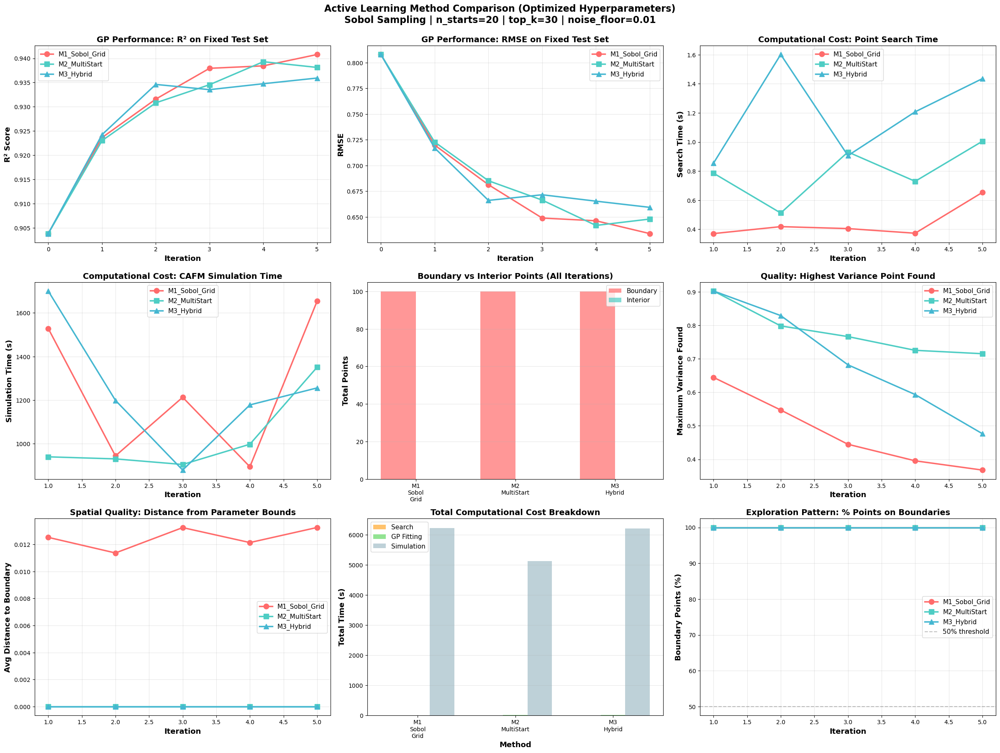


✓ Plots saved to al_method_comparison_optimized.png

FINAL COMPARISON SUMMARY

       Method  Final Data Size Final R² Final RMSE R² Improvement RMSE Improvement Total Search Time (s) Total Sim Time (s) Total Fit Time (s) Avg Search/Iter (s)  Boundary Points  Interior Points Boundary % Avg Max Variance
M1_Sobol_Grid              305   0.9408     0.6338        +0.0370          +0.1740                  2.22            6234.61               8.74                0.44              100                0     100.0%         0.479997
M2_MultiStart              305   0.9381     0.6479        +0.0343          +0.1599                  3.96            5125.08              17.16                0.79              100                0     100.0%         0.781425
    M3_Hybrid              305   0.9359     0.6593        +0.0321          +0.1485                  6.00            6213.33              13.16                1.20              100                0     100.0%         0.696607

ITERATION-BY-ITERAT

In [1]:
"""
ACTIVE LEARNING METHOD COMPARISON - HYPERPARAMETER OPTIMIZED
=============================================================

Hyperparameter Changes:
- n_starts = 20 (for all methods)
- Sobol sequences (instead of LHS)
- top_k = 30 (for M3)
- Noise floor = 1e-2 (instead of 1e-6)
- Keep original length scales and bounds

Experimental Protocol:
1. Load 256 initial points
2. Split 80-20 train-test (205 train, 51 test) - FIXED TEST SET
3. Train initial GP on 205 points
4. For each iteration (5 total):
   - Each method uses SAME GP hyperparameters
   - Each method finds 20 high-variance points
   - Run CAFM simulations for new points
   - Update method's training set
   - Retrain GP
   - Evaluate on SAME test set
5. Compare final performance

Metrics Tracked:
- GP performance: R², RMSE on fixed test set
- Search time: Time to find high-variance points
- Simulation time: Time to run CAFM
- Fitting time: Time to retrain GP
- Boundary analysis: Are points on edges or interior?
- Total data size: Cumulative training points
"""

import sys
import time
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from scipy.stats import qmc
from scipy.spatial.distance import cdist
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from sklearn.metrics import r2_score, mean_squared_error

sys.path.append(r"D:\KIT\social_force_model")
from run_batch import single_run

warnings.filterwarnings("ignore")

# ======================================================================
# GLOBAL CONFIGURATION
# ======================================================================
DATA_PATH = r"D:\KIT\social_force_model\cafm_qmc_new_dataset_256x10.npz"

PARAM_NAMES = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]
TARGET_IDX = 0  # mean_crossing_time
N_ITERATIONS = 5
N_REPS = 10
POINTS_PER_ITERATION = 20  # FIXED batch size for all methods
TOLERANCE = 1e-3

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}

lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])
bounds = list(zip(lowers, uppers))

# HYPERPARAMETERS (OPTIMIZED)
N_STARTS = 20        # Number of optimization starts
TOP_K = 30           # Number of top grid points to optimize
NOISE_FLOOR = 1e-2   # Noise variance floor

# ======================================================================
# DATA LOADING
# ======================================================================
def load_initial_data(data_path, target_idx=0, test_ratio=0.2, seed=42):
    """
    Load data and split into fixed train/test sets
    Returns: X_train, y_train, y_std_train, X_test, y_test, y_std_test
    """
    data = np.load(data_path)
    X = data["X"]
    y = data["Y"][:, target_idx]
    y_std = data["Y_std"][:, target_idx]
    
    # Remove invalid data
    valid = ~np.isnan(y)
    X, y, y_std = X[valid], y[valid], y_std[valid]
    
    # Fixed train/test split
    np.random.seed(seed)
    n_total = len(X)
    n_test = int(n_total * test_ratio)
    test_indices = np.random.choice(n_total, n_test, replace=False)
    train_indices = np.setdiff1d(np.arange(n_total), test_indices)
    
    X_train = X[train_indices]
    y_train = y[train_indices]
    y_std_train = y_std[train_indices]
    
    X_test = X[test_indices]
    y_test = y[test_indices]
    y_std_test = y_std[test_indices]
    
    print(f"\n{'='*80}")
    print(f"DATA SPLIT (FIXED FOR ALL METHODS)")
    print(f"{'='*80}")
    print(f"Total valid points:  {n_total}")
    print(f"Training set:        {len(X_train)} points (80%)")
    print(f"Test set (fixed):    {len(X_test)} points (20%)")
    print(f"Output target:       mean_crossing_time")
    
    return X_train, y_train, y_std_train, X_test, y_test, y_std_test

# ======================================================================
# GP TRAINING & EVALUATION
# ======================================================================
def train_surrogate(X, y, y_std, n_restarts=5):
    """
    Train GP with optimized hyperparameters
    
    Key changes:
    - Noise floor: 1e-2 (was 1e-6)
    - Keep original length scales and bounds
    """
    t0 = time.time()
    
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()
    X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()
    
    # OPTIMIZED: Higher noise floor for better regularization
    y_var_scaled = (y_std / scaler_y.scale_[0]) ** 2
    alpha_scaled = np.clip(y_var_scaled, NOISE_FLOOR, None)  # Was 1e-6
    
    # Original length scales (as requested - keep same)
    init_lengthscales = [0.5, 0.5, 1.0, 0.5, 0.3, 0.5]
    ls_bounds = [(1e-3, 15)] * 6  # Keep original bounds
    
    kernel = C(1.0, (1e-3, 1e3)) * Matern(
        length_scale=init_lengthscales,
        length_scale_bounds=ls_bounds,
        nu=2.5
    )
    
    gp = GaussianProcessRegressor(
        kernel=kernel,
        alpha=alpha_scaled,
        n_restarts_optimizer=n_restarts,
        random_state=42,
        normalize_y=False
    )
    gp.fit(X_scaled, y_scaled)
    
    fitting_time = time.time() - t0
    
    return {
        "model": gp,
        "scaler_X": scaler_X,
        "scaler_y": scaler_y,
        "fitting_time": fitting_time
    }

def evaluate_gp(gp_dict, X_test, y_test):
    """
    Evaluate GP on fixed test set
    Returns: R², RMSE, predictions
    """
    gp = gp_dict["model"]
    scaler_X = gp_dict["scaler_X"]
    scaler_y = gp_dict["scaler_y"]
    
    X_test_scaled = scaler_X.transform(X_test)
    y_pred_scaled, y_std_scaled = gp.predict(X_test_scaled, return_std=True)
    
    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
    y_std = y_std_scaled * scaler_y.scale_[0]
    
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    return {
        "r2": r2,
        "rmse": rmse,
        "predictions": y_pred,
        "std": y_std
    }

# ======================================================================
# OBJECTIVE FUNCTION (for optimization)
# ======================================================================
def objective_neg_variance(x_raw_1d, gp, scaler_X, scaler_y):
    """
    Negative variance for minimization
    """
    x_scaled = scaler_X.transform(x_raw_1d.reshape(1, -1))
    _, std_scaled = gp.predict(x_scaled, return_std=True)
    return -float((std_scaled[0] * scaler_y.scale_[0]) ** 2)

# ======================================================================
# BOUNDARY ANALYSIS
# ======================================================================
def analyze_boundaries(x_batch, threshold=0.05):
    """
    Analyze if points are on boundary or interior
    
    Boundary definition: Any coordinate within threshold (5%) of bounds
    Returns: boundary_count, interior_count, avg_min_distance_to_boundary
    """
    if len(x_batch) == 0:
        return 0, 0, 0.0
    
    x_norm = (x_batch - lowers) / (uppers - lowers)  # Normalize to [0,1]
    dist_to_bounds = np.minimum(x_norm, 1 - x_norm)  # Distance to nearest boundary
    min_dists = np.min(dist_to_bounds, axis=1)  # Min distance per point
    
    boundary_count = np.sum(min_dists < threshold)
    interior_count = len(x_batch) - boundary_count
    avg_min_dist = np.mean(min_dists)
    
    return boundary_count, interior_count, avg_min_dist

# ======================================================================
# SIMULATION
# ======================================================================
def simulate_batch(x_batch, base_seed=1000):
    """
    Run CAFM simulations for batch of points
    """
    t0 = time.time()
    y_batch, y_std_batch = [], []
    
    for i, x_raw in enumerate(x_batch):
        param_dict = {name: float(x_raw[j]) for j, name in enumerate(PARAM_NAMES)}
        res_list = []
        for rep in range(N_REPS):
            try:
                res_list.append(single_run(param_dict, base_seed + i*100 + rep)[TARGET_IDX])
            except Exception as e:
                res_list.append(np.nan)
        y_batch.append(np.nanmean(res_list))
        y_std_batch.append(np.nanstd(res_list))
    
    sim_time = time.time() - t0
    
    return np.array(y_batch), np.array(y_std_batch), sim_time

# ======================================================================
# METHOD 1: SOBOL GRID
# ======================================================================
def method1_sobol_grid(gp_dict, n_candidates=30000, n_select=POINTS_PER_ITERATION):
    """
    M1: SOBOL GRID SEARCH
    
    Changes from original:
    - Uses Sobol sequence (was LHS)
    - Returns top-20 points (was top-1)
    
    Mathematical Foundation:
    -----------------------
    Sobol sequence has star-discrepancy:
    D*_N ≤ C_d (log N)^d / N
    
    For d=6, N=30k: D* ≈ 0.0012 (excellent coverage)
    """
    t0 = time.time()
    
    gp = gp_dict["model"]
    scaler_X = gp_dict["scaler_X"]
    scaler_y = gp_dict["scaler_y"]
    
    # CHANGED: Sobol instead of LHS
    sampler = qmc.Sobol(d=6, scramble=True, seed=42)
    cand_raw = qmc.scale(sampler.random(n_candidates), lowers, uppers)
    
    # Evaluate variance
    cand_scaled = scaler_X.transform(cand_raw)
    _, std_scaled = gp.predict(cand_scaled, return_std=True)
    var_real = (std_scaled * scaler_y.scale_[0]) ** 2
    
    # Select top-K
    top_indices = np.argsort(var_real)[::-1][:n_select]
    selected_x = cand_raw[top_indices]
    
    search_time = time.time() - t0
    
    return selected_x, search_time

# ======================================================================
# METHOD 2: MULTI-START LOCAL OPTIMIZATION
# ======================================================================
def method2_multistart_local(gp_dict, n_starts=N_STARTS, n_select=POINTS_PER_ITERATION):
    """
    M2: MULTI-START LOCAL OPTIMIZATION
    
    Changes from original:
    - Uses Sobol for starting points (was LHS)
    - n_starts = 20 (configurable)
    - Returns top-20 unique optima (was top-1)
    """
    t0 = time.time()
    
    gp = gp_dict["model"]
    scaler_X = gp_dict["scaler_X"]
    scaler_y = gp_dict["scaler_y"]
    
    # CHANGED: Sobol starting points
    sampler = qmc.Sobol(d=6, scramble=True, seed=99)
    initial_guesses = qmc.scale(sampler.random(n_starts), lowers, uppers)
    
    found_x, found_var = [], []
    
    for x0 in initial_guesses:
        res = minimize(
            objective_neg_variance,
            x0=x0,
            args=(gp, scaler_X, scaler_y),
            bounds=bounds,
            method='L-BFGS-B',
            tol=TOLERANCE,
            options={'maxiter': 100, 'disp': False}
        )
        if res.success:
            found_x.append(res.x)
            found_var.append(-res.fun)
    
    found_x = np.array(found_x)
    found_var = np.array(found_var)
    
    # Select top-K unique points
    if len(found_x) > n_select:
        top_indices = np.argsort(found_var)[::-1][:n_select]
        selected_x = found_x[top_indices]
    else:
        selected_x = found_x
    
    search_time = time.time() - t0
    
    return selected_x, search_time

# ======================================================================
# METHOD 3: HYBRID (GRID + OPTIMIZATION)
# ======================================================================
def method3_hybrid(gp_dict, n_grid=10000, top_k=TOP_K, n_select=POINTS_PER_ITERATION):
    """
    M3: HYBRID GRID + OPTIMIZATION
    
    Changes from original:
    - Uses Sobol for grid (was LHS)
    - top_k = 30 (was 10)
    - Returns top-20 optimized points
    """
    t0 = time.time()
    
    gp = gp_dict["model"]
    scaler_X = gp_dict["scaler_X"]
    scaler_y = gp_dict["scaler_y"]
    
    # Stage 1: Sobol grid screening
    sampler = qmc.Sobol(d=6, scramble=True, seed=77)
    cand_raw = qmc.scale(sampler.random(n_grid), lowers, uppers)
    
    cand_scaled = scaler_X.transform(cand_raw)
    _, std_scaled = gp.predict(cand_scaled, return_std=True)
    var_real = (std_scaled * scaler_y.scale_[0]) ** 2
    
    # Top-K selection (CHANGED: 30 instead of 10)
    grid_top_indices = np.argsort(var_real)[::-1][:top_k]
    best_guesses = cand_raw[grid_top_indices]
    
    # Stage 2: Local optimization from top-K points
    found_x, found_var = [], []
    
    for x0 in best_guesses:
        res = minimize(
            objective_neg_variance,
            x0=x0,
            args=(gp, scaler_X, scaler_y),
            bounds=bounds,
            method='L-BFGS-B',
            tol=TOLERANCE,
            options={'maxiter': 100, 'disp': False}
        )
        if res.success:
            found_x.append(res.x)
            found_var.append(-res.fun)
    
    found_x = np.array(found_x)
    found_var = np.array(found_var)
    
    # Select top-K unique
    if len(found_x) > n_select:
        top_indices = np.argsort(found_var)[::-1][:n_select]
        selected_x = found_x[top_indices]
    else:
        selected_x = found_x
    
    search_time = time.time() - t0
    
    return selected_x, search_time

# ======================================================================
# MAIN EXPERIMENT RUNNER
# ======================================================================
def run_method_comparison(X_train_init, y_train_init, y_std_train_init,
                          X_test, y_test, y_std_test):
    """
    Run all 3 methods with consistent experimental protocol
    """
    
    methods = {
        'M1_Sobol_Grid': method1_sobol_grid,
        'M2_MultiStart': method2_multistart_local,
        'M3_Hybrid': method3_hybrid
    }
    
    results = {name: {
        'X_train': [X_train_init.copy()],
        'y_train': [y_train_init.copy()],
        'y_std_train': [y_std_train_init.copy()],
        'r2_history': [],
        'rmse_history': [],
        'search_time_history': [],
        'sim_time_history': [],
        'fit_time_history': [],
        'boundary_pts_history': [],
        'interior_pts_history': [],
        'avg_dist_to_boundary': [],
        'found_variance_max': [],
        'found_variance_mean': []
    } for name in methods.keys()}
    
    print(f"\n{'='*80}")
    print(f"STARTING ACTIVE LEARNING COMPARISON")
    print(f"{'='*80}")
    print(f"Methods: {list(methods.keys())}")
    print(f"Iterations: {N_ITERATIONS}")
    print(f"Points per iteration: {POINTS_PER_ITERATION}")
    print(f"Fixed test set size: {len(X_test)}")
    print(f"\nHyperparameters:")
    print(f"  n_starts (M2): {N_STARTS}")
    print(f"  top_k (M3): {TOP_K}")
    print(f"  noise_floor: {NOISE_FLOOR}")
    print(f"  sampling: Sobol sequences")
    
    # Initial GP evaluation (same for all methods)
    print(f"\n{'='*80}")
    print(f"ITERATION 0: INITIAL GP (Same for all methods)")
    print(f"{'='*80}")
    
    gp_init = train_surrogate(X_train_init, y_train_init, y_std_train_init, n_restarts=5)
    eval_init = evaluate_gp(gp_init, X_test, y_test)
    
    print(f"Training points: {len(X_train_init)}")
    print(f"GP fitting time: {gp_init['fitting_time']:.2f}s")
    print(f"Test R²:         {eval_init['r2']:.4f}")
    print(f"Test RMSE:       {eval_init['rmse']:.4f}")
    
    for name in methods.keys():
        results[name]['r2_history'].append(eval_init['r2'])
        results[name]['rmse_history'].append(eval_init['rmse'])
        results[name]['fit_time_history'].append(gp_init['fitting_time'])
    
    # Active learning iterations
    for iteration in range(1, N_ITERATIONS + 1):
        print(f"\n{'='*80}")
        print(f"ITERATION {iteration}/{N_ITERATIONS}")
        print(f"{'='*80}")
        
        for method_name, method_func in methods.items():
            print(f"\n{'-'*80}")
            print(f"Method: {method_name}")
            print(f"{'-'*80}")
            
            # Get current training data
            X_curr = results[method_name]['X_train'][-1]
            y_curr = results[method_name]['y_train'][-1]
            y_std_curr = results[method_name]['y_std_train'][-1]
            
            # Train GP
            print(f"Training GP on {len(X_curr)} points...")
            gp_dict = train_surrogate(X_curr, y_curr, y_std_curr, n_restarts=5)
            fit_time = gp_dict['fitting_time']
            print(f"  Fitting time: {fit_time:.2f}s")
            
            # Find high-variance points
            print(f"Searching for {POINTS_PER_ITERATION} high-variance points...")
            x_new, search_time = method_func(gp_dict)
            print(f"  Search time: {search_time:.2f}s")
            print(f"  Found: {len(x_new)} points")
            
            # Analyze found points
            boundary, interior, avg_dist = analyze_boundaries(x_new)
            print(f"  Boundary points: {boundary}/{len(x_new)} ({boundary/len(x_new)*100:.1f}%)")
            print(f"  Interior points: {interior}/{len(x_new)} ({interior/len(x_new)*100:.1f}%)")
            print(f"  Avg dist to boundary: {avg_dist:.4f}")
            
            # Calculate variance statistics of found points
            if len(x_new) > 0:
                x_new_scaled = gp_dict['scaler_X'].transform(x_new)
                _, std_new = gp_dict['model'].predict(x_new_scaled, return_std=True)
                var_new = (std_new * gp_dict['scaler_y'].scale_[0]) ** 2
                print(f"  Max variance: {var_new.max():.6f}")
                print(f"  Mean variance: {var_new.mean():.6f}")
                results[method_name]['found_variance_max'].append(var_new.max())
                results[method_name]['found_variance_mean'].append(var_new.mean())
            else:
                results[method_name]['found_variance_max'].append(0)
                results[method_name]['found_variance_mean'].append(0)
            
            # Simulate
            print(f"Running {N_REPS} CAFM simulations per point...")
            y_new, y_std_new, sim_time = simulate_batch(x_new, base_seed=3000 + iteration*100)
            print(f"  Simulation time: {sim_time:.2f}s ({sim_time/len(x_new):.2f}s per point)")
            print(f"  New data mean: {np.nanmean(y_new):.4f} ± {np.nanmean(y_std_new):.4f}")
            
            # Update training set
            X_new_total = np.vstack([X_curr, x_new])
            y_new_total = np.append(y_curr, y_new)
            y_std_new_total = np.append(y_std_curr, y_std_new)
            
            results[method_name]['X_train'].append(X_new_total)
            results[method_name]['y_train'].append(y_new_total)
            results[method_name]['y_std_train'].append(y_std_new_total)
            
            # Retrain and evaluate on FIXED test set
            print(f"Retraining GP on {len(X_new_total)} points...")
            gp_final = train_surrogate(X_new_total, y_new_total, y_std_new_total, n_restarts=5)
            eval_result = evaluate_gp(gp_final, X_test, y_test)
            
            print(f"  Test R²:   {eval_result['r2']:.4f}")
            print(f"  Test RMSE: {eval_result['rmse']:.4f}")
            
            # Store metrics
            results[method_name]['r2_history'].append(eval_result['r2'])
            results[method_name]['rmse_history'].append(eval_result['rmse'])
            results[method_name]['search_time_history'].append(search_time)
            results[method_name]['sim_time_history'].append(sim_time)
            results[method_name]['fit_time_history'].append(fit_time)
            results[method_name]['boundary_pts_history'].append(boundary)
            results[method_name]['interior_pts_history'].append(interior)
            results[method_name]['avg_dist_to_boundary'].append(avg_dist)
    
    return results

# ======================================================================
# VISUALIZATION & REPORTING
# ======================================================================
def plot_comparison(results, save_path='method_comparison_optimized.png'):
    """
    Create comprehensive comparison plots
    """
    fig, axes = plt.subplots(3, 3, figsize=(24, 18))
    
    iterations = np.arange(0, N_ITERATIONS + 1)
    iterations_search = np.arange(1, N_ITERATIONS + 1)
    colors = {'M1_Sobol_Grid': '#FF6B6B', 'M2_MultiStart': '#4ECDC4', 'M3_Hybrid': '#45B7D1'}
    markers = {'M1_Sobol_Grid': 'o', 'M2_MultiStart': 's', 'M3_Hybrid': '^'}
    
    # Plot 1: R² over iterations
    ax1 = axes[0, 0]
    for name, data in results.items():
        ax1.plot(iterations, data['r2_history'], 
                marker=markers[name], linewidth=2.5, markersize=9,
                label=name, color=colors[name])
    ax1.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax1.set_ylabel('R² Score', fontsize=13, fontweight='bold')
    ax1.set_title('GP Performance: R² on Fixed Test Set', fontsize=14, fontweight='bold')
    ax1.legend(fontsize=11)
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: RMSE over iterations
    ax2 = axes[0, 1]
    for name, data in results.items():
        ax2.plot(iterations, data['rmse_history'],
                marker=markers[name], linewidth=2.5, markersize=9,
                label=name, color=colors[name])
    ax2.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax2.set_ylabel('RMSE', fontsize=13, fontweight='bold')
    ax2.set_title('GP Performance: RMSE on Fixed Test Set', fontsize=14, fontweight='bold')
    ax2.legend(fontsize=11)
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: Search time
    ax3 = axes[0, 2]
    for name, data in results.items():
        ax3.plot(iterations_search, data['search_time_history'],
                marker=markers[name], linewidth=2.5, markersize=9,
                label=name, color=colors[name])
    ax3.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax3.set_ylabel('Search Time (s)', fontsize=13, fontweight='bold')
    ax3.set_title('Computational Cost: Point Search Time', fontsize=14, fontweight='bold')
    ax3.legend(fontsize=11)
    ax3.grid(True, alpha=0.3)
    
    # Plot 4: Simulation time
    ax4 = axes[1, 0]
    for name, data in results.items():
        ax4.plot(iterations_search, data['sim_time_history'],
                marker=markers[name], linewidth=2.5, markersize=9,
                label=name, color=colors[name])
    ax4.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax4.set_ylabel('Simulation Time (s)', fontsize=13, fontweight='bold')
    ax4.set_title('Computational Cost: CAFM Simulation Time', fontsize=14, fontweight='bold')
    ax4.legend(fontsize=11)
    ax4.grid(True, alpha=0.3)
    
    # Plot 5: Boundary vs Interior points
    ax5 = axes[1, 1]
    x_pos = np.arange(len(results))
    width = 0.35
    for i, (name, data) in enumerate(results.items()):
        total_boundary = sum(data['boundary_pts_history'])
        total_interior = sum(data['interior_pts_history'])
        ax5.bar(i - width/2, total_boundary, width, 
               label='Boundary' if i==0 else '', color='#FF6B6B', alpha=0.7)
        ax5.bar(i + width/2, total_interior, width,
               label='Interior' if i==0 else '', color='#4ECDC4', alpha=0.7)
    ax5.set_xticks(x_pos)
    ax5.set_xticklabels([name.replace('_', '\n') for name in results.keys()], fontsize=10)
    ax5.set_ylabel('Total Points', fontsize=13, fontweight='bold')
    ax5.set_title('Boundary vs Interior Points (All Iterations)', fontsize=14, fontweight='bold')
    ax5.legend(fontsize=11)
    ax5.grid(axis='y', alpha=0.3)
    
    # Plot 6: Max variance found
    ax6 = axes[1, 2]
    for name, data in results.items():
        ax6.plot(iterations_search, data['found_variance_max'],
                marker=markers[name], linewidth=2.5, markersize=9,
                label=name, color=colors[name])
    ax6.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax6.set_ylabel('Maximum Variance Found', fontsize=13, fontweight='bold')
    ax6.set_title('Quality: Highest Variance Point Found', fontsize=14, fontweight='bold')
    ax6.legend(fontsize=11)
    ax6.grid(True, alpha=0.3)
    
    # Plot 7: Average distance to boundary over iterations
    ax7 = axes[2, 0]
    for name, data in results.items():
        ax7.plot(iterations_search, data['avg_dist_to_boundary'],
                marker=markers[name], linewidth=2.5, markersize=9,
                label=name, color=colors[name])
    ax7.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax7.set_ylabel('Avg Distance to Boundary', fontsize=13, fontweight='bold')
    ax7.set_title('Spatial Quality: Distance from Parameter Bounds', fontsize=14, fontweight='bold')
    ax7.legend(fontsize=11)
    ax7.grid(True, alpha=0.3)
    
    # Plot 8: Cumulative times
    ax8 = axes[2, 1]
    method_names = list(results.keys())
    total_search = [sum(results[name]['search_time_history']) for name in method_names]
    total_fit = [sum(results[name]['fit_time_history']) for name in method_names]
    total_sim = [sum(results[name]['sim_time_history']) for name in method_names]
    
    x = np.arange(len(method_names))
    width = 0.25
    
    ax8.bar(x - width, total_search, width, label='Search', color='#FFB347', alpha=0.8)
    ax8.bar(x, total_fit, width, label='GP Fitting', color='#77DD77', alpha=0.8)
    ax8.bar(x + width, total_sim, width, label='Simulation', color='#AEC6CF', alpha=0.8)
    
    ax8.set_xlabel('Method', fontsize=13, fontweight='bold')
    ax8.set_ylabel('Total Time (s)', fontsize=13, fontweight='bold')
    ax8.set_title('Total Computational Cost Breakdown', fontsize=14, fontweight='bold')
    ax8.set_xticks(x)
    ax8.set_xticklabels([name.replace('_', '\n') for name in method_names], fontsize=10)
    ax8.legend(fontsize=11)
    ax8.grid(axis='y', alpha=0.3)
    
    # Plot 9: Boundary percentage over iterations
    ax9 = axes[2, 2]
    for name, data in results.items():
        boundary_pct = [b/(b+i)*100 if (b+i)>0 else 0 
                       for b, i in zip(data['boundary_pts_history'], 
                                      data['interior_pts_history'])]
        ax9.plot(iterations_search, boundary_pct,
                marker=markers[name], linewidth=2.5, markersize=9,
                label=name, color=colors[name])
    ax9.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax9.set_ylabel('Boundary Points (%)', fontsize=13, fontweight='bold')
    ax9.set_title('Exploration Pattern: % Points on Boundaries', fontsize=14, fontweight='bold')
    ax9.axhline(50, color='gray', linestyle='--', alpha=0.5, label='50% threshold')
    ax9.legend(fontsize=11)
    ax9.grid(True, alpha=0.3)
    
    plt.suptitle(f'Active Learning Method Comparison (Optimized Hyperparameters)\n' +
                 f'Sobol Sampling | n_starts={N_STARTS} | top_k={TOP_K} | noise_floor={NOISE_FLOOR}', 
                 fontsize=16, fontweight='bold', y=0.998)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\n✓ Plots saved to {save_path}")

def print_final_summary(results):
    """
    Print comprehensive final comparison table
    """
    print(f"\n{'='*80}")
    print(f"FINAL COMPARISON SUMMARY")
    print(f"{'='*80}")
    
    df_summary = []
    
    for name, data in results.items():
        final_data_size = len(data['X_train'][-1])
        total_search_time = sum(data['search_time_history'])
        total_sim_time = sum(data['sim_time_history'])
        total_fit_time = sum(data['fit_time_history'])
        final_r2 = data['r2_history'][-1]
        final_rmse = data['rmse_history'][-1]
        r2_improvement = data['r2_history'][-1] - data['r2_history'][0]
        rmse_improvement = data['rmse_history'][0] - data['rmse_history'][-1]
        total_boundary = sum(data['boundary_pts_history'])
        total_interior = sum(data['interior_pts_history'])
        avg_max_variance = np.mean(data['found_variance_max'])
        
        df_summary.append({
            'Method': name,
            'Final Data Size': final_data_size,
            'Final R²': f"{final_r2:.4f}",
            'Final RMSE': f"{final_rmse:.4f}",
            'R² Improvement': f"{r2_improvement:+.4f}",
            'RMSE Improvement': f"{rmse_improvement:+.4f}",
            'Total Search Time (s)': f"{total_search_time:.2f}",
            'Total Sim Time (s)': f"{total_sim_time:.2f}",
            'Total Fit Time (s)': f"{total_fit_time:.2f}",
            'Avg Search/Iter (s)': f"{total_search_time/N_ITERATIONS:.2f}",
            'Boundary Points': total_boundary,
            'Interior Points': total_interior,
            'Boundary %': f"{total_boundary/(total_boundary+total_interior)*100:.1f}%",
            'Avg Max Variance': f"{avg_max_variance:.6f}"
        })
    
    df = pd.DataFrame(df_summary)
    print("\n" + df.to_string(index=False))
    
    # Detailed iteration-by-iteration
    print(f"\n{'='*80}")
    print(f"ITERATION-BY-ITERATION BREAKDOWN")
    print(f"{'='*80}")
    
    for name, data in results.items():
        print(f"\n{name}:")
        print(f"{'-'*80}")
        print(f"{'Iter':<6} {'R²':<10} {'RMSE':<10} {'Search(s)':<12} {'Sim(s)':<10} {'Boundary':<10} {'Interior':<10}")
        print(f"{'-'*80}")
        print(f"{'0':<6} {data['r2_history'][0]:<10.4f} {data['rmse_history'][0]:<10.4f} {'-':<12} {'-':<10} {'-':<10} {'-':<10}")
        for i in range(N_ITERATIONS):
            print(f"{i+1:<6} {data['r2_history'][i+1]:<10.4f} {data['rmse_history'][i+1]:<10.4f} "
                  f"{data['search_time_history'][i]:<12.2f} {data['sim_time_history'][i]:<10.2f} "
                  f"{data['boundary_pts_history'][i]:<10} {data['interior_pts_history'][i]:<10}")
    
    return df

# ======================================================================
# MAIN EXECUTION
# ======================================================================
if __name__ == "__main__":
    print("="*80)
    print("ACTIVE LEARNING METHOD COMPARISON - OPTIMIZED HYPERPARAMETERS")
    print("="*80)
    print(f"Hyperparameter Settings:")
    print(f"  - Sampling: Sobol sequences (low-discrepancy)")
    print(f"  - n_starts (M2): {N_STARTS}")
    print(f"  - top_k (M3): {TOP_K}")
    print(f"  - Noise floor: {NOISE_FLOOR}")
    print(f"  - Original length scales and bounds maintained")
    print("="*80)
    
    # Load and split data
    X_train, y_train, y_std_train, X_test, y_test, y_std_test = load_initial_data(
        DATA_PATH, target_idx=TARGET_IDX, test_ratio=0.2, seed=42
    )
    
    # Run comparison
    results = run_method_comparison(
        X_train, y_train, y_std_train,
        X_test, y_test, y_std_test
    )
    
    # Generate plots
    plot_comparison(results, save_path='al_method_comparison_optimized.png')
    
    # Print summary
    summary_df = print_final_summary(results)
    
    # Save results
    summary_df.to_csv('method_comparison_summary_optimized.csv', index=False)
    print(f"\n✓ Summary saved to 'method_comparison_summary_optimized.csv'")
    
    print("\n" + "="*80)
    print("EXPERIMENT COMPLETE!")
    print("="*80)

## Standalone Random Sampling Baseline Script

In [ ]:
"""
BASELINE: TRADITIONAL RANDOM SAMPLING (NO ACTIVE LEARNING)
===========================================================

This script implements the traditional DoE approach:
1. Start with 205 points
2. Add 100 random points (5 iterations × 20 points) using Sobol sampling
3. Run CAFM simulations for each new point
4. Train final GP on 305 points
5. Evaluate on same fixed 51 test points

Purpose: Compare against active learning methods (M1, M2, M3)
Expected runtime: ~2 hours (100 CAFM simulations × 10 reps × ~7s each)
"""

import sys
import time
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import qmc
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from sklearn.metrics import r2_score, mean_squared_error
import json
from datetime import datetime

sys.path.append(r"D:\KIT\social_force_model")
from run_batch import single_run

warnings.filterwarnings("ignore")

# ======================================================================
# CONFIGURATION
# ======================================================================
DATA_PATH = r"D:\KIT\social_force_model\cafm_qmc_new_dataset_256x10.npz"

PARAM_NAMES = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]
TARGET_IDX = 0  # mean_crossing_time
N_ITERATIONS = 5
N_REPS = 10
POINTS_PER_ITERATION = 20
NOISE_FLOOR = 1e-2

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}

lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])

# ======================================================================
# DATA LOADING
# ======================================================================
def load_initial_data(data_path, target_idx=0, test_ratio=0.2, seed=42):
    """
    Load data and split EXACTLY THE SAME as active learning script
    CRITICAL: Use same seed=42 to ensure same train/test split
    """
    data = np.load(data_path)
    X = data["X"]
    y = data["Y"][:, target_idx]
    y_std = data["Y_std"][:, target_idx]
    
    valid = ~np.isnan(y)
    X, y, y_std = X[valid], y[valid], y_std[valid]
    
    # CRITICAL: Same seed as active learning
    np.random.seed(seed)
    n_total = len(X)
    n_test = int(n_total * test_ratio)
    test_indices = np.random.choice(n_total, n_test, replace=False)
    train_indices = np.setdiff1d(np.arange(n_total), test_indices)
    
    X_train = X[train_indices]
    y_train = y[train_indices]
    y_std_train = y_std[train_indices]
    
    X_test = X[test_indices]
    y_test = y[test_indices]
    y_std_test = y_std[test_indices]
    
    print(f"\n{'='*80}")
    print(f"BASELINE: RANDOM SAMPLING (NO ACTIVE LEARNING)")
    print(f"{'='*80}")
    print(f"Total valid points:  {n_total}")
    print(f"Training set:        {len(X_train)} points (80%)")
    print(f"Test set (fixed):    {len(X_test)} points (20%)")
    print(f"Output target:       mean_crossing_time")
    print(f"\nExperimental plan:")
    print(f"  - {N_ITERATIONS} iterations × {POINTS_PER_ITERATION} random points = {N_ITERATIONS*POINTS_PER_ITERATION} new simulations")
    print(f"  - Final dataset: {len(X_train)} + {N_ITERATIONS*POINTS_PER_ITERATION} = {len(X_train) + N_ITERATIONS*POINTS_PER_ITERATION} points")
    print(f"  - Each simulation: {N_REPS} repetitions")
    print(f"  - Expected runtime: ~2 hours")
    
    return X_train, y_train, y_std_train, X_test, y_test, y_std_test

# ======================================================================
# GP TRAINING
# ======================================================================
def train_surrogate(X, y, y_std, n_restarts=5):
    """
    Train GP with SAME hyperparameters as active learning
    """
    t0 = time.time()
    
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()
    X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()
    
    y_var_scaled = (y_std / scaler_y.scale_[0]) ** 2
    alpha_scaled = np.clip(y_var_scaled, NOISE_FLOOR, None)
    
    init_lengthscales = [0.5, 0.5, 1.0, 0.5, 0.3, 0.5]
    ls_bounds = [(1e-3, 15)] * 6
    
    kernel = C(1.0, (1e-3, 1e3)) * Matern(
        length_scale=init_lengthscales,
        length_scale_bounds=ls_bounds,
        nu=2.5
    )
    
    gp = GaussianProcessRegressor(
        kernel=kernel,
        alpha=alpha_scaled,
        n_restarts_optimizer=n_restarts,
        random_state=42,
        normalize_y=False
    )
    gp.fit(X_scaled, y_scaled)
    
    fitting_time = time.time() - t0
    
    return {
        "model": gp,
        "scaler_X": scaler_X,
        "scaler_y": scaler_y,
        "fitting_time": fitting_time
    }

def evaluate_gp(gp_dict, X_test, y_test):
    """
    Evaluate GP on test set
    """
    gp = gp_dict["model"]
    scaler_X = gp_dict["scaler_X"]
    scaler_y = gp_dict["scaler_y"]
    
    X_test_scaled = scaler_X.transform(X_test)
    y_pred_scaled, y_std_scaled = gp.predict(X_test_scaled, return_std=True)
    
    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
    y_std = y_std_scaled * scaler_y.scale_[0]
    
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    return {"r2": r2, "rmse": rmse, "predictions": y_pred, "std": y_std}

# ======================================================================
# BOUNDARY ANALYSIS
# ======================================================================
def analyze_boundaries(x_batch, threshold=0.05):
    """
    Analyze if points are on boundary or interior
    """
    if len(x_batch) == 0:
        return 0, 0, 0.0
    
    x_norm = (x_batch - lowers) / (uppers - lowers)
    dist_to_bounds = np.minimum(x_norm, 1 - x_norm)
    min_dists = np.min(dist_to_bounds, axis=1)
    
    boundary_count = np.sum(min_dists < threshold)
    interior_count = len(x_batch) - boundary_count
    avg_min_dist = np.mean(min_dists)
    
    return boundary_count, interior_count, avg_min_dist

# ======================================================================
# SIMULATION
# ======================================================================
def simulate_batch(x_batch, base_seed=1000):
    """
    Run CAFM simulations for batch of points
    """
    t0 = time.time()
    y_batch, y_std_batch = [], []
    
    total_points = len(x_batch)
    for i, x_raw in enumerate(x_batch):
        param_dict = {name: float(x_raw[j]) for j, name in enumerate(PARAM_NAMES)}
        res_list = []
        
        # Run N_REPS simulations
        for rep in range(N_REPS):
            try:
                res_list.append(single_run(param_dict, base_seed + i*100 + rep)[TARGET_IDX])
            except Exception as e:
                print(f"    [WARNING] Simulation failed for point {i+1}/{total_points}, rep {rep+1}: {str(e)[:50]}")
                res_list.append(np.nan)
        
        y_batch.append(np.nanmean(res_list))
        y_std_batch.append(np.nanstd(res_list))
        
        # Progress update
        if (i+1) % 5 == 0 or (i+1) == total_points:
            elapsed = time.time() - t0
            avg_time = elapsed / (i+1)
            remaining = avg_time * (total_points - i - 1)
            print(f"    Progress: {i+1}/{total_points} points | "
                  f"Elapsed: {elapsed/60:.1f}min | "
                  f"Remaining: {remaining/60:.1f}min")
    
    sim_time = time.time() - t0
    
    return np.array(y_batch), np.array(y_std_batch), sim_time

# ======================================================================
# MAIN BASELINE EXPERIMENT
# ======================================================================
def run_baseline_experiment(X_train_init, y_train_init, y_std_train_init,
                            X_test, y_test, y_std_test):
    """
    Run traditional random sampling experiment
    """
    # Initialize tracking
    results = {
        'method': 'Random_Baseline',
        'X_train': [X_train_init.copy()],
        'y_train': [y_train_init.copy()],
        'y_std_train': [y_std_train_init.copy()],
        'r2_history': [],
        'rmse_history': [],
        'search_time_history': [],
        'sim_time_history': [],
        'fit_time_history': [],
        'boundary_pts_history': [],
        'interior_pts_history': [],
        'avg_dist_to_boundary': [],
        'all_sampled_points': []  # Track all points for later analysis
    }
    
    # Initial GP evaluation
    print(f"\n{'='*80}")
    print(f"ITERATION 0: INITIAL GP")
    print(f"{'='*80}")
    
    gp_init = train_surrogate(X_train_init, y_train_init, y_std_train_init, n_restarts=5)
    eval_init = evaluate_gp(gp_init, X_test, y_test)
    
    results['r2_history'].append(eval_init['r2'])
    results['rmse_history'].append(eval_init['rmse'])
    results['fit_time_history'].append(gp_init['fitting_time'])
    
    print(f"Training points: {len(X_train_init)}")
    print(f"GP fitting time: {gp_init['fitting_time']:.2f}s")
    print(f"Test R²:         {eval_init['r2']:.4f}")
    print(f"Test RMSE:       {eval_init['rmse']:.4f}")
    
    # Current training data
    X_curr = X_train_init.copy()
    y_curr = y_train_init.copy()
    y_std_curr = y_std_train_init.copy()
    
    # Main loop: 5 iterations
    experiment_start_time = time.time()
    
    for iteration in range(1, N_ITERATIONS + 1):
        iter_start_time = time.time()
        
        print(f"\n{'='*80}")
        print(f"ITERATION {iteration}/{N_ITERATIONS}")
        print(f"{'='*80}")
        
        # 1. Random sampling (Sobol)
        print(f"Generating {POINTS_PER_ITERATION} random Sobol points...")
        sample_start = time.time()
        
        # Use different seed per iteration to avoid duplicates
        sampler = qmc.Sobol(d=6, scramble=True, seed=1000 + iteration)
        x_new = qmc.scale(sampler.random(POINTS_PER_ITERATION), lowers, uppers)
        
        search_time = time.time() - sample_start
        print(f"  Sampling time: {search_time:.2f}s")
        
        # 2. Analyze sampled points
        boundary, interior, avg_dist = analyze_boundaries(x_new)
        print(f"  Boundary points: {boundary}/{len(x_new)} ({boundary/len(x_new)*100:.1f}%)")
        print(f"  Interior points: {interior}/{len(x_new)} ({interior/len(x_new)*100:.1f}%)")
        print(f"  Avg dist to boundary: {avg_dist:.4f}")
        
        # 3. Run CAFM simulations
        print(f"\nRunning {N_REPS} CAFM simulations per point...")
        print(f"  Total simulations: {len(x_new)} points × {N_REPS} reps = {len(x_new)*N_REPS} runs")
        
        y_new, y_std_new, sim_time = simulate_batch(x_new, base_seed=5000 + iteration*100)
        
        print(f"\n  Simulation time: {sim_time:.2f}s ({sim_time/60:.1f} min)")
        print(f"  Avg per point: {sim_time/len(x_new):.2f}s")
        print(f"  New data mean: {np.nanmean(y_new):.4f} ± {np.nanmean(y_std_new):.4f}")
        
        # 4. Update training set
        X_curr = np.vstack([X_curr, x_new])
        y_curr = np.append(y_curr, y_new)
        y_std_curr = np.append(y_std_curr, y_std_new)
        
        results['X_train'].append(X_curr.copy())
        results['y_train'].append(y_curr.copy())
        results['y_std_train'].append(y_std_curr.copy())
        results['all_sampled_points'].append(x_new)
        
        # 5. Retrain GP
        print(f"\nRetraining GP on {len(X_curr)} points...")
        gp_new = train_surrogate(X_curr, y_curr, y_std_curr, n_restarts=5)
        fit_time = gp_new['fitting_time']
        print(f"  GP fitting time: {fit_time:.2f}s")
        
        # 6. Evaluate on test set
        eval_result = evaluate_gp(gp_new, X_test, y_test)
        
        print(f"\nTest Set Performance:")
        print(f"  R²:   {eval_result['r2']:.4f} (Δ = {eval_result['r2'] - results['r2_history'][-1]:+.4f})")
        print(f"  RMSE: {eval_result['rmse']:.4f} (Δ = {eval_result['rmse'] - results['rmse_history'][-1]:+.4f})")
        
        # 7. Store metrics
        results['r2_history'].append(eval_result['r2'])
        results['rmse_history'].append(eval_result['rmse'])
        results['search_time_history'].append(search_time)
        results['sim_time_history'].append(sim_time)
        results['fit_time_history'].append(fit_time)
        results['boundary_pts_history'].append(boundary)
        results['interior_pts_history'].append(interior)
        results['avg_dist_to_boundary'].append(avg_dist)
        
        # 8. Iteration summary
        iter_time = time.time() - iter_start_time
        total_elapsed = time.time() - experiment_start_time
        remaining_iters = N_ITERATIONS - iteration
        estimated_remaining = (total_elapsed / iteration) * remaining_iters
        
        print(f"\n{'='*80}")
        print(f"ITERATION {iteration} COMPLETE")
        print(f"{'='*80}")
        print(f"Iteration time: {iter_time/60:.1f} min")
        print(f"Total elapsed: {total_elapsed/60:.1f} min")
        print(f"Estimated remaining: {estimated_remaining/60:.1f} min")
        print(f"Estimated completion: {(total_elapsed + estimated_remaining)/60:.1f} min total")
    
    return results

# ======================================================================
# SAVE RESULTS
# ======================================================================
def save_results(results, X_test, y_test):
    """
    Save results in multiple formats for later comparison
    """
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    
    # 1. Summary CSV
    summary = {
        'Method': 'Random_Baseline',
        'Final_Data_Size': len(results['X_train'][-1]),
        'Initial_R2': results['r2_history'][0],
        'Final_R2': results['r2_history'][-1],
        'R2_Improvement': results['r2_history'][-1] - results['r2_history'][0],
        'Initial_RMSE': results['rmse_history'][0],
        'Final_RMSE': results['rmse_history'][-1],
        'RMSE_Improvement': results['rmse_history'][0] - results['rmse_history'][-1],
        'Total_Search_Time_s': sum(results['search_time_history']),
        'Total_Sim_Time_s': sum(results['sim_time_history']),
        'Total_Fit_Time_s': sum(results['fit_time_history']),
        'Total_Time_s': sum(results['search_time_history']) + sum(results['sim_time_history']) + sum(results['fit_time_history']),
        'Avg_Search_Time_s': np.mean(results['search_time_history']),
        'Avg_Sim_Time_s': np.mean(results['sim_time_history']),
        'Total_Boundary_Points': sum(results['boundary_pts_history']),
        'Total_Interior_Points': sum(results['interior_pts_history']),
        'Boundary_Percentage': sum(results['boundary_pts_history']) / (sum(results['boundary_pts_history']) + sum(results['interior_pts_history'])) * 100
    }
    
    df_summary = pd.DataFrame([summary])
    summary_file = f'baseline_summary_{timestamp}.csv'
    df_summary.to_csv(summary_file, index=False)
    print(f"\n✓ Summary saved to: {summary_file}")
    
    # 2. Detailed iteration history
    history = {
        'Iteration': list(range(N_ITERATIONS + 1)),
        'R2': results['r2_history'],
        'RMSE': results['rmse_history'],
        'Search_Time': [0] + results['search_time_history'],
        'Sim_Time': [0] + results['sim_time_history'],
        'Fit_Time': results['fit_time_history'],
        'Boundary_Points': [0] + results['boundary_pts_history'],
        'Interior_Points': [0] + results['interior_pts_history'],
        'Cumulative_Data_Size': [len(results['X_train'][i]) for i in range(len(results['X_train']))]
    }
    
    df_history = pd.DataFrame(history)
    history_file = f'baseline_history_{timestamp}.csv'
    df_history.to_csv(history_file, index=False)
    print(f"✓ History saved to: {history_file}")
    
    # 3. Full results (pickle for later analysis)
    import pickle
    results_file = f'baseline_full_results_{timestamp}.pkl'
    with open(results_file, 'wb') as f:
        pickle.dump({
            'results': results,
            'X_test': X_test,
            'y_test': y_test,
            'config': {
                'N_ITERATIONS': N_ITERATIONS,
                'POINTS_PER_ITERATION': POINTS_PER_ITERATION,
                'N_REPS': N_REPS,
                'NOISE_FLOOR': NOISE_FLOOR,
                'TARGET_IDX': TARGET_IDX
            }
        }, f)
    print(f"✓ Full results saved to: {results_file}")
    
    # 4. Human-readable JSON summary
    json_summary = {
        'method': 'Random_Baseline',
        'timestamp': timestamp,
        'configuration': {
            'iterations': N_ITERATIONS,
            'points_per_iteration': POINTS_PER_ITERATION,
            'simulation_reps': N_REPS,
            'noise_floor': NOISE_FLOOR
        },
        'performance': {
            'initial_r2': float(results['r2_history'][0]),
            'final_r2': float(results['r2_history'][-1]),
            'r2_improvement': float(results['r2_history'][-1] - results['r2_history'][0]),
            'final_rmse': float(results['rmse_history'][-1])
        },
        'computational_cost': {
            'total_time_minutes': float(sum(results['search_time_history']) + sum(results['sim_time_history']) + sum(results['fit_time_history'])) / 60,
            'simulation_time_minutes': float(sum(results['sim_time_history'])) / 60,
            'fit_time_minutes': float(sum(results['fit_time_history'])) / 60
        },
        'r2_per_iteration': [float(r) for r in results['r2_history']],
        'rmse_per_iteration': [float(r) for r in results['rmse_history']]
    }
    
    json_file = f'baseline_summary_{timestamp}.json'
    with open(json_file, 'w') as f:
        json.dump(json_summary, f, indent=2)
    print(f"✓ JSON summary saved to: {json_file}")
    
    return summary_file, history_file

# ======================================================================
# VISUALIZATION
# ======================================================================
def plot_baseline_results(results):
    """
    Create visualization of baseline results
    """
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    
    iterations = np.arange(0, N_ITERATIONS + 1)
    iterations_search = np.arange(1, N_ITERATIONS + 1)
    
    # Plot 1: R² over iterations
    ax1 = axes[0, 0]
    ax1.plot(iterations, results['r2_history'], 'o-', linewidth=2.5, markersize=10, color='#2ecc71', label='Random Baseline')
    ax1.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax1.set_ylabel('R² Score', fontsize=13, fontweight='bold')
    ax1.set_title('GP Performance: R² on Test Set', fontsize=14, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    ax1.legend(fontsize=11)
    
    # Plot 2: RMSE over iterations
    ax2 = axes[0, 1]
    ax2.plot(iterations, results['rmse_history'], 's-', linewidth=2.5, markersize=10, color='#e74c3c', label='Random Baseline')
    ax2.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax2.set_ylabel('RMSE', fontsize=13, fontweight='bold')
    ax2.set_title('GP Performance: RMSE on Test Set', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    ax2.legend(fontsize=11)
    
    # Plot 3: R² improvement per iteration
    ax3 = axes[0, 2]
    r2_improvements = [results['r2_history'][i] - results['r2_history'][i-1] for i in range(1, len(results['r2_history']))]
    ax3.bar(iterations_search, r2_improvements, color='#3498db', alpha=0.7, edgecolor='black')
    ax3.axhline(0, color='black', linestyle='-', linewidth=0.5)
    ax3.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax3.set_ylabel('R² Improvement', fontsize=13, fontweight='bold')
    ax3.set_title('Incremental R² Improvement', fontsize=14, fontweight='bold')
    ax3.grid(axis='y', alpha=0.3)
    
    # Plot 4: Computational times
    ax4 = axes[1, 0]
    x = iterations_search
    width = 0.35
    ax4.bar(x - width/2, results['search_time_history'], width, label='Search', color='#f39c12', alpha=0.8)
    ax4.bar(x + width/2, results['sim_time_history'], width, label='Simulation', color='#9b59b6', alpha=0.8)
    ax4.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax4.set_ylabel('Time (seconds)', fontsize=13, fontweight='bold')
    ax4.set_title('Computational Time per Iteration', fontsize=14, fontweight='bold')
    ax4.legend(fontsize=11)
    ax4.grid(axis='y', alpha=0.3)
    
    # Plot 5: Boundary vs Interior
    ax5 = axes[1, 1]
    total_boundary = sum(results['boundary_pts_history'])
    total_interior = sum(results['interior_pts_history'])
    ax5.bar(['Boundary', 'Interior'], [total_boundary, total_interior], 
            color=['#e74c3c', '#2ecc71'], alpha=0.7, edgecolor='black', linewidth=2)
    ax5.set_ylabel('Total Points', fontsize=13, fontweight='bold')
    ax5.set_title(f'Boundary vs Interior Points\n({total_boundary/(total_boundary+total_interior)*100:.1f}% on boundaries)', 
                  fontsize=14, fontweight='bold')
    ax5.grid(axis='y', alpha=0.3)
    
    # Plot 6: Cumulative time
    ax6 = axes[1, 2]
    cumulative_sim = np.cumsum([0] + results['sim_time_history']) / 60  # Convert to minutes
    cumulative_fit = np.cumsum(results['fit_time_history']) / 60
    ax6.plot(iterations, cumulative_sim, 'o-', linewidth=2.5, markersize=10, color='#9b59b6', label='Simulation')
    ax6.plot(iterations, cumulative_fit, 's-', linewidth=2.5, markersize=10, color='#f39c12', label='GP Fitting')
    ax6.set_xlabel('Iteration', fontsize=13, fontweight='bold')
    ax6.set_ylabel('Cumulative Time (minutes)', fontsize=13, fontweight='bold')
    ax6.set_title('Cumulative Computational Cost', fontsize=14, fontweight='bold')
    ax6.legend(fontsize=11)
    ax6.grid(True, alpha=0.3)
    
    plt.suptitle('Random Sampling Baseline Results', fontsize=16, fontweight='bold')
    plt.tight_layout()
    
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    plot_file = f'baseline_results_{timestamp}.png'
    plt.savefig(plot_file, dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\n✓ Plot saved to: {plot_file}")

# ======================================================================
# MAIN EXECUTION
# ======================================================================
if __name__ == "__main__":
    print("="*80)
    print("BASELINE EXPERIMENT: RANDOM SAMPLING (NO ACTIVE LEARNING)")
    print("="*80)
    print(f"Start time: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
    
    experiment_start = time.time()
    
    # Load data (same split as active learning)
    X_train, y_train, y_std_train, X_test, y_test, y_std_test = load_initial_data(
        DATA_PATH, target_idx=TARGET_IDX, test_ratio=0.2, seed=42
    )
    
    # Run baseline experiment
    print(f"\n{'='*80}")
    print("STARTING RANDOM SAMPLING EXPERIMENT")
    print(f"{'='*80}")
    
    results = run_baseline_experiment(
        X_train, y_train, y_std_train,
        X_test, y_test, y_std_test
    )
    
    total_time = time.time() - experiment_start
    
    # Print final summary
    print(f"\n{'='*80}")
    print("BASELINE EXPERIMENT COMPLETE")
    print(f"{'='*80}")
    print(f"End time: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
    print(f"Total experiment time: {total_time/60:.1f} minutes ({total_time/3600:.2f} hours)")
    print(f"\nFinal Results:")
    print(f"  Initial R²:     {results['r2_history'][0]:.4f}")
    print(f"  Final R²:       {results['r2_history'][-1]:.4f}")
    print(f"  R² Improvement: {results['r2_history'][-1] - results['r2_history'][0]:+.4f}")
    print(f"  Final RMSE:     {results['rmse_history'][-1]:.4f}")
    print(f"  Final data size: {len(results['X_train'][-1])} points")
    print(f"\nComputational Cost:")
    print(f"  Total simulation time: {sum(results['sim_time_history'])/60:.1f} min")
    print(f"  Total GP fit time:     {sum(results['fit_time_history'])/60:.1f} min")
    print(f"  Total time:            {total_time/60:.1f} min")
    
    # Save results
    print(f"\n{'='*80}")
    print("SAVING RESULTS")
    print(f"{'='*80}")
    summary_file, history_file = save_results(results, X_test, y_test)
    
    # Create visualizations
    print(f"\n{'='*80}")
    print("GENERATING PLOTS")
    print(f"{'='*80}")
    plot_baseline_results(results)
    
    print(f"\n{'='*80}")
    print("ALL DONE!")
    print(f"{'='*80}")
    print("\nFiles created:")
    print(f"  - {summary_file} (summary table)")
    print(f"  - {history_file} (iteration-by-iteration)")
    print(f"  - baseline_full_results_*.pkl (full data for analysis)")
    print(f"  - baseline_summary_*.json (readable summary)")
    print(f"  - baseline_results_*.png (visualization)")
    print("\nThese files can be compared with active learning results when those finish running.")

BASELINE EXPERIMENT: RANDOM SAMPLING (NO ACTIVE LEARNING)
Start time: 2026-07-15 18:52:21

BASELINE: RANDOM SAMPLING (NO ACTIVE LEARNING)
Total valid points:  256
Training set:        205 points (80%)
Test set (fixed):    51 points (20%)
Output target:       mean_crossing_time

Experimental plan:
  - 5 iterations × 20 random points = 100 new simulations
  - Final dataset: 205 + 100 = 305 points
  - Each simulation: 10 repetitions
  - Expected runtime: ~2 hours

STARTING RANDOM SAMPLING EXPERIMENT

ITERATION 0: INITIAL GP
Training points: 205
GP fitting time: 0.84s
Test R²:         0.9038
Test RMSE:       0.8078

ITERATION 1/5
Generating 20 random Sobol points...
  Sampling time: 0.00s
  Boundary points: 8/20 (40.0%)
  Interior points: 12/20 (60.0%)
  Avg dist to boundary: 0.0727

Running 10 CAFM simulations per point...
  Total simulations: 20 points × 10 reps = 200 runs
    Progress: 5/20 points | Elapsed: 2.5min | Remaining: 7.6min
    Progress: 10/20 points | Elapsed: 6.4min | Remai

## M0+M1+M2

COMBINED: M0 (Random Baseline) | M1 (Sobol Grid) | M2 (Multi-Start)
Start : 2026-07-16 02:13:24

DATA SPLIT  (seed=42 — fixed for ALL methods)
Total valid  : 256
Train set    : 103 pts (80%)
Test set     : 153 pts (20%)  ← FIXED, never changes
Budget       : 3 iters × 20 pts = 60 new simulations per method
Final size   : 103 + 60 = 163 pts

ITERATION 0  —  INITIAL GP  (shared by all methods)
  Train pts : 103
  Fit time  : 0.30s
  Test R²   : 0.7500
  Test RMSE : 1.3832

RUNNING: M0_Random_Baseline

────────────────────────────────────────────────────────────
  M0_Random_Baseline  |  Iteration 1/3
────────────────────────────────────────────────────────────
  Training GP on 103 points …
    fit time : 0.18s
    search time : 0.02s  |  found 20 points
    boundary  : 8/20 (40%)
    interior  : 12/20 (60%)
    avg dist  : 0.0727
    var max   : 0.293588
    var mean  : 0.134122
  Running CAFM: 20 pts × 10 reps …
    [5/20]  elapsed 2.2min  remaining ~6.7min
    [10/20]  elapsed 4.6min  r

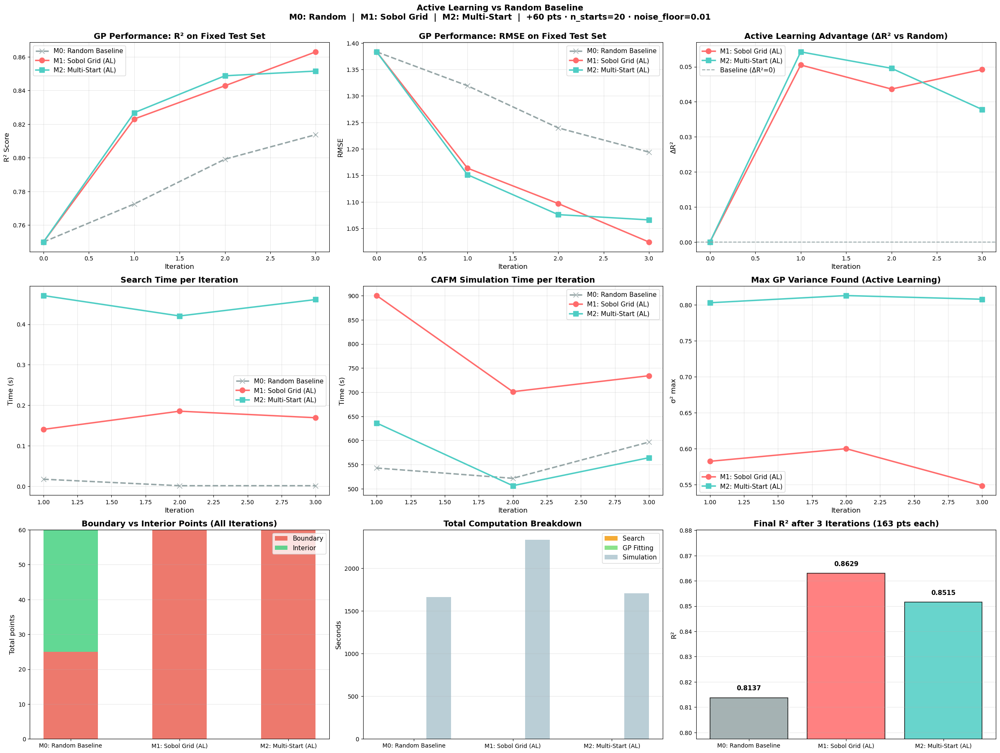


✓ Plot saved → combined_M0_M1_M2_20260716_034836.png

FINAL COMPARISON SUMMARY
              Method  Final Data Size Final R² Final RMSE R² Improvement RMSE Improvement Total Search (s) Total Sim (s) Total Fit (s) Total Time (s) Avg Search/Iter  Boundary Points  Interior Points Boundary %
 M0: Random Baseline              163   0.8137     1.1939        +0.0638          +0.1893              0.0        1660.7           1.1         1661.8            0.01               25               35      41.7%
 M1: Sobol Grid (AL)              163   0.8629     1.0242        +0.1130          +0.3590              0.5        2335.3           1.3         2337.0            0.16               60                0     100.0%
M2: Multi-Start (AL)              163   0.8515     1.0660        +0.1015          +0.3173              1.4        1706.3           1.3         1708.9            0.45               60                0     100.0%

ACTIVE LEARNING ADVANTAGE vs RANDOM BASELINE
  M1: Sobol Grid (AL)         

In [1]:
"""
COMBINED COMPARISON: M0 (Random Baseline) | M1 (Sobol Grid) | M2 (Multi-Start)
================================================================================
Saves results after each method completes so you can:
1. Run the experiment (saves pickle)
2. Load results later and generate comparison plots
"""

import sys
import time
import warnings
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from scipy.stats import qmc
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from sklearn.metrics import r2_score, mean_squared_error
from datetime import datetime

sys.path.append(r"D:\KIT\social_force_model")
from run_batch import single_run

warnings.filterwarnings("ignore")

# ======================================================================
# GLOBAL CONFIGURATION
# ======================================================================
DATA_PATH            = r"D:\KIT\social_force_model\cafm_qmc_new_dataset_256x10.npz"
PARAM_NAMES          = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]
TARGET_IDX           = 0
N_ITERATIONS         = 3
N_REPS               = 10
POINTS_PER_ITERATION = 20
TOLERANCE            = 1e-3
N_STARTS             = 20
NOISE_FLOOR          = 1e-2

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}

lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])
bounds = list(zip(lowers, uppers))

# ======================================================================
# DATA LOADING
# ======================================================================
def load_initial_data(data_path, target_idx=0, test_ratio=0.6, seed=42):
    data  = np.load(data_path)
    X     = data["X"]
    y     = data["Y"][:, target_idx]
    y_std = data["Y_std"][:, target_idx]

    valid = ~np.isnan(y)
    X, y, y_std = X[valid], y[valid], y_std[valid]

    np.random.seed(seed)
    n_total   = len(X)
    n_test    = int(n_total * test_ratio)
    test_idx  = np.random.choice(n_total, n_test, replace=False)
    train_idx = np.setdiff1d(np.arange(n_total), test_idx)

    X_train  = X[train_idx];  y_train  = y[train_idx];  ys_train = y_std[train_idx]
    X_test   = X[test_idx];   y_test   = y[test_idx];   ys_test  = y_std[test_idx]

    print(f"\n{'='*80}")
    print("DATA SPLIT  (seed=42 — fixed for ALL methods)")
    print(f"{'='*80}")
    print(f"Total valid  : {n_total}")
    print(f"Train set    : {len(train_idx)} pts (80%)")
    print(f"Test set     : {len(test_idx)} pts (20%)  ← FIXED, never changes")
    print(f"Budget       : {N_ITERATIONS} iters × {POINTS_PER_ITERATION} pts "
          f"= {N_ITERATIONS*POINTS_PER_ITERATION} new simulations per method")
    print(f"Final size   : {len(train_idx)} + {N_ITERATIONS*POINTS_PER_ITERATION} "
          f"= {len(train_idx)+N_ITERATIONS*POINTS_PER_ITERATION} pts")

    return X_train, y_train, ys_train, X_test, y_test, ys_test

# ======================================================================
# GP TRAINING  (IDENTICAL across all methods)
# ======================================================================
def train_surrogate(X, y, y_std, n_restarts=5):
    t0 = time.time()

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()
    Xs = scaler_X.fit_transform(X)
    ys = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

    y_var_s  = (y_std / scaler_y.scale_[0]) ** 2
    alpha_s  = np.clip(y_var_s, NOISE_FLOOR, None)

    kernel = (
        C(1.0, (1e-3, 1e3)) *
        Matern(length_scale=[0.5, 0.5, 1.0, 0.5, 0.3, 0.5],
               length_scale_bounds=[(1e-3, 15)] * 6,
               nu=2.5)
    )
    gp = GaussianProcessRegressor(
        kernel=kernel, alpha=alpha_s,
        n_restarts_optimizer=n_restarts,
        random_state=42, normalize_y=False
    )
    gp.fit(Xs, ys)

    return {"model": gp, "scaler_X": scaler_X,
            "scaler_y": scaler_y, "fitting_time": time.time() - t0}

# ======================================================================
# EVALUATION
# ======================================================================
def evaluate_gp(gp_dict, X_test, y_test):
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    yp_s, ys_s = gp.predict(sX.transform(X_test), return_std=True)
    y_pred = sy.inverse_transform(yp_s.reshape(-1, 1)).ravel()
    return {
        "r2"         : r2_score(y_test, y_pred),
        "rmse"       : np.sqrt(mean_squared_error(y_test, y_pred)),
        "predictions": y_pred,
        "std"        : ys_s * sy.scale_[0]
    }

# ======================================================================
# OBJECTIVE FUNCTION
# ======================================================================
def objective_neg_variance(x_raw, gp, scaler_X, scaler_y):
    xs = scaler_X.transform(x_raw.reshape(1, -1))
    _, std = gp.predict(xs, return_std=True)
    return -float((std[0] * scaler_y.scale_[0]) ** 2)

# ======================================================================
# BOUNDARY ANALYSIS
# ======================================================================
def analyze_boundaries(x_batch, threshold=0.05):
    if len(x_batch) == 0:
        return 0, 0, 0.0
    xn   = (x_batch - lowers) / (uppers - lowers)
    dmin = np.min(np.minimum(xn, 1 - xn), axis=1)
    bnd  = int(np.sum(dmin < threshold))
    return bnd, len(x_batch) - bnd, float(np.mean(dmin))

# ======================================================================
# SIMULATION
# ======================================================================
def simulate_batch(x_batch, base_seed=1000):
    t0 = time.time()
    ym, ys = [], []
    n = len(x_batch)
    for i, x in enumerate(x_batch):
        pd_ = {name: float(x[j]) for j, name in enumerate(PARAM_NAMES)}
        reps = []
        for r in range(N_REPS):
            try:
                reps.append(single_run(pd_, base_seed + i*100 + r)[TARGET_IDX])
            except Exception:
                reps.append(np.nan)
        ym.append(np.nanmean(reps))
        ys.append(np.nanstd(reps))
        if (i+1) % 5 == 0 or (i+1) == n:
            el  = time.time() - t0
            rem = el / (i+1) * (n - i - 1)
            print(f"    [{i+1}/{n}]  elapsed {el/60:.1f}min  "
                  f"remaining ~{rem/60:.1f}min")
    return np.array(ym), np.array(ys), time.time() - t0

# ======================================================================
# RESULT DICT FACTORY
# ======================================================================
def _make_results(X_init, y_init, ys_init):
    return {
        'X_train'             : [X_init.copy()],
        'y_train'             : [y_init.copy()],
        'y_std_train'         : [ys_init.copy()],
        'r2_history'          : [],
        'rmse_history'        : [],
        'search_time_history' : [],
        'sim_time_history'    : [],
        'fit_time_history'    : [],
        'boundary_pts_history': [],
        'interior_pts_history': [],
        'avg_dist_to_boundary': [],
        'found_variance_max'  : [],
        'found_variance_mean' : [],
    }

# ======================================================================
# METHOD 0 – RANDOM BASELINE
# ======================================================================
def method0_random(iteration, n_select=POINTS_PER_ITERATION):
    t0 = time.time()
    sampler = qmc.Sobol(d=6, scramble=True, seed=1000 + iteration)
    x_new   = qmc.scale(sampler.random(n_select), lowers, uppers)
    return x_new, time.time() - t0

# ======================================================================
# METHOD 1 – SOBOL GRID
# ======================================================================
def method1_sobol_grid(gp_dict, n_candidates=30000, n_select=POINTS_PER_ITERATION):
    t0 = time.time()
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    sampler    = qmc.Sobol(d=6, scramble=True, seed=42)
    cand       = qmc.scale(sampler.random(n_candidates), lowers, uppers)
    _, std_s   = gp.predict(sX.transform(cand), return_std=True)
    var        = (std_s * sy.scale_[0]) ** 2
    top        = np.argsort(var)[::-1][:n_select]
    return cand[top], time.time() - t0

# ======================================================================
# METHOD 2 – MULTI-START LOCAL
# ======================================================================
def method2_multistart(gp_dict, n_starts=N_STARTS, n_select=POINTS_PER_ITERATION):
    t0 = time.time()
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    sampler    = qmc.Sobol(d=6, scramble=True, seed=99)
    guesses    = qmc.scale(sampler.random(n_starts), lowers, uppers)
    found_x, found_v = [], []
    for x0 in guesses:
        res = minimize(objective_neg_variance, x0=x0,
                       args=(gp, sX, sy), bounds=bounds,
                       method='L-BFGS-B', tol=TOLERANCE,
                       options={'maxiter': 100, 'disp': False})
        if res.success:
            found_x.append(res.x)
            found_v.append(-res.fun)
    if not found_x:
        return guesses[:n_select], time.time() - t0
    found_x = np.array(found_x)
    found_v = np.array(found_v)
    top     = np.argsort(found_v)[::-1][:n_select]
    return found_x[top], time.time() - t0

# ======================================================================
# ONE-METHOD RUNNER  (mirrors your old run_al_trajectory exactly)
# ======================================================================
def run_one_method(method_name, X_tr, y_tr, ys_tr, X_te, y_te, ys_te,
                   initial_r2, initial_rmse, initial_fit_time):
    """
    Runs a single method for N_ITERATIONS.
    Returns the results dict in the SAME format as your old code.
    """
    print(f"\n{'='*80}")
    print(f"RUNNING: {method_name}")
    print(f"{'='*80}")

    res = _make_results(X_tr, y_tr, ys_tr)

    # Seed iteration-0 metrics (same initial GP for all)
    res['r2_history'].append(initial_r2)
    res['rmse_history'].append(initial_rmse)
    res['fit_time_history'].append(initial_fit_time)

    X_cur  = X_tr.copy()
    y_cur  = y_tr.copy()
    ys_cur = ys_tr.copy()

    for iteration in range(1, N_ITERATIONS + 1):
        print(f"\n{'─'*60}")
        print(f"  {method_name}  |  Iteration {iteration}/{N_ITERATIONS}")
        print(f"{'─'*60}")

        # ── 1. Train GP on current data ───────────────────────────
        print(f"  Training GP on {len(X_cur)} points …")
        gp_dict  = train_surrogate(X_cur, y_cur, ys_cur)
        fit_time = gp_dict['fitting_time']
        print(f"    fit time : {fit_time:.2f}s")

        # ── 2. Select new points ──────────────────────────────────
        if method_name == 'M0_Random_Baseline':
            x_new, search_time = method0_random(iteration)
        elif method_name == 'M1_Sobol_Grid':
            x_new, search_time = method1_sobol_grid(gp_dict)
        else:                                          # M2_MultiStart
            x_new, search_time = method2_multistart(gp_dict)

        print(f"    search time : {search_time:.2f}s  |  "
              f"found {len(x_new)} points")

        # ── 3. Boundary analysis ───────────────────────────────────
        bnd, intr, avg_d = analyze_boundaries(x_new)
        bnd_pct = bnd / len(x_new) * 100 if len(x_new) else 0
        print(f"    boundary  : {bnd}/{len(x_new)} ({bnd_pct:.0f}%)")
        print(f"    interior  : {intr}/{len(x_new)} ({100-bnd_pct:.0f}%)")
        print(f"    avg dist  : {avg_d:.4f}")

        # ── 4. Variance stats of selected points ──────────────────
        if len(x_new):
            xs_new  = gp_dict['scaler_X'].transform(x_new)
            _, st   = gp_dict['model'].predict(xs_new, return_std=True)
            var_new = (st * gp_dict['scaler_y'].scale_[0]) ** 2
            vmax    = float(var_new.max())
            vmean   = float(var_new.mean())
        else:
            vmax = vmean = 0.0
        print(f"    var max   : {vmax:.6f}")
        print(f"    var mean  : {vmean:.6f}")
        res['found_variance_max'].append(vmax)
        res['found_variance_mean'].append(vmean)

        # ── 5. CAFM simulations ────────────────────────────────────
        print(f"  Running CAFM: {len(x_new)} pts × {N_REPS} reps …")
        y_new, ys_new, sim_time = simulate_batch(
            x_new, base_seed=3000 + iteration * 100)
        print(f"    sim time : {sim_time:.1f}s  "
              f"({sim_time/len(x_new):.1f}s/pt)")
        print(f"    y mean   : {np.nanmean(y_new):.4f} "
              f"± {np.nanmean(ys_new):.4f}")

        # ── 6. Update training set ────────────────────────────────
        X_cur  = np.vstack([X_cur, x_new])
        y_cur  = np.append(y_cur,  y_new)
        ys_cur = np.append(ys_cur, ys_new)

        res['X_train'].append(X_cur.copy())
        res['y_train'].append(y_cur.copy())
        res['y_std_train'].append(ys_cur.copy())

        # ── 7. Retrain GP and evaluate ────────────────────────────
        print(f"  Retraining GP on {len(X_cur)} points …")
        gp_fin = train_surrogate(X_cur, y_cur, ys_cur)
        ev     = evaluate_gp(gp_fin, X_te, y_te)
        print(f"    R²   : {ev['r2']:.4f}  "
              f"(Δ {ev['r2']-res['r2_history'][-1]:+.4f})")
        print(f"    RMSE : {ev['rmse']:.4f}  "
              f"(Δ {ev['rmse']-res['rmse_history'][-1]:+.4f})")

        # ── 8. Store ───────────────────────────────────────────────
        res['r2_history'].append(ev['r2'])
        res['rmse_history'].append(ev['rmse'])
        res['search_time_history'].append(search_time)
        res['sim_time_history'].append(sim_time)
        res['fit_time_history'].append(fit_time)
        res['boundary_pts_history'].append(bnd)
        res['interior_pts_history'].append(intr)
        res['avg_dist_to_boundary'].append(avg_d)

    print(f"\n  ✓ {method_name} COMPLETE")
    print(f"    Final R²   : {res['r2_history'][-1]:.4f}")
    print(f"    Final RMSE : {res['rmse_history'][-1]:.4f}")
    print(f"    Data size  : {len(res['X_train'][-1])}")

    return res

# ======================================================================
# PLOTS  (matches your old plot_comparison style exactly)
# ======================================================================
colors = {
    'M0_Random_Baseline': '#95a5a6',
    'M1_Sobol_Grid'     : '#FF6B6B',
    'M2_MultiStart'     : '#4ECDC4',
}
markers = {
    'M0_Random_Baseline': 'x',
    'M1_Sobol_Grid'     : 'o',
    'M2_MultiStart'     : 's',
}
linestyles = {
    'M0_Random_Baseline': '--',
    'M1_Sobol_Grid'     : '-',
    'M2_MultiStart'     : '-',
}
labels = {
    'M0_Random_Baseline': 'M0: Random Baseline',
    'M1_Sobol_Grid'     : 'M1: Sobol Grid (AL)',
    'M2_MultiStart'     : 'M2: Multi-Start (AL)',
}


def plot_all(results, X_test, y_test, save_path='combined_M0_M1_M2.png'):
    """
    9-panel plot matching your old code structure
    """
    iters   = np.arange(0, N_ITERATIONS + 1)
    iters_s = np.arange(1, N_ITERATIONS + 1)

    fig, axes = plt.subplots(3, 3, figsize=(24, 18))

    def _line(ax, name, data, x):
        ax.plot(x, data,
                color=colors[name], marker=markers[name],
                linestyle=linestyles[name], linewidth=2.5,
                markersize=9, label=labels[name])

    mnames = list(results.keys())

    # ── 1: R² ────────────────────────────────────────────────────────
    ax = axes[0, 0]
    for n, d in results.items():
        _line(ax, n, d['r2_history'], iters)
    ax.set_title('GP Performance: R² on Fixed Test Set',
                 fontweight='bold', fontsize=14)
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('R² Score', fontsize=12)
    ax.legend(fontsize=11); ax.grid(True, alpha=0.3)

    # ── 2: RMSE ──────────────────────────────────────────────────────
    ax = axes[0, 1]
    for n, d in results.items():
        _line(ax, n, d['rmse_history'], iters)
    ax.set_title('GP Performance: RMSE on Fixed Test Set',
                 fontweight='bold', fontsize=14)
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('RMSE', fontsize=12)
    ax.legend(fontsize=11); ax.grid(True, alpha=0.3)

    # ── 3: ΔR² vs baseline ───────────────────────────────────────────
    ax = axes[0, 2]
    base_r2 = results['M0_Random_Baseline']['r2_history']
    for n, d in results.items():
        if n == 'M0_Random_Baseline':
            continue
        delta = [d['r2_history'][i] - base_r2[i] for i in range(N_ITERATIONS+1)]
        ax.plot(iters, delta,
                color=colors[n], marker=markers[n],
                linestyle=linestyles[n], linewidth=2.5,
                markersize=9, label=labels[n])
    ax.axhline(0, color='#95a5a6', linestyle='--', linewidth=1.5,
               label='Baseline (ΔR²=0)')
    ax.set_title('Active Learning Advantage (ΔR² vs Random)',
                 fontweight='bold', fontsize=14)
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('ΔR²', fontsize=12)
    ax.legend(fontsize=11); ax.grid(True, alpha=0.3)

    # ── 4: Search time ───────────────────────────────────────────────
    ax = axes[1, 0]
    for n, d in results.items():
        _line(ax, n, d['search_time_history'], iters_s)
    ax.set_title('Search Time per Iteration',
                 fontweight='bold', fontsize=14)
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('Time (s)', fontsize=12)
    ax.legend(fontsize=11); ax.grid(True, alpha=0.3)

    # ── 5: Simulation time ───────────────────────────────────────────
    ax = axes[1, 1]
    for n, d in results.items():
        _line(ax, n, d['sim_time_history'], iters_s)
    ax.set_title('CAFM Simulation Time per Iteration',
                 fontweight='bold', fontsize=14)
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('Time (s)', fontsize=12)
    ax.legend(fontsize=11); ax.grid(True, alpha=0.3)

    # ── 6: Max variance (M1, M2 only) ────────────────────────────────
    ax = axes[1, 2]
    for n, d in results.items():
        if n == 'M0_Random_Baseline':
            continue
        ax.plot(iters_s, d['found_variance_max'],
                color=colors[n], marker=markers[n],
                linestyle=linestyles[n], linewidth=2.5,
                markersize=9, label=labels[n])
    ax.set_title('Max GP Variance Found (Active Learning)',
                 fontweight='bold', fontsize=14)
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('σ² max', fontsize=12)
    ax.legend(fontsize=11); ax.grid(True, alpha=0.3)

    # ── 7: Boundary vs Interior stacked bar ──────────────────────────
    ax    = axes[2, 0]
    x_pos = np.arange(len(mnames))
    t_bnd = [sum(results[n]['boundary_pts_history']) for n in mnames]
    t_int = [sum(results[n]['interior_pts_history']) for n in mnames]
    ax.bar(x_pos, t_bnd, 0.5, label='Boundary', color='#e74c3c', alpha=0.75)
    ax.bar(x_pos, t_int, 0.5, bottom=t_bnd, label='Interior',
           color='#2ecc71', alpha=0.75)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([labels[n] for n in mnames], fontsize=10)
    ax.set_title('Boundary vs Interior Points (All Iterations)',
                 fontweight='bold', fontsize=14)
    ax.set_ylabel('Total points', fontsize=12)
    ax.legend(fontsize=11); ax.grid(axis='y', alpha=0.3)

    # ── 8: Cumulative time breakdown ─────────────────────────────────
    ax = axes[2, 1]
    w  = 0.25
    ts = [sum(results[n]['search_time_history']) for n in mnames]
    tf = [sum(results[n]['fit_time_history'])    for n in mnames]
    tm = [sum(results[n]['sim_time_history'])    for n in mnames]
    ax.bar(x_pos-w, ts, w, label='Search',     color='#f39c12', alpha=0.85)
    ax.bar(x_pos,   tf, w, label='GP Fitting', color='#77DD77', alpha=0.85)
    ax.bar(x_pos+w, tm, w, label='Simulation', color='#AEC6CF', alpha=0.85)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([labels[n] for n in mnames], fontsize=10)
    ax.set_title('Total Computation Breakdown',
                 fontweight='bold', fontsize=14)
    ax.set_ylabel('Seconds', fontsize=12)
    ax.legend(fontsize=11); ax.grid(axis='y', alpha=0.3)

    # ── 9: Final R² bar ───────────────────────────────────────────────
    ax       = axes[2, 2]
    final_r2 = [results[n]['r2_history'][-1] for n in mnames]
    bcols    = [colors[n] for n in mnames]
    bars     = ax.bar(x_pos, final_r2, color=bcols,
                      alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val in zip(bars, final_r2):
        ax.text(bar.get_x() + bar.get_width()/2, val + 0.003,
                f'{val:.4f}', ha='center', fontsize=11, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([labels[n] for n in mnames], fontsize=10)
    ax.set_title(f'Final R² after {N_ITERATIONS} Iterations '
                 f'({len(results[mnames[0]]["X_train"][-1])} pts each)',
                 fontweight='bold', fontsize=14)
    ax.set_ylabel('R²', fontsize=12)
    ax.set_ylim(min(final_r2)*0.98, max(final_r2)*1.02)
    ax.grid(axis='y', alpha=0.3)

    plt.suptitle(
        f'Active Learning vs Random Baseline\n'
        f'M0: Random  |  M1: Sobol Grid  |  M2: Multi-Start  |  '
        f'+{N_ITERATIONS*POINTS_PER_ITERATION} pts · '
        f'n_starts={N_STARTS} · noise_floor={NOISE_FLOOR}',
        fontsize=14, fontweight='bold', y=0.998
    )
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"\n✓ Plot saved → {save_path}")

# ======================================================================
# SUMMARY TABLE  (same as your old print_final_summary)
# ======================================================================
def print_final_summary(results):
    print(f"\n{'='*80}")
    print("FINAL COMPARISON SUMMARY")
    print(f"{'='*80}")

    rows = []
    for n, d in results.items():
        tot_b = sum(d['boundary_pts_history'])
        tot_i = sum(d['interior_pts_history'])
        rows.append({
            'Method'           : labels[n],
            'Final Data Size'  : len(d['X_train'][-1]),
            'Final R²'         : f"{d['r2_history'][-1]:.4f}",
            'Final RMSE'       : f"{d['rmse_history'][-1]:.4f}",
            'R² Improvement'   : f"{d['r2_history'][-1]-d['r2_history'][0]:+.4f}",
            'RMSE Improvement' : f"{d['rmse_history'][0]-d['rmse_history'][-1]:+.4f}",
            'Total Search (s)' : f"{sum(d['search_time_history']):.1f}",
            'Total Sim (s)'    : f"{sum(d['sim_time_history']):.1f}",
            'Total Fit (s)'    : f"{sum(d['fit_time_history']):.1f}",
            'Total Time (s)'   : f"{sum(d['search_time_history'])+sum(d['sim_time_history'])+sum(d['fit_time_history']):.1f}",
            'Avg Search/Iter'  : f"{sum(d['search_time_history'])/N_ITERATIONS:.2f}",
            'Boundary Points'  : tot_b,
            'Interior Points'  : tot_i,
            'Boundary %'       : f"{tot_b/(tot_b+tot_i)*100:.1f}%",
        })

    df = pd.DataFrame(rows)
    print(df.to_string(index=False))

    # Active learning advantage
    base_r2 = results['M0_Random_Baseline']['r2_history'][-1]
    print(f"\n{'='*80}")
    print("ACTIVE LEARNING ADVANTAGE vs RANDOM BASELINE")
    print(f"{'='*80}")
    for n in ['M1_Sobol_Grid', 'M2_MultiStart']:
        adv = results[n]['r2_history'][-1] - base_r2
        print(f"  {labels[n]:<35}  "
              f"ΔR² = {adv:+.4f}  ({adv/abs(base_r2)*100:+.2f}%)")

    # Iteration-by-iteration table (same as your old code)
    print(f"\n{'='*80}")
    print("ITERATION-BY-ITERATION BREAKDOWN")
    print(f"{'='*80}")
    hdr = (f"{'Iter':<6} {'R²':<10} {'RMSE':<10} "
           f"{'Search(s)':<12} {'Sim(s)':<10} "
           f"{'Boundary':<10} {'Interior':<10}")
    sep = '-' * 70

    for n, d in results.items():
        print(f"\n{labels[n]}")
        print(sep)
        print(hdr)
        print(sep)
        print(f"{'0':<6} {d['r2_history'][0]:<10.4f} "
              f"{d['rmse_history'][0]:<10.4f} "
              f"{'-':<12} {'-':<10} {'-':<10} {'-':<10}")
        for i in range(N_ITERATIONS):
            print(f"{i+1:<6} {d['r2_history'][i+1]:<10.4f} "
                  f"{d['rmse_history'][i+1]:<10.4f} "
                  f"{d['search_time_history'][i]:<12.2f} "
                  f"{d['sim_time_history'][i]:<10.1f} "
                  f"{d['boundary_pts_history'][i]:<10} "
                  f"{d['interior_pts_history'][i]:<10}")

    return df

# ======================================================================
# MAIN
# ======================================================================
if __name__ == "__main__":
    t_global = time.time()
    print("="*80)
    print("COMBINED: M0 (Random Baseline) | M1 (Sobol Grid) | M2 (Multi-Start)")
    print(f"Start : {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
    print("="*80)

    # Load data — same split for ALL methods
    X_tr, y_tr, ys_tr, X_te, y_te, ys_te = load_initial_data(DATA_PATH)

    # ── ITERATION 0: one shared initial GP ──────────────────────────
    print(f"\n{'='*80}")
    print("ITERATION 0  —  INITIAL GP  (shared by all methods)")
    print(f"{'='*80}")
    gp0   = train_surrogate(X_tr, y_tr, ys_tr)
    ev0   = evaluate_gp(gp0, X_te, y_te)
    i0_r2, i0_rm, i0_ft = ev0['r2'], ev0['rmse'], gp0['fitting_time']

    print(f"  Train pts : {len(X_tr)}")
    print(f"  Fit time  : {i0_ft:.2f}s")
    print(f"  Test R²   : {i0_r2:.4f}")
    print(f"  Test RMSE : {i0_rm:.4f}")

    # ── Run each method sequentially ────────────────────────────────
    all_results = {}

    for method_name in ['M0_Random_Baseline', 'M1_Sobol_Grid', 'M2_MultiStart']:
        res = run_one_method(
            method_name,
            X_tr, y_tr, ys_tr,
            X_te, y_te, ys_te,
            initial_r2=i0_r2,
            initial_rmse=i0_rm,
            initial_fit_time=i0_ft
        )
        all_results[method_name] = res

        # Save after EACH method (so you don't lose work if crash)
        ts  = datetime.now().strftime("%Y%m%d_%H%M%S")
        pkl = f'{method_name}_results_{ts}.pkl'
        with open(pkl, 'wb') as f:
            pickle.dump({'results': {method_name: res},
                         'X_test': X_te, 'y_test': y_te}, f)
        print(f"\n  ✓ Saved checkpoint → {pkl}")

    # ── Save combined results ────────────────────────────────────────
    ts_end   = datetime.now().strftime("%Y%m%d_%H%M%S")
    pkl_all  = f'combined_M0_M1_M2_results_{ts_end}.pkl'
    with open(pkl_all, 'wb') as f:
        pickle.dump({'results': all_results,
                     'X_test': X_te, 'y_test': y_te}, f)
    print(f"\n✓ Combined results saved → {pkl_all}")

    # ── Plots ────────────────────────────────────────────────────────
    plot_all(all_results, X_te, y_te,
             save_path=f'combined_M0_M1_M2_{ts_end}.png')

    # ── Summary table ────────────────────────────────────────────────
    summary_df = print_final_summary(all_results)
    csv_file   = f'combined_M0_M1_M2_summary_{ts_end}.csv'
    summary_df.to_csv(csv_file, index=False)
    print(f"\n✓ Summary CSV saved → {csv_file}")

    total = time.time() - t_global
    print(f"\n{'='*80}")
    print(f"ALL DONE")
    print(f"  Total time : {total/3600:.2f} hrs ({total/60:.1f} min)")
    print(f"  End        : {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
    print(f"{'='*80}")

## Only Method 2 (Multi-start)

RUNNING: M2 (Multi-Start Local Optimization) ONLY
Start : 2026-07-16 14:17:59

DATA SPLIT  (seed=42 — fixed for ALL methods)
Total valid  : 256
Train set    : 103 pts
Test set     : 153 pts  ← FIXED, never changes
Budget       : 3 iters × 20 pts = 60 new simulations
Final size   : 103 + 60 = 163 pts

ITERATION 0  —  INITIAL GP
  Train pts : 103
  Fit time  : 0.31s
  Test R²   : 0.7500
  Test RMSE : 1.3832

RUNNING: M2_MultiStart

────────────────────────────────────────────────────────────
  M2_MultiStart  |  Iteration 1/3
────────────────────────────────────────────────────────────
  Training GP on 103 points …
    fit time : 0.22s
    search time : 1.88s  |  found 20 points
    boundary  : 20/20 (100%)
    interior  : 0/20 (0%)
    avg dist  : 0.0000
    var max   : 0.802610
    var mean  : 0.747186
  Running CAFM: 20 pts × 10 reps …
    [5/20]  elapsed 8.5min  remaining ~25.5min
    [10/20]  elapsed 16.4min  remaining ~16.4min
    [15/20]  elapsed 23.5min  remaining ~7.8min
    [20/

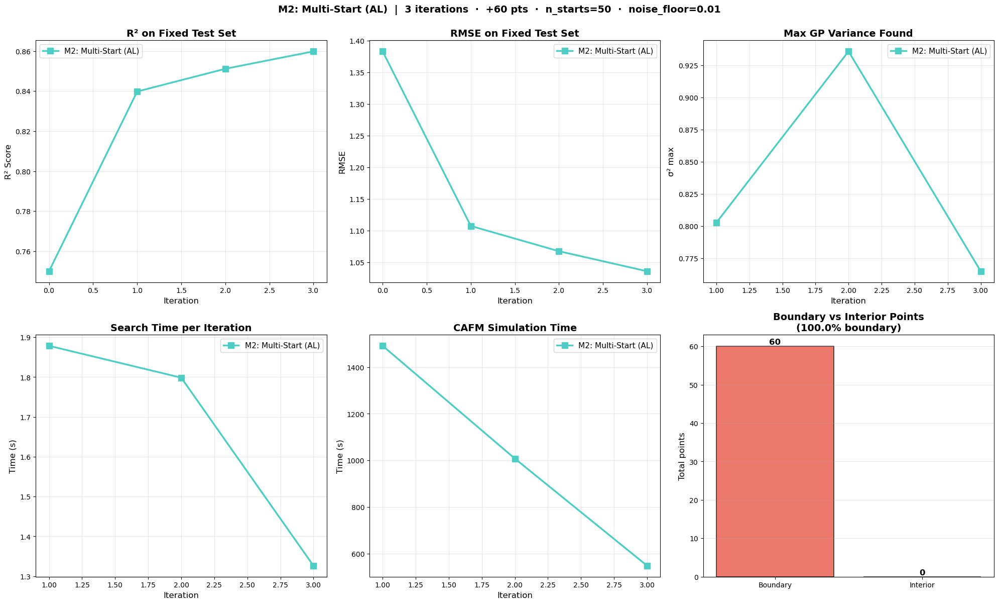


✓ Plot saved → M2_MultiStart_20260716_150855.png

FINAL SUMMARY
              Method  Final Data Size Final R² Final RMSE R² Improvement RMSE Improvement Total Search (s) Total Sim (s) Total Fit (s) Total Time (s) Avg Search/Iter  Boundary Points  Interior Points Boundary %
M2: Multi-Start (AL)              163   0.8599     1.0355        +0.1099          +0.3477              5.0        3048.1           1.5         3054.7            1.67               60                0     100.0%

ITERATION-BY-ITERATION BREAKDOWN

M2: Multi-Start (AL)
----------------------------------------------------------------------
Iter   R²         RMSE       Search(s)    Sim(s)     Boundary   Interior  
----------------------------------------------------------------------
0      0.7500     1.3832     -            -          -          -         
1      0.8398     1.1072     1.88         1491.1     20         0         
2      0.8512     1.0672     1.80         1008.0     20         0         
3      0.8599  

In [2]:
"""
M2 ONLY: Multi-Start Local Optimization
========================================
Runs M2 only, saves checkpoint for later comparison with M0 and M1
"""

import sys
import time
import warnings
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from scipy.stats import qmc
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from sklearn.metrics import r2_score, mean_squared_error
from datetime import datetime

sys.path.append(r"D:\KIT\social_force_model")
from run_batch import single_run

warnings.filterwarnings("ignore")

# ======================================================================
# GLOBAL CONFIGURATION  ← EXACT SAME AS YOUR MAIN SCRIPT
# ======================================================================
DATA_PATH            = r"D:\KIT\social_force_model\cafm_qmc_new_dataset_256x10.npz"
PARAM_NAMES          = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]
TARGET_IDX           = 0
N_ITERATIONS         = 3
N_REPS               = 10
POINTS_PER_ITERATION = 20
TOLERANCE            = 1e-3
N_STARTS             = 50
NOISE_FLOOR          = 1e-2

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}

lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])
bounds = list(zip(lowers, uppers))

# ── Visual style (needed for plots) ──────────────────────────────────
colors = {
    'M0_Random_Baseline': '#95a5a6',
    'M1_Sobol_Grid'     : '#FF6B6B',
    'M2_MultiStart'     : '#4ECDC4',
}
markers = {
    'M0_Random_Baseline': 'x',
    'M1_Sobol_Grid'     : 'o',
    'M2_MultiStart'     : 's',
}
linestyles = {
    'M0_Random_Baseline': '--',
    'M1_Sobol_Grid'     : '-',
    'M2_MultiStart'     : '-',
}
labels = {
    'M0_Random_Baseline': 'M0: Random Baseline',
    'M1_Sobol_Grid'     : 'M1: Sobol Grid (AL)',
    'M2_MultiStart'     : 'M2: Multi-Start (AL)',
}

# ======================================================================
# DATA LOADING  ← EXACT SAME AS YOUR MAIN SCRIPT
# ======================================================================
def load_initial_data(data_path, target_idx=0, test_ratio=0.6, seed=42):
    data  = np.load(data_path)
    X     = data["X"]
    y     = data["Y"][:, target_idx]
    y_std = data["Y_std"][:, target_idx]

    valid = ~np.isnan(y)
    X, y, y_std = X[valid], y[valid], y_std[valid]

    np.random.seed(seed)
    n_total   = len(X)
    n_test    = int(n_total * test_ratio)
    test_idx  = np.random.choice(n_total, n_test, replace=False)
    train_idx = np.setdiff1d(np.arange(n_total), test_idx)

    X_train  = X[train_idx];  y_train  = y[train_idx];  ys_train = y_std[train_idx]
    X_test   = X[test_idx];   y_test   = y[test_idx];   ys_test  = y_std[test_idx]

    print(f"\n{'='*80}")
    print("DATA SPLIT  (seed=42 — fixed for ALL methods)")
    print(f"{'='*80}")
    print(f"Total valid  : {n_total}")
    print(f"Train set    : {len(train_idx)} pts")
    print(f"Test set     : {len(test_idx)} pts  ← FIXED, never changes")
    print(f"Budget       : {N_ITERATIONS} iters × {POINTS_PER_ITERATION} pts "
          f"= {N_ITERATIONS*POINTS_PER_ITERATION} new simulations")
    print(f"Final size   : {len(train_idx)} + {N_ITERATIONS*POINTS_PER_ITERATION} "
          f"= {len(train_idx)+N_ITERATIONS*POINTS_PER_ITERATION} pts")

    return X_train, y_train, ys_train, X_test, y_test, ys_test

# ======================================================================
# GP TRAINING  ← EXACT SAME AS YOUR MAIN SCRIPT
# ======================================================================
def train_surrogate(X, y, y_std, n_restarts=5):
    t0 = time.time()

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()
    Xs = scaler_X.fit_transform(X)
    ys = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

    y_var_s  = (y_std / scaler_y.scale_[0]) ** 2
    alpha_s  = np.clip(y_var_s, NOISE_FLOOR, None)

    kernel = (
        C(1.0, (1e-3, 1e3)) *
        Matern(length_scale=[0.5, 0.5, 1.0, 0.5, 0.3, 0.5],
               length_scale_bounds=[(1e-3, 15)] * 6,
               nu=2.5)
    )
    gp = GaussianProcessRegressor(
        kernel=kernel, alpha=alpha_s,
        n_restarts_optimizer=n_restarts,
        random_state=42, normalize_y=False
    )
    gp.fit(Xs, ys)

    return {"model": gp, "scaler_X": scaler_X,
            "scaler_y": scaler_y, "fitting_time": time.time() - t0}

# ======================================================================
# EVALUATION  ← EXACT SAME AS YOUR MAIN SCRIPT
# ======================================================================
def evaluate_gp(gp_dict, X_test, y_test):
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    yp_s, ys_s = gp.predict(sX.transform(X_test), return_std=True)
    y_pred = sy.inverse_transform(yp_s.reshape(-1, 1)).ravel()
    return {
        "r2"         : r2_score(y_test, y_pred),
        "rmse"       : np.sqrt(mean_squared_error(y_test, y_pred)),
        "predictions": y_pred,
        "std"        : ys_s * sy.scale_[0]
    }

# ======================================================================
# OBJECTIVE FUNCTION  ← EXACT SAME AS YOUR MAIN SCRIPT
# ======================================================================
def objective_neg_variance(x_raw, gp, scaler_X, scaler_y):
    xs = scaler_X.transform(x_raw.reshape(1, -1))
    _, std = gp.predict(xs, return_std=True)
    return -float((std[0] * scaler_y.scale_[0]) ** 2)

# ======================================================================
# BOUNDARY ANALYSIS  ← EXACT SAME AS YOUR MAIN SCRIPT
# ======================================================================
def analyze_boundaries(x_batch, threshold=0.05):
    if len(x_batch) == 0:
        return 0, 0, 0.0
    xn   = (x_batch - lowers) / (uppers - lowers)
    dmin = np.min(np.minimum(xn, 1 - xn), axis=1)
    bnd  = int(np.sum(dmin < threshold))
    return bnd, len(x_batch) - bnd, float(np.mean(dmin))

# ======================================================================
# SIMULATION  ← EXACT SAME AS YOUR MAIN SCRIPT
# ======================================================================
def simulate_batch(x_batch, base_seed=1000):
    t0 = time.time()
    ym, ys = [], []
    n = len(x_batch)
    for i, x in enumerate(x_batch):
        pd_ = {name: float(x[j]) for j, name in enumerate(PARAM_NAMES)}
        reps = []
        for r in range(N_REPS):
            try:
                reps.append(single_run(pd_, base_seed + i*100 + r)[TARGET_IDX])
            except Exception:
                reps.append(np.nan)
        ym.append(np.nanmean(reps))
        ys.append(np.nanstd(reps))
        if (i+1) % 5 == 0 or (i+1) == n:
            el  = time.time() - t0
            rem = el / (i+1) * (n - i - 1)
            print(f"    [{i+1}/{n}]  elapsed {el/60:.1f}min  "
                  f"remaining ~{rem/60:.1f}min")
    return np.array(ym), np.array(ys), time.time() - t0

# ======================================================================
# RESULT DICT FACTORY  ← EXACT SAME AS YOUR MAIN SCRIPT
# ======================================================================
def _make_results(X_init, y_init, ys_init):
    return {
        'X_train'             : [X_init.copy()],
        'y_train'             : [y_init.copy()],
        'y_std_train'         : [ys_init.copy()],
        'r2_history'          : [],
        'rmse_history'        : [],
        'search_time_history' : [],
        'sim_time_history'    : [],
        'fit_time_history'    : [],
        'boundary_pts_history': [],
        'interior_pts_history': [],
        'avg_dist_to_boundary': [],
        'found_variance_max'  : [],
        'found_variance_mean' : [],
    }

# ======================================================================
# METHOD 2 – MULTI-START LOCAL  ← EXACT SAME AS YOUR MAIN SCRIPT
# ======================================================================
def method2_multistart(gp_dict, n_starts=N_STARTS, n_select=POINTS_PER_ITERATION):
    t0 = time.time()
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    sampler    = qmc.Sobol(d=6, scramble=True, seed=99)
    guesses    = qmc.scale(sampler.random(n_starts), lowers, uppers)
    found_x, found_v = [], []
    for x0 in guesses:
        res = minimize(objective_neg_variance, x0=x0,
                       args=(gp, sX, sy), bounds=bounds,
                       method='L-BFGS-B', tol=TOLERANCE,
                       options={'maxiter': 100, 'disp': False})
        if res.success:
            found_x.append(res.x)
            found_v.append(-res.fun)
    if not found_x:
        return guesses[:n_select], time.time() - t0
    found_x = np.array(found_x)
    found_v = np.array(found_v)
    top     = np.argsort(found_v)[::-1][:n_select]
    return found_x[top], time.time() - t0

# ======================================================================
# ONE-METHOD RUNNER  ← EXACT SAME AS YOUR MAIN SCRIPT
# ======================================================================
def run_one_method(method_name, X_tr, y_tr, ys_tr, X_te, y_te, ys_te,
                   initial_r2, initial_rmse, initial_fit_time):
    print(f"\n{'='*80}")
    print(f"RUNNING: {method_name}")
    print(f"{'='*80}")

    res = _make_results(X_tr, y_tr, ys_tr)

    # Seed iteration-0 metrics
    res['r2_history'].append(initial_r2)
    res['rmse_history'].append(initial_rmse)
    res['fit_time_history'].append(initial_fit_time)

    X_cur  = X_tr.copy()
    y_cur  = y_tr.copy()
    ys_cur = ys_tr.copy()

    for iteration in range(1, N_ITERATIONS + 1):
        print(f"\n{'─'*60}")
        print(f"  {method_name}  |  Iteration {iteration}/{N_ITERATIONS}")
        print(f"{'─'*60}")

        # 1. Train GP
        print(f"  Training GP on {len(X_cur)} points …")
        gp_dict  = train_surrogate(X_cur, y_cur, ys_cur)
        fit_time = gp_dict['fitting_time']
        print(f"    fit time : {fit_time:.2f}s")

        # 2. Select new points  ← ONLY M2 here
        x_new, search_time = method2_multistart(gp_dict)
        print(f"    search time : {search_time:.2f}s  |  found {len(x_new)} points")

        # 3. Boundary analysis
        bnd, intr, avg_d = analyze_boundaries(x_new)
        bnd_pct = bnd / len(x_new) * 100 if len(x_new) else 0
        print(f"    boundary  : {bnd}/{len(x_new)} ({bnd_pct:.0f}%)")
        print(f"    interior  : {intr}/{len(x_new)} ({100-bnd_pct:.0f}%)")
        print(f"    avg dist  : {avg_d:.4f}")

        # 4. Variance stats
        if len(x_new):
            xs_new  = gp_dict['scaler_X'].transform(x_new)
            _, st   = gp_dict['model'].predict(xs_new, return_std=True)
            var_new = (st * gp_dict['scaler_y'].scale_[0]) ** 2
            vmax    = float(var_new.max())
            vmean   = float(var_new.mean())
        else:
            vmax = vmean = 0.0
        print(f"    var max   : {vmax:.6f}")
        print(f"    var mean  : {vmean:.6f}")
        res['found_variance_max'].append(vmax)
        res['found_variance_mean'].append(vmean)

        # 5. CAFM simulations
        print(f"  Running CAFM: {len(x_new)} pts × {N_REPS} reps …")
        y_new, ys_new, sim_time = simulate_batch(
            x_new, base_seed=3000 + iteration * 100)
        print(f"    sim time : {sim_time:.1f}s ({sim_time/len(x_new):.1f}s/pt)")
        print(f"    y mean   : {np.nanmean(y_new):.4f} ± {np.nanmean(ys_new):.4f}")

        # 6. Update training set
        X_cur  = np.vstack([X_cur, x_new])
        y_cur  = np.append(y_cur,  y_new)
        ys_cur = np.append(ys_cur, ys_new)

        res['X_train'].append(X_cur.copy())
        res['y_train'].append(y_cur.copy())
        res['y_std_train'].append(ys_cur.copy())

        # 7. Retrain GP and evaluate
        print(f"  Retraining GP on {len(X_cur)} points …")
        gp_fin = train_surrogate(X_cur, y_cur, ys_cur)
        ev     = evaluate_gp(gp_fin, X_te, y_te)
        print(f"    R²   : {ev['r2']:.4f}  (Δ {ev['r2']-res['r2_history'][-1]:+.4f})")
        print(f"    RMSE : {ev['rmse']:.4f}  (Δ {ev['rmse']-res['rmse_history'][-1]:+.4f})")

        # 8. Store metrics
        res['r2_history'].append(ev['r2'])
        res['rmse_history'].append(ev['rmse'])
        res['search_time_history'].append(search_time)
        res['sim_time_history'].append(sim_time)
        res['fit_time_history'].append(fit_time)
        res['boundary_pts_history'].append(bnd)
        res['interior_pts_history'].append(intr)
        res['avg_dist_to_boundary'].append(avg_d)

    print(f"\n  ✓ {method_name} COMPLETE")
    print(f"    Final R²   : {res['r2_history'][-1]:.4f}")
    print(f"    Final RMSE : {res['rmse_history'][-1]:.4f}")
    print(f"    Data size  : {len(res['X_train'][-1])}")

    return res

# ======================================================================
# SINGLE-METHOD PLOT  (for M2 only run)
# ======================================================================
def plot_single_method(results, method_name, save_path='M2_results.png'):
    """
    Plot results for a single method run.
    Shows key metrics across iterations.
    """
    d = results[method_name]
    iters   = np.arange(0, N_ITERATIONS + 1)
    iters_s = np.arange(1, N_ITERATIONS + 1)

    fig, axes = plt.subplots(2, 3, figsize=(20, 12))

    # 1: R²
    ax = axes[0, 0]
    ax.plot(iters, d['r2_history'],
            color=colors[method_name], marker=markers[method_name],
            linewidth=2.5, markersize=9, label=labels[method_name])
    ax.set_title('R² on Fixed Test Set', fontweight='bold', fontsize=14)
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('R² Score', fontsize=12)
    ax.legend(fontsize=11); ax.grid(True, alpha=0.3)

    # 2: RMSE
    ax = axes[0, 1]
    ax.plot(iters, d['rmse_history'],
            color=colors[method_name], marker=markers[method_name],
            linewidth=2.5, markersize=9, label=labels[method_name])
    ax.set_title('RMSE on Fixed Test Set', fontweight='bold', fontsize=14)
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('RMSE', fontsize=12)
    ax.legend(fontsize=11); ax.grid(True, alpha=0.3)

    # 3: Max variance found
    ax = axes[0, 2]
    ax.plot(iters_s, d['found_variance_max'],
            color=colors[method_name], marker=markers[method_name],
            linewidth=2.5, markersize=9, label=labels[method_name])
    ax.set_title('Max GP Variance Found', fontweight='bold', fontsize=14)
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('σ² max', fontsize=12)
    ax.legend(fontsize=11); ax.grid(True, alpha=0.3)

    # 4: Search time
    ax = axes[1, 0]
    ax.plot(iters_s, d['search_time_history'],
            color=colors[method_name], marker=markers[method_name],
            linewidth=2.5, markersize=9, label=labels[method_name])
    ax.set_title('Search Time per Iteration', fontweight='bold', fontsize=14)
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('Time (s)', fontsize=12)
    ax.legend(fontsize=11); ax.grid(True, alpha=0.3)

    # 5: Simulation time
    ax = axes[1, 1]
    ax.plot(iters_s, d['sim_time_history'],
            color=colors[method_name], marker=markers[method_name],
            linewidth=2.5, markersize=9, label=labels[method_name])
    ax.set_title('CAFM Simulation Time', fontweight='bold', fontsize=14)
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('Time (s)', fontsize=12)
    ax.legend(fontsize=11); ax.grid(True, alpha=0.3)

    # 6: Boundary vs Interior
    ax    = axes[1, 2]
    t_bnd = sum(d['boundary_pts_history'])
    t_int = sum(d['interior_pts_history'])
    ax.bar(['Boundary', 'Interior'], [t_bnd, t_int],
           color=['#e74c3c', '#2ecc71'], alpha=0.75,
           edgecolor='black', linewidth=1.2)
    for i, val in enumerate([t_bnd, t_int]):
        ax.text(i, val + 0.5, str(val), ha='center',
                fontsize=12, fontweight='bold')
    ax.set_title(f'Boundary vs Interior Points\n'
                 f'({t_bnd/(t_bnd+t_int)*100:.1f}% boundary)',
                 fontweight='bold', fontsize=14)
    ax.set_ylabel('Total points', fontsize=12)
    ax.grid(axis='y', alpha=0.3)

    plt.suptitle(
        f'{labels[method_name]}  |  '
        f'{N_ITERATIONS} iterations  ·  '
        f'+{N_ITERATIONS*POINTS_PER_ITERATION} pts  ·  '
        f'n_starts={N_STARTS}  ·  noise_floor={NOISE_FLOOR}',
        fontsize=14, fontweight='bold', y=0.998
    )
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"\n✓ Plot saved → {save_path}")

# ======================================================================
# SUMMARY TABLE  ← EXACT SAME AS YOUR MAIN SCRIPT
# ======================================================================
def print_final_summary(results):
    print(f"\n{'='*80}")
    print("FINAL SUMMARY")
    print(f"{'='*80}")

    rows = []
    for n, d in results.items():
        tot_b = sum(d['boundary_pts_history'])
        tot_i = sum(d['interior_pts_history'])
        rows.append({
            'Method'           : labels[n],
            'Final Data Size'  : len(d['X_train'][-1]),
            'Final R²'         : f"{d['r2_history'][-1]:.4f}",
            'Final RMSE'       : f"{d['rmse_history'][-1]:.4f}",
            'R² Improvement'   : f"{d['r2_history'][-1]-d['r2_history'][0]:+.4f}",
            'RMSE Improvement' : f"{d['rmse_history'][0]-d['rmse_history'][-1]:+.4f}",
            'Total Search (s)' : f"{sum(d['search_time_history']):.1f}",
            'Total Sim (s)'    : f"{sum(d['sim_time_history']):.1f}",
            'Total Fit (s)'    : f"{sum(d['fit_time_history']):.1f}",
            'Total Time (s)'   : f"{sum(d['search_time_history'])+sum(d['sim_time_history'])+sum(d['fit_time_history']):.1f}",
            'Avg Search/Iter'  : f"{sum(d['search_time_history'])/N_ITERATIONS:.2f}",
            'Boundary Points'  : tot_b,
            'Interior Points'  : tot_i,
            'Boundary %'       : f"{tot_b/(tot_b+tot_i)*100:.1f}%",
        })

    df = pd.DataFrame(rows)
    print(df.to_string(index=False))

    # Iteration-by-iteration table
    print(f"\n{'='*80}")
    print("ITERATION-BY-ITERATION BREAKDOWN")
    print(f"{'='*80}")
    hdr = (f"{'Iter':<6} {'R²':<10} {'RMSE':<10} "
           f"{'Search(s)':<12} {'Sim(s)':<10} "
           f"{'Boundary':<10} {'Interior':<10}")
    sep = '-' * 70

    for n, d in results.items():
        print(f"\n{labels[n]}")
        print(sep)
        print(hdr)
        print(sep)
        print(f"{'0':<6} {d['r2_history'][0]:<10.4f} "
              f"{d['rmse_history'][0]:<10.4f} "
              f"{'-':<12} {'-':<10} {'-':<10} {'-':<10}")
        for i in range(N_ITERATIONS):
            print(f"{i+1:<6} {d['r2_history'][i+1]:<10.4f} "
                  f"{d['rmse_history'][i+1]:<10.4f} "
                  f"{d['search_time_history'][i]:<12.2f} "
                  f"{d['sim_time_history'][i]:<10.1f} "
                  f"{d['boundary_pts_history'][i]:<10} "
                  f"{d['interior_pts_history'][i]:<10}")

    return df

# ======================================================================
# MAIN  ← M2 ONLY
# ======================================================================
if __name__ == "__main__":
    t_global = time.time()
    print("="*80)
    print("RUNNING: M2 (Multi-Start Local Optimization) ONLY")
    print(f"Start : {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
    print("="*80)

    # Load data — same seed=42 and test_ratio=0.6 as main script
    X_tr, y_tr, ys_tr, X_te, y_te, ys_te = load_initial_data(DATA_PATH)

    # Initial GP (same as main script)
    print(f"\n{'='*80}")
    print("ITERATION 0  —  INITIAL GP")
    print(f"{'='*80}")
    gp0  = train_surrogate(X_tr, y_tr, ys_tr)
    ev0  = evaluate_gp(gp0, X_te, y_te)
    i0_r2, i0_rm, i0_ft = ev0['r2'], ev0['rmse'], gp0['fitting_time']

    print(f"  Train pts : {len(X_tr)}")
    print(f"  Fit time  : {i0_ft:.2f}s")
    print(f"  Test R²   : {i0_r2:.4f}")
    print(f"  Test RMSE : {i0_rm:.4f}")

    # Run M2 only
    all_results = {}

    res = run_one_method(
        'M2_MultiStart',
        X_tr, y_tr, ys_tr,
        X_te, y_te, ys_te,
        initial_r2=i0_r2,
        initial_rmse=i0_rm,
        initial_fit_time=i0_ft
    )
    all_results['M2_MultiStart'] = res

    # Save checkpoint (same naming as main script)
    ts  = datetime.now().strftime("%Y%m%d_%H%M%S")
    pkl = f'M2_MultiStart_results_{ts}.pkl'
    with open(pkl, 'wb') as f:
        pickle.dump({'results': {'M2_MultiStart': res},
                     'X_test': X_te, 'y_test': y_te}, f)
    print(f"\n✓ Saved checkpoint → {pkl}")

    # Save combined (for loading in combine script later)
    pkl_all = f'combined_M2_results_{ts}.pkl'
    with open(pkl_all, 'wb') as f:
        pickle.dump({'results': all_results,
                     'X_test': X_te, 'y_test': y_te}, f)
    print(f"✓ Combined results saved → {pkl_all}")

    # Plot (single method plot)
    plot_single_method(
        all_results, 'M2_MultiStart',
        save_path=f'M2_MultiStart_{ts}.png'
    )

    # Summary table
    summary_df = print_final_summary(all_results)
    csv_file   = f'M2_MultiStart_summary_{ts}.csv'
    summary_df.to_csv(csv_file, index=False)
    print(f"\n✓ Summary CSV saved → {csv_file}")

    total = time.time() - t_global
    print(f"\n{'='*80}")
    print(f"M2 COMPLETE")
    print(f"  Final R²   : {res['r2_history'][-1]:.4f}")
    print(f"  Final RMSE : {res['rmse_history'][-1]:.4f}")
    print(f"  Data size  : {len(res['X_train'][-1])}")
    print(f"  Total time : {total/3600:.2f} hrs ({total/60:.1f} min)")
    print(f"  End        : {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
    print(f"{'='*80}")
    print(f"\nSaved files:")
    print(f"  {pkl}       ← Use this with resume script to combine M0+M1+M2")
    print(f"  {pkl_all}")
    print(f"  M2_MultiStart_{ts}.png")
    print(f"  {csv_file}")

## M3 K-mean

STANDALONE RUN: M3 (K-Means Pool-Based Active Learning)
Start : 2026-07-16 16:14:48

DATA SPLIT  (seed=42 — fixed for ALL methods)
Total valid  : 256
Train set    : 103 pts (40%)
Test set     : 153 pts (60%)  ← FIXED, never changes
Budget       : 3 iters × 20 pts = 60 new simulations

ITERATION 0  —  INITIAL GP
  Train pts : 103
  Fit time  : 0.19s
  Test R²   : 0.7500
  Test RMSE : 1.3832

RUNNING: M3_KMeans_Pool

────────────────────────────────────────────────────────────
  M3_KMeans_Pool  |  Iteration 1/3
────────────────────────────────────────────────────────────
  Training GP on 103 points …
    fit time : 0.19s


  File "c:\Users\100ra\anaconda3\envs\ram_env\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "c:\Users\100ra\anaconda3\envs\ram_env\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\100ra\anaconda3\envs\ram_env\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\100ra\anaconda3\envs\ram_env\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


    search time : 0.41s  |  found 20 points
    boundary  : 10/20 (50%)
    interior  : 10/20 (50%)
    avg dist  : 0.0525
    var max   : 0.342420
    var mean  : 0.312506
  Running CAFM: 20 pts × 10 reps …
    [5/20]  elapsed 2.9min  remaining ~8.6min
    [10/20]  elapsed 7.1min  remaining ~7.1min
    [15/20]  elapsed 11.3min  remaining ~3.8min
    [20/20]  elapsed 13.5min  remaining ~0.0min
    sim time : 812.4s  (40.6s/pt)
    y mean   : 15.7482 ± 2.4185
  Retraining GP on 123 points …
    R²   : 0.7939  (Δ +0.0439)
    RMSE : 1.2559  (Δ -0.1274)

────────────────────────────────────────────────────────────
  M3_KMeans_Pool  |  Iteration 2/3
────────────────────────────────────────────────────────────
  Training GP on 123 points …
    fit time : 0.33s
    search time : 0.17s  |  found 20 points
    boundary  : 5/20 (25%)
    interior  : 15/20 (75%)
    avg dist  : 0.0781
    var max   : 0.251621
    var mean  : 0.215975
  Running CAFM: 20 pts × 10 reps …
    [5/20]  elapsed 3.3min 

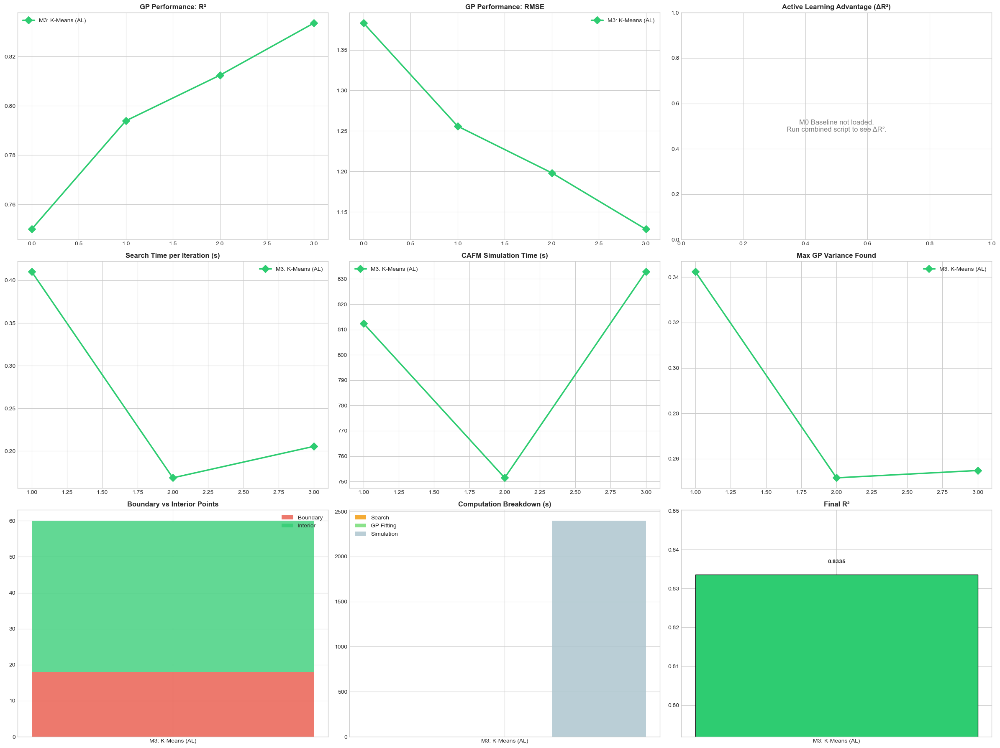

In [3]:
"""
STANDALONE M3 RUNNER: K-Means Pool-Based Active Learning
================================================================================
Runs only M3 and saves the results in the exact same format as your previous 
M0, M1, and M2 runs for easy combination later.
"""

import sys
import time
import warnings
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import qmc
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from sklearn.metrics import r2_score, mean_squared_error
from datetime import datetime

sys.path.append(r"D:\KIT\social_force_model")
from run_batch import single_run

warnings.filterwarnings("ignore")
plt.style.use('seaborn-v0_8-whitegrid')

# ======================================================================
# GLOBAL CONFIGURATION
# ======================================================================
DATA_PATH            = r"D:\KIT\social_force_model\cafm_qmc_new_dataset_256x10.npz"
PARAM_NAMES          = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]
TARGET_IDX           = 0
N_ITERATIONS         = 3
N_REPS               = 10
POINTS_PER_ITERATION = 20
NOISE_FLOOR          = 1e-2

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}

lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])

# ======================================================================
# DATA LOADING (0.6 Test Split)
# ======================================================================
def load_initial_data(data_path, target_idx=0, test_ratio=0.6, seed=42):
    data  = np.load(data_path)
    X     = data["X"]
    y     = data["Y"][:, target_idx]
    y_std = data["Y_std"][:, target_idx]

    valid = ~np.isnan(y)
    X, y, y_std = X[valid], y[valid], y_std[valid]

    np.random.seed(seed)
    n_total   = len(X)
    n_test    = int(n_total * test_ratio)
    test_idx  = np.random.choice(n_total, n_test, replace=False)
    train_idx = np.setdiff1d(np.arange(n_total), test_idx)

    X_train  = X[train_idx];  y_train  = y[train_idx];  ys_train = y_std[train_idx]
    X_test   = X[test_idx];   y_test   = y[test_idx];   ys_test  = y_std[test_idx]

    print(f"\n{'='*80}")
    print("DATA SPLIT  (seed=42 — fixed for ALL methods)")
    print(f"{'='*80}")
    print(f"Total valid  : {n_total}")
    print(f"Train set    : {len(train_idx)} pts (40%)")
    print(f"Test set     : {len(test_idx)} pts (60%)  ← FIXED, never changes")
    print(f"Budget       : {N_ITERATIONS} iters × {POINTS_PER_ITERATION} pts = {N_ITERATIONS*POINTS_PER_ITERATION} new simulations")

    return X_train, y_train, ys_train, X_test, y_test, ys_test

# ======================================================================
# GP TRAINING  (IDENTICAL across all methods)
# ======================================================================
def train_surrogate(X, y, y_std, n_restarts=5):
    t0 = time.time()

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()
    Xs = scaler_X.fit_transform(X)
    ys = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

    y_var_s  = (y_std / scaler_y.scale_[0]) ** 2
    alpha_s  = np.clip(y_var_s, NOISE_FLOOR, None)

    kernel = (
        C(1.0, (1e-3, 1e3)) *
        Matern(length_scale=[0.5, 0.5, 1.0, 0.5, 0.3, 0.5],
               length_scale_bounds=[(1e-3, 15)] * 6,
               nu=2.5)
    )
    gp = GaussianProcessRegressor(
        kernel=kernel, alpha=alpha_s,
        n_restarts_optimizer=n_restarts,
        random_state=42, normalize_y=False
    )
    gp.fit(Xs, ys)

    return {"model": gp, "scaler_X": scaler_X, "scaler_y": scaler_y, "fitting_time": time.time() - t0}

def evaluate_gp(gp_dict, X_test, y_test):
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    yp_s, ys_s = gp.predict(sX.transform(X_test), return_std=True)
    y_pred = sy.inverse_transform(yp_s.reshape(-1, 1)).ravel()
    return {
        "r2"         : r2_score(y_test, y_pred),
        "rmse"       : np.sqrt(mean_squared_error(y_test, y_pred)),
        "predictions": y_pred,
        "std"        : ys_s * sy.scale_[0]
    }

def analyze_boundaries(x_batch, threshold=0.05):
    if len(x_batch) == 0: return 0, 0, 0.0
    xn   = (x_batch - lowers) / (uppers - lowers)
    dmin = np.min(np.minimum(xn, 1 - xn), axis=1)
    bnd  = int(np.sum(dmin < threshold))
    return bnd, len(x_batch) - bnd, float(np.mean(dmin))

# ======================================================================
# SIMULATION
# ======================================================================
def simulate_batch(x_batch, base_seed=1000):
    t0 = time.time()
    ym, ys = [], []
    n = len(x_batch)
    for i, x in enumerate(x_batch):
        pd_ = {name: float(x[j]) for j, name in enumerate(PARAM_NAMES)}
        reps = []
        for r in range(N_REPS):
            try:
                reps.append(single_run(pd_, base_seed + i*100 + r)[TARGET_IDX])
            except Exception:
                reps.append(np.nan)
        ym.append(np.nanmean(reps))
        ys.append(np.nanstd(reps))
        if (i+1) % 5 == 0 or (i+1) == n:
            el  = time.time() - t0
            rem = el / (i+1) * (n - i - 1)
            print(f"    [{i+1}/{n}]  elapsed {el/60:.1f}min  remaining ~{rem/60:.1f}min")
    return np.array(ym), np.array(ys), time.time() - t0

def _make_results(X_init, y_init, ys_init):
    return {
        'X_train'             : [X_init.copy()],
        'y_train'             : [y_init.copy()],
        'y_std_train'         : [ys_init.copy()],
        'r2_history'          : [],
        'rmse_history'        : [],
        'search_time_history' : [],
        'sim_time_history'    : [],
        'fit_time_history'    : [],
        'boundary_pts_history': [],
        'interior_pts_history': [],
        'avg_dist_to_boundary': [],
        'found_variance_max'  : [],
        'found_variance_mean' : [],
    }

# ======================================================================
# METHOD 3 – K-MEANS POOL (The Target Algorithm)
# ======================================================================
def method3_kmeans_pool(gp_dict, n_candidates=30000, n_select=POINTS_PER_ITERATION, pool_size=1000):
    t0 = time.time()
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    
    # 1. Massive Grid Generation
    sampler = qmc.Sobol(d=6, scramble=True, seed=77)
    cand = qmc.scale(sampler.random(n_candidates), lowers, uppers)
    
    # 2. Vectorized Variance Prediction
    _, std_s = gp.predict(sX.transform(cand), return_std=True)
    var = (std_s * sy.scale_[0]) ** 2
    
    # 3. Filter top 1000 high-variance points
    top_idx = np.argsort(var)[::-1][:pool_size]
    high_var_cand = cand[top_idx]
    
    # 4. Scale candidates to [0,1] for fair Euclidean K-Means distances
    cand_norm = (high_var_cand - lowers) / (uppers - lowers)
    
    # 5. Execute K-Means to find 20 uniform geometric centers
    kmeans = KMeans(n_clusters=n_select, random_state=42, n_init='auto')
    kmeans.fit(cand_norm)
    
    # 6. Revert [0,1] centers back to actual physical parameters
    batch_points = (kmeans.cluster_centers_ * (uppers - lowers)) + lowers
    
    return batch_points, time.time() - t0

# ======================================================================
# ONE-METHOD RUNNER
# ======================================================================
def run_one_method(method_name, X_tr, y_tr, ys_tr, X_te, y_te, ys_te,
                   initial_r2, initial_rmse, initial_fit_time):
    
    print(f"\n{'='*80}\nRUNNING: {method_name}\n{'='*80}")
    res = _make_results(X_tr, y_tr, ys_tr)
    res['r2_history'].append(initial_r2)
    res['rmse_history'].append(initial_rmse)
    res['fit_time_history'].append(initial_fit_time)

    X_cur, y_cur, ys_cur = X_tr.copy(), y_tr.copy(), ys_tr.copy()

    for iteration in range(1, N_ITERATIONS + 1):
        print(f"\n{'─'*60}\n  {method_name}  |  Iteration {iteration}/{N_ITERATIONS}\n{'─'*60}")

        print(f"  Training GP on {len(X_cur)} points …")
        gp_dict  = train_surrogate(X_cur, y_cur, ys_cur)
        fit_time = gp_dict['fitting_time']
        print(f"    fit time : {fit_time:.2f}s")

        # Exclusively running M3
        x_new, search_time = method3_kmeans_pool(gp_dict)

        print(f"    search time : {search_time:.2f}s  |  found {len(x_new)} points")

        bnd, intr, avg_d = analyze_boundaries(x_new)
        bnd_pct = bnd / len(x_new) * 100 if len(x_new) else 0
        print(f"    boundary  : {bnd}/{len(x_new)} ({bnd_pct:.0f}%)")
        print(f"    interior  : {intr}/{len(x_new)} ({100-bnd_pct:.0f}%)")
        print(f"    avg dist  : {avg_d:.4f}")

        if len(x_new):
            xs_new  = gp_dict['scaler_X'].transform(x_new)
            _, st   = gp_dict['model'].predict(xs_new, return_std=True)
            var_new = (st * gp_dict['scaler_y'].scale_[0]) ** 2
            vmax, vmean = float(var_new.max()), float(var_new.mean())
        else:
            vmax = vmean = 0.0
            
        print(f"    var max   : {vmax:.6f}\n    var mean  : {vmean:.6f}")
        res['found_variance_max'].append(vmax)
        res['found_variance_mean'].append(vmean)

        print(f"  Running CAFM: {len(x_new)} pts × {N_REPS} reps …")
        y_new, ys_new, sim_time = simulate_batch(x_new, base_seed=3000 + iteration * 100)
        print(f"    sim time : {sim_time:.1f}s  ({sim_time/len(x_new):.1f}s/pt)")
        print(f"    y mean   : {np.nanmean(y_new):.4f} ± {np.nanmean(ys_new):.4f}")

        X_cur  = np.vstack([X_cur, x_new])
        y_cur  = np.append(y_cur,  y_new)
        ys_cur = np.append(ys_cur, ys_new)

        res['X_train'].append(X_cur.copy())
        res['y_train'].append(y_cur.copy())
        res['y_std_train'].append(ys_cur.copy())

        print(f"  Retraining GP on {len(X_cur)} points …")
        gp_fin = train_surrogate(X_cur, y_cur, ys_cur)
        ev     = evaluate_gp(gp_fin, X_te, y_te)
        print(f"    R²   : {ev['r2']:.4f}  (Δ {ev['r2']-res['r2_history'][-1]:+.4f})")
        print(f"    RMSE : {ev['rmse']:.4f}  (Δ {ev['rmse']-res['rmse_history'][-1]:+.4f})")

        res['r2_history'].append(ev['r2'])
        res['rmse_history'].append(ev['rmse'])
        res['search_time_history'].append(search_time)
        res['sim_time_history'].append(sim_time)
        res['fit_time_history'].append(fit_time)
        res['boundary_pts_history'].append(bnd)
        res['interior_pts_history'].append(intr)
        res['avg_dist_to_boundary'].append(avg_d)

    print(f"\n  ✓ {method_name} COMPLETE")
    print(f"    Final R²   : {res['r2_history'][-1]:.4f}")
    print(f"    Final RMSE : {res['rmse_history'][-1]:.4f}")
    print(f"    Data size  : {len(res['X_train'][-1])}")

    return res

# ======================================================================
# SAFE PLOTTING (Ignores M0 if not present)
# ======================================================================
colors = {'M3_KMeans_Pool': '#2ecc71'}
markers = {'M3_KMeans_Pool': 'D'}
linestyles = {'M3_KMeans_Pool': '-'}
labels = {'M3_KMeans_Pool': 'M3: K-Means (AL)'}

def plot_all(results, save_path='M3_KMeans_Only.png'):
    iters   = np.arange(0, N_ITERATIONS + 1)
    iters_s = np.arange(1, N_ITERATIONS + 1)
    fig, axes = plt.subplots(3, 3, figsize=(24, 18))
    mnames = list(results.keys())

    def _line(ax, name, data, x):
        ax.plot(x, data, color=colors[name], marker=markers[name],
                linestyle=linestyles[name], linewidth=2.5, markersize=9, label=labels[name])

    # 1: R²
    for n, d in results.items(): _line(axes[0, 0], n, d['r2_history'], iters)
    axes[0, 0].set_title('GP Performance: R²', fontweight='bold'); axes[0, 0].legend()

    # 2: RMSE
    for n, d in results.items(): _line(axes[0, 1], n, d['rmse_history'], iters)
    axes[0, 1].set_title('GP Performance: RMSE', fontweight='bold'); axes[0, 1].legend()

    # 3: ΔR² vs baseline (Skipped safely if M0 missing)
    if 'M0_Random_Baseline' in results:
        base_r2 = results['M0_Random_Baseline']['r2_history']
        for n, d in results.items():
            if n == 'M0_Random_Baseline': continue
            delta = [d['r2_history'][i] - base_r2[i] for i in range(N_ITERATIONS+1)]
            axes[0, 2].plot(iters, delta, color=colors[n], marker=markers[n], lw=2.5, ms=9, label=labels[n])
        axes[0, 2].axhline(0, color='gray', linestyle='--')
        axes[0, 2].legend()
    else:
        axes[0, 2].text(0.5, 0.5, 'M0 Baseline not loaded.\nRun combined script to see ΔR².', 
                        ha='center', va='center', transform=axes[0, 2].transAxes, color='gray', fontsize=12)
    axes[0, 2].set_title('Active Learning Advantage (ΔR²)', fontweight='bold')

    # 4: Search time
    for n, d in results.items(): _line(axes[1, 0], n, d['search_time_history'], iters_s)
    axes[1, 0].set_title('Search Time per Iteration (s)', fontweight='bold'); axes[1, 0].legend()

    # 5: Simulation time
    for n, d in results.items(): _line(axes[1, 1], n, d['sim_time_history'], iters_s)
    axes[1, 1].set_title('CAFM Simulation Time (s)', fontweight='bold'); axes[1, 1].legend()

    # 6: Max variance
    for n, d in results.items(): _line(axes[1, 2], n, d['found_variance_max'], iters_s)
    axes[1, 2].set_title('Max GP Variance Found', fontweight='bold'); axes[1, 2].legend()

    # 7: Boundary vs Interior
    x_pos = np.arange(len(mnames))
    t_bnd = [sum(results[n]['boundary_pts_history']) for n in mnames]
    t_int = [sum(results[n]['interior_pts_history']) for n in mnames]
    axes[2, 0].bar(x_pos, t_bnd, 0.5, label='Boundary', color='#e74c3c', alpha=0.75)
    axes[2, 0].bar(x_pos, t_int, 0.5, bottom=t_bnd, label='Interior', color='#2ecc71', alpha=0.75)
    axes[2, 0].set_xticks(x_pos); axes[2, 0].set_xticklabels([labels[n] for n in mnames])
    axes[2, 0].set_title('Boundary vs Interior Points', fontweight='bold'); axes[2, 0].legend()

    # 8: Compute Breakdown
    w = 0.25
    ts = [sum(results[n]['search_time_history']) for n in mnames]
    tf = [sum(results[n]['fit_time_history']) for n in mnames]
    tm = [sum(results[n]['sim_time_history']) for n in mnames]
    axes[2, 1].bar(x_pos-w, ts, w, label='Search', color='#f39c12', alpha=0.85)
    axes[2, 1].bar(x_pos, tf, w, label='GP Fitting', color='#77DD77', alpha=0.85)
    axes[2, 1].bar(x_pos+w, tm, w, label='Simulation', color='#AEC6CF', alpha=0.85)
    axes[2, 1].set_xticks(x_pos); axes[2, 1].set_xticklabels([labels[n] for n in mnames])
    axes[2, 1].set_title('Computation Breakdown (s)', fontweight='bold'); axes[2, 1].legend()

    # 9: Final R²
    final_r2 = [results[n]['r2_history'][-1] for n in mnames]
    bars = axes[2, 2].bar(x_pos, final_r2, color=[colors[n] for n in mnames], edgecolor='black')
    for bar, val in zip(bars, final_r2):
        axes[2, 2].text(bar.get_x() + bar.get_width()/2, val + 0.003, f'{val:.4f}', ha='center', fontweight='bold')
    axes[2, 2].set_xticks(x_pos); axes[2, 2].set_xticklabels([labels[n] for n in mnames])
    axes[2, 2].set_title('Final R²', fontweight='bold')
    axes[2, 2].set_ylim(min(final_r2)*0.95, max(final_r2)*1.02)

    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"\n✓ Plot saved → {save_path}")

# ======================================================================
# MAIN
# ======================================================================
if __name__ == "__main__":
    t_global = time.time()
    print("="*80)
    print("STANDALONE RUN: M3 (K-Means Pool-Based Active Learning)")
    print(f"Start : {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
    print("="*80)

    X_tr, y_tr, ys_tr, X_te, y_te, ys_te = load_initial_data(DATA_PATH)

    print(f"\n{'='*80}\nITERATION 0  —  INITIAL GP\n{'='*80}")
    gp0 = train_surrogate(X_tr, y_tr, ys_tr)
    ev0 = evaluate_gp(gp0, X_te, y_te)
    i0_r2, i0_rm, i0_ft = ev0['r2'], ev0['rmse'], gp0['fitting_time']

    print(f"  Train pts : {len(X_tr)}\n  Fit time  : {i0_ft:.2f}s")
    print(f"  Test R²   : {i0_r2:.4f}\n  Test RMSE : {i0_rm:.4f}")

    all_results = {}
    method_name = 'M3_KMeans_Pool'
    
    res = run_one_method(method_name, X_tr, y_tr, ys_tr, X_te, y_te, ys_te, i0_r2, i0_rm, i0_ft)
    all_results[method_name] = res

    # Save results specifically for M3
    ts = datetime.now().strftime("%Y%m%d_%H%M%S")
    pkl = f'{method_name}_results_{ts}.pkl'
    with open(pkl, 'wb') as f:
        pickle.dump({'results': {method_name: res}, 'X_test': X_te, 'y_test': y_te}, f)
    print(f"\n✓ Saved M3 checkpoint → {pkl}")

    plot_all(all_results, save_path=f'{method_name}_plot_{ts}.png')

    total = time.time() - t_global
    print(f"\n{'='*80}\nALL DONE")
    print(f"  Total time : {total/3600:.2f} hrs ({total/60:.1f} min)")
    print(f"  End        : {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n{'='*80}")

## Comparision Plots

Loading 'M0: Random Baseline' from combined_M0_M1_M2_results_20260716_034836.pkl...
Loading 'M1: Sobol Grid' from combined_M0_M1_M2_results_20260716_034836.pkl...
Loading 'M2: MultiStart (20)' from combined_M0_M1_M2_results_20260716_034836.pkl...
Loading 'M2: MultiStart (50)' from M2_MultiStart_results_20260716_150855.pkl...
Loading 'M3: K-Means Pool' from M3_KMeans_Pool_results_20260716_165449.pkl...


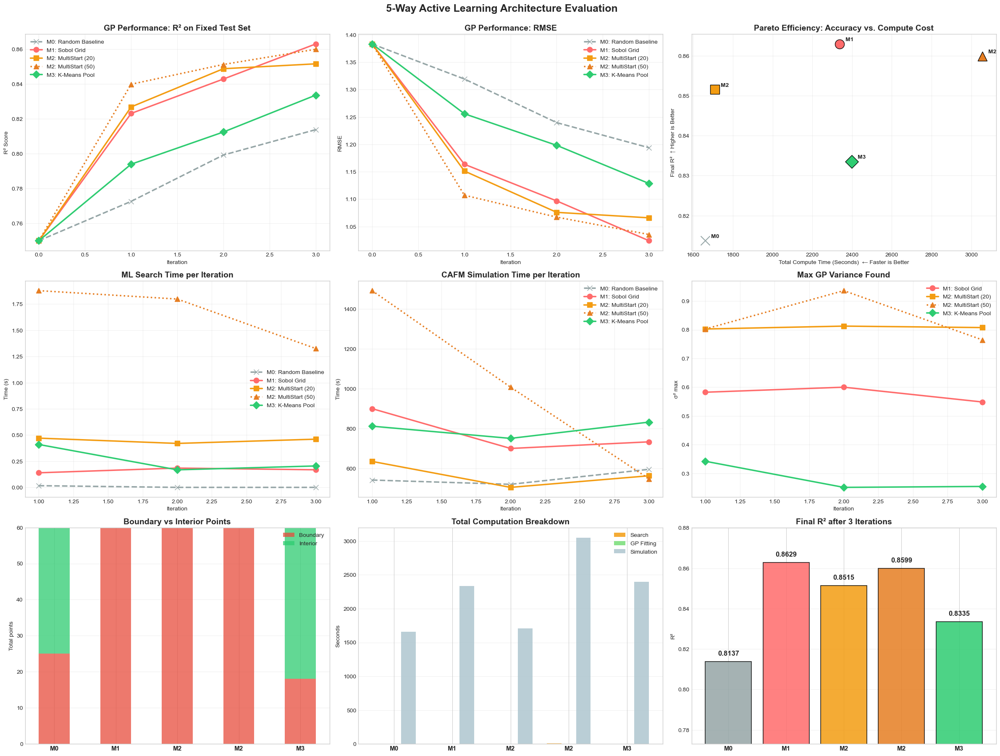


✓ Plot saved → Ultimate_5Way_Comparison.png

FINAL COMPARISON SUMMARY
             Method Final R² Total Time (s)  Boundary Points  Interior Points
M0: Random Baseline   0.8137         1661.8               25               35
     M1: Sobol Grid   0.8629         2337.0               60                0
M2: MultiStart (20)   0.8515         1708.9               60                0
M2: MultiStart (50)   0.8599         3054.7               60                0
   M3: K-Means Pool   0.8335         2398.9               18               42


In [4]:
"""
ULTIMATE 5-WAY PKL MERGER & PARETO PLOTTER
================================================================================
Compares M0, M1, M2 (n=20), M2 (n=50), and M3 (K-Means).
Generates the 9-panel plot including a Pareto Efficiency comparison.
"""

import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ======================================================================
# 1. FILE CONFIGURATION (UPDATE THESE WITH YOUR ACTUAL FILENAMES)
# ======================================================================
# Format: "Custom Display Name": ("filename.pkl", "Internal_Method_Key")
FILES_AND_LABELS = {
    'M0: Random Baseline' : ("combined_M0_M1_M2_results_20260716_034836.pkl", "M0_Random_Baseline"),
    'M1: Sobol Grid'      : ("combined_M0_M1_M2_results_20260716_034836.pkl", "M1_Sobol_Grid"),
    'M2: MultiStart (20)' : ("combined_M0_M1_M2_results_20260716_034836.pkl", "M2_MultiStart"),
    'M2: MultiStart (50)' : ("M2_MultiStart_results_20260716_150855.pkl", "M2_MultiStart"),
    'M3: K-Means Pool'    : ("M3_KMeans_Pool_results_20260716_165449.pkl", "M3_KMeans_Pool")
}

N_ITERATIONS = 3

# ======================================================================
# 2. PLOTTING CONFIGURATION
# ======================================================================
colors = {
    'M0: Random Baseline' : '#95a5a6', # Gray
    'M1: Sobol Grid'      : '#FF6B6B', # Red
    'M2: MultiStart (20)' : '#f39c12', # Orange
    'M2: MultiStart (50)' : '#e67e22', # Darker Orange
    'M3: K-Means Pool'    : '#2ecc71'  # Green
}
markers = {
    'M0: Random Baseline' : 'x',
    'M1: Sobol Grid'      : 'o',
    'M2: MultiStart (20)' : 's',
    'M2: MultiStart (50)' : '^',
    'M3: K-Means Pool'    : 'D'
}
linestyles = {
    'M0: Random Baseline' : '--',
    'M1: Sobol Grid'      : '-',
    'M2: MultiStart (20)' : '-',
    'M2: MultiStart (50)' : ':',
    'M3: K-Means Pool'    : '-'
}

# ======================================================================
# 3. MERGE LOGIC
# ======================================================================
def load_custom_data():
    combined_results = {}
    for display_name, (file_path, internal_key) in FILES_AND_LABELS.items():
        print(f"Loading '{display_name}' from {file_path}...")
        try:
            with open(file_path, 'rb') as f:
                data = pickle.load(f)
                res = data['results']
                if internal_key in res:
                    combined_results[display_name] = res[internal_key]
                else:
                    print(f"  [!] Key '{internal_key}' not found in {file_path}.")
        except Exception as e:
            print(f"  [!] Error loading {file_path}: {e}")
    return combined_results

# ======================================================================
# 4. PLOTTING FUNCTION
# ======================================================================
def plot_all(results, save_path='Ultimate_5Way_Comparison.png'):
    iters   = np.arange(0, N_ITERATIONS + 1)
    iters_s = np.arange(1, N_ITERATIONS + 1)
    fig, axes = plt.subplots(3, 3, figsize=(24, 18))
    mnames = list(results.keys())

    def _line(ax, name, data, x):
        ax.plot(x, data, color=colors[name], marker=markers[name],
                linestyle=linestyles[name], linewidth=2.5, markersize=9, label=name)

    # 1: R²
    for n in mnames: _line(axes[0, 0], n, results[n]['r2_history'], iters)
    axes[0, 0].set_title('GP Performance: R² on Fixed Test Set', fontweight='bold', fontsize=14)
    axes[0, 0].set_xlabel('Iteration'); axes[0, 0].set_ylabel('R² Score')
    axes[0, 0].legend(); axes[0, 0].grid(True, alpha=0.3)

    # 2: RMSE
    for n in mnames: _line(axes[0, 1], n, results[n]['rmse_history'], iters)
    axes[0, 1].set_title('GP Performance: RMSE', fontweight='bold', fontsize=14)
    axes[0, 1].set_xlabel('Iteration'); axes[0, 1].set_ylabel('RMSE')
    axes[0, 1].legend(); axes[0, 1].grid(True, alpha=0.3)

    # 3: PARETO EFFICIENCY (Total Compute Time vs Final R²)
    ax = axes[0, 2]
    for n in mnames:
        total_time = sum(results[n]['search_time_history']) + sum(results[n]['sim_time_history']) + sum(results[n]['fit_time_history'])
        final_r2 = results[n]['r2_history'][-1]
        ax.scatter(total_time, final_r2, color=colors[n], marker=markers[n], s=250, edgecolors='black', label=n)
        ax.annotate(n.split(':')[0], (total_time, final_r2), xytext=(10, 5), textcoords='offset points', fontweight='bold')
    ax.set_title('Pareto Efficiency: Accuracy vs. Compute Cost', fontweight='bold', fontsize=14)
    ax.set_xlabel('Total Compute Time (Seconds)  ← Faster is Better'); ax.set_ylabel('Final R²  ↑ Higher is Better')
    ax.grid(True, alpha=0.3)

    # 4: Search time
    for n in mnames: _line(axes[1, 0], n, results[n]['search_time_history'], iters_s)
    axes[1, 0].set_title('ML Search Time per Iteration', fontweight='bold', fontsize=14)
    axes[1, 0].set_xlabel('Iteration'); axes[1, 0].set_ylabel('Time (s)')
    axes[1, 0].legend(); axes[1, 0].grid(True, alpha=0.3)

    # 5: Simulation time
    for n in mnames: _line(axes[1, 1], n, results[n]['sim_time_history'], iters_s)
    axes[1, 1].set_title('CAFM Simulation Time per Iteration', fontweight='bold', fontsize=14)
    axes[1, 1].set_xlabel('Iteration'); axes[1, 1].set_ylabel('Time (s)')
    axes[1, 1].legend(); axes[1, 1].grid(True, alpha=0.3)

    # 6: Max variance
    for n in mnames:
        if 'Random' in n: continue
        _line(axes[1, 2], n, results[n]['found_variance_max'], iters_s)
    axes[1, 2].set_title('Max GP Variance Found', fontweight='bold', fontsize=14)
    axes[1, 2].set_xlabel('Iteration'); axes[1, 2].set_ylabel('σ² max')
    axes[1, 2].legend(); axes[1, 2].grid(True, alpha=0.3)

    # 7: Boundary vs Interior stacked bar
    x_pos = np.arange(len(mnames))
    t_bnd = [sum(results[n]['boundary_pts_history']) for n in mnames]
    t_int = [sum(results[n]['interior_pts_history']) for n in mnames]
    axes[2, 0].bar(x_pos, t_bnd, 0.5, label='Boundary', color='#e74c3c', alpha=0.75)
    axes[2, 0].bar(x_pos, t_int, 0.5, bottom=t_bnd, label='Interior', color='#2ecc71', alpha=0.75)
    axes[2, 0].set_xticks(x_pos); axes[2, 0].set_xticklabels([n.split(':')[0] for n in mnames], fontsize=11, fontweight='bold')
    axes[2, 0].set_title('Boundary vs Interior Points', fontweight='bold', fontsize=14)
    axes[2, 0].set_ylabel('Total points'); axes[2, 0].legend(); axes[2, 0].grid(axis='y', alpha=0.3)

    # 8: Cumulative time breakdown
    w = 0.25
    ts = [sum(results[n]['search_time_history']) for n in mnames]
    tf = [sum(results[n]['fit_time_history']) for n in mnames]
    tm = [sum(results[n]['sim_time_history']) for n in mnames]
    axes[2, 1].bar(x_pos-w, ts, w, label='Search', color='#f39c12', alpha=0.85)
    axes[2, 1].bar(x_pos, tf, w, label='GP Fitting', color='#77DD77', alpha=0.85)
    axes[2, 1].bar(x_pos+w, tm, w, label='Simulation', color='#AEC6CF', alpha=0.85)
    axes[2, 1].set_xticks(x_pos); axes[2, 1].set_xticklabels([n.split(':')[0] for n in mnames], fontsize=11, fontweight='bold')
    axes[2, 1].set_title('Total Computation Breakdown', fontweight='bold', fontsize=14)
    axes[2, 1].set_ylabel('Seconds'); axes[2, 1].legend(); axes[2, 1].grid(axis='y', alpha=0.3)

    # 9: Final R² bar
    final_r2 = [results[n]['r2_history'][-1] for n in mnames]
    bcols = [colors[n] for n in mnames]
    bars = axes[2, 2].bar(x_pos, final_r2, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val in zip(bars, final_r2):
        axes[2, 2].text(bar.get_x() + bar.get_width()/2, val + 0.003, f'{val:.4f}', ha='center', fontsize=12, fontweight='bold')
    axes[2, 2].set_xticks(x_pos); axes[2, 2].set_xticklabels([n.split(':')[0] for n in mnames], fontsize=11, fontweight='bold')
    axes[2, 2].set_title(f'Final R² after {N_ITERATIONS} Iterations', fontweight='bold', fontsize=14)
    axes[2, 2].set_ylabel('R²'); axes[2, 2].set_ylim(min(final_r2)*0.95, max(final_r2)*1.02)
    axes[2, 2].grid(axis='y', alpha=0.3)

    plt.suptitle('5-Way Active Learning Architecture Evaluation', fontsize=18, fontweight='bold', y=0.998)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"\n✓ Plot saved → {save_path}")

# ======================================================================
# 5. SUMMARY TABLE
# ======================================================================
def print_final_summary(results):
    print(f"\n{'='*80}\nFINAL COMPARISON SUMMARY\n{'='*80}")
    mnames = list(results.keys())
    
    rows = []
    for n in mnames:
        d = results[n]
        tot_b = sum(d['boundary_pts_history'])
        tot_i = sum(d['interior_pts_history'])
        rows.append({
            'Method'           : n,
            'Final R²'         : f"{d['r2_history'][-1]:.4f}",
            'Total Time (s)'   : f"{sum(d['search_time_history'])+sum(d['sim_time_history'])+sum(d['fit_time_history']):.1f}",
            'Boundary Points'  : tot_b,
            'Interior Points'  : tot_i,
        })

    df = pd.DataFrame(rows)
    print(df.to_string(index=False))
    return df

# ======================================================================
# MAIN EXECUTION
# ======================================================================
if __name__ == "__main__":
    combined_results = load_custom_data()
    plot_all(combined_results)
    summary_df = print_final_summary(combined_results)
    summary_df.to_csv("Ultimate_5Way_Summary.csv", index=False)

## Easy level of plot and compare analysis

UNIVERSAL METRICS ANALYSIS

✓ Loaded 5 methods


C:\Users\100ra\AppData\Local\Temp\ipykernel_31220\1771714019.py:302: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(m['t_total_min'], m['final_r2'],
C:\Users\100ra\AppData\Local\Temp\ipykernel_31220\1771714019.py:490: UserWarning: Glyph 9322 (\N{CIRCLED NUMBER ELEVEN}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path, dpi=300, bbox_inches='tight')
C:\Users\100ra\AppData\Local\Temp\ipykernel_31220\1771714019.py:490: UserWarning: Glyph 129351 (\N{FIRST PLACE MEDAL}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path, dpi=300, bbox_inches='tight')
C:\Users\100ra\AppData\Local\Temp\ipykernel_31220\1771714019.py:490: UserWarning: Glyph 129352 (\N{SECOND PLACE MEDAL}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path, dpi=300, bbox_inches='tight')
C:\Users\100ra\AppData\Local\Temp\ipykernel_31220\1771714019.py:4

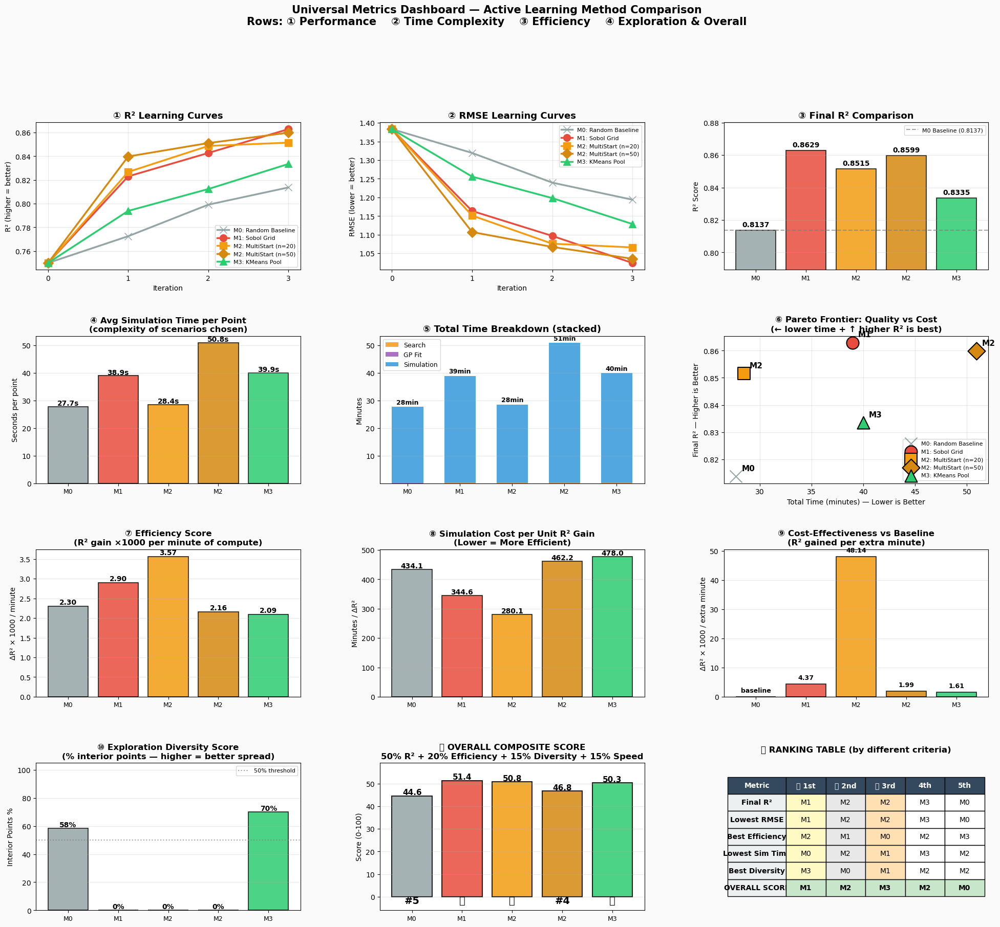


✓ Universal dashboard → universal_metrics_dashboard.png

EASY-TO-UNDERSTAND SUMMARY (for non-experts)

📊 THE STORY OF EACH METHOD:
--------------------------------------------------------------------------------

M0: Random Baseline
  M0 is like throwing darts blindfolded — it picks 20 random spots each time. It doesn't need any brain (no GP thinking), just sim time. Result: Slowest to learn but consistent.
  📈 R² gain      : +0.0638 (from 0.7500)
  ⏱  Total time   : 27.7 minutes
  💰 Efficiency   : 2.30 R² per 1000 minutes
  🎯 Diversity    : 58% interior points
  ⭐ Overall Score: 44.6/100

M1: Sobol Grid
  M1 evaluates 30,000 candidate spots and picks the 20 highest-uncertainty. Like a smart student always picking the hardest problems. Result: Best final grade (R²), but takes longer to solve those hard problems.
  📈 R² gain      : +0.1130 (from 0.7500)
  ⏱  Total time   : 39.0 minutes
  💰 Efficiency   : 2.90 R² per 1000 minutes
  🎯 Diversity    : 0% interior points
  ⭐ Overall Score: 

In [1]:
"""
UNIVERSAL COMPARISON METRICS + LAYPERSON-FRIENDLY VISUALIZATION
=================================================================
Advanced metrics that make method comparison easy to understand.

Creates 12-panel analysis with:
1. Standard performance metrics
2. Efficiency ratios (R²/time, R²/point)
3. Cost-effectiveness scores
4. Universal ranking system
5. Non-expert friendly visualizations
"""

import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch, FancyBboxPatch
from matplotlib.gridspec import GridSpec
import matplotlib.colors as mcolors

# ======================================================================
# CONFIGURATION
# ======================================================================
N_ITERATIONS         = 3
POINTS_PER_ITERATION = 20
INITIAL_POINTS       = 103

PKL_FILES = {
    'M0_Random'  : "M0_Random_Baseline_results_20260716_024107.pkl",
    'M1_Sobol'   : "M1_Sobol_Grid_results_20260716_032006.pkl",
    'M2_n20'     : "M2_MultiStart_results_20260716_034836.pkl",
    'M2_n50'     : "M2_MultiStart_results_20260716_150855.pkl",
    'M3_KMeans'  : "M3_KMeans_Pool_results_20260716_165449.pkl",
}

PKL_INTERNAL_KEY = {
    'M0_Random': 'M0_Random_Baseline',
    'M1_Sobol' : 'M1_Sobol_Grid',
    'M2_n20'   : 'M2_MultiStart',
    'M2_n50'   : 'M2_MultiStart',
    'M3_KMeans': 'M3_KMeans_Pool',
}

LABELS = {
    'M0_Random' : 'M0: Random Baseline',
    'M1_Sobol'  : 'M1: Sobol Grid',
    'M2_n20'    : 'M2: MultiStart (n=20)',
    'M2_n50'    : 'M2: MultiStart (n=50)',
    'M3_KMeans' : 'M3: KMeans Pool',
}

COLORS = {
    'M0_Random' : '#95a5a6',
    'M1_Sobol'  : '#e74c3c',
    'M2_n20'    : '#f39c12',
    'M2_n50'    : '#d68910',
    'M3_KMeans' : '#2ecc71',
}

MARKERS = {
    'M0_Random': 'x', 'M1_Sobol': 'o',
    'M2_n20'   : 's', 'M2_n50' : 'D', 'M3_KMeans': '^',
}

# ======================================================================
# LOAD DATA
# ======================================================================
def load_all():
    data = {}
    for k, f in PKL_FILES.items():
        try:
            with open(f, 'rb') as fp:
                ckpt = pickle.load(fp)
            ik = PKL_INTERNAL_KEY[k]
            if ik in ckpt['results']:
                data[k] = ckpt['results'][ik]
            else:
                data[k] = list(ckpt['results'].values())[0]
        except Exception as e:
            print(f"  ✗ {k}: {e}")
    return data

# ======================================================================
# COMPUTE UNIVERSAL METRICS
# ======================================================================
def compute_metrics(all_data):
    """
    Compute all metrics for each method.
    Returns dict of dicts.
    """
    metrics = {}
    base_r2 = all_data['M0_Random']['r2_history'][-1]

    for k, d in all_data.items():
        r2_init  = d['r2_history'][0]
        r2_final = d['r2_history'][-1]
        rm_final = d['rmse_history'][-1]

        # Time metrics (seconds)
        t_search = sum(d['search_time_history'])
        t_sim    = sum(d['sim_time_history'])
        t_fit    = sum(d['fit_time_history'])
        t_total  = t_search + t_sim + t_fit

        # Improvement metrics
        r2_gain  = r2_final - r2_init
        rmse_gain = d['rmse_history'][0] - rm_final

        # Coverage
        tot_b = sum(d['boundary_pts_history'])
        tot_i = sum(d['interior_pts_history'])
        bnd_pct = tot_b/(tot_b+tot_i)*100 if tot_b+tot_i > 0 else 0

        # ── ADVANCED METRICS ─────────────────────────────────────
        # 1. Efficiency Score: R² gain per minute of computation
        efficiency = r2_gain / (t_total/60) if t_total > 0 else 0

        # 2. Simulation Cost Score: Sim time per unit R² improvement
        # LOWER is better
        sim_cost = (t_sim/60) / r2_gain if r2_gain > 0 else float('inf')

        # 3. Value Score: R² improvement per simulation point
        val_per_pt = r2_gain / (N_ITERATIONS*POINTS_PER_ITERATION)

        # 4. Speedup vs baseline
        base_time = sum(all_data['M0_Random']['sim_time_history'])
        speedup   = base_time / t_sim if t_sim > 0 else 0

        # 5. Advantage vs baseline
        advantage = r2_final - base_r2

        # 6. Cost-Effectiveness Ratio: 
        # (R² gained) / (extra time vs baseline)
        # Higher = more R² gained per extra minute spent
        extra_time_min = (t_total - sum(all_data['M0_Random']['search_time_history']) 
                          - sum(all_data['M0_Random']['fit_time_history'])
                          - sum(all_data['M0_Random']['sim_time_history'])) / 60
        if abs(extra_time_min) < 0.1:
            cost_eff = float('inf')  # essentially free
        else:
            cost_eff = advantage / extra_time_min if extra_time_min > 0 else -1

        # 7. Exploration Diversity Score (0-100)
        # Higher = better spread of interior points
        diversity = 100 - bnd_pct  # inverse of boundary %

        # 8. Overall Score (weighted composite)
        # Weight: R²(50%) + Efficiency(20%) + Diversity(15%) + Speed(15%)
        norm_r2  = (r2_final - 0.75) / 0.15  # normalize to ~0-1
        norm_eff = min(efficiency*100, 1.0)   # cap at 1
        norm_div = diversity / 100
        norm_spd = 1.0 - (t_total / 5000)     # normalize
        norm_spd = max(0, min(1, norm_spd))
        
        overall = (0.50 * norm_r2 + 
                   0.20 * norm_eff + 
                   0.15 * norm_div + 
                   0.15 * norm_spd) * 100

        metrics[k] = {
            'label'          : LABELS[k],
            'final_r2'       : r2_final,
            'final_rmse'     : rm_final,
            'r2_gain'        : r2_gain,
            'rmse_gain'      : rmse_gain,
            'advantage'      : advantage,
            't_search'       : t_search,
            't_sim'          : t_sim,
            't_fit'          : t_fit,
            't_total'        : t_total,
            't_total_min'    : t_total/60,
            'boundary_pct'   : bnd_pct,
            'efficiency'     : efficiency,       # R²/min
            'sim_cost'       : sim_cost,          # min/R² gain
            'val_per_pt'     : val_per_pt,        # R²/point
            'cost_eff'       : cost_eff,          # R² per extra min
            'diversity'      : diversity,         # 0-100
            'speedup'        : speedup,           # ratio
            'overall_score'  : overall,           # 0-100
        }

    return metrics

# ======================================================================
# HELPER: format infinity for display
# ======================================================================
def _fmt(val, fmt='.4f'):
    if val == float('inf') or val == float('-inf'):
        return "∞"
    if isinstance(val, float) and np.isnan(val):
        return "N/A"
    return f"{val:{fmt}}"

# ======================================================================
# COMPREHENSIVE 12-PANEL PLOT
# ======================================================================
def plot_comprehensive(all_data, metrics, save_path='universal_metrics.png'):
    keys    = list(all_data.keys())
    iters   = np.arange(0, N_ITERATIONS + 1)
    iters_s = np.arange(1, N_ITERATIONS + 1)
    x_pos   = np.arange(len(keys))

    fig = plt.figure(figsize=(24, 20))
    fig.patch.set_facecolor('#fafafa')
    gs  = GridSpec(4, 3, figure=fig, hspace=0.45, wspace=0.30)

    # ══════════════════════════════════════════════════════════════
    # ROW 1: BASIC PERFORMANCE
    # ══════════════════════════════════════════════════════════════
    # ── 1: R² trajectory ──────────────────────────────────────────
    ax = fig.add_subplot(gs[0, 0])
    for k, d in all_data.items():
        ax.plot(iters, d['r2_history'],
                color=COLORS[k], marker=MARKERS[k],
                linewidth=2.5, markersize=10, label=LABELS[k])
    ax.set_title('① R² Learning Curves', fontweight='bold', fontsize=13)
    ax.set_xlabel('Iteration')
    ax.set_ylabel('R² (higher = better)')
    ax.legend(fontsize=8, loc='lower right')
    ax.grid(True, alpha=0.3)
    ax.set_xticks(iters)

    # ── 2: RMSE trajectory ────────────────────────────────────────
    ax = fig.add_subplot(gs[0, 1])
    for k, d in all_data.items():
        ax.plot(iters, d['rmse_history'],
                color=COLORS[k], marker=MARKERS[k],
                linewidth=2.5, markersize=10, label=LABELS[k])
    ax.set_title('② RMSE Learning Curves', fontweight='bold', fontsize=13)
    ax.set_xlabel('Iteration')
    ax.set_ylabel('RMSE (lower = better)')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)
    ax.set_xticks(iters)

    # ── 3: Final R² bar with baseline line ────────────────────────
    ax = fig.add_subplot(gs[0, 2])
    final_r2 = [metrics[k]['final_r2'] for k in keys]
    bcols    = [COLORS[k] for k in keys]
    bars     = ax.bar(x_pos, final_r2, color=bcols,
                      alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val in zip(bars, final_r2):
        ax.text(bar.get_x()+bar.get_width()/2, val+0.002,
                f'{val:.4f}', ha='center', fontsize=10, fontweight='bold')
    base_r2 = metrics['M0_Random']['final_r2']
    ax.axhline(base_r2, color='gray', linestyle='--', linewidth=1.5,
               alpha=0.7, label=f'M0 Baseline ({base_r2:.4f})')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys],
                       fontsize=9)
    ax.set_title('③ Final R² Comparison', fontweight='bold', fontsize=13)
    ax.set_ylabel('R² Score')
    ax.set_ylim(min(final_r2)*0.97, max(final_r2)*1.02)
    ax.legend(fontsize=8)
    ax.grid(axis='y', alpha=0.3)

    # ══════════════════════════════════════════════════════════════
    # ROW 2: TIME COMPLEXITY METRICS
    # ══════════════════════════════════════════════════════════════
    # ── 4: Simulation time per point ──────────────────────────────
    ax = fig.add_subplot(gs[1, 0])
    sim_per_pt = [metrics[k]['t_sim']/(N_ITERATIONS*POINTS_PER_ITERATION)
                  for k in keys]
    bars = ax.bar(x_pos, sim_per_pt, color=bcols,
                  alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val in zip(bars, sim_per_pt):
        ax.text(bar.get_x()+bar.get_width()/2, val+0.5,
                f'{val:.1f}s', ha='center', fontsize=10, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9)
    ax.set_title('④ Avg Simulation Time per Point\n(complexity of scenarios chosen)',
                 fontweight='bold', fontsize=12)
    ax.set_ylabel('Seconds per point')
    ax.grid(axis='y', alpha=0.3)

    # ── 5: Total time stacked bar ─────────────────────────────────
    ax = fig.add_subplot(gs[1, 1])
    w  = 0.6
    ts = [metrics[k]['t_search']/60 for k in keys]
    tf = [metrics[k]['t_fit']/60    for k in keys]
    tm = [metrics[k]['t_sim']/60    for k in keys]
    ax.bar(x_pos, ts, w, label='Search',     color='#f39c12', alpha=0.85)
    ax.bar(x_pos, tf, w, bottom=ts, label='GP Fit', color='#9b59b6', alpha=0.85)
    ax.bar(x_pos, tm, w, bottom=[a+b for a,b in zip(ts,tf)],
           label='Simulation', color='#3498db', alpha=0.85)
    for i, tot in enumerate([s+f+m for s,f,m in zip(ts,tf,tm)]):
        ax.text(i, tot+1, f'{tot:.0f}min',
                ha='center', fontsize=9, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9)
    ax.set_title('⑤ Total Time Breakdown (stacked)',
                 fontweight='bold', fontsize=13)
    ax.set_ylabel('Minutes')
    ax.legend(fontsize=9)
    ax.grid(axis='y', alpha=0.3)

    # ── 6: Pareto: R² vs Total Time ───────────────────────────────
    ax = fig.add_subplot(gs[1, 2])
    for k in keys:
        m = metrics[k]
        ax.scatter(m['t_total_min'], m['final_r2'],
                   color=COLORS[k], marker=MARKERS[k],
                   s=300, edgecolor='black', linewidth=1.5,
                   label=LABELS[k], zorder=3)
        ax.annotate(LABELS[k].split(':')[0],
                    (m['t_total_min'], m['final_r2']),
                    textcoords='offset points', xytext=(8, 8),
                    fontsize=11, fontweight='bold')
    ax.set_title('⑥ Pareto Frontier: Quality vs Cost\n(← lower time + ↑ higher R² is best)',
                 fontweight='bold', fontsize=12)
    ax.set_xlabel('Total Time (minutes) — Lower is Better')
    ax.set_ylabel('Final R² — Higher is Better')
    ax.legend(fontsize=8, loc='lower right')
    ax.grid(True, alpha=0.3)

    # ══════════════════════════════════════════════════════════════
    # ROW 3: EFFICIENCY METRICS (RATIOS)
    # ══════════════════════════════════════════════════════════════
    # ── 7: Efficiency = R² gain per minute ────────────────────────
    ax = fig.add_subplot(gs[2, 0])
    eff_vals = [metrics[k]['efficiency']*1000 for k in keys]  # ×1000 for readability
    bars = ax.bar(x_pos, eff_vals, color=bcols,
                  alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val in zip(bars, eff_vals):
        ax.text(bar.get_x()+bar.get_width()/2, val+0.05,
                f'{val:.2f}', ha='center', fontsize=10, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9)
    ax.set_title('⑦ Efficiency Score\n(R² gain ×1000 per minute of compute)',
                 fontweight='bold', fontsize=12)
    ax.set_ylabel('ΔR² × 1000 / minute')
    ax.grid(axis='y', alpha=0.3)

    # ── 8: Simulation Cost per R² unit ────────────────────────────
    ax = fig.add_subplot(gs[2, 1])
    sim_cost_vals = [min(metrics[k]['sim_cost'], 1000) for k in keys]
    bars = ax.bar(x_pos, sim_cost_vals, color=bcols,
                  alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val, k in zip(bars, sim_cost_vals, keys):
        actual = metrics[k]['sim_cost']
        label  = f'{actual:.1f}' if actual < 1000 else '∞'
        ax.text(bar.get_x()+bar.get_width()/2, val+5,
                label, ha='center', fontsize=10, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9)
    ax.set_title('⑧ Simulation Cost per Unit R² Gain\n(Lower = More Efficient)',
                 fontweight='bold', fontsize=12)
    ax.set_ylabel('Minutes / ΔR²')
    ax.grid(axis='y', alpha=0.3)

    # ── 9: Cost-Effectiveness vs Baseline ─────────────────────────
    ax = fig.add_subplot(gs[2, 2])
    ce_vals = []
    for k in keys:
        v = metrics[k]['cost_eff']
        if v == float('inf') or v == -1:
            ce_vals.append(0)
        else:
            ce_vals.append(v*1000)  # scale for display
    bars = ax.bar(x_pos, ce_vals, color=bcols,
                  alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val, k in zip(bars, ce_vals, keys):
        actual = metrics[k]['cost_eff']
        label  = ('baseline' if k == 'M0_Random'
                  else f'{actual*1000:.2f}' if actual != float('inf') and actual != -1
                  else 'N/A')
        ax.text(bar.get_x()+bar.get_width()/2,
                val + (max(ce_vals)*0.03 if val >= 0 else -max(ce_vals)*0.05),
                label, ha='center', fontsize=9, fontweight='bold')
    ax.axhline(0, color='black', linewidth=0.8)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9)
    ax.set_title('⑨ Cost-Effectiveness vs Baseline\n(R² gained per extra minute)',
                 fontweight='bold', fontsize=12)
    ax.set_ylabel('ΔR² × 1000 / extra minute')
    ax.grid(axis='y', alpha=0.3)

    # ══════════════════════════════════════════════════════════════
    # ROW 4: EXPLORATION & OVERALL SCORE
    # ══════════════════════════════════════════════════════════════
    # ── 10: Exploration Diversity ─────────────────────────────────
    ax = fig.add_subplot(gs[3, 0])
    div_vals = [metrics[k]['diversity'] for k in keys]
    bars = ax.bar(x_pos, div_vals, color=bcols,
                  alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val in zip(bars, div_vals):
        ax.text(bar.get_x()+bar.get_width()/2, val+1,
                f'{val:.0f}%', ha='center', fontsize=10, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9)
    ax.set_ylim(0, 105)
    ax.axhline(50, color='gray', linestyle=':', alpha=0.7, label='50% threshold')
    ax.set_title('⑩ Exploration Diversity Score\n(% interior points — higher = better spread)',
                 fontweight='bold', fontsize=12)
    ax.set_ylabel('Interior Points %')
    ax.legend(fontsize=8)
    ax.grid(axis='y', alpha=0.3)

    # ── 11: Overall Composite Score ───────────────────────────────
    ax = fig.add_subplot(gs[3, 1])
    overall_vals = [metrics[k]['overall_score'] for k in keys]
    bars = ax.bar(x_pos, overall_vals, color=bcols,
                  alpha=0.85, edgecolor='black', linewidth=1.5)
    for bar, val in zip(bars, overall_vals):
        ax.text(bar.get_x()+bar.get_width()/2, val+0.5,
                f'{val:.1f}', ha='center', fontsize=11, fontweight='bold')
    # Rank labels
    ranked = sorted(zip(keys, overall_vals), key=lambda x: -x[1])
    rank_map = {k:(i+1) for i,(k,_) in enumerate(ranked)}
    medals = {1:'🥇', 2:'🥈', 3:'🥉'}
    for i, k in enumerate(keys):
        r = rank_map[k]
        symbol = medals.get(r, f'#{r}')
        ax.text(i, -3, symbol, ha='center', fontsize=14, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9)
    ax.set_ylim(-6, max(overall_vals)*1.15)
    ax.set_title('⑪ OVERALL COMPOSITE SCORE\n50% R² + 20% Efficiency + 15% Diversity + 15% Speed',
                 fontweight='bold', fontsize=12)
    ax.set_ylabel('Score (0-100)')
    ax.grid(axis='y', alpha=0.3)

    # ── 12: Ranking Table ─────────────────────────────────────────
    ax = fig.add_subplot(gs[3, 2])
    ax.axis('off')

    # Build ranking table data
    ranks = {
        'Final R²'         : sorted(keys, key=lambda k: -metrics[k]['final_r2']),
        'Lowest RMSE'      : sorted(keys, key=lambda k:  metrics[k]['final_rmse']),
        'Best Efficiency'  : sorted(keys, key=lambda k: -metrics[k]['efficiency']),
        'Lowest Sim Time'  : sorted(keys, key=lambda k:  metrics[k]['t_sim']),
        'Best Diversity'   : sorted(keys, key=lambda k: -metrics[k]['diversity']),
        'OVERALL SCORE'    : sorted(keys, key=lambda k: -metrics[k]['overall_score']),
    }

    table_data = []
    header = ['Metric', '🥇 1st', '🥈 2nd', '🥉 3rd', '4th', '5th']
    for metric, order in ranks.items():
        row = [metric]
        for k in order[:5]:
            row.append(LABELS[k].split(':')[0])
        table_data.append(row)

    tbl = ax.table(cellText=table_data,
                   colLabels=header,
                   cellLoc='center',
                   loc='center',
                   colWidths=[0.22, 0.15, 0.15, 0.15, 0.15, 0.15])
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(10)
    tbl.scale(1.0, 2.0)

    # Style header
    for i in range(6):
        cell = tbl[(0, i)]
        cell.set_facecolor('#34495e')
        cell.set_text_props(color='white', fontweight='bold')

    # Highlight rows
    for i in range(1, len(table_data)+1):
        for j in range(6):
            if j == 0:
                tbl[(i,j)].set_facecolor('#ecf0f1')
                tbl[(i,j)].set_text_props(fontweight='bold')
            elif j == 1:
                tbl[(i,j)].set_facecolor('#fff9c4')  # gold
            elif j == 2:
                tbl[(i,j)].set_facecolor('#e8e8e8')  # silver
            elif j == 3:
                tbl[(i,j)].set_facecolor('#ffe0b2')  # bronze

        # Bold last row (OVERALL)
        if i == len(table_data):
            for j in range(6):
                tbl[(i,j)].set_text_props(fontweight='bold')
                if j > 0:
                    tbl[(i,j)].set_facecolor('#c8e6c9')

    ax.set_title('⑫ RANKING TABLE (by different criteria)',
                 fontweight='bold', fontsize=12, pad=15)

    plt.suptitle(
        'Universal Metrics Dashboard — Active Learning Method Comparison\n'
        'Rows: ① Performance    ② Time Complexity    ③ Efficiency    ④ Exploration & Overall',
        fontsize=15, fontweight='bold', y=0.995
    )

    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"\n✓ Universal dashboard → {save_path}")

# ======================================================================
# LAYPERSON-FRIENDLY SUMMARY
# ======================================================================
def print_layperson_summary(metrics):
    print("\n" + "="*80)
    print("EASY-TO-UNDERSTAND SUMMARY (for non-experts)")
    print("="*80)

    print("\n📊 THE STORY OF EACH METHOD:")
    print("-"*80)

    stories = {
        'M0_Random': (
            "M0 is like throwing darts blindfolded — it picks 20 random spots each time. "
            "It doesn't need any brain (no GP thinking), just sim time. "
            "Result: Slowest to learn but consistent."
        ),
        'M1_Sobol': (
            "M1 evaluates 30,000 candidate spots and picks the 20 highest-uncertainty. "
            "Like a smart student always picking the hardest problems. "
            "Result: Best final grade (R²), but takes longer to solve those hard problems."
        ),
        'M2_n20': (
            "M2-n20 starts from 20 random spots and 'climbs the hill' to nearby uncertain areas. "
            "Like a hiker checking 20 nearby peaks — misses some but is faster. "
            "Result: Good R² with less simulation time."
        ),
        'M2_n50': (
            "M2-n50 checks 50 starting spots — more thorough than n=20 but slower. "
            "Like the same hiker, but exploring 50 peaks. "
            "Result: Higher R² than n=20, but longer sim time (finds harder scenarios)."
        ),
        'M3_KMeans': (
            "M3 clusters candidates into 20 groups and picks one from each — like sampling "
            "different neighborhoods, not just downtown. "
            "Result: Best diversity, more interior points, but slightly lower R²."
        ),
    }

    for k, m in metrics.items():
        print(f"\n{m['label']}")
        print(f"  {stories[k]}")
        print(f"  📈 R² gain      : {m['r2_gain']:+.4f} (from 0.7500)")
        print(f"  ⏱  Total time   : {m['t_total_min']:.1f} minutes")
        print(f"  💰 Efficiency   : {m['efficiency']*1000:.2f} R² per 1000 minutes")
        print(f"  🎯 Diversity    : {m['diversity']:.0f}% interior points")
        print(f"  ⭐ Overall Score: {m['overall_score']:.1f}/100")

    # Rankings
    print(f"\n{'='*80}")
    print("🏆 FINAL RANKINGS")
    print(f"{'='*80}")

    ranked = sorted(metrics.items(),
                    key=lambda x: -x[1]['overall_score'])
    medals = {0:'🥇', 1:'🥈', 2:'🥉'}
    for i, (k, m) in enumerate(ranked):
        medal = medals.get(i, f' #{i+1}')
        print(f"{medal}  {m['label']:<30}  "
              f"Score: {m['overall_score']:5.1f}/100  "
              f"R²: {m['final_r2']:.4f}  "
              f"Time: {m['t_total_min']:.0f}min")

    # Recommendations
    print(f"\n{'='*80}")
    print("💡 RECOMMENDATIONS FOR DIFFERENT SCENARIOS")
    print(f"{'='*80}")

    best_r2   = max(metrics.items(), key=lambda x: x[1]['final_r2'])
    best_eff  = max(metrics.items(), key=lambda x: x[1]['efficiency'])
    best_div  = max(metrics.items(), key=lambda x: x[1]['diversity'])
    best_fast = min(metrics.items(), key=lambda x: x[1]['t_total'])

    print(f"\n📈 Need HIGHEST accuracy? Use: {best_r2[1]['label']}")
    print(f"   → R² = {best_r2[1]['final_r2']:.4f}")

    print(f"\n💰 Need BEST value for money? Use: {best_eff[1]['label']}")
    print(f"   → {best_eff[1]['efficiency']*1000:.2f} R² per 1000 min")

    print(f"\n🎯 Need DIVERSE exploration? Use: {best_div[1]['label']}")
    print(f"   → {best_div[1]['diversity']:.0f}% interior points")

    print(f"\n⚡ Need FASTEST? Use: {best_fast[1]['label']}")
    print(f"   → {best_fast[1]['t_total_min']:.0f} minutes total")


# ======================================================================
# METRICS TABLE
# ======================================================================
def print_metrics_table(metrics):
    print(f"\n{'='*110}")
    print("COMPREHENSIVE METRICS TABLE")
    print(f"{'='*110}")

    rows = []
    for k, m in metrics.items():
        rows.append({
            'Method'         : m['label'],
            'Final R²'       : _fmt(m['final_r2']),
            'Final RMSE'     : _fmt(m['final_rmse']),
            'R² Gain'        : _fmt(m['r2_gain'], '+.4f'),
            'ΔR² vs M0'      : _fmt(m['advantage'], '+.4f'),
            'Sim Time (min)' : _fmt(m['t_sim']/60, '.1f'),
            'Total (min)'    : _fmt(m['t_total_min'], '.1f'),
            'Efficiency×1k'  : _fmt(m['efficiency']*1000, '.2f'),
            'Sim Cost'       : _fmt(m['sim_cost'], '.1f'),
            'Boundary %'     : _fmt(m['boundary_pct'], '.1f'),
            'Diversity'      : _fmt(m['diversity'], '.0f'),
            'Overall Score'  : _fmt(m['overall_score'], '.1f'),
        })

    df = pd.DataFrame(rows)
    print(df.to_string(index=False))

    print(f"\n{'='*110}")
    print("METRIC DEFINITIONS (for clarity)")
    print(f"{'='*110}")
    print("""
  Final R²          : Coefficient of determination on test set (0-1, higher better)
  Final RMSE        : Root mean squared error (lower better)
  R² Gain           : Improvement from iteration 0 to final
  ΔR² vs M0         : Advantage over Random Baseline
  Sim Time (min)    : Total CAFM simulation time in minutes
  Total (min)       : All time combined (search + fit + sim)
  Efficiency ×1000  : (R² gain) / (total minutes) × 1000  — higher better
  Sim Cost          : (sim minutes) / (R² gain)  — lower better
  Boundary %        : % of new points sampled at parameter bounds
  Diversity         : 100 - boundary%  (interior exploration score)
  Overall Score     : Weighted composite (50% R² + 20% Eff + 15% Div + 15% Speed)
    """)

    return df

# ======================================================================
# MAIN
# ======================================================================
if __name__ == "__main__":
    print("="*80)
    print("UNIVERSAL METRICS ANALYSIS")
    print("="*80)

    # Load and compute
    all_data = load_all()

    if len(all_data) == 0:
        print("\n✗ No data loaded! Check pickle filenames.")
        exit()

    print(f"\n✓ Loaded {len(all_data)} methods")

    metrics = compute_metrics(all_data)

    # Generate everything
    plot_comprehensive(
        all_data, metrics,
        save_path='universal_metrics_dashboard.png'
    )

    print_layperson_summary(metrics)
    df = print_metrics_table(metrics)

    df.to_csv('universal_metrics_summary.csv', index=False)
    print(f"\n✓ Summary CSV → universal_metrics_summary.csv")

    print("\n" + "="*80)
    print("ANALYSIS COMPLETE")
    print("="*80)

### Loading those 60 points of each method and analysis

EXTRACT ALL POINTS FROM ACTUAL SIMULATION RUNS
EXTRACTING NEW POINTS PER ITERATION FROM CHECKPOINT PICKLES

M0: Random Baseline
  File            : M0_Random_Baseline_results_20260716_024107.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Initial train X : (103, 6)
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts : 20

M1: Sobol Grid
  File            : M1_Sobol_Grid_results_20260716_032006.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts : 20

M2: MultiStart (n=20)
  File            : M2_MultiStart_results_20260716_034836.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts : 20

M2: MultiStart (n=50)
  File            : M2_MultiStart_results_20260716_150855.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts : 20

M3: KMe

C:\Users\100ra\AppData\Local\Temp\ipykernel_31220\875324288.py:278: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(subset[PARAM_NAMES[j]], subset[PARAM_NAMES[i]],


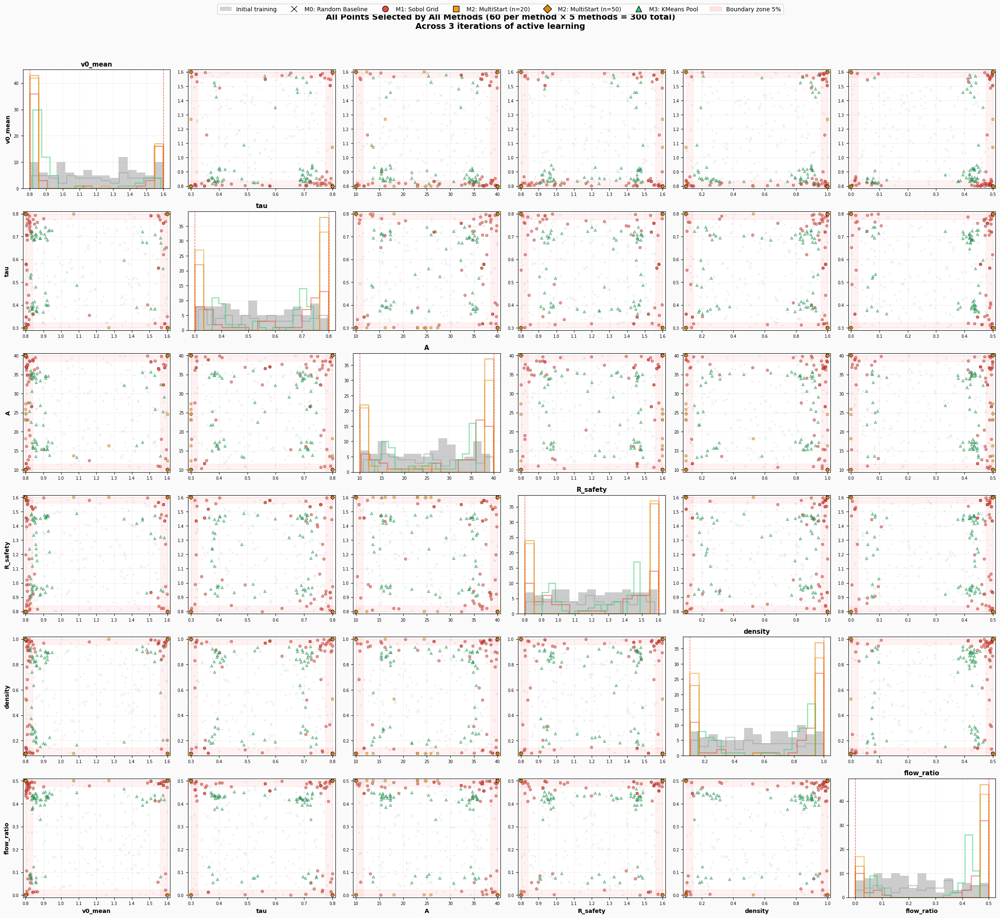


✓ Pairwise scatter → ALL_points_pairwise_matrix.png


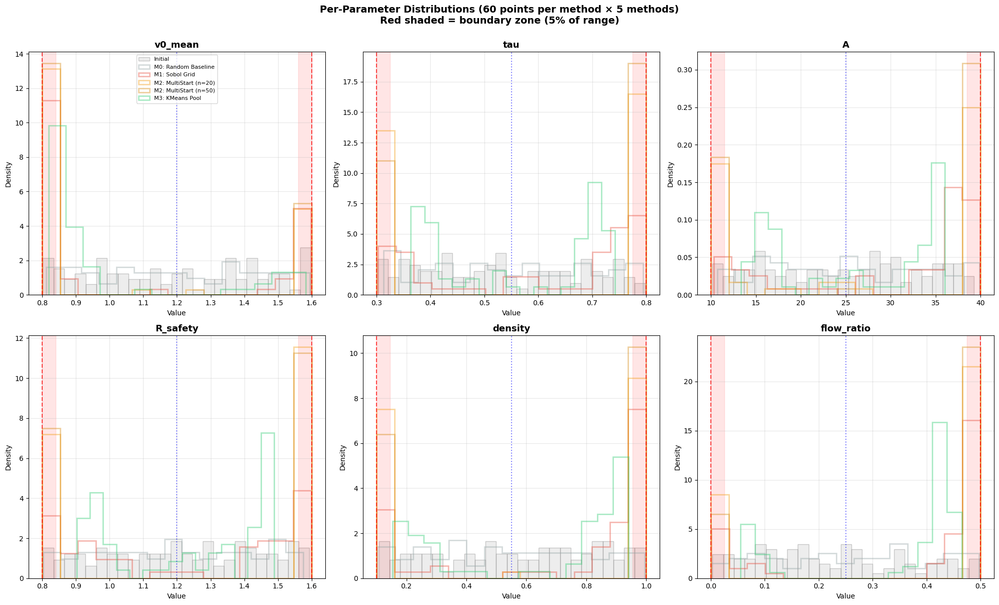

✓ Per-parameter distributions → ALL_points_per_parameter.png


C:\Users\100ra\AppData\Local\Temp\ipykernel_31220\875324288.py:401: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  sc = ax.scatter(subset['density'], subset['flow_ratio'],


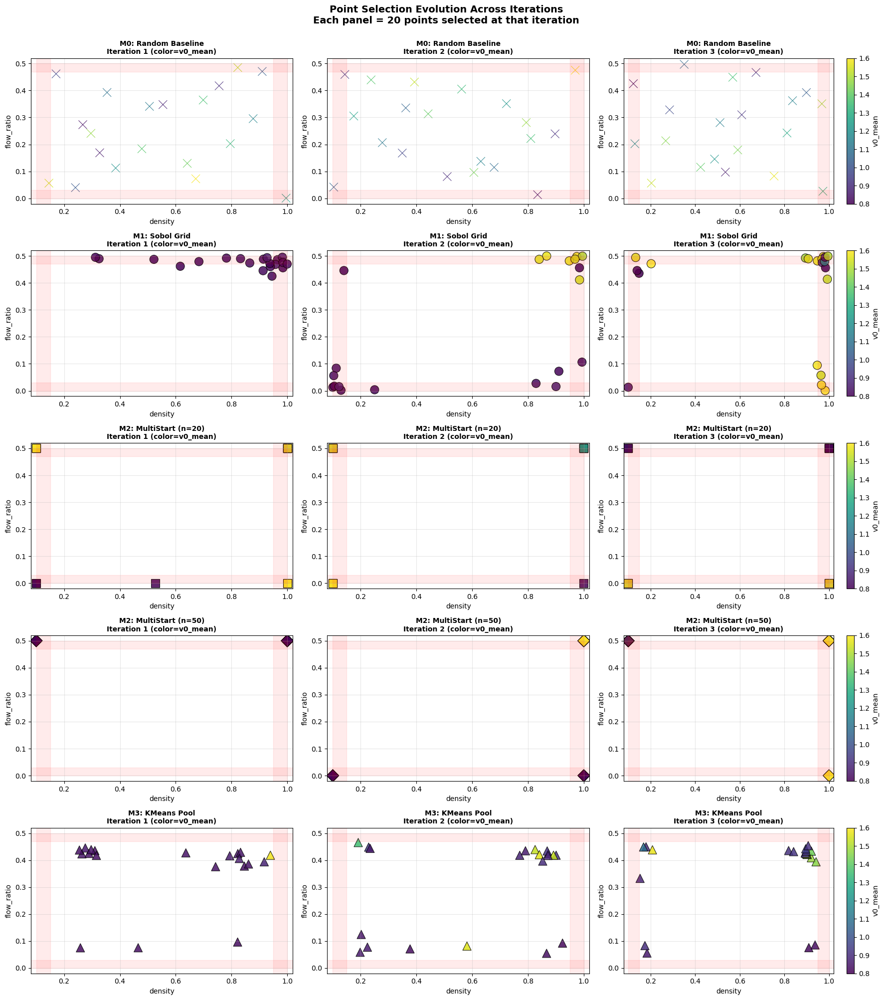

✓ Iteration evolution → ALL_points_iteration_evolution.png


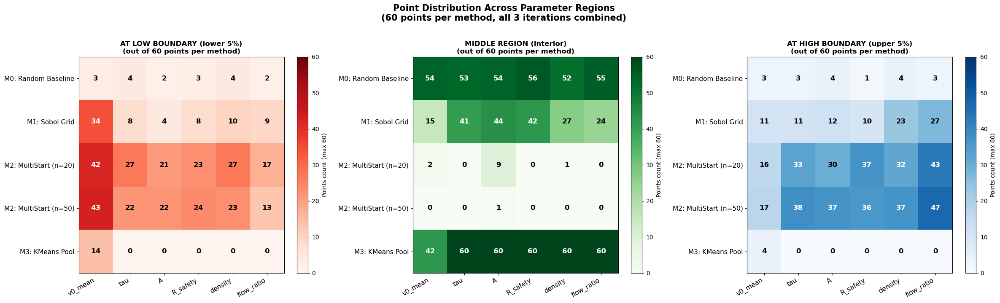

✓ Boundary heatmap → ALL_points_boundary_heatmap.png

EXTREME SCENARIO ANALYSIS
Criteria for 'sparse-fast' scenarios:
  - low density   (< 0.3)
  - low flow_ratio (< 0.1)
  - high v0_mean  (> 1.4)

Method                    None     1 met    2 met    All 3   
-----------------------------------------------------------------
M0: Random Baseline       29       22       7        2       
M1: Sobol Grid            26       20       14       0       
M2: MultiStart (n=20)     19       25       13       3       
M2: MultiStart (n=50)     20       27       13       0       
M3: KMeans Pool           25       28       7        0       


C:\Users\100ra\AppData\Local\Temp\ipykernel_31220\875324288.py:519: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(subset['density'], subset['flow_ratio'],
C:\Users\100ra\AppData\Local\Temp\ipykernel_31220\875324288.py:538: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(subset['v0_mean'], subset['density'],
C:\Users\100ra\AppData\Local\Temp\ipykernel_31220\875324288.py:557: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(subset['v0_mean'], subset['flow_ratio'],


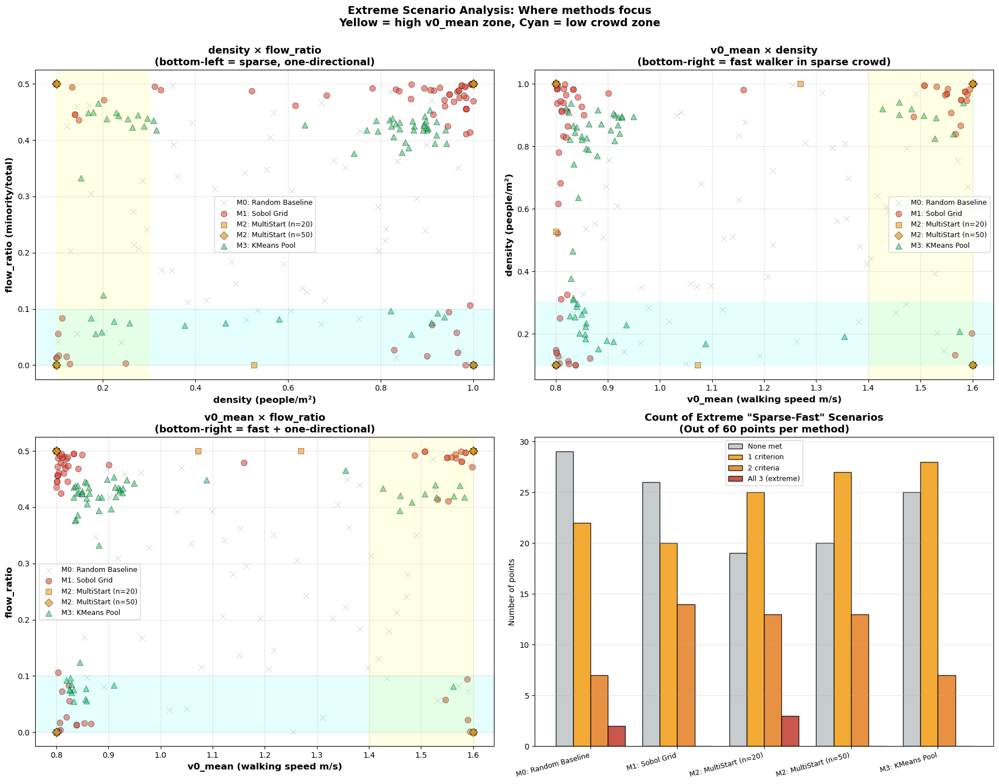


✓ Extreme scenarios → ALL_points_extreme_scenarios.png

ALL DONE

Output files:
  all_selected_points_full_60_per_method.csv   ← MAIN FILE (all 300 points)
  points_M0_Random.csv, points_M1_Sobol.csv, ...  ← per-method CSVs
  ALL_points_pairwise_matrix.png     ← 6×6 scatter grid
  ALL_points_per_parameter.png       ← 6 histograms
  ALL_points_iteration_evolution.png ← how selections evolve
  ALL_points_boundary_heatmap.png    ← low/mid/high counts
  ALL_points_extreme_scenarios.png   ← your specific interest


In [2]:
"""
EXTRACT ALL SELECTED POINTS FROM CHECKPOINT PICKLES
=====================================================
Loads each method's pickle files and extracts the EXACT points
that were selected during the actual simulation runs.

Each method: 20 points × 3 iterations = 60 points
Total: 60 × 5 methods = 300 points

This gives you the REAL points that were used to train GPs.
"""

import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ======================================================================
# CONFIGURATION
# ======================================================================
N_ITERATIONS         = 3
POINTS_PER_ITERATION = 20
INITIAL_POINTS       = 103   # from your data split (40% of 256)

PARAM_NAMES = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}
lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])

# ── UPDATE THESE PATHS ────────────────────────────────────────────────
PKL_FILES = {
    'M0_Random'    : "M0_Random_Baseline_results_20260716_024107.pkl",
    'M1_Sobol'     : "M1_Sobol_Grid_results_20260716_032006.pkl",
    'M2_n20'       : "M2_MultiStart_results_20260716_034836.pkl",
    'M2_n50'       : "M2_MultiStart_results_20260716_150855.pkl",
    'M3_KMeans'    : "M3_KMeans_Pool_results_20260716_165449.pkl",
}

PKL_INTERNAL_KEY = {
    'M0_Random' : 'M0_Random_Baseline',
    'M1_Sobol'  : 'M1_Sobol_Grid',
    'M2_n20'    : 'M2_MultiStart',
    'M2_n50'    : 'M2_MultiStart',
    'M3_KMeans' : 'M3_KMeans_Pool',
}

LABELS = {
    'M0_Random' : 'M0: Random Baseline',
    'M1_Sobol'  : 'M1: Sobol Grid',
    'M2_n20'    : 'M2: MultiStart (n=20)',
    'M2_n50'    : 'M2: MultiStart (n=50)',
    'M3_KMeans' : 'M3: KMeans Pool',
}

COLORS = {
    'M0_Random' : '#95a5a6',
    'M1_Sobol'  : '#e74c3c',
    'M2_n20'    : '#f39c12',
    'M2_n50'    : '#d68910',
    'M3_KMeans' : '#2ecc71',
}

MARKERS = {
    'M0_Random' : 'x', 'M1_Sobol' : 'o',
    'M2_n20'    : 's', 'M2_n50'   : 'D', 'M3_KMeans' : '^',
}

# ======================================================================
# LOAD PICKLES AND EXTRACT NEW POINTS PER ITERATION
# ======================================================================
def extract_all_new_points():
    """
    From each pickle, extract the NEW points added at each iteration.
    
    Structure of pickle:
    - X_train is a list of len (N_ITERATIONS + 1)
    - X_train[0] = initial 103 points
    - X_train[1] = 103 + 20 = 123 points (after iter 1)
    - X_train[2] = 143 points (after iter 2)
    - X_train[3] = 163 points (after iter 3)
    
    So NEW points at iter i = X_train[i] MINUS X_train[i-1]
    = last 20 rows of X_train[i]
    """
    all_data = {}
    initial_X = None

    print("="*80)
    print("EXTRACTING NEW POINTS PER ITERATION FROM CHECKPOINT PICKLES")
    print("="*80)

    for method_key, filepath in PKL_FILES.items():
        try:
            with open(filepath, 'rb') as f:
                ckpt = pickle.load(f)

            internal_key = PKL_INTERNAL_KEY[method_key]
            results = ckpt['results']

            if internal_key in results:
                d = results[internal_key]
            else:
                d = list(results.values())[0]

            # Verify structure
            n_snapshots = len(d['X_train'])
            print(f"\n{LABELS[method_key]}")
            print(f"  File            : {filepath}")
            print(f"  X_train snapshots: {n_snapshots}")
            print(f"  Sizes           : {[len(x) for x in d['X_train']]}")

            # Extract initial data from first pickle
            if initial_X is None:
                initial_X = d['X_train'][0]
                print(f"  Initial train X : {initial_X.shape}")

            # Extract NEW points per iteration
            new_points_per_iter = []
            y_new_per_iter      = []
            y_std_per_iter      = []
            for i in range(1, n_snapshots):
                # New points = X_train[i] minus X_train[i-1]
                # These are the LAST 20 rows added
                X_prev = d['X_train'][i-1]
                X_curr = d['X_train'][i]
                new_pts = X_curr[len(X_prev):]

                # Also get corresponding y and y_std
                y_curr = d['y_train'][i]
                ys_curr = d['y_std_train'][i]
                y_new  = y_curr[len(X_prev):]
                ys_new = ys_curr[len(X_prev):]

                new_points_per_iter.append(new_pts)
                y_new_per_iter.append(y_new)
                y_std_per_iter.append(ys_new)

                print(f"  Iter {i} new pts : {len(new_pts)}")

            all_data[method_key] = {
                'new_points_per_iter': new_points_per_iter,
                'y_new_per_iter'     : y_new_per_iter,
                'y_std_new_per_iter' : y_std_per_iter,
                'r2_history'         : d['r2_history'],
                'boundary_history'   : d.get('boundary_pts_history', []),
                'interior_history'   : d.get('interior_pts_history', []),
            }

        except FileNotFoundError:
            print(f"\n✗ NOT FOUND: {filepath}")
        except Exception as e:
            print(f"\n✗ ERROR: {method_key}: {e}")

    return all_data, initial_X

# ======================================================================
# BUILD COMBINED DATAFRAME (all points × all iterations × all methods)
# ======================================================================
def build_full_dataframe(all_data):
    """
    Build one DataFrame containing ALL points from ALL methods and iterations.
    Each row = one point with metadata.
    """
    rows = []
    for method_key, d in all_data.items():
        for iter_i, (pts, ys, ys_std) in enumerate(
            zip(d['new_points_per_iter'],
                d['y_new_per_iter'],
                d['y_std_new_per_iter'])
        ):
            for pt_idx, (x, y, ystd) in enumerate(zip(pts, ys, ys_std)):
                # Boundary classification
                xn   = (x - lowers) / (uppers - lowers)
                dmin = np.min(np.minimum(xn, 1 - xn))
                is_bnd = dmin < 0.05

                row = {
                    'method'         : method_key,
                    'method_label'   : LABELS[method_key],
                    'iteration'      : iter_i + 1,
                    'point_idx'      : pt_idx + 1,
                    'global_id'      : f"{method_key}_i{iter_i+1}_p{pt_idx+1}",
                }
                # Add all 6 parameters
                for j, p in enumerate(PARAM_NAMES):
                    row[p] = x[j]

                row['y_simulated']    = y
                row['y_std']          = ystd
                row['dist_to_bound']  = dmin
                row['is_boundary']    = 'YES' if is_bnd else 'NO'
                rows.append(row)

    df = pd.DataFrame(rows)
    return df

# ======================================================================
# PRINT SUMMARY
# ======================================================================
def print_summary(df):
    print(f"\n{'='*80}")
    print("SUMMARY BY METHOD")
    print(f"{'='*80}")

    summary = df.groupby('method').agg(
        n_points   =('point_idx', 'count'),
        n_boundary =('is_boundary', lambda x: (x == 'YES').sum()),
        n_interior =('is_boundary', lambda x: (x == 'NO').sum()),
        avg_y      =('y_simulated', 'mean'),
        min_y      =('y_simulated', 'min'),
        max_y      =('y_simulated', 'max'),
        avg_density=('density', 'mean'),
        avg_v0     =('v0_mean', 'mean'),
        avg_flow   =('flow_ratio', 'mean'),
    ).round(3)

    print(summary.to_string())

    print(f"\n{'='*80}")
    print("POINTS PER METHOD × ITERATION")
    print(f"{'='*80}")
    piv = df.pivot_table(index='method', columns='iteration',
                         values='point_idx', aggfunc='count')
    print(piv.to_string())

# ======================================================================
# PLOT 1: PAIRWISE SCATTER (all 300 points colored by method)
# ======================================================================
def plot_pairwise_all(df, initial_X, save_path='all_points_pairwise.png'):
    """
    Full pairwise scatter matrix showing all 300 points colored by method.
    """
    d = len(PARAM_NAMES)
    fig, axes = plt.subplots(d, d, figsize=(24, 22))
    fig.patch.set_facecolor('#fafafa')

    for i in range(d):
        for j in range(d):
            ax = axes[i, j]

            if i == j:
                # Diagonal: histogram
                ax.hist(initial_X[:, i], bins=15, alpha=0.2,
                        color='black', label='Initial')
                for method_key in LABELS:
                    if method_key not in df['method'].unique():
                        continue
                    subset = df[df['method'] == method_key]
                    ax.hist(subset[PARAM_NAMES[i]], bins=15, alpha=0.5,
                            color=COLORS[method_key],
                            histtype='step', linewidth=2,
                            label=LABELS[method_key])
                ax.set_title(PARAM_NAMES[i], fontsize=11, fontweight='bold')

                lo, hi = PARAM_BOUNDS[PARAM_NAMES[i]]
                ax.axvline(lo, color='red', linestyle='--', alpha=0.6, lw=1)
                ax.axvline(hi, color='red', linestyle='--', alpha=0.6, lw=1)
            else:
                # Off-diagonal: scatter
                # Initial training points as background
                ax.scatter(initial_X[:, j], initial_X[:, i],
                           color='lightgray', s=10, alpha=0.4, marker='.')

                # Method points colored
                for method_key in LABELS:
                    if method_key not in df['method'].unique():
                        continue
                    subset = df[df['method'] == method_key]
                    ax.scatter(subset[PARAM_NAMES[j]], subset[PARAM_NAMES[i]],
                               color=COLORS[method_key],
                               marker=MARKERS[method_key],
                               s=25, alpha=0.6,
                               edgecolor='black', linewidth=0.3,
                               label=LABELS[method_key])

                # Boundary zones
                lo_j, hi_j = PARAM_BOUNDS[PARAM_NAMES[j]]
                lo_i, hi_i = PARAM_BOUNDS[PARAM_NAMES[i]]
                zone = 0.05
                ax.axvspan(lo_j, lo_j + zone*(hi_j-lo_j), color='red', alpha=0.05)
                ax.axvspan(hi_j - zone*(hi_j-lo_j), hi_j, color='red', alpha=0.05)
                ax.axhspan(lo_i, lo_i + zone*(hi_i-lo_i), color='red', alpha=0.05)
                ax.axhspan(hi_i - zone*(hi_i-lo_i), hi_i, color='red', alpha=0.05)

                ax.set_xlim(lo_j - 0.02*(hi_j-lo_j),
                            hi_j + 0.02*(hi_j-lo_j))
                ax.set_ylim(lo_i - 0.02*(hi_i-lo_i),
                            hi_i + 0.02*(hi_i-lo_i))

            if i == d-1:
                ax.set_xlabel(PARAM_NAMES[j], fontsize=10, fontweight='bold')
            if j == 0:
                ax.set_ylabel(PARAM_NAMES[i], fontsize=10, fontweight='bold')

            ax.tick_params(labelsize=7)
            ax.grid(True, alpha=0.2)

    # Legend
    handles = [Patch(facecolor='lightgray', label='Initial training')]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        handles.append(plt.Line2D([0], [0],
                                   marker=MARKERS[method_key],
                                   color='w',
                                   markerfacecolor=COLORS[method_key],
                                   markersize=10, markeredgecolor='black',
                                   label=LABELS[method_key]))
    handles.append(Patch(color='red', alpha=0.1, label='Boundary zone 5%'))
    fig.legend(handles=handles, loc='upper center',
               bbox_to_anchor=(0.5, 0.998), ncol=7, fontsize=10)

    plt.suptitle('All Points Selected by All Methods (60 per method × 5 methods = 300 total)\n'
                 f'Across {N_ITERATIONS} iterations of active learning',
                 fontsize=14, fontweight='bold', y=0.985)
    plt.tight_layout(rect=[0, 0, 1, 0.965])
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"\n✓ Pairwise scatter → {save_path}")

# ======================================================================
# PLOT 2: PER-PARAMETER DISTRIBUTIONS
# ======================================================================
def plot_per_parameter(df, initial_X, save_path='all_points_per_param.png'):
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.flatten()

    for idx, param in enumerate(PARAM_NAMES):
        ax = axes[idx]
        lo, hi = PARAM_BOUNDS[param]

        # Initial training data
        ax.hist(initial_X[:, idx], bins=25, color='lightgray',
                alpha=0.4, edgecolor='gray', label='Initial',
                density=True)

        # Each method
        for method_key in LABELS:
            if method_key not in df['method'].unique():
                continue
            subset = df[df['method'] == method_key][param]
            ax.hist(subset, bins=15, color=COLORS[method_key],
                    alpha=0.4, linewidth=2,
                    label=LABELS[method_key], density=True,
                    histtype='step')

        ax.axvline(lo, color='red', linestyle='--', alpha=0.7)
        ax.axvline(hi, color='red', linestyle='--', alpha=0.7)
        ax.axvline((lo+hi)/2, color='blue', linestyle=':', alpha=0.5)

        # Boundary zones
        zone = 0.05*(hi-lo)
        ax.axvspan(lo, lo+zone, color='red', alpha=0.1)
        ax.axvspan(hi-zone, hi, color='red', alpha=0.1)

        ax.set_title(param, fontsize=13, fontweight='bold')
        ax.set_xlabel('Value')
        ax.set_ylabel('Density')
        ax.grid(True, alpha=0.3)

        if idx == 0:
            ax.legend(fontsize=8, loc='upper center')

    plt.suptitle(f'Per-Parameter Distributions (60 points per method × 5 methods)\n'
                 'Red shaded = boundary zone (5% of range)',
                 fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"✓ Per-parameter distributions → {save_path}")

# ======================================================================
# PLOT 3: ITERATION EVOLUTION (how selections change over iterations)
# ======================================================================
def plot_iteration_evolution(df, save_path='iteration_evolution.png'):
    """
    Show how each method's selections evolve across iterations
    Focus on density and flow_ratio (most interesting parameters)
    """
    fig, axes = plt.subplots(len(LABELS), N_ITERATIONS,
                             figsize=(18, 4*len(LABELS)))

    for row_i, method_key in enumerate(LABELS):
        if method_key not in df['method'].unique():
            continue
        for col_i, iter_num in enumerate(range(1, N_ITERATIONS+1)):
            ax = axes[row_i, col_i]
            subset = df[(df['method'] == method_key) &
                        (df['iteration'] == iter_num)]

            # Scatter: density vs flow_ratio
            sc = ax.scatter(subset['density'], subset['flow_ratio'],
                            c=subset['v0_mean'], cmap='viridis',
                            marker=MARKERS[method_key],
                            s=150, alpha=0.85,
                            edgecolor='black', linewidth=0.8,
                            vmin=0.8, vmax=1.6)

            # Boundary zones
            ax.axvspan(0.10, 0.15, color='red', alpha=0.08)
            ax.axvspan(0.95, 1.00, color='red', alpha=0.08)
            ax.axhspan(0.00, 0.03, color='red', alpha=0.08)
            ax.axhspan(0.47, 0.50, color='red', alpha=0.08)

            ax.set_xlim(0.08, 1.02)
            ax.set_ylim(-0.02, 0.52)
            ax.set_xlabel('density', fontsize=10)
            ax.set_ylabel('flow_ratio', fontsize=10)
            ax.set_title(f'{LABELS[method_key]}\n'
                         f'Iteration {iter_num} (color=v0_mean)',
                         fontsize=10, fontweight='bold')
            ax.grid(True, alpha=0.3)

            # Colorbar on last column
            if col_i == N_ITERATIONS - 1:
                plt.colorbar(sc, ax=ax, label='v0_mean')

    plt.suptitle('Point Selection Evolution Across Iterations\n'
                 'Each panel = 20 points selected at that iteration',
                 fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"✓ Iteration evolution → {save_path}")

# ======================================================================
# PLOT 4: BOUNDARY HEATMAP (which corners each method targets)
# ======================================================================
def plot_boundary_heatmap(df, save_path='boundary_heatmap.png'):
    """
    Heatmap: for each method+parameter, count points at LOW/MID/HIGH
    """
    methods = df['method'].unique()
    n_m = len(methods)
    n_p = len(PARAM_NAMES)

    low  = np.zeros((n_m, n_p))
    mid  = np.zeros((n_m, n_p))
    high = np.zeros((n_m, n_p))

    for mi, m in enumerate(methods):
        subset = df[df['method'] == m]
        for pi, p in enumerate(PARAM_NAMES):
            lo, hi = PARAM_BOUNDS[p]
            zone = 0.05 * (hi - lo)
            vals = subset[p].values
            low[mi, pi]  = np.sum(vals < lo + zone)
            high[mi, pi] = np.sum(vals > hi - zone)
            mid[mi, pi]  = len(vals) - low[mi, pi] - high[mi, pi]

    fig, axes = plt.subplots(1, 3, figsize=(24, 7))

    for ax, mat, title, cmap in zip(
        axes,
        [low, mid, high],
        ['AT LOW BOUNDARY (lower 5%)',
         'MIDDLE REGION (interior)',
         'AT HIGH BOUNDARY (upper 5%)'],
        ['Reds', 'Greens', 'Blues']
    ):
        max_val = int(mat.max()) if mat.max() > 0 else 60
        im = ax.imshow(mat, cmap=cmap, aspect='auto', vmin=0, vmax=60)

        for i in range(n_m):
            for j in range(n_p):
                val = int(mat[i, j])
                color = 'white' if val > 30 else 'black'
                ax.text(j, i, str(val), ha='center', va='center',
                        color=color, fontsize=12, fontweight='bold')

        ax.set_xticks(range(n_p))
        ax.set_xticklabels(PARAM_NAMES, rotation=30, ha='right', fontsize=11)
        ax.set_yticks(range(n_m))
        ax.set_yticklabels([LABELS[m] for m in methods], fontsize=11)
        ax.set_title(title + '\n(out of 60 points per method)',
                     fontweight='bold', fontsize=12)
        plt.colorbar(im, ax=ax, label='Points count (max 60)')

    plt.suptitle('Point Distribution Across Parameter Regions\n'
                 '(60 points per method, all 3 iterations combined)',
                 fontsize=15, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"✓ Boundary heatmap → {save_path}")

# ======================================================================
# PLOT 5: EXTREME SCENARIOS (your specific interest)
# ======================================================================
def plot_extreme_scenarios(df, save_path='extreme_scenarios.png'):
    """
    Focus on 'sparse crowd + fast walker + one-directional' scenarios
    """
    print(f"\n{'='*80}")
    print("EXTREME SCENARIO ANALYSIS")
    print(f"{'='*80}")
    print("Criteria for 'sparse-fast' scenarios:")
    print("  - low density   (< 0.3)")
    print("  - low flow_ratio (< 0.1)")
    print("  - high v0_mean  (> 1.4)")

    fig, axes = plt.subplots(2, 2, figsize=(18, 14))

    # ── Panel 1: density × flow_ratio ────────────────────────────
    ax = axes[0, 0]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        ax.scatter(subset['density'], subset['flow_ratio'],
                   color=COLORS[method_key], marker=MARKERS[method_key],
                   s=60, alpha=0.6, edgecolor='black', linewidth=0.5,
                   label=LABELS[method_key])
    ax.axvspan(0.10, 0.30, alpha=0.1, color='yellow')
    ax.axhspan(0.00, 0.10, alpha=0.1, color='cyan')
    ax.set_xlabel('density (people/m²)', fontsize=12, fontweight='bold')
    ax.set_ylabel('flow_ratio (minority/total)', fontsize=12, fontweight='bold')
    ax.set_title('density × flow_ratio\n(bottom-left = sparse, one-directional)',
                 fontsize=13, fontweight='bold')
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)

    # ── Panel 2: v0_mean × density ───────────────────────────────
    ax = axes[0, 1]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        ax.scatter(subset['v0_mean'], subset['density'],
                   color=COLORS[method_key], marker=MARKERS[method_key],
                   s=60, alpha=0.6, edgecolor='black', linewidth=0.5,
                   label=LABELS[method_key])
    ax.axvspan(1.40, 1.60, alpha=0.1, color='yellow')
    ax.axhspan(0.10, 0.30, alpha=0.1, color='cyan')
    ax.set_xlabel('v0_mean (walking speed m/s)', fontsize=12, fontweight='bold')
    ax.set_ylabel('density (people/m²)', fontsize=12, fontweight='bold')
    ax.set_title('v0_mean × density\n(bottom-right = fast walker in sparse crowd)',
                 fontsize=13, fontweight='bold')
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)

    # ── Panel 3: v0_mean × flow_ratio ────────────────────────────
    ax = axes[1, 0]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        ax.scatter(subset['v0_mean'], subset['flow_ratio'],
                   color=COLORS[method_key], marker=MARKERS[method_key],
                   s=60, alpha=0.6, edgecolor='black', linewidth=0.5,
                   label=LABELS[method_key])
    ax.axvspan(1.40, 1.60, alpha=0.1, color='yellow')
    ax.axhspan(0.00, 0.10, alpha=0.1, color='cyan')
    ax.set_xlabel('v0_mean (walking speed m/s)', fontsize=12, fontweight='bold')
    ax.set_ylabel('flow_ratio', fontsize=12, fontweight='bold')
    ax.set_title('v0_mean × flow_ratio\n(bottom-right = fast + one-directional)',
                 fontsize=13, fontweight='bold')
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)

    # ── Panel 4: Count of extreme scenarios ──────────────────────
    ax = axes[1, 1]
    counts = {}
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        low_d  = subset['density']    < 0.30
        low_f  = subset['flow_ratio'] < 0.10
        high_v = subset['v0_mean']    > 1.40

        all_three = np.sum(low_d & low_f & high_v)
        two_met = np.sum(
            (low_d & low_f) | (low_d & high_v) | (low_f & high_v)
        ) - all_three
        one_met = np.sum(low_d | low_f | high_v) - two_met - all_three
        none_met = len(subset) - one_met - two_met - all_three

        counts[method_key] = [none_met, one_met, two_met, all_three]

    method_list = list(counts.keys())
    x_pos = np.arange(len(method_list))
    w = 0.2
    lbls = ['None met', '1 criterion', '2 criteria', 'All 3 (extreme)']
    cols = ['#bdc3c7', '#f39c12', '#e67e22', '#c0392b']

    for i, lbl in enumerate(lbls):
        vals = [counts[m][i] for m in method_list]
        ax.bar(x_pos + (i-1.5)*w, vals, w, color=cols[i],
               alpha=0.85, edgecolor='black', label=lbl)

    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[m] for m in method_list],
                       fontsize=9, rotation=15, ha='right')
    ax.set_title('Count of Extreme "Sparse-Fast" Scenarios\n'
                 '(Out of 60 points per method)',
                 fontsize=13, fontweight='bold')
    ax.set_ylabel('Number of points')
    ax.legend(fontsize=9)
    ax.grid(axis='y', alpha=0.3)

    # Print counts to console
    print(f"\n{'Method':<25} {'None':<8} {'1 met':<8} {'2 met':<8} {'All 3':<8}")
    print("-" * 65)
    for m, c in counts.items():
        print(f"{LABELS[m]:<25} {c[0]:<8} {c[1]:<8} {c[2]:<8} {c[3]:<8}")

    plt.suptitle('Extreme Scenario Analysis: Where methods focus\n'
                 'Yellow = high v0_mean zone, Cyan = low crowd zone',
                 fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"\n✓ Extreme scenarios → {save_path}")

# ======================================================================
# MAIN
# ======================================================================
if __name__ == "__main__":
    print("="*80)
    print("EXTRACT ALL POINTS FROM ACTUAL SIMULATION RUNS")
    print("="*80)

    # Extract all points from pickles
    all_data, initial_X = extract_all_new_points()

    if len(all_data) == 0:
        print("\n✗ No data loaded!")
        exit()

    # Build full DataFrame
    df = build_full_dataframe(all_data)

    print(f"\n{'='*80}")
    print(f"TOTAL POINTS EXTRACTED: {len(df)}")
    print(f"({len(all_data)} methods × {N_ITERATIONS} iterations × "
          f"{POINTS_PER_ITERATION} points each)")
    print(f"{'='*80}")

    # Save full CSV
    csv_file = 'all_selected_points_full_60_per_method.csv'
    df.to_csv(csv_file, index=False, float_format='%.4f')
    print(f"\n✓ Full CSV saved → {csv_file}")
    print(f"  Columns: {list(df.columns)}")

    # Also save split per method
    for method_key in df['method'].unique():
        subset = df[df['method'] == method_key]
        f_name = f'points_{method_key}.csv'
        subset.to_csv(f_name, index=False, float_format='%.4f')
        print(f"  ✓ {f_name} ({len(subset)} points)")

    # Print summary
    print_summary(df)

    # Generate plots
    print(f"\n{'='*80}")
    print("GENERATING PLOTS")
    print(f"{'='*80}")

    plot_pairwise_all(df, initial_X,
                      save_path='ALL_points_pairwise_matrix.png')

    plot_per_parameter(df, initial_X,
                       save_path='ALL_points_per_parameter.png')

    plot_iteration_evolution(df,
                             save_path='ALL_points_iteration_evolution.png')

    plot_boundary_heatmap(df,
                          save_path='ALL_points_boundary_heatmap.png')

    plot_extreme_scenarios(df,
                           save_path='ALL_points_extreme_scenarios.png')

    print(f"\n{'='*80}")
    print("ALL DONE")
    print(f"{'='*80}")
    print("\nOutput files:")
    print(f"  {csv_file}   ← MAIN FILE (all 300 points)")
    print(f"  points_M0_Random.csv, points_M1_Sobol.csv, ...  ← per-method CSVs")
    print(f"  ALL_points_pairwise_matrix.png     ← 6×6 scatter grid")
    print(f"  ALL_points_per_parameter.png       ← 6 histograms")
    print(f"  ALL_points_iteration_evolution.png ← how selections evolve")
    print(f"  ALL_points_boundary_heatmap.png    ← low/mid/high counts")
    print(f"  ALL_points_extreme_scenarios.png   ← your specific interest")

# Advance M2 and M3 (k-mean ++)


DATA SPLIT  (seed=42 — fixed for ALL methods)
Total valid  : 256
Train set    : 103 pts (80%)
Test set     : 153 pts (20%)  ← FIXED, never changes
Budget       : 3 iters × 20 pts = 60 new simulations per method

ITERATION 0  —  INITIAL GP

RUNNING: M0_Random_Baseline

────────────────────────────────────────────────────────────
  M0_Random_Baseline  |  Iteration 1/3
────────────────────────────────────────────────────────────
  Training GP on 103 points …
    fit time : 0.22s
    search time : 0.01s  |  found 20 points
    boundary  : 8/20 (40%)
    interior  : 12/20 (60%)
  Running CAFM: 20 pts × 10 reps …
    [5/20]  elapsed 4.3min  remaining ~12.9min
    [10/20]  elapsed 9.3min  remaining ~9.3min
    [15/20]  elapsed 14.0min  remaining ~4.7min
    [20/20]  elapsed 18.7min  remaining ~0.0min
    sim time : 1122.0s
  Retraining GP on 123 points …
    R²   : 0.7726  (Δ +0.0226)

────────────────────────────────────────────────────────────
  M0_Random_Baseline  |  Iteration 2/3
───────

  File "c:\Users\100ra\anaconda3\envs\ram_env\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "c:\Users\100ra\anaconda3\envs\ram_env\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\100ra\anaconda3\envs\ram_env\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\100ra\anaconda3\envs\ram_env\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


    search time : 1.35s  |  found 20 points
    boundary  : 20/20 (100%)
    interior  : 0/20 (0%)
  Running CAFM: 20 pts × 10 reps …
    [5/20]  elapsed 6.8min  remaining ~20.5min
    [10/20]  elapsed 11.5min  remaining ~11.5min
    [15/20]  elapsed 13.5min  remaining ~4.5min
    [20/20]  elapsed 15.7min  remaining ~0.0min
    sim time : 940.5s
  Retraining GP on 123 points …
    R²   : 0.7943  (Δ +0.0443)

────────────────────────────────────────────────────────────
  M2_Actual_Hybrid  |  Iteration 2/3
────────────────────────────────────────────────────────────
  Training GP on 123 points …
    fit time : 0.79s
    search time : 0.63s  |  found 20 points
    boundary  : 20/20 (100%)
    interior  : 0/20 (0%)
  Running CAFM: 20 pts × 10 reps …
    [5/20]  elapsed 3.3min  remaining ~9.8min
    [10/20]  elapsed 6.1min  remaining ~6.1min
    [15/20]  elapsed 12.4min  remaining ~4.1min
    [20/20]  elapsed 14.4min  remaining ~0.0min
    sim time : 861.9s
  Retraining GP on 143 points …
 

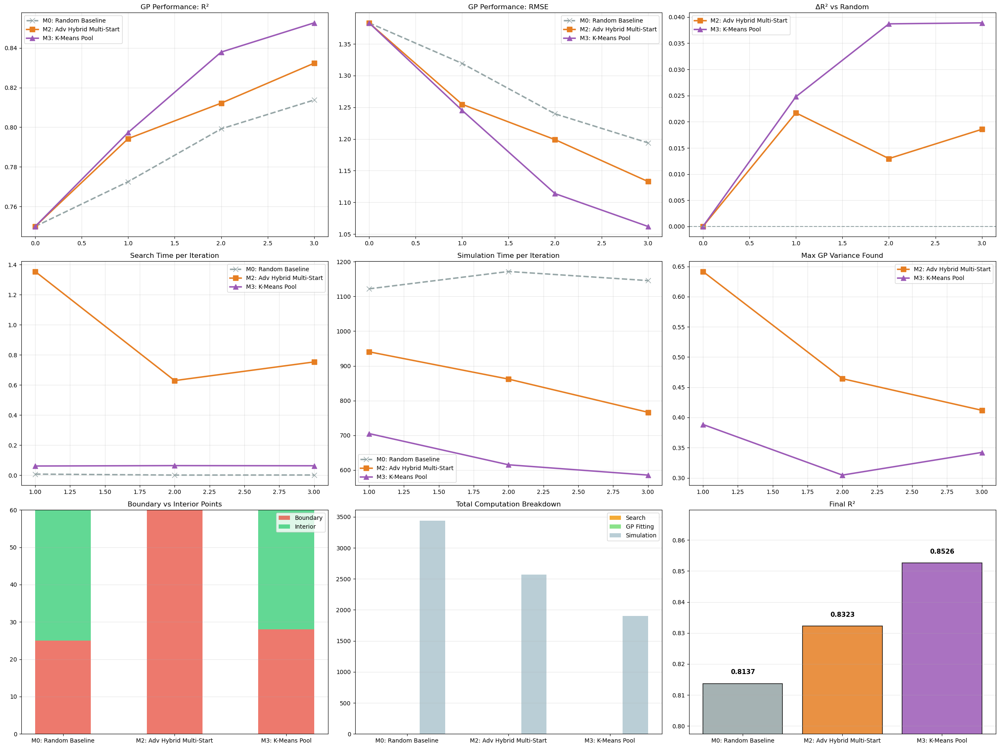

In [2]:
"""
COMBINED COMPARISON: M0 (Random) | M2_Actual (Hybrid + Penalties) | M3 (KMeans Pool)
================================================================================
Saves results after each method completes so you can:
1. Run the experiment (saves pickle)
2. Load results later and generate comparison plots
"""

import sys
import time
import warnings
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from scipy.stats import qmc
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.cluster import KMeans
from datetime import datetime

sys.path.append(r"D:\KIT\social_force_model")
from run_batch import single_run

warnings.filterwarnings("ignore")

# ======================================================================
# GLOBAL CONFIGURATION
# ======================================================================
DATA_PATH            = r"D:\KIT\social_force_model\cafm_qmc_new_dataset_256x10.npz"
PARAM_NAMES          = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]
TARGET_IDX           = 0
N_ITERATIONS         = 3
N_REPS               = 10
POINTS_PER_ITERATION = 20
TOLERANCE            = 1e-3
NOISE_FLOOR          = 1e-2

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}

lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])
bounds = list(zip(lowers, uppers))

# ======================================================================
# DATA LOADING
# ======================================================================
def load_initial_data(data_path, target_idx=0, test_ratio=0.6, seed=42):
    data  = np.load(data_path)
    X     = data["X"]
    y     = data["Y"][:, target_idx]
    y_std = data["Y_std"][:, target_idx]

    valid = ~np.isnan(y)
    X, y, y_std = X[valid], y[valid], y_std[valid]

    np.random.seed(seed)
    n_total   = len(X)
    n_test    = int(n_total * test_ratio)
    test_idx  = np.random.choice(n_total, n_test, replace=False)
    train_idx = np.setdiff1d(np.arange(n_total), test_idx)

    X_train  = X[train_idx];  y_train  = y[train_idx];  ys_train = y_std[train_idx]
    X_test   = X[test_idx];   y_test   = y[test_idx];   ys_test  = y_std[test_idx]

    print(f"\n{'='*80}")
    print("DATA SPLIT  (seed=42 — fixed for ALL methods)")
    print(f"{'='*80}")
    print(f"Total valid  : {n_total}")
    print(f"Train set    : {len(train_idx)} pts (80%)")
    print(f"Test set     : {len(test_idx)} pts (20%)  ← FIXED, never changes")
    print(f"Budget       : {N_ITERATIONS} iters × {POINTS_PER_ITERATION} pts "
          f"= {N_ITERATIONS*POINTS_PER_ITERATION} new simulations per method")

    return X_train, y_train, ys_train, X_test, y_test, ys_test

# ======================================================================
# GP TRAINING
# ======================================================================
def train_surrogate(X, y, y_std, n_restarts=5):
    t0 = time.time()

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()
    Xs = scaler_X.fit_transform(X)
    ys = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

    y_var_s  = (y_std / scaler_y.scale_[0]) ** 2
    alpha_s  = np.clip(y_var_s, NOISE_FLOOR, None)

    kernel = (
        C(1.0, (1e-3, 1e3)) *
        Matern(length_scale=[0.5, 0.5, 1.0, 0.5, 0.3, 0.5],
               length_scale_bounds=[(1e-3, 15)] * 6,
               nu=2.5)
    )
    gp = GaussianProcessRegressor(
        kernel=kernel, alpha=alpha_s,
        n_restarts_optimizer=n_restarts,
        random_state=42, normalize_y=False
    )
    gp.fit(Xs, ys)

    return {"model": gp, "scaler_X": scaler_X,
            "scaler_y": scaler_y, "fitting_time": time.time() - t0}

def evaluate_gp(gp_dict, X_test, y_test):
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    yp_s, ys_s = gp.predict(sX.transform(X_test), return_std=True)
    y_pred = sy.inverse_transform(yp_s.reshape(-1, 1)).ravel()
    return {
        "r2"         : r2_score(y_test, y_pred),
        "rmse"       : np.sqrt(mean_squared_error(y_test, y_pred)),
        "predictions": y_pred,
        "std"        : ys_s * sy.scale_[0]
    }

# ======================================================================
# BOUNDARY ANALYSIS & SIMULATION
# ======================================================================
def analyze_boundaries(x_batch, threshold=0.05):
    if len(x_batch) == 0:
        return 0, 0, 0.0
    xn   = (x_batch - lowers) / (uppers - lowers)
    dmin = np.min(np.minimum(xn, 1 - xn), axis=1)
    bnd  = int(np.sum(dmin < threshold))
    return bnd, len(x_batch) - bnd, float(np.mean(dmin))

def simulate_batch(x_batch, base_seed=1000):
    t0 = time.time()
    ym, ys = [], []
    n = len(x_batch)
    for i, x in enumerate(x_batch):
        pd_ = {name: float(x[j]) for j, name in enumerate(PARAM_NAMES)}
        reps = []
        for r in range(N_REPS):
            try:
                reps.append(single_run(pd_, base_seed + i*100 + r)[TARGET_IDX])
            except Exception:
                reps.append(np.nan)
        ym.append(np.nanmean(reps))
        ys.append(np.nanstd(reps))
        if (i+1) % 5 == 0 or (i+1) == n:
            el  = time.time() - t0
            rem = el / (i+1) * (n - i - 1)
            print(f"    [{i+1}/{n}]  elapsed {el/60:.1f}min  remaining ~{rem/60:.1f}min")
    return np.array(ym), np.array(ys), time.time() - t0

def _make_results(X_init, y_init, ys_init):
    return {
        'X_train': [X_init.copy()], 'y_train': [y_init.copy()], 'y_std_train': [ys_init.copy()],
        'r2_history': [], 'rmse_history': [], 'search_time_history': [], 'sim_time_history': [],
        'fit_time_history': [], 'boundary_pts_history': [], 'interior_pts_history': [],
        'avg_dist_to_boundary': [], 'found_variance_max': [], 'found_variance_mean': [],
    }

# ======================================================================
# METHOD 0 – RANDOM BASELINE
# ======================================================================
def method0_random(iteration, n_select=POINTS_PER_ITERATION):
    t0 = time.time()
    sampler = qmc.Sobol(d=6, scramble=True, seed=1000 + iteration)
    x_new   = qmc.scale(sampler.random(n_select), lowers, uppers)
    return x_new, time.time() - t0

# ======================================================================
# METHOD 2_ACTUAL – HYBRID M2 (Weighted Penalty + Distance)
# ======================================================================
def method2_actual_hybrid(gp_dict, X_train, n_select=POINTS_PER_ITERATION):
    t0 = time.time()
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    
    # ---------------------------------------------------------
    # STAGE 1 & 2: Ultra-fast Sobol + K-Means to get `n_select` perfect starts
    # ---------------------------------------------------------
    sampler = qmc.Sobol(d=6, scramble=True, seed=99)
    cand = qmc.scale(sampler.random(2000), lowers, uppers)
    cand_scaled = sX.transform(cand)
    
    # Fast vectorized variance prediction
    _, std_s = gp.predict(cand_scaled, return_std=True)
    
    # Cluster the top 200 high-variance hits into exactly `n_select` starting zones
    top_idx = np.argsort(std_s)[::-1][:200]
    kmeans = KMeans(n_clusters=n_select, random_state=42, n_init='auto')
    kmeans.fit(cand_scaled[top_idx])
    starts_raw = np.clip(sX.inverse_transform(kmeans.cluster_centers_), lowers, uppers)

    # ---------------------------------------------------------
    # STAGE 3: The Actual M2 (Independent L-BFGS-B runs with Penalty)
    # ---------------------------------------------------------
    X_train_scaled = sX.transform(X_train)
    found_x = []

    # We only run optimizations exactly equal to `n_select`
    for x0 in starts_raw:
        def objective_penalized(x_curr):
            # 1. Calculate Variance 
            xs = sX.transform(x_curr.reshape(1, -1))
            _, std = gp.predict(xs, return_std=True)
            variance = float((std[0] * sy.scale_[0]) ** 2)

            # 2. Weighted Boundary Penalty
            xn = (x_curr - lowers) / (uppers - lowers)
            bnd_dist = np.minimum(xn, 1 - xn)
            weight_bnd = variance * 0.1 
            bnd_pen = np.sum(np.exp(-20.0 * bnd_dist)) * weight_bnd

            # 3. Weighted Distance Penalty (Pushes away from existing data)
            dists_to_data = np.linalg.norm(X_train_scaled - xs, axis=1)
            weight_dist = variance * 0.1
            dist_pen = np.sum(np.exp(-3.0 * dists_to_data)) * weight_dist

            return -(variance - bnd_pen - dist_pen)

        # Run continuous gradient optimization
        res = minimize(objective_penalized, x0=x0, bounds=bounds,
                       method='L-BFGS-B', tol=TOLERANCE,
                       options={'maxiter': 30, 'disp': False})
        
        found_x.append(res.x if res.success else x0)

    return np.array(found_x), time.time() - t0

# ======================================================================
# METHOD 3 – K-MEANS POOL
# ======================================================================
def method3_kmeans_pool(gp_dict, n_candidates=10000, n_select=POINTS_PER_ITERATION):
    t0 = time.time()
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    
    # 1. Generate massive uniform pool
    sampler = qmc.Sobol(d=6, scramble=True, seed=42)
    cand    = qmc.scale(sampler.random(n_candidates), lowers, uppers)
    
    # 2. Evaluate variance for all candidates
    _, std_s = gp.predict(sX.transform(cand), return_std=True)
    var      = (std_s * sy.scale_[0]) ** 2
    
    # 3. Take the top subset of high variance points (e.g., top 200 for 20 clusters)
    pool_size = n_select * 10
    top_idx   = np.argsort(var)[::-1][:pool_size]
    top_cand  = cand[top_idx]
    
    # 4. K-Means clustering in standard scaled space for uniform distance
    kmeans = KMeans(n_clusters=n_select, random_state=42, n_init='auto')
    kmeans.fit(sX.transform(top_cand))
    
    # 5. Extract cluster centers and transform back to original parameter bounds
    selected_x = sX.inverse_transform(kmeans.cluster_centers_)
    selected_x = np.clip(selected_x, lowers, uppers) # Ensure strict bounds
    
    return selected_x, time.time() - t0

# ======================================================================
# ONE-METHOD RUNNER
# ======================================================================
def run_one_method(method_name, X_tr, y_tr, ys_tr, X_te, y_te, ys_te,
                   initial_r2, initial_rmse, initial_fit_time):
    print(f"\n{'='*80}")
    print(f"RUNNING: {method_name}")
    print(f"{'='*80}")

    res = _make_results(X_tr, y_tr, ys_tr)
    res['r2_history'].append(initial_r2)
    res['rmse_history'].append(initial_rmse)
    res['fit_time_history'].append(initial_fit_time)

    X_cur  = X_tr.copy()
    y_cur  = y_tr.copy()
    ys_cur = ys_tr.copy()

    for iteration in range(1, N_ITERATIONS + 1):
        print(f"\n{'─'*60}")
        print(f"  {method_name}  |  Iteration {iteration}/{N_ITERATIONS}")
        print(f"{'─'*60}")

        print(f"  Training GP on {len(X_cur)} points …")
        gp_dict  = train_surrogate(X_cur, y_cur, ys_cur)
        fit_time = gp_dict['fitting_time']
        print(f"    fit time : {fit_time:.2f}s")

        if method_name == 'M0_Random_Baseline':
            x_new, search_time = method0_random(iteration)
        elif method_name == 'M2_Actual_Hybrid':
            # Passes X_cur explicitly for the distance penalty calculation
            x_new, search_time = method2_actual_hybrid(gp_dict, X_cur)
        else:
            x_new, search_time = method3_kmeans_pool(gp_dict)

        print(f"    search time : {search_time:.2f}s  |  found {len(x_new)} points")

        bnd, intr, avg_d = analyze_boundaries(x_new)
        bnd_pct = bnd / len(x_new) * 100 if len(x_new) else 0
        print(f"    boundary  : {bnd}/{len(x_new)} ({bnd_pct:.0f}%)")
        print(f"    interior  : {intr}/{len(x_new)} ({100-bnd_pct:.0f}%)")

        if len(x_new):
            xs_new  = gp_dict['scaler_X'].transform(x_new)
            _, st   = gp_dict['model'].predict(xs_new, return_std=True)
            var_new = (st * gp_dict['scaler_y'].scale_[0]) ** 2
            vmax, vmean = float(var_new.max()), float(var_new.mean())
        else:
            vmax = vmean = 0.0
        
        res['found_variance_max'].append(vmax)
        res['found_variance_mean'].append(vmean)

        print(f"  Running CAFM: {len(x_new)} pts × {N_REPS} reps …")
        y_new, ys_new, sim_time = simulate_batch(x_new, base_seed=3000 + iteration * 100)
        print(f"    sim time : {sim_time:.1f}s")

        X_cur  = np.vstack([X_cur, x_new])
        y_cur  = np.append(y_cur,  y_new)
        ys_cur = np.append(ys_cur, ys_new)

        res['X_train'].append(X_cur.copy())
        res['y_train'].append(y_cur.copy())
        res['y_std_train'].append(ys_cur.copy())

        print(f"  Retraining GP on {len(X_cur)} points …")
        gp_fin = train_surrogate(X_cur, y_cur, ys_cur)
        ev     = evaluate_gp(gp_fin, X_te, y_te)
        print(f"    R²   : {ev['r2']:.4f}  (Δ {ev['r2']-res['r2_history'][-1]:+.4f})")

        res['r2_history'].append(ev['r2'])
        res['rmse_history'].append(ev['rmse'])
        res['search_time_history'].append(search_time)
        res['sim_time_history'].append(sim_time)
        res['fit_time_history'].append(fit_time)
        res['boundary_pts_history'].append(bnd)
        res['interior_pts_history'].append(intr)
        res['avg_dist_to_boundary'].append(avg_d)

    return res

# ======================================================================
# PLOTS & SUMMARY FACTORIES
# ======================================================================
colors = {
    'M0_Random_Baseline': '#95a5a6',
    'M2_Actual_Hybrid': '#E67E22',
    'M3_KMeans_Pool': '#9B59B6',
}
markers = {
    'M0_Random_Baseline': 'x',
    'M2_Actual_Hybrid': 's',
    'M3_KMeans_Pool': '^',
}
linestyles = {
    'M0_Random_Baseline': '--',
    'M2_Actual_Hybrid': '-',
    'M3_KMeans_Pool': '-',
}
labels = {
    'M0_Random_Baseline': 'M0: Random Baseline',
    'M2_Actual_Hybrid': 'M2: Adv Hybrid Multi-Start',
    'M3_KMeans_Pool': 'M3: K-Means Pool',
}

def plot_all(results, X_test, y_test, save_path='combined_comparison.png'):
    iters   = np.arange(0, N_ITERATIONS + 1)
    iters_s = np.arange(1, N_ITERATIONS + 1)
    fig, axes = plt.subplots(3, 3, figsize=(24, 18))

    def _line(ax, name, data, x):
        ax.plot(x, data, color=colors[name], marker=markers[name],
                linestyle=linestyles[name], linewidth=2.5,
                markersize=9, label=labels[name])

    mnames = list(results.keys())

    # Row 1: R2, RMSE, Delta R2
    ax = axes[0, 0]
    for n, d in results.items(): _line(ax, n, d['r2_history'], iters)
    ax.set_title('GP Performance: R²'); ax.legend(); ax.grid(True, alpha=0.3)

    ax = axes[0, 1]
    for n, d in results.items(): _line(ax, n, d['rmse_history'], iters)
    ax.set_title('GP Performance: RMSE'); ax.legend(); ax.grid(True, alpha=0.3)

    ax = axes[0, 2]
    base_r2 = results['M0_Random_Baseline']['r2_history']
    for n, d in results.items():
        if n == 'M0_Random_Baseline': continue
        delta = [d['r2_history'][i] - base_r2[i] for i in range(N_ITERATIONS+1)]
        ax.plot(iters, delta, color=colors[n], marker=markers[n], linestyle=linestyles[n], linewidth=2.5, markersize=9, label=labels[n])
    ax.axhline(0, color='#95a5a6', linestyle='--')
    ax.set_title('ΔR² vs Random'); ax.legend(); ax.grid(True, alpha=0.3)

    # Row 2: Search Time, Sim Time, Max Var
    ax = axes[1, 0]
    for n, d in results.items(): _line(ax, n, d['search_time_history'], iters_s)
    ax.set_title('Search Time per Iteration'); ax.legend(); ax.grid(True, alpha=0.3)

    ax = axes[1, 1]
    for n, d in results.items(): _line(ax, n, d['sim_time_history'], iters_s)
    ax.set_title('Simulation Time per Iteration'); ax.legend(); ax.grid(True, alpha=0.3)

    ax = axes[1, 2]
    for n, d in results.items():
        if n == 'M0_Random_Baseline': continue
        ax.plot(iters_s, d['found_variance_max'], color=colors[n], marker=markers[n], linestyle=linestyles[n], linewidth=2.5, markersize=9, label=labels[n])
    ax.set_title('Max GP Variance Found'); ax.legend(); ax.grid(True, alpha=0.3)

    # Row 3: Boundary/Interior, Time Breakdown, Final R2
    ax    = axes[2, 0]
    x_pos = np.arange(len(mnames))
    t_bnd = [sum(results[n]['boundary_pts_history']) for n in mnames]
    t_int = [sum(results[n]['interior_pts_history']) for n in mnames]
    ax.bar(x_pos, t_bnd, 0.5, label='Boundary', color='#e74c3c', alpha=0.75)
    ax.bar(x_pos, t_int, 0.5, bottom=t_bnd, label='Interior', color='#2ecc71', alpha=0.75)
    ax.set_xticks(x_pos); ax.set_xticklabels([labels[n] for n in mnames], fontsize=10)
    ax.set_title('Boundary vs Interior Points'); ax.legend(); ax.grid(axis='y', alpha=0.3)

    ax = axes[2, 1]
    w  = 0.25
    ts = [sum(results[n]['search_time_history']) for n in mnames]
    tf = [sum(results[n]['fit_time_history'])    for n in mnames]
    tm = [sum(results[n]['sim_time_history'])    for n in mnames]
    ax.bar(x_pos-w, ts, w, label='Search',     color='#f39c12', alpha=0.85)
    ax.bar(x_pos,   tf, w, label='GP Fitting', color='#77DD77', alpha=0.85)
    ax.bar(x_pos+w, tm, w, label='Simulation', color='#AEC6CF', alpha=0.85)
    ax.set_xticks(x_pos); ax.set_xticklabels([labels[n] for n in mnames], fontsize=10)
    ax.set_title('Total Computation Breakdown'); ax.legend(); ax.grid(axis='y', alpha=0.3)

    ax       = axes[2, 2]
    final_r2 = [results[n]['r2_history'][-1] for n in mnames]
    bcols    = [colors[n] for n in mnames]
    bars     = ax.bar(x_pos, final_r2, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val in zip(bars, final_r2):
        ax.text(bar.get_x() + bar.get_width()/2, val + 0.003, f'{val:.4f}', ha='center', fontsize=11, fontweight='bold')
    ax.set_xticks(x_pos); ax.set_xticklabels([labels[n] for n in mnames], fontsize=10)
    ax.set_title('Final R²'); ax.set_ylim(min(final_r2)*0.98, max(final_r2)*1.02); ax.grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"\n✓ Plot saved → {save_path}")

def print_final_summary(results):
    print(f"\n{'='*80}")
    print("FINAL COMPARISON SUMMARY")
    print(f"{'='*80}")
    rows = []
    for n, d in results.items():
        tot_b = sum(d['boundary_pts_history'])
        tot_i = sum(d['interior_pts_history'])
        rows.append({
            'Method'           : labels[n],
            'Final R²'         : f"{d['r2_history'][-1]:.4f}",
            'Total Search (s)' : f"{sum(d['search_time_history']):.1f}",
            'Total Time (s)'   : f"{sum(d['search_time_history'])+sum(d['sim_time_history'])+sum(d['fit_time_history']):.1f}",
            'Boundary %'       : f"{tot_b/(tot_b+tot_i)*100:.1f}%",
        })
    df = pd.DataFrame(rows)
    print(df.to_string(index=False))
    return df

# ======================================================================
# MAIN
# ======================================================================
if __name__ == "__main__":
    t_global = time.time()
    
    X_tr, y_tr, ys_tr, X_te, y_te, ys_te = load_initial_data(DATA_PATH)

    print(f"\n{'='*80}")
    print("ITERATION 0  —  INITIAL GP")
    print(f"{'='*80}")
    gp0   = train_surrogate(X_tr, y_tr, ys_tr)
    ev0   = evaluate_gp(gp0, X_te, y_te)
    i0_r2, i0_rm, i0_ft = ev0['r2'], ev0['rmse'], gp0['fitting_time']

    all_results = {}
    methods = ['M0_Random_Baseline', 'M2_Actual_Hybrid', 'M3_KMeans_Pool']

    for method_name in methods:
        res = run_one_method(
            method_name, X_tr, y_tr, ys_tr, X_te, y_te, ys_te,
            initial_r2=i0_r2, initial_rmse=i0_rm, initial_fit_time=i0_ft
        )
        all_results[method_name] = res

        ts  = datetime.now().strftime("%Y%m%d_%H%M%S")
        with open(f'{method_name}_results_{ts}.pkl', 'wb') as f:
            pickle.dump({'results': {method_name: res}}, f)

    ts_end  = datetime.now().strftime("%Y%m%d_%H%M%S")
    with open(f'combined_results_{ts_end}.pkl', 'wb') as f:
        pickle.dump({'results': all_results}, f)

    plot_all(all_results, X_te, y_te, save_path=f'combined_M0_M2A_M3_{ts_end}.png')
    print_final_summary(all_results)

## Final comparison of all models

EXTRACT ALL POINTS FROM ACTUAL SIMULATION RUNS (6 METHODS)
EXTRACTING NEW POINTS PER ITERATION FROM CHECKPOINT PICKLES

M0: Random Baseline
  File            : M0_Random_Baseline_results_20260716_024107.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Initial train X : (103, 6)
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts : 20

M1: Sobol Grid
  File            : M1_Sobol_Grid_results_20260716_032006.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts : 20

M2: MultiStart (n=20)
  File            : M2_MultiStart_results_20260716_034836.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts : 20

M2: MultiStart (n=50)
  File            : M2_MultiStart_results_20260716_150855.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts :

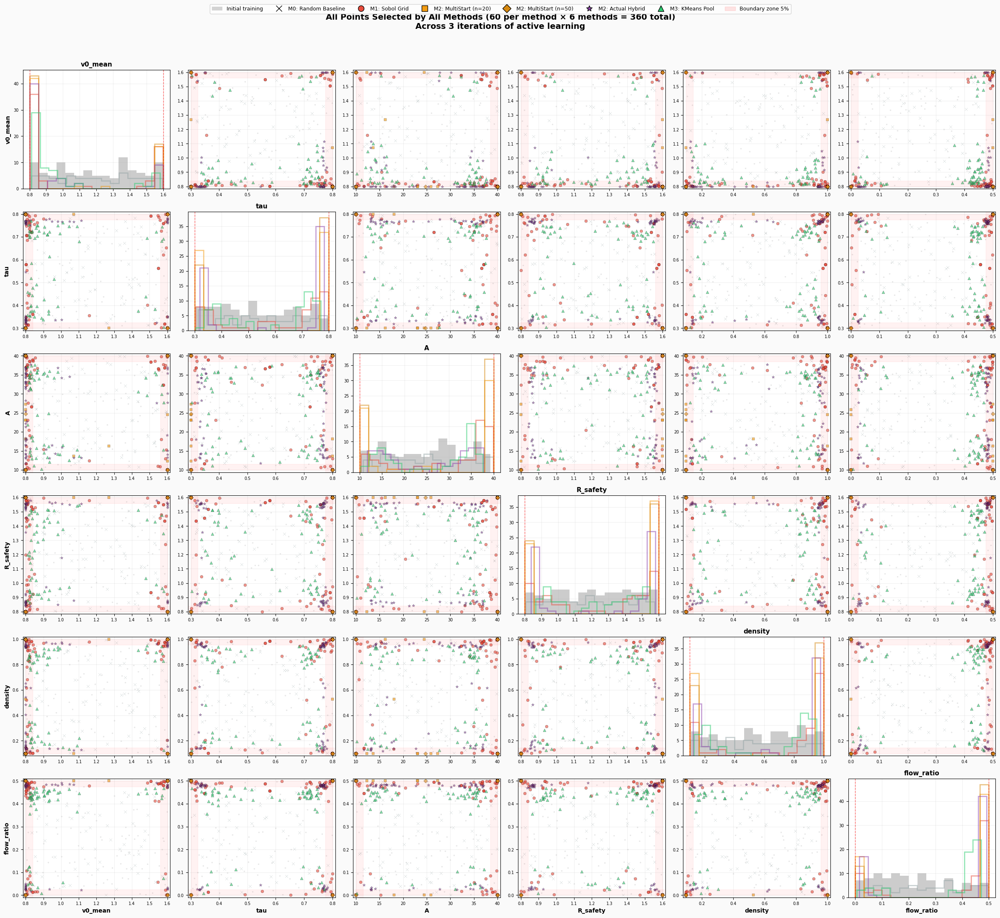


✓ Pairwise scatter → ALL_points_pairwise_matrix.png


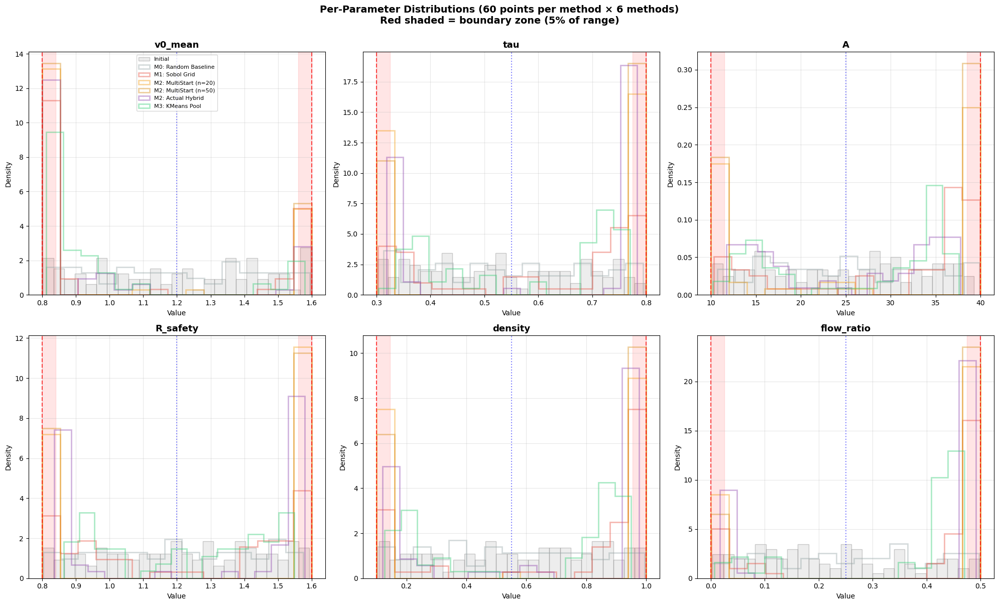

✓ Per-parameter distributions → ALL_points_per_parameter.png


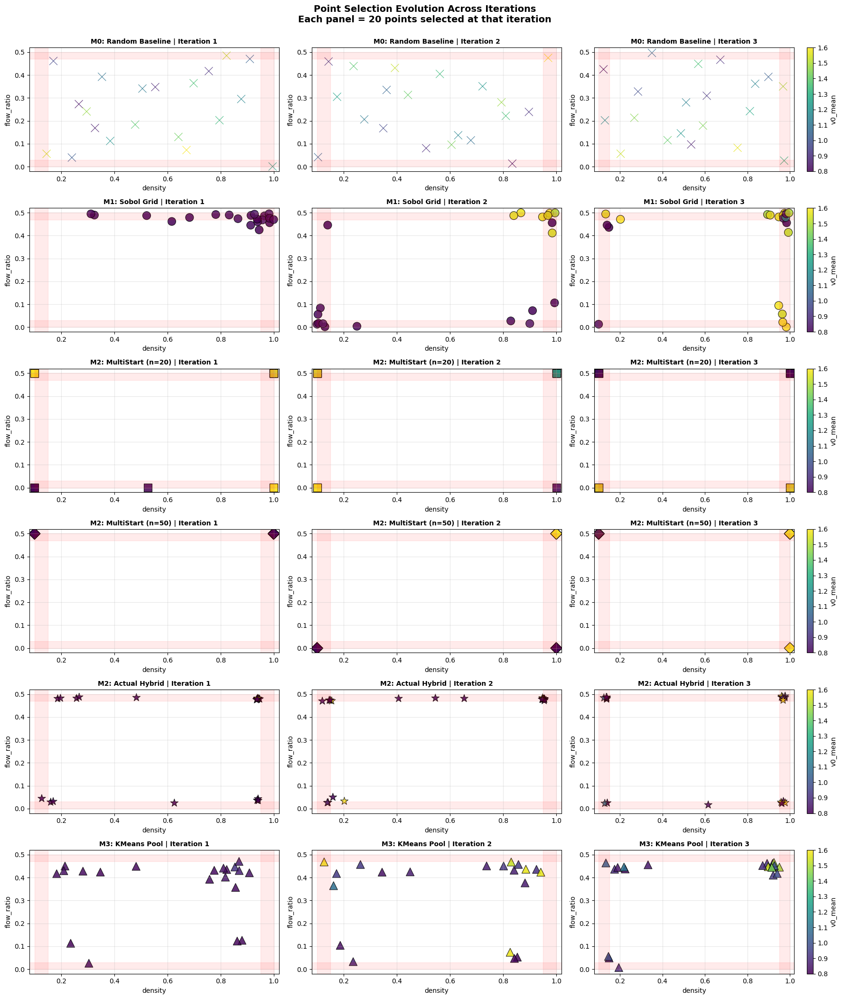

✓ Iteration evolution → ALL_points_iteration_evolution.png


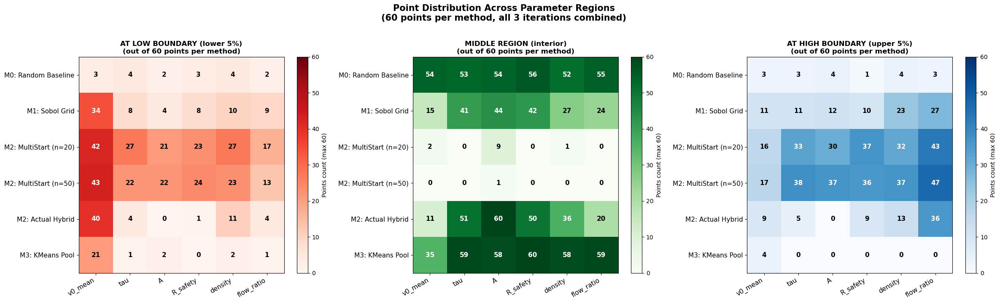

✓ Boundary heatmap → ALL_points_boundary_heatmap.png

EXTREME SCENARIO ANALYSIS

Method                    None     1 met    2 met    All 3   
-----------------------------------------------------------------
M0: Random Baseline       29       22       7        2       
M1: Sobol Grid            26       20       14       0       
M2: MultiStart (n=20)     19       25       13       3       
M2: MultiStart (n=50)     20       27       13       0       
M2: Actual Hybrid         23       25       11       1       
M3: KMeans Pool           30       24       6        0       


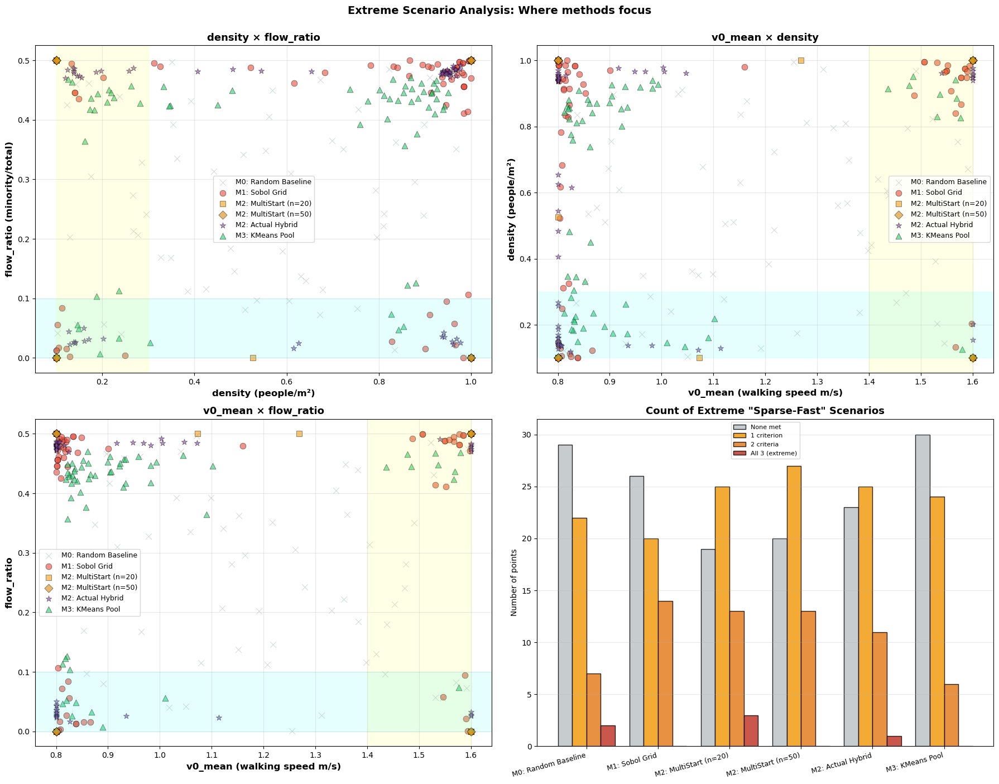


✓ Extreme scenarios → ALL_points_extreme_scenarios.png

ALL DONE


In [3]:
"""
EXTRACT ALL SELECTED POINTS FROM CHECKPOINT PICKLES (6 METHODS)
==============================================================
Loads each method's pickle files and extracts the EXACT points
that were selected during the actual simulation runs.

Each method: 20 points × 3 iterations = 60 points
Total: 60 × 6 methods = 360 points

This gives you the REAL points that were used to train GPs.
"""

import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ======================================================================
# CONFIGURATION
# ======================================================================
N_ITERATIONS         = 3
POINTS_PER_ITERATION = 20
INITIAL_POINTS       = 103   # from your data split (40% of 256)

PARAM_NAMES = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}
lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])

# ── UPDATE THESE PATHS ────────────────────────────────────────────────
PKL_FILES = {
    'M0_Random'   : "M0_Random_Baseline_results_20260716_024107.pkl",
    'M1_Sobol'    : "M1_Sobol_Grid_results_20260716_032006.pkl",
    'M2_n20'      : "M2_MultiStart_results_20260716_034836.pkl",
    'M2_n50'      : "M2_MultiStart_results_20260716_150855.pkl",
    'M2_Actual'   : r"D:\KIT\M2_Actual_Hybrid_results_20260722_221713.pkl",
    'M3_KMeans'   : r"D:\KIT\M3_KMeans_Pool_results_20260722_224903.pkl",
}

PKL_INTERNAL_KEY = {
    'M0_Random' : 'M0_Random_Baseline',
    'M1_Sobol'  : 'M1_Sobol_Grid',
    'M2_n20'    : 'M2_MultiStart',
    'M2_n50'    : 'M2_MultiStart',
    'M2_Actual' : 'M2_Actual_Hybrid',
    'M3_KMeans' : 'M3_KMeans_Pool',
}

LABELS = {
    'M0_Random' : 'M0: Random Baseline',
    'M1_Sobol'  : 'M1: Sobol Grid',
    'M2_n20'    : 'M2: MultiStart (n=20)',
    'M2_n50'    : 'M2: MultiStart (n=50)',
    'M2_Actual' : 'M2: Actual Hybrid',
    'M3_KMeans' : 'M3: KMeans Pool',
}

COLORS = {
    'M0_Random' : '#95a5a6',
    'M1_Sobol'  : '#e74c3c',
    'M2_n20'    : '#f39c12',
    'M2_n50'    : '#d68910',
    'M2_Actual' : '#8e44ad',
    'M3_KMeans' : '#2ecc71',
}

MARKERS = {
    'M0_Random' : 'x', 
    'M1_Sobol'  : 'o',
    'M2_n20'    : 's', 
    'M2_n50'    : 'D', 
    'M2_Actual' : '*', 
    'M3_KMeans' : '^',
}

# ======================================================================
# LOAD PICKLES AND EXTRACT NEW POINTS PER ITERATION
# ======================================================================
def extract_all_new_points():
    """
    From each pickle, extract the NEW points added at each iteration.
    
    Structure of pickle:
    - X_train is a list of len (N_ITERATIONS + 1)
    - X_train[0] = initial 103 points
    - X_train[1] = 103 + 20 = 123 points (after iter 1)
    - X_train[2] = 143 points (after iter 2)
    - X_train[3] = 163 points (after iter 3)
    
    So NEW points at iter i = X_train[i] MINUS X_train[i-1]
    = last 20 rows of X_train[i]
    """
    all_data = {}
    initial_X = None

    print("="*80)
    print("EXTRACTING NEW POINTS PER ITERATION FROM CHECKPOINT PICKLES")
    print("="*80)

    for method_key, filepath in PKL_FILES.items():
        try:
            with open(filepath, 'rb') as f:
                ckpt = pickle.load(f)

            internal_key = PKL_INTERNAL_KEY[method_key]
            results = ckpt['results']

            if internal_key in results:
                d = results[internal_key]
            else:
                d = list(results.values())[0]

            # Verify structure
            n_snapshots = len(d['X_train'])
            print(f"\n{LABELS[method_key]}")
            print(f"  File            : {filepath}")
            print(f"  X_train snapshots: {n_snapshots}")
            print(f"  Sizes           : {[len(x) for x in d['X_train']]}")

            # Extract initial data from first pickle
            if initial_X is None:
                initial_X = d['X_train'][0]
                print(f"  Initial train X : {initial_X.shape}")

            # Extract NEW points per iteration
            new_points_per_iter = []
            y_new_per_iter      = []
            y_std_per_iter      = []
            for i in range(1, n_snapshots):
                X_prev = d['X_train'][i-1]
                X_curr = d['X_train'][i]
                new_pts = X_curr[len(X_prev):]

                y_curr = d['y_train'][i]
                ys_curr = d['y_std_train'][i]
                y_new  = y_curr[len(X_prev):]
                ys_new = ys_curr[len(X_prev):]

                new_points_per_iter.append(new_pts)
                y_new_per_iter.append(y_new)
                y_std_per_iter.append(ys_new)

                print(f"  Iter {i} new pts : {len(new_pts)}")

            all_data[method_key] = {
                'new_points_per_iter': new_points_per_iter,
                'y_new_per_iter'     : y_new_per_iter,
                'y_std_new_per_iter' : y_std_per_iter,
                'r2_history'         : d['r2_history'],
                'boundary_history'   : d.get('boundary_pts_history', []),
                'interior_history'   : d.get('interior_pts_history', []),
            }

        except FileNotFoundError:
            print(f"\n✗ NOT FOUND: {filepath}")
        except Exception as e:
            print(f"\n✗ ERROR: {method_key}: {e}")

    return all_data, initial_X

# ======================================================================
# BUILD COMBINED DATAFRAME
# ======================================================================
def build_full_dataframe(all_data):
    """
    Build one DataFrame containing ALL points from ALL methods and iterations.
    Each row = one point with metadata.
    """
    rows = []
    for method_key, d in all_data.items():
        for iter_i, (pts, ys, ys_std) in enumerate(
            zip(d['new_points_per_iter'],
                d['y_new_per_iter'],
                d['y_std_new_per_iter'])
        ):
            for pt_idx, (x, y, ystd) in enumerate(zip(pts, ys, ys_std)):
                xn   = (x - lowers) / (uppers - lowers)
                dmin = np.min(np.minimum(xn, 1 - xn))
                is_bnd = dmin < 0.05

                row = {
                    'method'         : method_key,
                    'method_label'   : LABELS[method_key],
                    'iteration'      : iter_i + 1,
                    'point_idx'      : pt_idx + 1,
                    'global_id'      : f"{method_key}_i{iter_i+1}_p{pt_idx+1}",
                }
                for j, p in enumerate(PARAM_NAMES):
                    row[p] = x[j]

                row['y_simulated']    = y
                row['y_std']          = ystd
                row['dist_to_bound']  = dmin
                row['is_boundary']    = 'YES' if is_bnd else 'NO'
                rows.append(row)

    df = pd.DataFrame(rows)
    return df

# ======================================================================
# PRINT SUMMARY
# ======================================================================
def print_summary(df):
    print(f"\n{'='*80}")
    print("SUMMARY BY METHOD")
    print(f"{'='*80}")

    summary = df.groupby('method').agg(
        n_points   =('point_idx', 'count'),
        n_boundary =('is_boundary', lambda x: (x == 'YES').sum()),
        n_interior =('is_boundary', lambda x: (x == 'NO').sum()),
        avg_y      =('y_simulated', 'mean'),
        min_y      =('y_simulated', 'min'),
        max_y      =('y_simulated', 'max'),
        avg_density=('density', 'mean'),
        avg_v0     =('v0_mean', 'mean'),
        avg_flow   =('flow_ratio', 'mean'),
    ).round(3)

    print(summary.to_string())

    print(f"\n{'='*80}")
    print("POINTS PER METHOD × ITERATION")
    print(f"{'='*80}")
    piv = df.pivot_table(index='method', columns='iteration',
                         values='point_idx', aggfunc='count')
    print(piv.to_string())

# ======================================================================
# PLOT 1: PAIRWISE SCATTER
# ======================================================================
def plot_pairwise_all(df, initial_X, save_path='all_points_pairwise.png'):
    d = len(PARAM_NAMES)
    fig, axes = plt.subplots(d, d, figsize=(24, 22))
    fig.patch.set_facecolor('#fafafa')

    for i in range(d):
        for j in range(d):
            ax = axes[i, j]

            if i == j:
                ax.hist(initial_X[:, i], bins=15, alpha=0.2,
                        color='black', label='Initial')
                for method_key in LABELS:
                    if method_key not in df['method'].unique():
                        continue
                    subset = df[df['method'] == method_key]
                    ax.hist(subset[PARAM_NAMES[i]], bins=15, alpha=0.5,
                            color=COLORS[method_key],
                            histtype='step', linewidth=2,
                            label=LABELS[method_key])
                ax.set_title(PARAM_NAMES[i], fontsize=11, fontweight='bold')

                lo, hi = PARAM_BOUNDS[PARAM_NAMES[i]]
                ax.axvline(lo, color='red', linestyle='--', alpha=0.6, lw=1)
                ax.axvline(hi, color='red', linestyle='--', alpha=0.6, lw=1)
            else:
                ax.scatter(initial_X[:, j], initial_X[:, i],
                           color='lightgray', s=10, alpha=0.4, marker='.')

                for method_key in LABELS:
                    if method_key not in df['method'].unique():
                        continue
                    subset = df[df['method'] == method_key]
                    ax.scatter(subset[PARAM_NAMES[j]], subset[PARAM_NAMES[i]],
                               color=COLORS[method_key],
                               marker=MARKERS[method_key],
                               s=25, alpha=0.6,
                               edgecolor='black', linewidth=0.3,
                               label=LABELS[method_key])

                lo_j, hi_j = PARAM_BOUNDS[PARAM_NAMES[j]]
                lo_i, hi_i = PARAM_BOUNDS[PARAM_NAMES[i]]
                zone = 0.05
                ax.axvspan(lo_j, lo_j + zone*(hi_j-lo_j), color='red', alpha=0.05)
                ax.axvspan(hi_j - zone*(hi_j-lo_j), hi_j, color='red', alpha=0.05)
                ax.axhspan(lo_i, lo_i + zone*(hi_i-lo_i), color='red', alpha=0.05)
                ax.axhspan(hi_i - zone*(hi_i-lo_i), hi_i, color='red', alpha=0.05)

                ax.set_xlim(lo_j - 0.02*(hi_j-lo_j), hi_j + 0.02*(hi_j-lo_j))
                ax.set_ylim(lo_i - 0.02*(hi_i-lo_i), hi_i + 0.02*(hi_i-lo_i))

            if i == d-1:
                ax.set_xlabel(PARAM_NAMES[j], fontsize=10, fontweight='bold')
            if j == 0:
                ax.set_ylabel(PARAM_NAMES[i], fontsize=10, fontweight='bold')

            ax.tick_params(labelsize=7)
            ax.grid(True, alpha=0.2)

    handles = [Patch(facecolor='lightgray', label='Initial training')]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        handles.append(plt.Line2D([0], [0],
                                  marker=MARKERS[method_key],
                                  color='w',
                                  markerfacecolor=COLORS[method_key],
                                  markersize=10, markeredgecolor='black',
                                  label=LABELS[method_key]))
    handles.append(Patch(color='red', alpha=0.1, label='Boundary zone 5%'))
    fig.legend(handles=handles, loc='upper center',
               bbox_to_anchor=(0.5, 0.998), ncol=8, fontsize=9)

    plt.suptitle(f'All Points Selected by All Methods (60 per method × {len(df["method"].unique())} methods = {len(df)} total)\n'
                 f'Across {N_ITERATIONS} iterations of active learning',
                 fontsize=14, fontweight='bold', y=0.985)
    plt.tight_layout(rect=[0, 0, 1, 0.965])
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"\n✓ Pairwise scatter → {save_path}")

# ======================================================================
# PLOT 2: PER-PARAMETER DISTRIBUTIONS
# ======================================================================
def plot_per_parameter(df, initial_X, save_path='all_points_per_param.png'):
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.flatten()

    for idx, param in enumerate(PARAM_NAMES):
        ax = axes[idx]
        lo, hi = PARAM_BOUNDS[param]

        ax.hist(initial_X[:, idx], bins=25, color='lightgray',
                alpha=0.4, edgecolor='gray', label='Initial',
                density=True)

        for method_key in LABELS:
            if method_key not in df['method'].unique():
                continue
            subset = df[df['method'] == method_key][param]
            ax.hist(subset, bins=15, color=COLORS[method_key],
                    alpha=0.4, linewidth=2,
                    label=LABELS[method_key], density=True,
                    histtype='step')

        ax.axvline(lo, color='red', linestyle='--', alpha=0.7)
        ax.axvline(hi, color='red', linestyle='--', alpha=0.7)
        ax.axvline((lo+hi)/2, color='blue', linestyle=':', alpha=0.5)

        zone = 0.05*(hi-lo)
        ax.axvspan(lo, lo+zone, color='red', alpha=0.1)
        ax.axvspan(hi-zone, hi, color='red', alpha=0.1)

        ax.set_title(param, fontsize=13, fontweight='bold')
        ax.set_xlabel('Value')
        ax.set_ylabel('Density')
        ax.grid(True, alpha=0.3)

        if idx == 0:
            ax.legend(fontsize=8, loc='upper center')

    plt.suptitle(f'Per-Parameter Distributions (60 points per method × {len(df["method"].unique())} methods)\n'
                 'Red shaded = boundary zone (5% of range)',
                 fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"✓ Per-parameter distributions → {save_path}")

# ======================================================================
# PLOT 3: ITERATION EVOLUTION
# ======================================================================
def plot_iteration_evolution(df, save_path='iteration_evolution.png'):
    fig, axes = plt.subplots(len(LABELS), N_ITERATIONS,
                           figsize=(18, 3.5 * len(LABELS)))

    for row_i, method_key in enumerate(LABELS):
        if method_key not in df['method'].unique():
            continue
        for col_i, iter_num in enumerate(range(1, N_ITERATIONS+1)):
            ax = axes[row_i, col_i]
            subset = df[(df['method'] == method_key) &
                        (df['iteration'] == iter_num)]

            sc = ax.scatter(subset['density'], subset['flow_ratio'],
                            c=subset['v0_mean'], cmap='viridis',
                            marker=MARKERS[method_key],
                            s=150, alpha=0.85,
                            edgecolor='black', linewidth=0.8,
                            vmin=0.8, vmax=1.6)

            ax.axvspan(0.10, 0.15, color='red', alpha=0.08)
            ax.axvspan(0.95, 1.00, color='red', alpha=0.08)
            ax.axhspan(0.00, 0.03, color='red', alpha=0.08)
            ax.axhspan(0.47, 0.50, color='red', alpha=0.08)

            ax.set_xlim(0.08, 1.02)
            ax.set_ylim(-0.02, 0.52)
            ax.set_xlabel('density', fontsize=10)
            ax.set_ylabel('flow_ratio', fontsize=10)
            ax.set_title(f'{LABELS[method_key]} | Iteration {iter_num}',
                         fontsize=10, fontweight='bold')
            ax.grid(True, alpha=0.3)

            if col_i == N_ITERATIONS - 1:
                plt.colorbar(sc, ax=ax, label='v0_mean')

    plt.suptitle('Point Selection Evolution Across Iterations\n'
                 'Each panel = 20 points selected at that iteration',
                 fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"✓ Iteration evolution → {save_path}")

# ======================================================================
# PLOT 4: BOUNDARY HEATMAP
# ======================================================================
def plot_boundary_heatmap(df, save_path='boundary_heatmap.png'):
    methods = [m for m in LABELS.keys() if m in df['method'].unique()]
    n_m = len(methods)
    n_p = len(PARAM_NAMES)

    low  = np.zeros((n_m, n_p))
    mid  = np.zeros((n_m, n_p))
    high = np.zeros((n_m, n_p))

    for mi, m in enumerate(methods):
        subset = df[df['method'] == m]
        for pi, p in enumerate(PARAM_NAMES):
            lo, hi = PARAM_BOUNDS[p]
            zone = 0.05 * (hi - lo)
            vals = subset[p].values
            low[mi, pi]  = np.sum(vals < lo + zone)
            high[mi, pi] = np.sum(vals > hi - zone)
            mid[mi, pi]  = len(vals) - low[mi, pi] - high[mi, pi]

    fig, axes = plt.subplots(1, 3, figsize=(24, 7))

    for ax, mat, title, cmap in zip(
        axes,
        [low, mid, high],
        ['AT LOW BOUNDARY (lower 5%)',
         'MIDDLE REGION (interior)',
         'AT HIGH BOUNDARY (upper 5%)'],
        ['Reds', 'Greens', 'Blues']
    ):
        im = ax.imshow(mat, cmap=cmap, aspect='auto', vmin=0, vmax=60)

        for i in range(n_m):
            for j in range(n_p):
                val = int(mat[i, j])
                color = 'white' if val > 30 else 'black'
                ax.text(j, i, str(val), ha='center', va='center',
                        color=color, fontsize=11, fontweight='bold')

        ax.set_xticks(range(n_p))
        ax.set_xticklabels(PARAM_NAMES, rotation=30, ha='right', fontsize=11)
        ax.set_yticks(range(n_m))
        ax.set_yticklabels([LABELS[m] for m in methods], fontsize=11)
        ax.set_title(title + '\n(out of 60 points per method)',
                     fontweight='bold', fontsize=12)
        plt.colorbar(im, ax=ax, label='Points count (max 60)')

    plt.suptitle('Point Distribution Across Parameter Regions\n'
                 '(60 points per method, all 3 iterations combined)',
                 fontsize=15, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"✓ Boundary heatmap → {save_path}")

# ======================================================================
# PLOT 5: EXTREME SCENARIOS
# ======================================================================
def plot_extreme_scenarios(df, save_path='extreme_scenarios.png'):
    print(f"\n{'='*80}")
    print("EXTREME SCENARIO ANALYSIS")
    print(f"{'='*80}")

    fig, axes = plt.subplots(2, 2, figsize=(18, 14))

    ax = axes[0, 0]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        ax.scatter(subset['density'], subset['flow_ratio'],
                   color=COLORS[method_key], marker=MARKERS[method_key],
                   s=60, alpha=0.6, edgecolor='black', linewidth=0.5,
                   label=LABELS[method_key])
    ax.axvspan(0.10, 0.30, alpha=0.1, color='yellow')
    ax.axhspan(0.00, 0.10, alpha=0.1, color='cyan')
    ax.set_xlabel('density (people/m²)', fontsize=12, fontweight='bold')
    ax.set_ylabel('flow_ratio (minority/total)', fontsize=12, fontweight='bold')
    ax.set_title('density × flow_ratio', fontsize=13, fontweight='bold')
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)

    ax = axes[0, 1]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        ax.scatter(subset['v0_mean'], subset['density'],
                   color=COLORS[method_key], marker=MARKERS[method_key],
                   s=60, alpha=0.6, edgecolor='black', linewidth=0.5,
                   label=LABELS[method_key])
    ax.axvspan(1.40, 1.60, alpha=0.1, color='yellow')
    ax.axhspan(0.10, 0.30, alpha=0.1, color='cyan')
    ax.set_xlabel('v0_mean (walking speed m/s)', fontsize=12, fontweight='bold')
    ax.set_ylabel('density (people/m²)', fontsize=12, fontweight='bold')
    ax.set_title('v0_mean × density', fontsize=13, fontweight='bold')
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)

    ax = axes[1, 0]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        ax.scatter(subset['v0_mean'], subset['flow_ratio'],
                   color=COLORS[method_key], marker=MARKERS[method_key],
                   s=60, alpha=0.6, edgecolor='black', linewidth=0.5,
                   label=LABELS[method_key])
    ax.axvspan(1.40, 1.60, alpha=0.1, color='yellow')
    ax.axhspan(0.00, 0.10, alpha=0.1, color='cyan')
    ax.set_xlabel('v0_mean (walking speed m/s)', fontsize=12, fontweight='bold')
    ax.set_ylabel('flow_ratio', fontsize=12, fontweight='bold')
    ax.set_title('v0_mean × flow_ratio', fontsize=13, fontweight='bold')
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)

    ax = axes[1, 1]
    counts = {}
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        low_d  = subset['density']    < 0.30
        low_f  = subset['flow_ratio'] < 0.10
        high_v = subset['v0_mean']    > 1.40

        all_three = np.sum(low_d & low_f & high_v)
        two_met = np.sum(
            (low_d & low_f) | (low_d & high_v) | (low_f & high_v)
        ) - all_three
        one_met = np.sum(low_d | low_f | high_v) - two_met - all_three
        none_met = len(subset) - one_met - two_met - all_three

        counts[method_key] = [none_met, one_met, two_met, all_three]

    method_list = list(counts.keys())
    x_pos = np.arange(len(method_list))
    w = 0.2
    lbls = ['None met', '1 criterion', '2 criteria', 'All 3 (extreme)']
    cols = ['#bdc3c7', '#f39c12', '#e67e22', '#c0392b']

    for i, lbl in enumerate(lbls):
        vals = [counts[m][i] for m in method_list]
        ax.bar(x_pos + (i-1.5)*w, vals, w, color=cols[i],
               alpha=0.85, edgecolor='black', label=lbl)

    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[m] for m in method_list],
                       fontsize=9, rotation=15, ha='right')
    ax.set_title('Count of Extreme "Sparse-Fast" Scenarios', fontsize=13, fontweight='bold')
    ax.set_ylabel('Number of points')
    ax.legend(fontsize=8)
    ax.grid(axis='y', alpha=0.3)

    print(f"\n{'Method':<25} {'None':<8} {'1 met':<8} {'2 met':<8} {'All 3':<8}")
    print("-" * 65)
    for m, c in counts.items():
        print(f"{LABELS[m]:<25} {c[0]:<8} {c[1]:<8} {c[2]:<8} {c[3]:<8}")

    plt.suptitle('Extreme Scenario Analysis: Where methods focus', fontsize=14, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"\n✓ Extreme scenarios → {save_path}")

# ======================================================================
# MAIN
# ======================================================================
if __name__ == "__main__":
    print("="*80)
    print("EXTRACT ALL POINTS FROM ACTUAL SIMULATION RUNS (6 METHODS)")
    print("="*80)

    all_data, initial_X = extract_all_new_points()

    if len(all_data) == 0:
        print("\n✗ No data loaded!")
        exit()

    df = build_full_dataframe(all_data)

    print(f"\n{'='*80}")
    print(f"TOTAL POINTS EXTRACTED: {len(df)}")
    print(f"({len(all_data)} methods × {N_ITERATIONS} iterations × "
          f"{POINTS_PER_ITERATION} points each)")
    print(f"{'='*80}")

    csv_file = 'all_selected_points_full_6_methods.csv'
    df.to_csv(csv_file, index=False, float_format='%.4f')
    print(f"\n✓ Full CSV saved → {csv_file}")

    for method_key in df['method'].unique():
        subset = df[df['method'] == method_key]
        f_name = f'points_{method_key}.csv'
        subset.to_csv(f_name, index=False, float_format='%.4f')
        print(f"  ✓ {f_name} ({len(subset)} points)")

    print_summary(df)

    print(f"\n{'='*80}")
    print("GENERATING PLOTS")
    print(f"{'='*80}")

    plot_pairwise_all(df, initial_X, save_path='ALL_points_pairwise_matrix.png')
    plot_per_parameter(df, initial_X, save_path='ALL_points_per_parameter.png')
    plot_iteration_evolution(df, save_path='ALL_points_iteration_evolution.png')
    plot_boundary_heatmap(df, save_path='ALL_points_boundary_heatmap.png')
    plot_extreme_scenarios(df, save_path='ALL_points_extreme_scenarios.png')

    print(f"\n{'='*80}")
    print("ALL DONE")
    print(f"{'='*80}")

## All methods Result comparision

LOADING 6-WAY ACTIVE LEARNING CHECKPOINT FILES
 ✓ Successfully loaded: M0: Random Baseline from M0_Random_Baseline_results_20260716_024107.pkl
 ✓ Successfully loaded: M1: Sobol Grid from M1_Sobol_Grid_results_20260716_032006.pkl
 ✓ Successfully loaded: M2: MultiStart (n=20) from M2_MultiStart_results_20260716_034836.pkl
 ✓ Successfully loaded: M2: MultiStart (n=50) from M2_MultiStart_results_20260716_150855.pkl
 ✓ Successfully loaded: M2: Actual Hybrid from D:\KIT\M2_Actual_Hybrid_results_20260722_221713.pkl
 ✓ Successfully loaded: M3: KMeans Pool from D:\KIT\M3_KMeans_Pool_results_20260722_224903.pkl


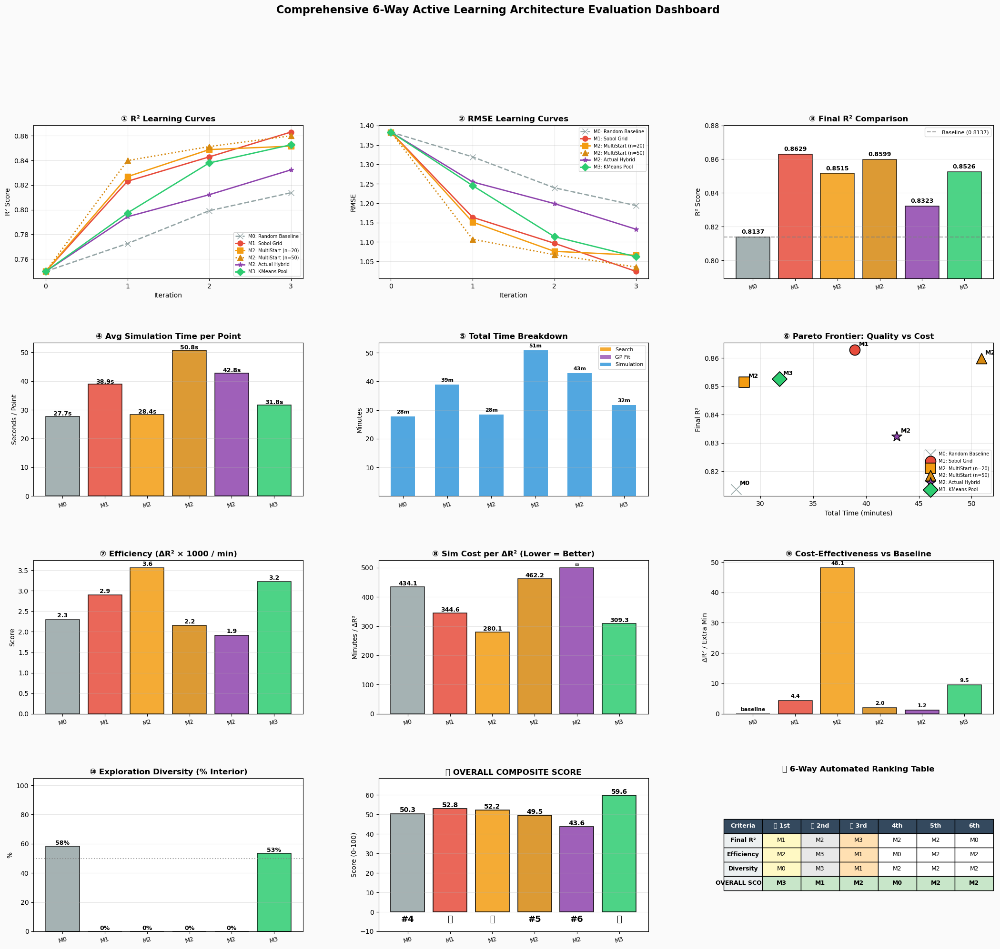


✓ 6-Way Dashboard successfully saved → Ultimate_6Way_Dashboard.png

                              6-WAY ACTIVE LEARNING COMPARISON SUMMARY                              
               Method Final R² ΔR² Gain Total Time (min) Diversity (%) Overall Score
  M0: Random Baseline   0.8137  +0.0638             27.7         58.3%          50.3
       M1: Sobol Grid   0.8629  +0.1130             39.0          0.0%          52.8
M2: MultiStart (n=20)   0.8515  +0.1015             28.5          0.0%          52.2
M2: MultiStart (n=50)   0.8599  +0.1099             50.9          0.0%          49.5
    M2: Actual Hybrid   0.8323  +0.0823             42.9          0.0%          43.6
      M3: KMeans Pool   0.8526  +0.1026             31.8         53.3%          59.6

✓ Summary saved to Ultimate_6Way_Summary.csv



In [4]:
"""
ULTIMATE 6-WAY ACTIVE LEARNING UNIVERSAL COMPARISON & DASHBOARD
================================================================================
Compares M0, M1, M2 (n=20), M2 (n=50), M2 Actual Hybrid, and M3 (K-Means Pool).
Generates a comprehensive 12-panel analytical dashboard with advanced metrics,
Pareto efficiency analysis, composite scoring, and an automated ranking table.
"""

import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# ======================================================================
# 1. CONFIGURATION & FILE PATHS (ALL 6 METHODS)
# ======================================================================
N_ITERATIONS         = 3
POINTS_PER_ITERATION = 20
INITIAL_POINTS       = 103

PKL_FILES = {
    'M0_Random'   : "M0_Random_Baseline_results_20260716_024107.pkl",
    'M1_Sobol'    : "M1_Sobol_Grid_results_20260716_032006.pkl",
    'M2_n20'      : "M2_MultiStart_results_20260716_034836.pkl",
    'M2_n50'      : "M2_MultiStart_results_20260716_150855.pkl",
    'M2_Actual'   : r"D:\KIT\M2_Actual_Hybrid_results_20260722_221713.pkl",
    'M3_KMeans'   : r"D:\KIT\M3_KMeans_Pool_results_20260722_224903.pkl",
}

PKL_INTERNAL_KEY = {
    'M0_Random'   : 'M0_Random_Baseline',
    'M1_Sobol'    : 'M1_Sobol_Grid',
    'M2_n20'      : 'M2_MultiStart',
    'M2_n50'      : 'M2_MultiStart',
    'M2_Actual'   : 'M2_Actual_Hybrid',
    'M3_KMeans'   : 'M3_KMeans_Pool',
}

LABELS = {
    'M0_Random'   : 'M0: Random Baseline',
    'M1_Sobol'    : 'M1: Sobol Grid',
    'M2_n20'      : 'M2: MultiStart (n=20)',
    'M2_n50'      : 'M2: MultiStart (n=50)',
    'M2_Actual'   : 'M2: Actual Hybrid',
    'M3_KMeans'   : 'M3: KMeans Pool',
}

COLORS = {
    'M0_Random'   : '#95a5a6', # Gray
    'M1_Sobol'    : '#e74c3c', # Red
    'M2_n20'      : '#f39c12', # Orange
    'M2_n50'      : '#d68910', # Dark Orange
    'M2_Actual'   : '#8e44ad', # Purple
    'M3_KMeans'   : '#2ecc71', # Green
}

MARKERS = {
    'M0_Random'   : 'x',
    'M1_Sobol'    : 'o',
    'M2_n20'      : 's',
    'M2_n50'      : '^',
    'M2_Actual'   : '*',
    'M3_KMeans'   : 'D',
}

LINESTYLES = {
    'M0_Random'   : '--',
    'M1_Sobol'    : '-',
    'M2_n20'      : '-',
    'M2_n50'      : ':',
    'M2_Actual'   : '-',
    'M3_KMeans'   : '-',
}

# ======================================================================
# 2. DATA LOADING LOGIC
# ======================================================================
def load_all_data():
    combined_results = {}
    print("="*80)
    print("LOADING 6-WAY ACTIVE LEARNING CHECKPOINT FILES")
    print("="*80)
    for k, filepath in PKL_FILES.items():
        try:
            with open(filepath, 'rb') as f:
                ckpt = pickle.load(f)
            res = ckpt['results']
            ik = PKL_INTERNAL_KEY[k]
            if ik in res:
                combined_results[k] = res[ik]
            else:
                combined_results[k] = list(res.values())[0]
            print(f" ✓ Successfully loaded: {LABELS[k]} from {filepath}")
        except Exception as e:
            print(f" ✗ [!] Error loading {k} ({filepath}): {e}")
    return combined_results

# ======================================================================
# 3. UNIVERSAL METRICS COMPUTATION
# ======================================================================
def compute_universal_metrics(all_data):
    metrics = {}
    base_r2 = all_data['M0_Random']['r2_history'][-1]
    base_sim_time = sum(all_data['M0_Random']['sim_time_history'])

    for k, d in all_data.items():
        r2_init  = d['r2_history'][0]
        r2_final = d['r2_history'][-1]
        rm_final = d['rmse_history'][-1]

        t_search = sum(d['search_time_history'])
        t_sim    = sum(d['sim_time_history'])
        t_fit    = sum(d['fit_time_history'])
        t_total  = t_search + t_sim + t_fit

        r2_gain  = r2_final - r2_init
        advantage = r2_final - base_r2

        tot_b = sum(d['boundary_pts_history'])
        tot_i = sum(d['interior_pts_history'])
        bnd_pct = (tot_b / (tot_b + tot_i) * 100) if (tot_b + tot_i) > 0 else 0
        diversity = 100 - bnd_pct

        # Efficiency & Cost metrics
        efficiency = r2_gain / (t_total / 60) if t_total > 0 else 0
        sim_cost = (t_sim / 60) / r2_gain if r2_gain > 0 else float('inf')
        val_per_pt = r2_gain / (N_ITERATIONS * POINTS_PER_ITERATION)
        speedup = base_sim_time / t_sim if t_sim > 0 else 0

        extra_time_min = (t_total - (sum(all_data['M0_Random']['search_time_history']) + 
                                     sum(all_data['M0_Random']['fit_time_history']) + 
                                     base_sim_time)) / 60
        if abs(extra_time_min) < 0.1:
            cost_eff = float('inf')
        else:
            cost_eff = advantage / extra_time_min if extra_time_min > 0 else -1

        # Composite overall score (0-100 scale)
        norm_r2  = max(0, min(1, (r2_final - 0.70) / 0.20))
        norm_eff = min(efficiency * 50, 1.0)
        norm_div = diversity / 100
        norm_spd = max(0, min(1, 1.0 - (t_total / 6000)))

        overall = (0.50 * norm_r2 + 0.20 * norm_eff + 0.15 * norm_div + 0.15 * norm_spd) * 100

        metrics[k] = {
            'label'         : LABELS[k],
            'final_r2'      : r2_final,
            'final_rmse'    : rm_final,
            'r2_gain'       : r2_gain,
            'advantage'     : advantage,
            't_search'      : t_search,
            't_sim'         : t_sim,
            't_fit'         : t_fit,
            't_total'       : t_total,
            't_total_min'   : t_total / 60,
            'boundary_pct'  : bnd_pct,
            'diversity'     : diversity,
            'efficiency'    : efficiency,
            'sim_cost'      : sim_cost,
            'val_per_pt'    : val_per_pt,
            'cost_eff'      : cost_eff,
            'speedup'       : speedup,
            'overall_score' : overall,
        }
    return metrics

# ======================================================================
# 4. COMPREHENSIVE 12-PANEL DASHBOARD PLOTTER
# ======================================================================
def plot_universal_dashboard(all_data, metrics, save_path='Ultimate_6Way_Dashboard.png'):
    keys   = list(all_data.keys())
    iters  = np.arange(0, N_ITERATIONS + 1)
    x_pos  = np.arange(len(keys))
    bcols  = [COLORS[k] for k in keys]

    fig = plt.figure(figsize=(26, 22))
    fig.patch.set_facecolor('#fafafa')
    gs  = GridSpec(4, 3, figure=fig, hspace=0.42, wspace=0.28)

    # ── ROW 1: BASIC PERFORMANCE ──────────────────────────────────────
    # 1. R² Curves
    ax = fig.add_subplot(gs[0, 0])
    for k, d in all_data.items():
        ax.plot(iters, d['r2_history'], color=COLORS[k], marker=MARKERS[k],
                linestyle=LINESTYLES[k], linewidth=2, markersize=8, label=LABELS[k])
    ax.set_title('① R² Learning Curves', fontweight='bold', fontsize=12)
    ax.set_xlabel('Iteration'); ax.set_ylabel('R² Score')
    ax.legend(fontsize=7, loc='lower right'); ax.grid(True, alpha=0.3)
    ax.set_xticks(iters)

    # 2. RMSE Curves
    ax = fig.add_subplot(gs[0, 1])
    for k, d in all_data.items():
        ax.plot(iters, d['rmse_history'], color=COLORS[k], marker=MARKERS[k],
                linestyle=LINESTYLES[k], linewidth=2, markersize=8, label=LABELS[k])
    ax.set_title('② RMSE Learning Curves', fontweight='bold', fontsize=12)
    ax.set_xlabel('Iteration'); ax.set_ylabel('RMSE')
    ax.legend(fontsize=7); ax.grid(True, alpha=0.3)
    ax.set_xticks(iters)

    # 3. Final R² Comparison Bar Chart
    ax = fig.add_subplot(gs[0, 2])
    final_r2 = [metrics[k]['final_r2'] for k in keys]
    bars = ax.bar(x_pos, final_r2, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val in zip(bars, final_r2):
        ax.text(bar.get_x() + bar.get_width()/2, val + 0.002, f'{val:.4f}', ha='center', fontsize=9, fontweight='bold')
    base_r2 = metrics['M0_Random']['final_r2']
    ax.axhline(base_r2, color='gray', linestyle='--', linewidth=1.5, alpha=0.7, label=f'Baseline ({base_r2:.4f})')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9, rotation=15)
    ax.set_title('③ Final R² Comparison', fontweight='bold', fontsize=12)
    ax.set_ylabel('R² Score')
    ax.set_ylim(min(final_r2)*0.97, max(final_r2)*1.02)
    ax.legend(fontsize=8); ax.grid(axis='y', alpha=0.3)

    # ── ROW 2: TIME COMPLEXITY & PARETO ───────────────────────────────
    # 4. Simulation Time per Point
    ax = fig.add_subplot(gs[1, 0])
    sim_per_pt = [metrics[k]['t_sim'] / (N_ITERATIONS * POINTS_PER_ITERATION) for k in keys]
    bars = ax.bar(x_pos, sim_per_pt, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val in zip(bars, sim_per_pt):
        ax.text(bar.get_x() + bar.get_width()/2, val + 0.3, f'{val:.1f}s', ha='center', fontsize=9, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9, rotation=15)
    ax.set_title('④ Avg Simulation Time per Point', fontweight='bold', fontsize=12)
    ax.set_ylabel('Seconds / Point'); ax.grid(axis='y', alpha=0.3)

    # 5. Total Computation Time Breakdown (Stacked)
    ax = fig.add_subplot(gs[1, 1])
    w = 0.55
    ts = [metrics[k]['t_search'] / 60 for k in keys]
    tf = [metrics[k]['t_fit'] / 60 for k in keys]
    tm = [metrics[k]['t_sim'] / 60 for k in keys]
    ax.bar(x_pos, ts, w, label='Search', color='#f39c12', alpha=0.85)
    ax.bar(x_pos, tf, w, bottom=ts, label='GP Fit', color='#9b59b6', alpha=0.85)
    ax.bar(x_pos, tm, w, bottom=[a+b for a,b in zip(ts,tf)], label='Simulation', color='#3498db', alpha=0.85)
    for i, tot in enumerate([s+f+m for s,f,m in zip(ts,tf,tm)]):
        ax.text(i, tot + 1, f'{tot:.0f}m', ha='center', fontsize=8, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9, rotation=15)
    ax.set_title('⑤ Total Time Breakdown', fontweight='bold', fontsize=12)
    ax.set_ylabel('Minutes'); ax.legend(fontsize=8); ax.grid(axis='y', alpha=0.3)

    # 6. Pareto Frontier: R² vs Total Time
    ax = fig.add_subplot(gs[1, 2])
    for k in keys:
        m = metrics[k]
        ax.scatter(m['t_total_min'], m['final_r2'], color=COLORS[k], marker=MARKERS[k],
                   s=250, edgecolor='black', linewidth=1.2, label=LABELS[k], zorder=3)
        ax.annotate(LABELS[k].split(':')[0], (m['t_total_min'], m['final_r2']),
                    textcoords='offset points', xytext=(6, 6), fontsize=9, fontweight='bold')
    ax.set_title('⑥ Pareto Frontier: Quality vs Cost', fontweight='bold', fontsize=12)
    ax.set_xlabel('Total Time (minutes)'); ax.set_ylabel('Final R²')
    ax.legend(fontsize=7, loc='lower right'); ax.grid(True, alpha=0.3)

    # ── ROW 3: EFFICIENCY RATIOS ──────────────────────────────────────
    # 7. Efficiency Score (R² gain per minute)
    ax = fig.add_subplot(gs[2, 0])
    eff_vals = [metrics[k]['efficiency'] * 1000 for k in keys]
    bars = ax.bar(x_pos, eff_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val in zip(bars, eff_vals):
        ax.text(bar.get_x() + bar.get_width()/2, val + 0.05, f'{val:.1f}', ha='center', fontsize=9, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9, rotation=15)
    ax.set_title('⑦ Efficiency (ΔR² × 1000 / min)', fontweight='bold', fontsize=12)
    ax.set_ylabel('Score'); ax.grid(axis='y', alpha=0.3)

    # 8. Simulation Cost per Unit R² Gain
    ax = fig.add_subplot(gs[2, 1])
    sim_cost_vals = [min(metrics[k]['sim_cost'], 500) for k in keys]
    bars = ax.bar(x_pos, sim_cost_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val, k in zip(bars, sim_cost_vals, keys):
        actual = metrics[k]['sim_cost']
        lbl = f'{actual:.1f}' if actual < 500 else '∞'
        ax.text(bar.get_x() + bar.get_width()/2, val + 5, lbl, ha='center', fontsize=9, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9, rotation=15)
    ax.set_title('⑧ Sim Cost per ΔR² (Lower = Better)', fontweight='bold', fontsize=12)
    ax.set_ylabel('Minutes / ΔR²'); ax.grid(axis='y', alpha=0.3)

    # 9. Cost-Effectiveness vs Baseline
    ax = fig.add_subplot(gs[2, 2])
    ce_vals = [metrics[k]['cost_eff'] * 1000 if metrics[k]['cost_eff'] not in [float('inf'), -1] else 0 for k in keys]
    bars = ax.bar(x_pos, ce_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val, k in zip(bars, ce_vals, keys):
        actual = metrics[k]['cost_eff']
        lbl = 'baseline' if k == 'M0_Random' else (f'{actual*1000:.1f}' if actual > 0 else 'N/A')
        ax.text(bar.get_x() + bar.get_width()/2, val + (max(ce_vals)*0.02 if val>=0 else -10), lbl, ha='center', fontsize=8, fontweight='bold')
    ax.axhline(0, color='black', linewidth=0.8)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9, rotation=15)
    ax.set_title('⑨ Cost-Effectiveness vs Baseline', fontweight='bold', fontsize=12)
    ax.set_ylabel('ΔR² / Extra Min'); ax.grid(axis='y', alpha=0.3)

    # ── ROW 4: EXPLORATION, COMPOSITE & RANKING TABLE ─────────────────
    # 10. Exploration Diversity Score
    ax = fig.add_subplot(gs[3, 0])
    div_vals = [metrics[k]['diversity'] for k in keys]
    bars = ax.bar(x_pos, div_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val in zip(bars, div_vals):
        ax.text(bar.get_x() + bar.get_width()/2, val + 1, f'{val:.0f}%', ha='center', fontsize=9, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9, rotation=15)
    ax.set_ylim(0, 105); ax.axhline(50, color='gray', linestyle=':', alpha=0.7)
    ax.set_title('⑩ Exploration Diversity (% Interior)', fontweight='bold', fontsize=12)
    ax.set_ylabel('%'); ax.grid(axis='y', alpha=0.3)

    # 11. Overall Composite Score
    ax = fig.add_subplot(gs[3, 1])
    overall_vals = [metrics[k]['overall_score'] for k in keys]
    bars = ax.bar(x_pos, overall_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.3)
    for bar, val in zip(bars, overall_vals):
        ax.text(bar.get_x() + bar.get_width()/2, val + 0.8, f'{val:.1f}', ha='center', fontsize=10, fontweight='bold')
    
    ranked = sorted(zip(keys, overall_vals), key=lambda x: -x[1])
    rank_map = {k: (i+1) for i, (k, _) in enumerate(ranked)}
    medals = {1: '🥇', 2: '🥈', 3: '🥉'}
    for i, k in enumerate(keys):
        r = rank_map[k]
        ax.text(i, -5, medals.get(r, f'#{r}'), ha='center', fontsize=13, fontweight='bold')

    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=9, rotation=15)
    ax.set_ylim(-10, max(overall_vals)*1.15)
    ax.set_title('⑪ OVERALL COMPOSITE SCORE', fontweight='bold', fontsize=12)
    ax.set_ylabel('Score (0-100)'); ax.grid(axis='y', alpha=0.3)

    # 12. Automated Ranking Table
    ax = fig.add_subplot(gs[3, 2])
    ax.axis('off')

    ranks = {
        'Final R²'        : sorted(keys, key=lambda k: -metrics[k]['final_r2']),
        'Efficiency'      : sorted(keys, key=lambda k: -metrics[k]['efficiency']),
        'Diversity'       : sorted(keys, key=lambda k: -metrics[k]['diversity']),
        'OVERALL SCORE'   : sorted(keys, key=lambda k: -metrics[k]['overall_score']),
    }

    table_data = []
    header = ['Criteria', '🥇 1st', '🥈 2nd', '🥉 3rd', '4th', '5th', '6th']
    for metric, order in ranks.items():
        row = [metric]
        for k in order[:6]:
            row.append(LABELS[k].split(':')[0])
        table_data.append(row)

    tbl = ax.table(cellText=table_data, colLabels=header, cellLoc='center', loc='center')
    tbl.auto_set_font_size(False); tbl.set_fontsize(9); tbl.scale(1.0, 1.8)

    for i in range(len(header)):
        tbl[(0, i)].set_facecolor('#34495e')
        tbl[(0, i)].set_text_props(color='white', fontweight='bold')

    for i in range(1, len(table_data) + 1):
        for j in range(len(header)):
            if j == 0:
                tbl[(i, j)].set_facecolor('#ecf0f1')
                tbl[(i, j)].set_text_props(fontweight='bold')
            elif j == 1:
                tbl[(i, j)].set_facecolor('#fff9c4')
            elif j == 2:
                tbl[(i, j)].set_facecolor('#e8e8e8')
            elif j == 3:
                tbl[(i, j)].set_facecolor('#ffe0b2')
        if i == len(table_data):
            for j in range(len(header)):
                tbl[(i, j)].set_text_props(fontweight='bold')
                if j > 0: tbl[(i, j)].set_facecolor('#c8e6c9')

    ax.set_title('⑫ 6-Way Automated Ranking Table', fontweight='bold', fontsize=12, pad=10)

    plt.suptitle('Comprehensive 6-Way Active Learning Architecture Evaluation Dashboard', fontsize=16, fontweight='bold', y=0.995)
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"\n✓ 6-Way Dashboard successfully saved → {save_path}")

# ======================================================================
# 5. SUMMARY PRINTER
# ======================================================================
def print_final_summary(metrics):
    print(f"\n{'='*100}")
    print(f"{'6-WAY ACTIVE LEARNING COMPARISON SUMMARY':^100}")
    print(f"{'='*100}")
    rows = []
    for k, m in metrics.items():
        rows.append({
            'Method'          : m['label'],
            'Final R²'        : f"{m['final_r2']:.4f}",
            'ΔR² Gain'        : f"{m['r2_gain']:+.4f}",
            'Total Time (min)': f"{m['t_total_min']:.1f}",
            'Diversity (%)'   : f"{m['diversity']:.1f}%",
            'Overall Score'   : f"{m['overall_score']:.1f}",
        })
    df = pd.DataFrame(rows)
    print(df.to_string(index=False))
    print(f"{'='*100}\n")
    df.to_csv("Ultimate_6Way_Summary.csv", index=False)
    print("✓ Summary saved to Ultimate_6Way_Summary.csv\n")

# ======================================================================
# MAIN EXECUTION
# ======================================================================
if __name__ == "__main__":
    all_data = load_all_data()
    if len(all_data) > 0:
        metrics = compute_universal_metrics(all_data)
        plot_universal_dashboard(all_data, metrics)
        print_final_summary(metrics)
    else:
        print("✗ No checkpoint data could be loaded. Please verify your file paths.")

## New code for M4 to M7

In [5]:
"""
RUN M4 TO M7 & COMBINE WITH EXISTING M0-M3 RESULTS
================================================================================
1. Runs M4, M5, M6, and M7.
2. Saves individual results as pickle files.
3. Automatically searches for the latest M0-M3 pickle file, merges them, 
   and generates the final M0-M7 comparison plot and summary table.
"""

import sys
import time
import warnings
import pickle
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from scipy.stats import qmc
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel as C
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.base import clone
from datetime import datetime

sys.path.append(r"D:\KIT\social_force_model")
from run_batch import single_run

warnings.filterwarnings("ignore")

# ======================================================================
# GLOBAL CONFIGURATION
# ======================================================================
DATA_PATH            = r"D:\KIT\social_force_model\cafm_qmc_new_dataset_256x10.npz"
PARAM_NAMES          = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]
TARGET_IDX           = 0
N_ITERATIONS         = 3
N_REPS               = 10
POINTS_PER_ITERATION = 20
TOLERANCE            = 1e-3
NOISE_FLOOR          = 1e-2

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}

lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])
bounds = list(zip(lowers, uppers))

# ======================================================================
# DATA LOADING
# ======================================================================
def load_initial_data(data_path, target_idx=0, test_ratio=0.6, seed=42):
    data  = np.load(data_path)
    X     = data["X"]
    y     = data["Y"][:, target_idx]
    y_std = data["Y_std"][:, target_idx]

    valid = ~np.isnan(y)
    X, y, y_std = X[valid], y[valid], y_std[valid]

    np.random.seed(seed)
    n_total   = len(X)
    n_test    = int(n_total * test_ratio)
    test_idx  = np.random.choice(n_total, n_test, replace=False)
    train_idx = np.setdiff1d(np.arange(n_total), test_idx)

    X_train  = X[train_idx];  y_train  = y[train_idx];  ys_train = y_std[train_idx]
    X_test   = X[test_idx];   y_test   = y[test_idx];   ys_test  = y_std[test_idx]

    print(f"\n{'='*80}")
    print("DATA SPLIT  (seed=42 — fixed for ALL methods)")
    print(f"{'='*80}")
    print(f"Total valid  : {n_total}")
    print(f"Train set    : {len(train_idx)} pts (80%)")
    print(f"Test set     : {len(test_idx)} pts (20%)  ← FIXED, never changes")
    print(f"Budget       : {N_ITERATIONS} iters × {POINTS_PER_ITERATION} pts "
          f"= {N_ITERATIONS*POINTS_PER_ITERATION} new simulations per method")

    return X_train, y_train, ys_train, X_test, y_test, ys_test

# ======================================================================
# GP TRAINING
# ======================================================================
def train_surrogate(X, y, y_std, n_restarts=5, optimize=True):
    t0 = time.time()

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()
    Xs = scaler_X.fit_transform(X)
    ys = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

    y_var_s  = (y_std / scaler_y.scale_[0]) ** 2
    alpha_s  = np.clip(y_var_s, NOISE_FLOOR, None)

    kernel = (
        C(1.0, (1e-3, 1e3)) *
        Matern(length_scale=[0.5, 0.5, 1.0, 0.5, 0.3, 0.5],
               length_scale_bounds=[(1e-3, 15)] * 6,
               nu=2.5)
    )
    
    optimizer = "fmin_l_bfgs_b" if optimize else None
    gp = GaussianProcessRegressor(
        kernel=kernel, alpha=alpha_s,
        optimizer=optimizer,
        n_restarts_optimizer=n_restarts if optimize else 0,
        random_state=42, normalize_y=False
    )
    gp.fit(Xs, ys)

    return {"model": gp, "scaler_X": scaler_X,
            "scaler_y": scaler_y, "fitting_time": time.time() - t0}

def evaluate_gp(gp_dict, X_test, y_test):
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    yp_s, ys_s = gp.predict(sX.transform(X_test), return_std=True)
    y_pred = sy.inverse_transform(yp_s.reshape(-1, 1)).ravel()
    return {
        "r2"         : r2_score(y_test, y_pred),
        "rmse"       : np.sqrt(mean_squared_error(y_test, y_pred)),
        "predictions": y_pred,
        "std"        : ys_s * sy.scale_[0]
    }

# ======================================================================
# BOUNDARY ANALYSIS & SIMULATION
# ======================================================================
def analyze_boundaries(x_batch, threshold=0.05):
    if len(x_batch) == 0:
        return 0, 0, 0.0
    xn   = (x_batch - lowers) / (uppers - lowers)
    dmin = np.min(np.minimum(xn, 1 - xn), axis=1)
    bnd  = int(np.sum(dmin < threshold))
    return bnd, len(x_batch) - bnd, float(np.mean(dmin))

def simulate_batch(x_batch, base_seed=1000):
    t0 = time.time()
    ym, ys = [], []
    n = len(x_batch)
    for i, x in enumerate(x_batch):
        pd_ = {name: float(x[j]) for j, name in enumerate(PARAM_NAMES)}
        reps = []
        for r in range(N_REPS):
            try:
                reps.append(single_run(pd_, base_seed + i*100 + r)[TARGET_IDX])
            except Exception:
                reps.append(np.nan)
        ym.append(np.nanmean(reps))
        ys.append(np.nanstd(reps))
        if (i+1) % 5 == 0 or (i+1) == n:
            el  = time.time() - t0
            rem = el / (i+1) * (n - i - 1)
            print(f"    [{i+1}/{n}]  elapsed {el/60:.1f}min  remaining ~{rem/60:.1f}min")
    return np.array(ym), np.array(ys), time.time() - t0

def _make_results(X_init, y_init, ys_init):
    return {
        'X_train': [X_init.copy()], 'y_train': [y_init.copy()], 'y_std_train': [ys_init.copy()],
        'r2_history': [], 'rmse_history': [], 'search_time_history': [], 'sim_time_history': [],
        'fit_time_history': [], 'boundary_pts_history': [], 'interior_pts_history': [],
        'avg_dist_to_boundary': [], 'found_variance_max': [], 'found_variance_mean': [],
    }

# ======================================================================
# NEW SOTA METHODS (M4 - M7)
# ======================================================================
def method4_mc_batch(gp_dict, n_candidates=2000, n_select=POINTS_PER_ITERATION):
    t0 = time.time()
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    
    sampler = qmc.Sobol(d=6, scramble=True, seed=44)
    cand = qmc.scale(sampler.random(n_candidates), lowers, uppers)
    cand_scaled = sX.transform(cand)

    y_samples = gp.sample_y(cand_scaled, n_samples=n_select, random_state=42)
    
    selected_indices = set()
    for i in range(n_select):
        best_idx = np.argmax(y_samples[:, i])
        selected_indices.add(best_idx)

    unselected = list(set(range(n_candidates)) - selected_indices)
    np.random.shuffle(unselected)
    while len(selected_indices) < n_select:
        selected_indices.add(unselected.pop())

    selected_x = cand[list(selected_indices)[:n_select]]
    return selected_x, time.time() - t0

def method5_bayesian_coreset(gp_dict, n_candidates=5000, n_select=POINTS_PER_ITERATION):
    t0 = time.time()
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    
    sampler = qmc.Sobol(d=6, scramble=True, seed=45)
    cand = qmc.scale(sampler.random(n_candidates), lowers, uppers)
    cand_scaled = sX.transform(cand)

    _, std_s = gp.predict(cand_scaled, return_std=True)
    
    top_idx = np.argsort(std_s)[::-1][:500]
    pool = cand_scaled[top_idx]
    pool_orig = cand[top_idx]

    selected_indices = [0] 
    min_distances = np.linalg.norm(pool - pool[0], axis=1)

    for _ in range(1, n_select):
        next_idx = np.argmax(min_distances)
        selected_indices.append(next_idx)
        new_distances = np.linalg.norm(pool - pool[next_idx], axis=1)
        min_distances = np.minimum(min_distances, new_distances)

    return pool_orig[selected_indices], time.time() - t0

def method6_maximal_joint_entropy(gp_dict, n_candidates=1000, n_select=POINTS_PER_ITERATION):
    t0 = time.time()
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    
    sampler = qmc.Sobol(d=6, scramble=True, seed=46)
    cand = qmc.scale(sampler.random(n_candidates), lowers, uppers)
    cand_scaled = sX.transform(cand)

    _, cov_matrix = gp.predict(cand_scaled, return_cov=True)

    selected_indices = []
    remaining_indices = list(range(n_candidates))

    first_idx = np.argmax(np.diag(cov_matrix))
    selected_indices.append(first_idx)
    remaining_indices.remove(first_idx)

    for _ in range(1, n_select):
        best_det = -np.inf
        best_idx = -1
        for idx in remaining_indices:
            curr_subset = selected_indices + [idx]
            sub_cov = cov_matrix[np.ix_(curr_subset, curr_subset)]
            sign, logdet = np.linalg.slogdet(sub_cov)
            if sign > 0 and logdet > best_det:
                best_det = logdet
                best_idx = idx
        
        selected_indices.append(best_idx)
        remaining_indices.remove(best_idx)

    return cand[selected_indices], time.time() - t0

def method7_trajectory_optimization(gp_dict, X_train, y_train, ys_train, n_candidates=1000, n_select=POINTS_PER_ITERATION):
    t0 = time.time()
    gp, sX, sy = gp_dict["model"], gp_dict["scaler_X"], gp_dict["scaler_y"]
    
    gp_sim = clone(gp)
    gp_sim.optimizer = None 

    X_sim = sX.transform(X_train).tolist()
    y_sim = sy.transform(y_train.reshape(-1, 1)).ravel().tolist()

    sampler = qmc.Sobol(d=6, scramble=True, seed=47)
    cand = qmc.scale(sampler.random(n_candidates), lowers, uppers)
    cand_scaled = sX.transform(cand).tolist()
    cand_orig = cand.tolist()

    selected_x = []

    for step in range(n_select):
        gp_sim.fit(X_sim, y_sim)
        preds, stds = gp_sim.predict(cand_scaled, return_std=True)

        best_idx = np.argmax(stds)
        selected_x.append(cand_orig[best_idx])
        
        X_sim.append(cand_scaled[best_idx])
        y_sim.append(preds[best_idx])

        cand_scaled.pop(best_idx)
        cand_orig.pop(best_idx)

    return np.array(selected_x), time.time() - t0

# ======================================================================
# RUNNER
# ======================================================================
def run_one_method(method_name, X_tr, y_tr, ys_tr, X_te, y_te, ys_te,
                   initial_r2, initial_rmse, initial_fit_time):
    print(f"\n{'='*80}")
    print(f"RUNNING: {method_name}")
    print(f"{'='*80}")

    res = _make_results(X_tr, y_tr, ys_tr)
    res['r2_history'].append(initial_r2)
    res['rmse_history'].append(initial_rmse)
    res['fit_time_history'].append(initial_fit_time)

    X_cur  = X_tr.copy()
    y_cur  = y_tr.copy()
    ys_cur = ys_tr.copy()

    for iteration in range(1, N_ITERATIONS + 1):
        print(f"\n{'─'*60}")
        print(f"  {method_name}  |  Iteration {iteration}/{N_ITERATIONS}")
        print(f"{'─'*60}")

        print(f"  Training GP on {len(X_cur)} points …")
        gp_dict  = train_surrogate(X_cur, y_cur, ys_cur)
        fit_time = gp_dict['fitting_time']
        print(f"    fit time : {fit_time:.2f}s")

        if method_name == 'M4_MC_Batch':
            x_new, search_time = method4_mc_batch(gp_dict)
        elif method_name == 'M5_Bayesian_Coreset':
            x_new, search_time = method5_bayesian_coreset(gp_dict)
        elif method_name == 'M6_Maximal_Joint_Entropy':
            x_new, search_time = method6_maximal_joint_entropy(gp_dict)
        elif method_name == 'M7_Trajectory_Optimization':
            x_new, search_time = method7_trajectory_optimization(gp_dict, X_cur, y_cur, ys_cur)

        print(f"    search time : {search_time:.2f}s  |  found {len(x_new)} points")

        bnd, intr, avg_d = analyze_boundaries(x_new)
        bnd_pct = bnd / len(x_new) * 100 if len(x_new) else 0
        print(f"    boundary  : {bnd}/{len(x_new)} ({bnd_pct:.0f}%)")
        print(f"    interior  : {intr}/{len(x_new)} ({100-bnd_pct:.0f}%)")

        if len(x_new):
            xs_new  = gp_dict['scaler_X'].transform(x_new)
            _, st   = gp_dict['model'].predict(xs_new, return_std=True)
            var_new = (st * gp_dict['scaler_y'].scale_[0]) ** 2
            vmax, vmean = float(var_new.max()), float(var_new.mean())
        else:
            vmax = vmean = 0.0
        
        res['found_variance_max'].append(vmax)
        res['found_variance_mean'].append(vmean)

        print(f"  Running CAFM: {len(x_new)} pts × {N_REPS} reps …")
        y_new, ys_new, sim_time = simulate_batch(x_new, base_seed=3000 + iteration * 100)
        print(f"    sim time : {sim_time:.1f}s")

        X_cur  = np.vstack([X_cur, x_new])
        y_cur  = np.append(y_cur,  y_new)
        ys_cur = np.append(ys_cur, ys_new)

        res['X_train'].append(X_cur.copy())
        res['y_train'].append(y_cur.copy())
        res['y_std_train'].append(ys_cur.copy())

        print(f"  Retraining GP on {len(X_cur)} points …")
        gp_fin = train_surrogate(X_cur, y_cur, ys_cur)
        ev     = evaluate_gp(gp_fin, X_te, y_te)
        print(f"    R²   : {ev['r2']:.4f}  (Δ {ev['r2']-res['r2_history'][-1]:+.4f})")

        res['r2_history'].append(ev['r2'])
        res['rmse_history'].append(ev['rmse'])
        res['search_time_history'].append(search_time)
        res['sim_time_history'].append(sim_time)
        res['fit_time_history'].append(fit_time)
        res['boundary_pts_history'].append(bnd)
        res['interior_pts_history'].append(intr)
        res['avg_dist_to_boundary'].append(avg_d)

    return res

# ======================================================================
# PLOTS & SUMMARY FACTORIES FOR M0-M7
# ======================================================================
colors = {
    'M0_Random_Baseline': '#95a5a6',
    'M2_Actual_Hybrid': '#E67E22',
    'M3_KMeans_Pool': '#9B59B6',
    'M4_MC_Batch': '#3498DB',
    'M5_Bayesian_Coreset': '#E74C3C',
    'M6_Maximal_Joint_Entropy': '#F1C40F',
    'M7_Trajectory_Optimization': '#2ECC71'
}
markers = {
    'M0_Random_Baseline': 'x',
    'M2_Actual_Hybrid': 's',
    'M3_KMeans_Pool': '^',
    'M4_MC_Batch': 'o',
    'M5_Bayesian_Coreset': 'v',
    'M6_Maximal_Joint_Entropy': 'D',
    'M7_Trajectory_Optimization': '*'
}
linestyles = {k: '-' for k in colors.keys()}
linestyles['M0_Random_Baseline'] = '--'

labels = {
    'M0_Random_Baseline': 'M0: Random',
    'M2_Actual_Hybrid': 'M2: Adv Hybrid',
    'M3_KMeans_Pool': 'M3: K-Means',
    'M4_MC_Batch': 'M4: MC Batch',
    'M5_Bayesian_Coreset': 'M5: Coreset',
    'M6_Maximal_Joint_Entropy': 'M6: Joint Ent',
    'M7_Trajectory_Optimization': 'M7: Trajectory'
}

def plot_all(results, X_test, y_test, save_path='combined_M0_to_M7_comparison.png'):
    iters   = np.arange(0, N_ITERATIONS + 1)
    iters_s = np.arange(1, N_ITERATIONS + 1)
    fig, axes = plt.subplots(3, 3, figsize=(26, 18))

    def _line(ax, name, data, x):
        if name in results:
            ax.plot(x, data, color=colors[name], marker=markers[name],
                    linestyle=linestyles[name], linewidth=2.5,
                    markersize=9, label=labels[name])

    mnames = [m for m in colors.keys() if m in results]

    ax = axes[0, 0]
    for n in mnames: _line(ax, n, results[n]['r2_history'], iters)
    ax.set_title('GP Performance: R²'); ax.legend(fontsize=8); ax.grid(True, alpha=0.3)

    ax = axes[0, 1]
    for n in mnames: _line(ax, n, results[n]['rmse_history'], iters)
    ax.set_title('GP Performance: RMSE'); ax.legend(fontsize=8); ax.grid(True, alpha=0.3)

    ax = axes[0, 2]
    if 'M0_Random_Baseline' in results:
        base_r2 = results['M0_Random_Baseline']['r2_history']
        for n in mnames:
            if n == 'M0_Random_Baseline': continue
            delta = [results[n]['r2_history'][i] - base_r2[i] for i in range(N_ITERATIONS+1)]
            ax.plot(iters, delta, color=colors[n], marker=markers[n], linestyle=linestyles[n], linewidth=2.5, markersize=9, label=labels[n])
        ax.axhline(0, color='#95a5a6', linestyle='--')
    ax.set_title('ΔR² vs Random'); ax.legend(fontsize=8); ax.grid(True, alpha=0.3)

    ax = axes[1, 0]
    for n in mnames: _line(ax, n, results[n]['search_time_history'], iters_s)
    ax.set_title('Search Time per Iteration'); ax.legend(fontsize=8); ax.grid(True, alpha=0.3)

    ax = axes[1, 1]
    for n in mnames: _line(ax, n, results[n]['sim_time_history'], iters_s)
    ax.set_title('Simulation Time per Iteration'); ax.legend(fontsize=8); ax.grid(True, alpha=0.3)

    ax = axes[1, 2]
    for n in mnames:
        if n == 'M0_Random_Baseline': continue
        ax.plot(iters_s, results[n]['found_variance_max'], color=colors[n], marker=markers[n], linestyle=linestyles[n], linewidth=2.5, markersize=9, label=labels[n])
    ax.set_title('Max GP Variance Found'); ax.legend(fontsize=8); ax.grid(True, alpha=0.3)

    ax    = axes[2, 0]
    x_pos = np.arange(len(mnames))
    t_bnd = [sum(results[n]['boundary_pts_history']) for n in mnames]
    t_int = [sum(results[n]['interior_pts_history']) for n in mnames]
    ax.bar(x_pos, t_bnd, 0.5, label='Boundary', color='#e74c3c', alpha=0.75)
    ax.bar(x_pos, t_int, 0.5, bottom=t_bnd, label='Interior', color='#2ecc71', alpha=0.75)
    ax.set_xticks(x_pos); ax.set_xticklabels([labels[n] for n in mnames], fontsize=8, rotation=45)
    ax.set_title('Boundary vs Interior Points'); ax.legend(fontsize=8); ax.grid(axis='y', alpha=0.3)

    ax = axes[2, 1]
    w  = 0.25
    ts = [sum(results[n]['search_time_history']) for n in mnames]
    tf = [sum(results[n]['fit_time_history'])    for n in mnames]
    tm = [sum(results[n]['sim_time_history'])    for n in mnames]
    ax.bar(x_pos-w, ts, w, label='Search',     color='#f39c12', alpha=0.85)
    ax.bar(x_pos,   tf, w, label='GP Fitting', color='#77DD77', alpha=0.85)
    ax.bar(x_pos+w, tm, w, label='Simulation', color='#AEC6CF', alpha=0.85)
    ax.set_xticks(x_pos); ax.set_xticklabels([labels[n] for n in mnames], fontsize=8, rotation=45)
    ax.set_title('Total Computation Breakdown'); ax.legend(fontsize=8); ax.grid(axis='y', alpha=0.3)

    ax       = axes[2, 2]
    final_r2 = [results[n]['r2_history'][-1] for n in mnames]
    bcols    = [colors[n] for n in mnames]
    bars     = ax.bar(x_pos, final_r2, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val in zip(bars, final_r2):
        ax.text(bar.get_x() + bar.get_width()/2, val + 0.003, f'{val:.4f}', ha='center', fontsize=9, fontweight='bold')
    ax.set_xticks(x_pos); ax.set_xticklabels([labels[n] for n in mnames], fontsize=8, rotation=45)
    ax.set_title('Final R²'); ax.set_ylim(min(final_r2)*0.98, max(final_r2)*1.02); ax.grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"\n✓ Combined M0-M7 Plot saved → {save_path}")

def print_final_summary(results):
    print(f"\n{'='*80}")
    print("FINAL COMPARISON SUMMARY (M0 to M7)")
    print(f"{'='*80}")
    rows = []
    for n in [m for m in colors.keys() if m in results]:
        d = results[n]
        tot_b = sum(d['boundary_pts_history'])
        tot_i = sum(d['interior_pts_history'])
        rows.append({
            'Method'           : labels[n],
            'Final R²'         : f"{d['r2_history'][-1]:.4f}",
            'Total Search (s)' : f"{sum(d['search_time_history']):.1f}",
            'Total Time (s)'   : f"{sum(d['search_time_history'])+sum(d['sim_time_history'])+sum(d['fit_time_history']):.1f}",
            'Boundary %'       : f"{tot_b/(tot_b+tot_i)*100:.1f}%" if (tot_b+tot_i) > 0 else "0.0%",
        })
    df = pd.DataFrame(rows)
    print(df.to_string(index=False))
    return df

# ======================================================================
# MAIN
# ======================================================================
if __name__ == "__main__":
    X_tr, y_tr, ys_tr, X_te, y_te, ys_te = load_initial_data(DATA_PATH)

    print(f"\n{'='*80}")
    print("ITERATION 0  —  INITIAL GP")
    print(f"{'='*80}")
    gp0   = train_surrogate(X_tr, y_tr, ys_tr)
    ev0   = evaluate_gp(gp0, X_te, y_te)
    i0_r2, i0_rm, i0_ft = ev0['r2'], ev0['rmse'], gp0['fitting_time']

    new_results = {}
    methods_to_run = [
        'M4_MC_Batch',
        'M5_Bayesian_Coreset',
        'M6_Maximal_Joint_Entropy',
        'M7_Trajectory_Optimization'
    ]

    for method_name in methods_to_run:
        res = run_one_method(
            method_name, X_tr, y_tr, ys_tr, X_te, y_te, ys_te,
            initial_r2=i0_r2, initial_rmse=i0_rm, initial_fit_time=i0_ft
        )
        new_results[method_name] = res

        ts = datetime.now().strftime("%Y%m%d_%H%M%S")
        with open(f'{method_name}_results_{ts}.pkl', 'wb') as f:
            pickle.dump({'results': {method_name: res}}, f)

    # Automatically try to load previous M0-M3 results from directory
    all_results = new_results.copy()
    pkl_files = glob.glob("combined_results_*.pkl")
    
    if pkl_files:
        latest_pkl = max(pkl_files, key=lambda p: p)
        print(f"\nFound previous combined results file: {latest_pkl}. Merging M0-M3 with M4-M7...")
        with open(latest_pkl, 'rb') as f:
            old_data = pickle.load(f)
            if 'results' in old_data:
                for k, v in old_data['results'].items():
                    all_results[k] = v
    else:
        print("\nNotice: No prior combined M0-M3 pickle found. Only M4-M7 will be plotted.")
        print("To merge, ensure your old combined pickle file is in the working directory.")

    ts_end = datetime.now().strftime("%Y%m%d_%H%M%S")
    with open(f'combined_results_M0_to_M7_{ts_end}.pkl', 'wb') as f:
        pickle.dump({'results': all_results}, f)

    plot_all(all_results, X_te, y_te, save_path=f'combined_M0_to_M7_{ts_end}.png')
    print_final_summary(all_results)


DATA SPLIT  (seed=42 — fixed for ALL methods)
Total valid  : 256
Train set    : 103 pts (80%)
Test set     : 153 pts (20%)  ← FIXED, never changes
Budget       : 3 iters × 20 pts = 60 new simulations per method

ITERATION 0  —  INITIAL GP

RUNNING: M4_MC_Batch

────────────────────────────────────────────────────────────
  M4_MC_Batch  |  Iteration 1/3
────────────────────────────────────────────────────────────
  Training GP on 103 points …
    fit time : 0.21s
    search time : 4.43s  |  found 20 points
    boundary  : 16/20 (80%)
    interior  : 4/20 (20%)
  Running CAFM: 20 pts × 10 reps …
    [5/20]  elapsed 2.4min  remaining ~7.3min
    [10/20]  elapsed 5.3min  remaining ~5.3min
    [15/20]  elapsed 9.1min  remaining ~3.0min
    [20/20]  elapsed 13.2min  remaining ~0.0min
    sim time : 794.4s
  Retraining GP on 123 points …
    R²   : 0.7990  (Δ +0.0490)

────────────────────────────────────────────────────────────
  M4_MC_Batch  |  Iteration 2/3
───────────────────────────────

ValueError: alpha must be a scalar or an array with same number of entries as y. (103 != 104)

## RUN M7 ONLY & MERGE WITH PREVIOUS M0-M6 RESULTS

EXTRACT ALL POINTS FROM ACTUAL SIMULATION RUNS (10 METHODS)
EXTRACTING NEW POINTS PER ITERATION FROM CHECKPOINT PICKLES

M0: Random Baseline
  File            : M0_Random_Baseline_results_20260716_024107.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Initial train X : (103, 6)
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts : 20

M1: Sobol Grid
  File            : M1_Sobol_Grid_results_20260716_032006.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts : 20

M2: MultiStart (n=20)
  File            : M2_MultiStart_results_20260716_034836.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts : 20

M2: MultiStart (n=50)
  File            : M2_MultiStart_results_20260716_150855.pkl
  X_train snapshots: 4
  Sizes           : [103, 123, 143, 163]
  Iter 1 new pts : 20
  Iter 2 new pts : 20
  Iter 3 new pts 

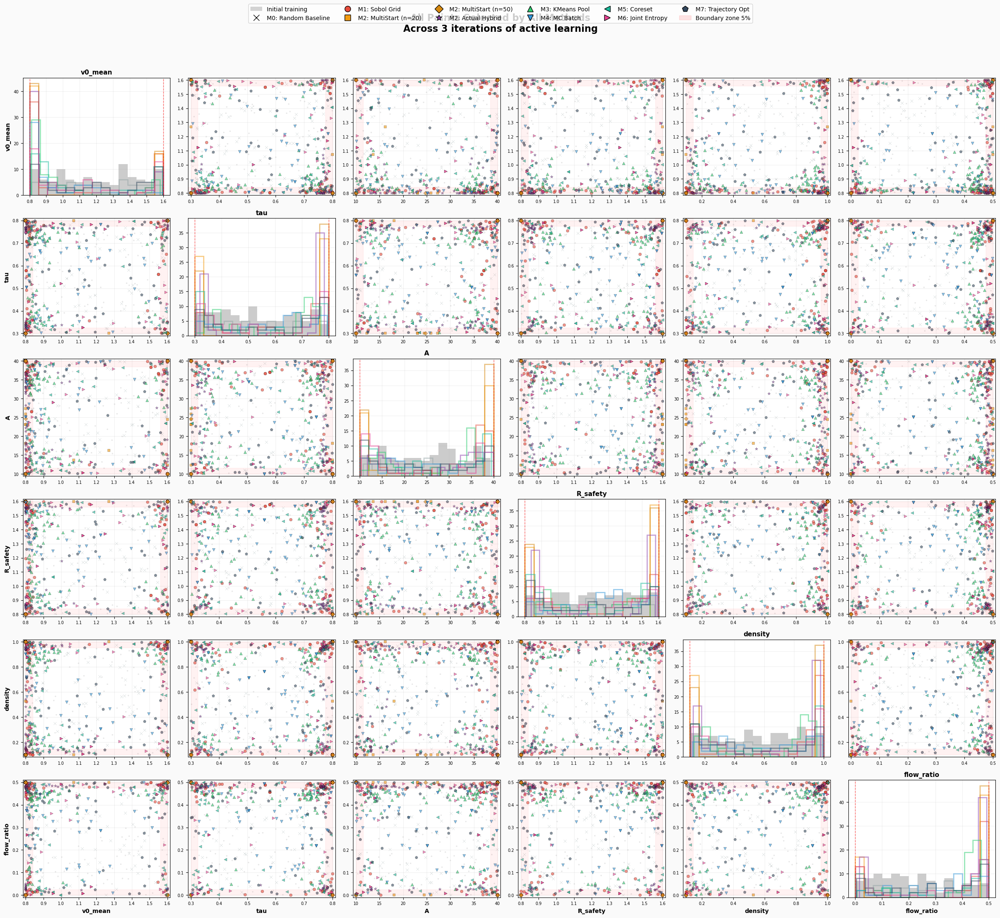


✓ Pairwise scatter → ALL_points_pairwise_matrix.png


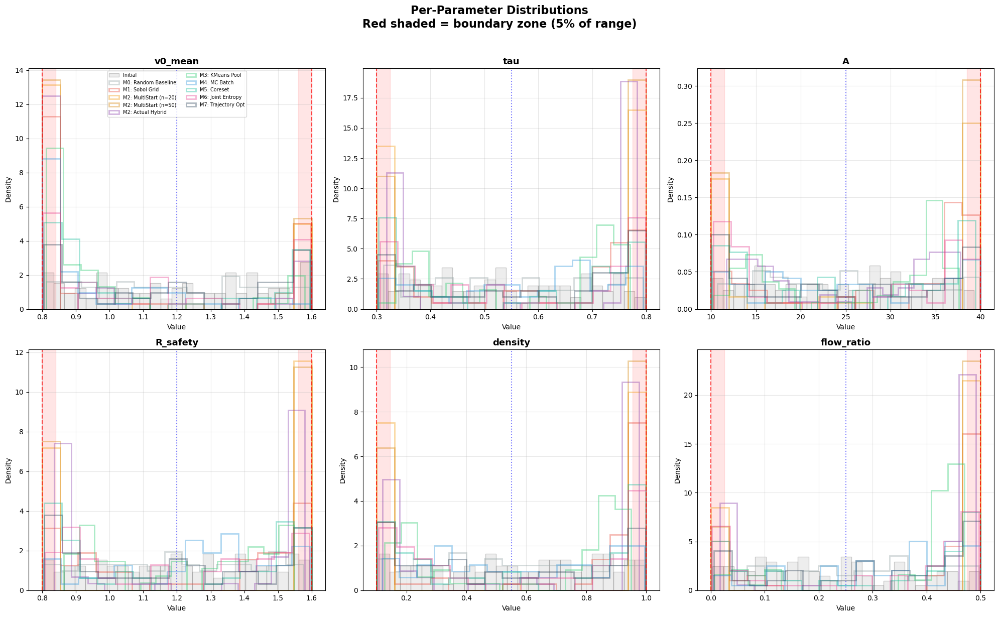

✓ Per-parameter distributions → ALL_points_per_parameter.png


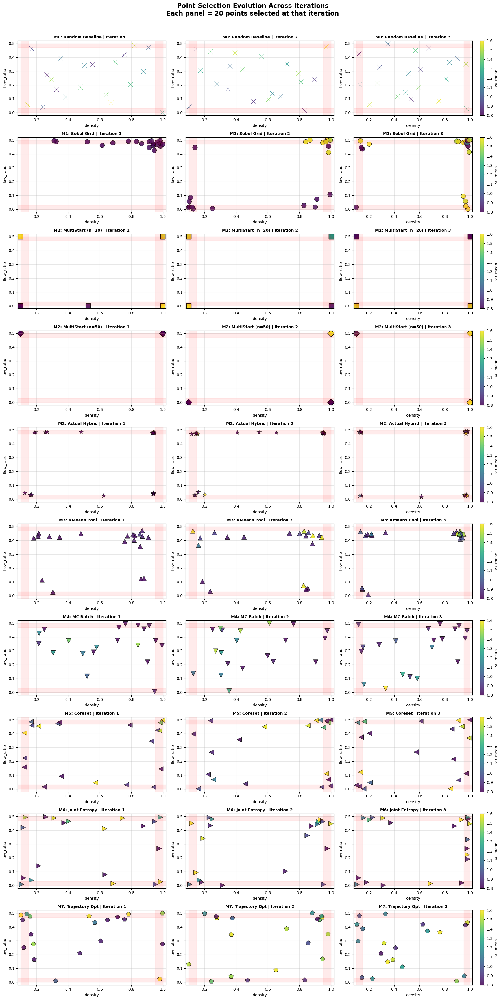

✓ Iteration evolution → ALL_points_iteration_evolution.png


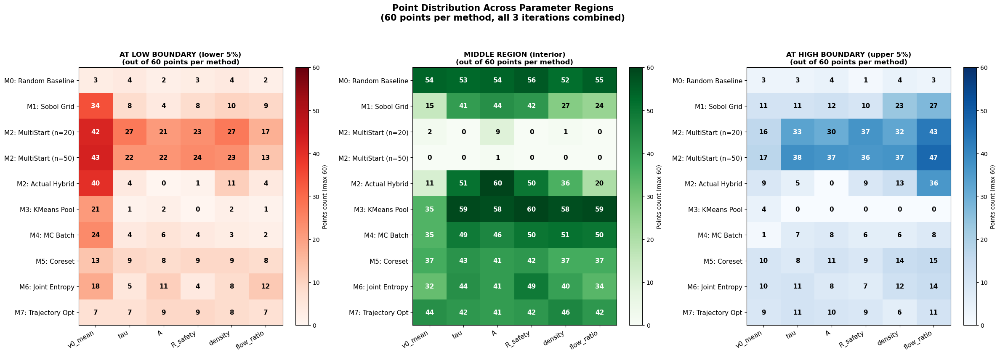

✓ Boundary heatmap → ALL_points_boundary_heatmap.png

EXTREME SCENARIO ANALYSIS

Method                    None     1 met    2 met    All 3   
-----------------------------------------------------------------
M0: Random Baseline       29       22       7        2       
M1: Sobol Grid            26       20       14       0       
M2: MultiStart (n=20)     19       25       13       3       
M2: MultiStart (n=50)     20       27       13       0       
M2: Actual Hybrid         23       25       11       1       
M3: KMeans Pool           30       24       6        0       
M4: MC Batch              42       15       3        0       
M5: Coreset               17       31       12       0       
M6: Joint Entropy         20       24       15       1       
M7: Trajectory Opt        18       31       11       0       


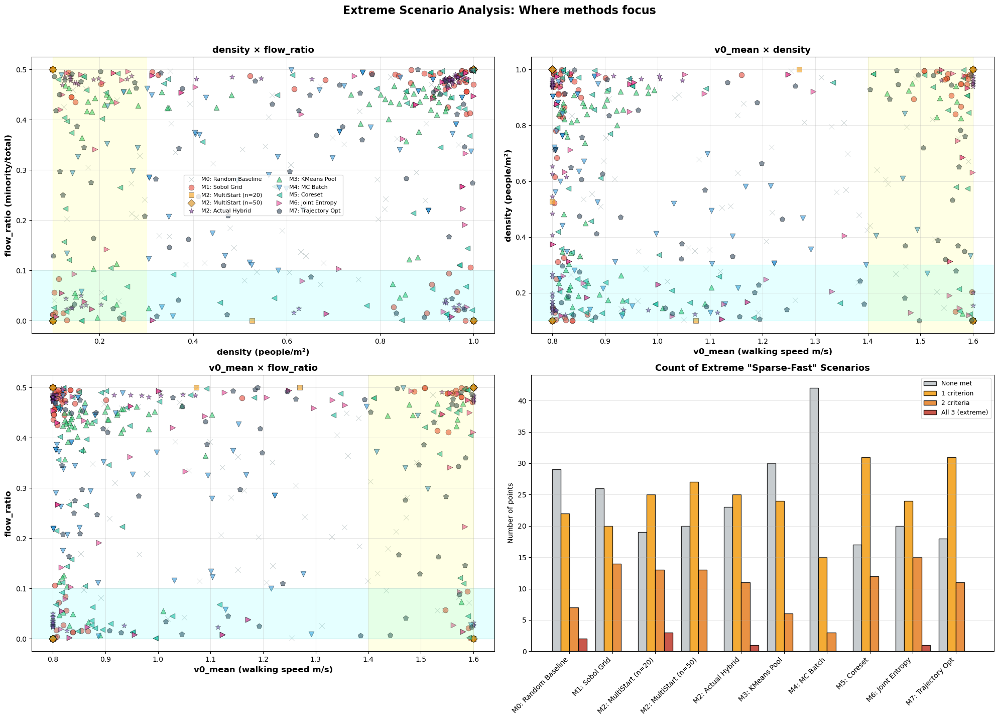


✓ Extreme scenarios → ALL_points_extreme_scenarios.png

ALL DONE


In [2]:
"""
EXTRACT ALL SELECTED POINTS FROM CHECKPOINT PICKLES (10 METHODS)
==============================================================
Loads each method's pickle files and extracts the EXACT points
that were selected during the actual simulation runs.

Each method: 20 points × 3 iterations = 60 points
Total: 60 × 10 methods = 600 points

This gives you the REAL points that were used to train GPs.
"""

import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ======================================================================
# CONFIGURATION
# ======================================================================
N_ITERATIONS         = 3
POINTS_PER_ITERATION = 20
INITIAL_POINTS       = 103   # from your data split (40% of 256)

PARAM_NAMES = ["v0_mean", "tau", "A", "R_safety", "density", "flow_ratio"]

PARAM_BOUNDS = {
    "v0_mean":    (0.80, 1.60),
    "tau":        (0.30, 0.80),
    "A":          (10.0, 40.0),
    "R_safety":   (0.80, 1.60),
    "density":    (0.10, 1.00),
    "flow_ratio": (0.00, 0.50),
}
lowers = np.array([PARAM_BOUNDS[n][0] for n in PARAM_NAMES])
uppers = np.array([PARAM_BOUNDS[n][1] for n in PARAM_NAMES])

# ── UPDATE THESE PATHS ────────────────────────────────────────────────
# For the new methods, we point to the newly merged MASTER pickle. 
# For the old ones, we use your existing individual files.
MASTER_PKL = "MASTER_combined_M0_to_M7_20260724_155604.pkl"

PKL_FILES = {
    'M0_Random' : "M0_Random_Baseline_results_20260716_024107.pkl",
    'M1_Sobol'  : "M1_Sobol_Grid_results_20260716_032006.pkl",
    'M2_n20'    : "M2_MultiStart_results_20260716_034836.pkl",
    'M2_n50'    : "M2_MultiStart_results_20260716_150855.pkl",
    'M2_Actual' : r"D:\KIT\M2_Actual_Hybrid_results_20260722_221713.pkl",
    'M3_KMeans' : r"D:\KIT\M3_KMeans_Pool_results_20260722_224903.pkl",
    
    # New methods (reading from the master combination file)
    'M4_MC_Batch' : MASTER_PKL,
    'M5_Coreset'  : MASTER_PKL,
    'M6_JointEnt' : MASTER_PKL,
    'M7_TrajOpt'  : MASTER_PKL,
}

PKL_INTERNAL_KEY = {
    'M0_Random' : 'M0_Random', # Or 'M0_Random_Baseline' depending on the old file
    'M1_Sobol'  : 'M1_Sobol_Grid',
    'M2_n20'    : 'M2_MultiStart',
    'M2_n50'    : 'M2_MultiStart',
    'M2_Actual' : 'M2_Actual_Hybrid',
    'M3_KMeans' : 'M3_KMeans_Pool',
    'M4_MC_Batch' : 'M4_MC_Batch',
    'M5_Coreset'  : 'M5_Bayesian_Coreset',
    'M6_JointEnt' : 'M6_Maximal_Joint_Entropy',
    'M7_TrajOpt'  : 'M7_Trajectory_Optimization',
}

LABELS = {
    'M0_Random'   : 'M0: Random Baseline',
    'M1_Sobol'    : 'M1: Sobol Grid',
    'M2_n20'      : 'M2: MultiStart (n=20)',
    'M2_n50'      : 'M2: MultiStart (n=50)',
    'M2_Actual'   : 'M2: Actual Hybrid',
    'M3_KMeans'   : 'M3: KMeans Pool',
    'M4_MC_Batch' : 'M4: MC Batch',
    'M5_Coreset'  : 'M5: Coreset',
    'M6_JointEnt' : 'M6: Joint Entropy',
    'M7_TrajOpt'  : 'M7: Trajectory Opt',
}

COLORS = {
    'M0_Random'   : '#95a5a6',  # Grey
    'M1_Sobol'    : '#e74c3c',  # Red
    'M2_n20'      : '#f39c12',  # Orange
    'M2_n50'      : '#d68910',  # Dark Orange
    'M2_Actual'   : '#8e44ad',  # Purple
    'M3_KMeans'   : '#2ecc71',  # Green
    'M4_MC_Batch' : '#3498db',  # Blue
    'M5_Coreset'  : '#1abc9c',  # Teal
    'M6_JointEnt' : '#e84393',  # Pink
    'M7_TrajOpt'  : '#34495e',  # Navy
}

MARKERS = {
    'M0_Random'   : 'x', 
    'M1_Sobol'    : 'o',
    'M2_n20'      : 's', 
    'M2_n50'      : 'D', 
    'M2_Actual'   : '*', 
    'M3_KMeans'   : '^',
    'M4_MC_Batch' : 'v',
    'M5_Coreset'  : '<',
    'M6_JointEnt' : '>',
    'M7_TrajOpt'  : 'p',
}

# ======================================================================
# LOAD PICKLES AND EXTRACT NEW POINTS PER ITERATION
# ======================================================================
def extract_all_new_points():
    all_data = {}
    initial_X = None

    print("="*80)
    print("EXTRACTING NEW POINTS PER ITERATION FROM CHECKPOINT PICKLES")
    print("="*80)

    for method_key, filepath in PKL_FILES.items():
        try:
            with open(filepath, 'rb') as f:
                ckpt = pickle.load(f)

            internal_key = PKL_INTERNAL_KEY[method_key]
            results = ckpt.get('results', ckpt) # Handle different pkl structures

            # Find the correct key in the results dictionary
            d = None
            if internal_key in results:
                d = results[internal_key]
            else:
                # Fallback: check if the key is partially matching or just use the first entry if single method
                for k in results.keys():
                    if internal_key.lower() in k.lower():
                        d = results[k]
                        break
                if d is None and len(results) == 1:
                    d = list(results.values())[0]

            if d is None:
                print(f"\n✗ KEY ERROR: Could not find '{internal_key}' in {filepath}")
                continue

            # Verify structure
            n_snapshots = len(d['X_train'])
            print(f"\n{LABELS[method_key]}")
            print(f"  File            : {filepath}")
            print(f"  X_train snapshots: {n_snapshots}")
            print(f"  Sizes           : {[len(x) for x in d['X_train']]}")

            # Extract initial data from first pickle
            if initial_X is None:
                initial_X = d['X_train'][0]
                print(f"  Initial train X : {initial_X.shape}")

            # Extract NEW points per iteration
            new_points_per_iter = []
            y_new_per_iter      = []
            y_std_per_iter      = []
            for i in range(1, n_snapshots):
                X_prev = d['X_train'][i-1]
                X_curr = d['X_train'][i]
                new_pts = X_curr[len(X_prev):]

                y_curr = d['y_train'][i]
                ys_curr = d['y_std_train'][i]
                y_new  = y_curr[len(X_prev):]
                ys_new = ys_curr[len(X_prev):]

                new_points_per_iter.append(new_pts)
                y_new_per_iter.append(y_new)
                y_std_per_iter.append(ys_new)

                print(f"  Iter {i} new pts : {len(new_pts)}")

            all_data[method_key] = {
                'new_points_per_iter': new_points_per_iter,
                'y_new_per_iter'     : y_new_per_iter,
                'y_std_new_per_iter' : y_std_per_iter,
                'r2_history'         : d.get('r2_history', []),
                'boundary_history'   : d.get('boundary_pts_history', []),
                'interior_history'   : d.get('interior_pts_history', []),
            }

        except FileNotFoundError:
            print(f"\n✗ NOT FOUND: {filepath}")
        except Exception as e:
            print(f"\n✗ ERROR: {method_key}: {e}")

    return all_data, initial_X

# ======================================================================
# BUILD COMBINED DATAFRAME
# ======================================================================
def build_full_dataframe(all_data):
    rows = []
    for method_key, d in all_data.items():
        for iter_i, (pts, ys, ys_std) in enumerate(
            zip(d['new_points_per_iter'],
                d['y_new_per_iter'],
                d['y_std_new_per_iter'])
        ):
            for pt_idx, (x, y, ystd) in enumerate(zip(pts, ys, ys_std)):
                xn   = (x - lowers) / (uppers - lowers)
                dmin = np.min(np.minimum(xn, 1 - xn))
                is_bnd = dmin < 0.05

                row = {
                    'method'         : method_key,
                    'method_label'   : LABELS[method_key],
                    'iteration'      : iter_i + 1,
                    'point_idx'      : pt_idx + 1,
                    'global_id'      : f"{method_key}_i{iter_i+1}_p{pt_idx+1}",
                }
                for j, p in enumerate(PARAM_NAMES):
                    row[p] = x[j]

                row['y_simulated']    = y
                row['y_std']          = ystd
                row['dist_to_bound']  = dmin
                row['is_boundary']    = 'YES' if is_bnd else 'NO'
                rows.append(row)

    df = pd.DataFrame(rows)
    return df

# ======================================================================
# PRINT SUMMARY
# ======================================================================
def print_summary(df):
    print(f"\n{'='*80}")
    print("SUMMARY BY METHOD")
    print(f"{'='*80}")

    summary = df.groupby('method').agg(
        n_points   =('point_idx', 'count'),
        n_boundary =('is_boundary', lambda x: (x == 'YES').sum()),
        n_interior =('is_boundary', lambda x: (x == 'NO').sum()),
        avg_y      =('y_simulated', 'mean'),
        min_y      =('y_simulated', 'min'),
        max_y      =('y_simulated', 'max'),
        avg_density=('density', 'mean'),
        avg_v0     =('v0_mean', 'mean'),
        avg_flow   =('flow_ratio', 'mean'),
    ).round(3)

    print(summary.to_string())

    print(f"\n{'='*80}")
    print("POINTS PER METHOD × ITERATION")
    print(f"{'='*80}")
    piv = df.pivot_table(index='method', columns='iteration',
                         values='point_idx', aggfunc='count')
    print(piv.to_string())

# ======================================================================
# PLOT 1: PAIRWISE SCATTER
# ======================================================================
def plot_pairwise_all(df, initial_X, save_path='all_points_pairwise.png'):
    d = len(PARAM_NAMES)
    fig, axes = plt.subplots(d, d, figsize=(24, 22))
    fig.patch.set_facecolor('#fafafa')

    for i in range(d):
        for j in range(d):
            ax = axes[i, j]

            if i == j:
                ax.hist(initial_X[:, i], bins=15, alpha=0.2,
                        color='black', label='Initial')
                for method_key in LABELS:
                    if method_key not in df['method'].unique():
                        continue
                    subset = df[df['method'] == method_key]
                    ax.hist(subset[PARAM_NAMES[i]], bins=15, alpha=0.5,
                            color=COLORS[method_key],
                            histtype='step', linewidth=2)
                ax.set_title(PARAM_NAMES[i], fontsize=11, fontweight='bold')

                lo, hi = PARAM_BOUNDS[PARAM_NAMES[i]]
                ax.axvline(lo, color='red', linestyle='--', alpha=0.6, lw=1)
                ax.axvline(hi, color='red', linestyle='--', alpha=0.6, lw=1)
            else:
                ax.scatter(initial_X[:, j], initial_X[:, i],
                           color='lightgray', s=10, alpha=0.4, marker='.')

                for method_key in LABELS:
                    if method_key not in df['method'].unique():
                        continue
                    subset = df[df['method'] == method_key]
                    ax.scatter(subset[PARAM_NAMES[j]], subset[PARAM_NAMES[i]],
                               color=COLORS[method_key],
                               marker=MARKERS[method_key],
                               s=25, alpha=0.6,
                               edgecolor='black', linewidth=0.3)

                lo_j, hi_j = PARAM_BOUNDS[PARAM_NAMES[j]]
                lo_i, hi_i = PARAM_BOUNDS[PARAM_NAMES[i]]
                zone = 0.05
                ax.axvspan(lo_j, lo_j + zone*(hi_j-lo_j), color='red', alpha=0.05)
                ax.axvspan(hi_j - zone*(hi_j-lo_j), hi_j, color='red', alpha=0.05)
                ax.axhspan(lo_i, lo_i + zone*(hi_i-lo_i), color='red', alpha=0.05)
                ax.axhspan(hi_i - zone*(hi_i-lo_i), hi_i, color='red', alpha=0.05)

                ax.set_xlim(lo_j - 0.02*(hi_j-lo_j), hi_j + 0.02*(hi_j-lo_j))
                ax.set_ylim(lo_i - 0.02*(hi_i-lo_i), hi_i + 0.02*(hi_i-lo_i))

            if i == d-1:
                ax.set_xlabel(PARAM_NAMES[j], fontsize=10, fontweight='bold')
            if j == 0:
                ax.set_ylabel(PARAM_NAMES[i], fontsize=10, fontweight='bold')

            ax.tick_params(labelsize=7)
            ax.grid(True, alpha=0.2)

    # Global Legend (Adjusted for 10 methods)
    handles = [Patch(facecolor='lightgray', label='Initial training')]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        handles.append(plt.Line2D([0], [0],
                                  marker=MARKERS[method_key],
                                  color='w',
                                  markerfacecolor=COLORS[method_key],
                                  markersize=10, markeredgecolor='black',
                                  label=LABELS[method_key]))
    handles.append(Patch(color='red', alpha=0.1, label='Boundary zone 5%'))
    
    # Split legend into 2 rows if there are many methods
    fig.legend(handles=handles, loc='upper center',
               bbox_to_anchor=(0.5, 0.998), ncol=6, fontsize=10)

    plt.suptitle(f'All Points Selected by All Methods\n'
                 f'Across {N_ITERATIONS} iterations of active learning',
                 fontsize=16, fontweight='bold', y=0.985)
    plt.tight_layout(rect=[0, 0, 1, 0.960])
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"\n✓ Pairwise scatter → {save_path}")

# ======================================================================
# PLOT 2: PER-PARAMETER DISTRIBUTIONS
# ======================================================================
def plot_per_parameter(df, initial_X, save_path='all_points_per_param.png'):
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.flatten()

    for idx, param in enumerate(PARAM_NAMES):
        ax = axes[idx]
        lo, hi = PARAM_BOUNDS[param]

        ax.hist(initial_X[:, idx], bins=25, color='lightgray',
                alpha=0.4, edgecolor='gray', label='Initial',
                density=True)

        for method_key in LABELS:
            if method_key not in df['method'].unique():
                continue
            subset = df[df['method'] == method_key][param]
            ax.hist(subset, bins=15, color=COLORS[method_key],
                    alpha=0.4, linewidth=2,
                    label=LABELS[method_key], density=True,
                    histtype='step')

        ax.axvline(lo, color='red', linestyle='--', alpha=0.7)
        ax.axvline(hi, color='red', linestyle='--', alpha=0.7)
        ax.axvline((lo+hi)/2, color='blue', linestyle=':', alpha=0.5)

        zone = 0.05*(hi-lo)
        ax.axvspan(lo, lo+zone, color='red', alpha=0.1)
        ax.axvspan(hi-zone, hi, color='red', alpha=0.1)

        ax.set_title(param, fontsize=13, fontweight='bold')
        ax.set_xlabel('Value')
        ax.set_ylabel('Density')
        ax.grid(True, alpha=0.3)

        if idx == 0: # Place legend in first subplot
            ax.legend(fontsize=7, loc='upper center', ncol=2)

    plt.suptitle(f'Per-Parameter Distributions\n'
                 'Red shaded = boundary zone (5% of range)',
                 fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"✓ Per-parameter distributions → {save_path}")

# ======================================================================
# PLOT 3: ITERATION EVOLUTION
# ======================================================================
def plot_iteration_evolution(df, save_path='iteration_evolution.png'):
    active_methods = [m for m in LABELS if m in df['method'].unique()]
    fig, axes = plt.subplots(len(active_methods), N_ITERATIONS,
                             figsize=(18, 3.5 * len(active_methods)))

    for row_i, method_key in enumerate(active_methods):
        for col_i, iter_num in enumerate(range(1, N_ITERATIONS+1)):
            ax = axes[row_i, col_i] if len(active_methods) > 1 else axes[col_i]
            subset = df[(df['method'] == method_key) &
                        (df['iteration'] == iter_num)]

            sc = ax.scatter(subset['density'], subset['flow_ratio'],
                            c=subset['v0_mean'], cmap='viridis',
                            marker=MARKERS[method_key],
                            s=150, alpha=0.85,
                            edgecolor='black', linewidth=0.8,
                            vmin=0.8, vmax=1.6)

            ax.axvspan(0.10, 0.15, color='red', alpha=0.08)
            ax.axvspan(0.95, 1.00, color='red', alpha=0.08)
            ax.axhspan(0.00, 0.03, color='red', alpha=0.08)
            ax.axhspan(0.47, 0.50, color='red', alpha=0.08)

            ax.set_xlim(0.08, 1.02)
            ax.set_ylim(-0.02, 0.52)
            ax.set_xlabel('density', fontsize=10)
            ax.set_ylabel('flow_ratio', fontsize=10)
            ax.set_title(f'{LABELS[method_key]} | Iteration {iter_num}',
                         fontsize=10, fontweight='bold')
            ax.grid(True, alpha=0.3)

            if col_i == N_ITERATIONS - 1:
                plt.colorbar(sc, ax=ax, label='v0_mean')

    plt.suptitle('Point Selection Evolution Across Iterations\n'
                 'Each panel = 20 points selected at that iteration',
                 fontsize=16, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"✓ Iteration evolution → {save_path}")

# ======================================================================
# PLOT 4: BOUNDARY HEATMAP
# ======================================================================
def plot_boundary_heatmap(df, save_path='boundary_heatmap.png'):
    methods = [m for m in LABELS.keys() if m in df['method'].unique()]
    n_m = len(methods)
    n_p = len(PARAM_NAMES)

    low  = np.zeros((n_m, n_p))
    mid  = np.zeros((n_m, n_p))
    high = np.zeros((n_m, n_p))

    for mi, m in enumerate(methods):
        subset = df[df['method'] == m]
        for pi, p in enumerate(PARAM_NAMES):
            lo, hi = PARAM_BOUNDS[p]
            zone = 0.05 * (hi - lo)
            vals = subset[p].values
            low[mi, pi]  = np.sum(vals < lo + zone)
            high[mi, pi] = np.sum(vals > hi - zone)
            mid[mi, pi]  = len(vals) - low[mi, pi] - high[mi, pi]

    fig, axes = plt.subplots(1, 3, figsize=(24, max(7, n_m*0.8)))

    for ax, mat, title, cmap in zip(
        axes,
        [low, mid, high],
        ['AT LOW BOUNDARY (lower 5%)',
         'MIDDLE REGION (interior)',
         'AT HIGH BOUNDARY (upper 5%)'],
        ['Reds', 'Greens', 'Blues']
    ):
        im = ax.imshow(mat, cmap=cmap, aspect='auto', vmin=0, vmax=60)

        for i in range(n_m):
            for j in range(n_p):
                val = int(mat[i, j])
                color = 'white' if val > 30 else 'black'
                ax.text(j, i, str(val), ha='center', va='center',
                        color=color, fontsize=11, fontweight='bold')

        ax.set_xticks(range(n_p))
        ax.set_xticklabels(PARAM_NAMES, rotation=30, ha='right', fontsize=11)
        ax.set_yticks(range(n_m))
        ax.set_yticklabels([LABELS[m] for m in methods], fontsize=11)
        ax.set_title(title + '\n(out of 60 points per method)',
                     fontweight='bold', fontsize=12)
        plt.colorbar(im, ax=ax, label='Points count (max 60)')

    plt.suptitle('Point Distribution Across Parameter Regions\n'
                 '(60 points per method, all 3 iterations combined)',
                 fontsize=15, fontweight='bold', y=1.05)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"✓ Boundary heatmap → {save_path}")

# ======================================================================
# PLOT 5: EXTREME SCENARIOS
# ======================================================================
def plot_extreme_scenarios(df, save_path='extreme_scenarios.png'):
    print(f"\n{'='*80}")
    print("EXTREME SCENARIO ANALYSIS")
    print(f"{'='*80}")

    fig, axes = plt.subplots(2, 2, figsize=(20, 14))

    ax = axes[0, 0]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        ax.scatter(subset['density'], subset['flow_ratio'],
                   color=COLORS[method_key], marker=MARKERS[method_key],
                   s=60, alpha=0.6, edgecolor='black', linewidth=0.5,
                   label=LABELS[method_key])
    ax.axvspan(0.10, 0.30, alpha=0.1, color='yellow')
    ax.axhspan(0.00, 0.10, alpha=0.1, color='cyan')
    ax.set_xlabel('density (people/m²)', fontsize=12, fontweight='bold')
    ax.set_ylabel('flow_ratio (minority/total)', fontsize=12, fontweight='bold')
    ax.set_title('density × flow_ratio', fontsize=13, fontweight='bold')
    ax.legend(fontsize=8, ncol=2)
    ax.grid(True, alpha=0.3)

    ax = axes[0, 1]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        ax.scatter(subset['v0_mean'], subset['density'],
                   color=COLORS[method_key], marker=MARKERS[method_key],
                   s=60, alpha=0.6, edgecolor='black', linewidth=0.5)
    ax.axvspan(1.40, 1.60, alpha=0.1, color='yellow')
    ax.axhspan(0.10, 0.30, alpha=0.1, color='cyan')
    ax.set_xlabel('v0_mean (walking speed m/s)', fontsize=12, fontweight='bold')
    ax.set_ylabel('density (people/m²)', fontsize=12, fontweight='bold')
    ax.set_title('v0_mean × density', fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3)

    ax = axes[1, 0]
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        ax.scatter(subset['v0_mean'], subset['flow_ratio'],
                   color=COLORS[method_key], marker=MARKERS[method_key],
                   s=60, alpha=0.6, edgecolor='black', linewidth=0.5)
    ax.axvspan(1.40, 1.60, alpha=0.1, color='yellow')
    ax.axhspan(0.00, 0.10, alpha=0.1, color='cyan')
    ax.set_xlabel('v0_mean (walking speed m/s)', fontsize=12, fontweight='bold')
    ax.set_ylabel('flow_ratio', fontsize=12, fontweight='bold')
    ax.set_title('v0_mean × flow_ratio', fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3)

    ax = axes[1, 1]
    counts = {}
    for method_key in LABELS:
        if method_key not in df['method'].unique():
            continue
        subset = df[df['method'] == method_key]
        low_d  = subset['density']    < 0.30
        low_f  = subset['flow_ratio'] < 0.10
        high_v = subset['v0_mean']    > 1.40

        all_three = np.sum(low_d & low_f & high_v)
        two_met = np.sum(
            (low_d & low_f) | (low_d & high_v) | (low_f & high_v)
        ) - all_three
        one_met = np.sum(low_d | low_f | high_v) - two_met - all_three
        none_met = len(subset) - one_met - two_met - all_three

        counts[method_key] = [none_met, one_met, two_met, all_three]

    method_list = list(counts.keys())
    x_pos = np.arange(len(method_list))
    w = 0.2
    lbls = ['None met', '1 criterion', '2 criteria', 'All 3 (extreme)']
    cols = ['#bdc3c7', '#f39c12', '#e67e22', '#c0392b']

    for i, lbl in enumerate(lbls):
        vals = [counts[m][i] for m in method_list]
        ax.bar(x_pos + (i-1.5)*w, vals, w, color=cols[i],
               alpha=0.85, edgecolor='black', label=lbl)

    ax.set_xticks(x_pos)
    # Changed to 45 degree rotation to fit all 10 labels nicely
    ax.set_xticklabels([LABELS[m] for m in method_list],
                       fontsize=10, rotation=45, ha='right')
    ax.set_title('Count of Extreme "Sparse-Fast" Scenarios', fontsize=13, fontweight='bold')
    ax.set_ylabel('Number of points')
    ax.legend(fontsize=9)
    ax.grid(axis='y', alpha=0.3)

    print(f"\n{'Method':<25} {'None':<8} {'1 met':<8} {'2 met':<8} {'All 3':<8}")
    print("-" * 65)
    for m, c in counts.items():
        print(f"{LABELS[m]:<25} {c[0]:<8} {c[1]:<8} {c[2]:<8} {c[3]:<8}")

    plt.suptitle('Extreme Scenario Analysis: Where methods focus', fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"\n✓ Extreme scenarios → {save_path}")

# ======================================================================
# MAIN
# ======================================================================
if __name__ == "__main__":
    print("="*80)
    print("EXTRACT ALL POINTS FROM ACTUAL SIMULATION RUNS (10 METHODS)")
    print("="*80)

    all_data, initial_X = extract_all_new_points()

    if len(all_data) == 0:
        print("\n✗ No data loaded! Check file paths.")
        exit()

    df = build_full_dataframe(all_data)

    print(f"\n{'='*80}")
    print(f"TOTAL POINTS EXTRACTED: {len(df)}")
    print(f"({len(all_data)} methods loaded × {N_ITERATIONS} iterations × "
          f"{POINTS_PER_ITERATION} points each)")
    print(f"{'='*80}")

    csv_file = 'all_selected_points_full_10_methods.csv'
    df.to_csv(csv_file, index=False, float_format='%.4f')
    print(f"\n✓ Full CSV saved → {csv_file}")

    for method_key in df['method'].unique():
        subset = df[df['method'] == method_key]
        f_name = f'points_{method_key}.csv'
        subset.to_csv(f_name, index=False, float_format='%.4f')
        print(f"  ✓ {f_name} ({len(subset)} points)")

    print_summary(df)

    print(f"\n{'='*80}")
    print("GENERATING PLOTS (Updated for 10 variants)")
    print(f"{'='*80}")

    plot_pairwise_all(df, initial_X, save_path='ALL_points_pairwise_matrix.png')
    plot_per_parameter(df, initial_X, save_path='ALL_points_per_parameter.png')
    plot_iteration_evolution(df, save_path='ALL_points_iteration_evolution.png')
    plot_boundary_heatmap(df, save_path='ALL_points_boundary_heatmap.png')
    plot_extreme_scenarios(df, save_path='ALL_points_extreme_scenarios.png')

    print(f"\n{'='*80}")
    print("ALL DONE")
    print(f"{'='*80}")

LOADING ACTIVE LEARNING CHECKPOINT FILES
 ✓ Successfully loaded: M0: Random Baseline from M0_Random_Baseline_results_20260716_024107.pkl
 ✓ Successfully loaded: M1: Sobol Grid from M1_Sobol_Grid_results_20260716_032006.pkl
 ✓ Successfully loaded: M2: MultiStart (n=20) from M2_MultiStart_results_20260716_034836.pkl
 ✓ Successfully loaded: M2: MultiStart (n=50) from M2_MultiStart_results_20260716_150855.pkl
 ✓ Successfully loaded: M2: Actual Hybrid from D:\KIT\M2_Actual_Hybrid_results_20260722_221713.pkl
 ✓ Successfully loaded: M3: KMeans Pool from D:\KIT\M3_KMeans_Pool_results_20260722_224903.pkl
 ✓ Successfully loaded: M4: MC Batch from M4_MC_Batch_results_20260723_191607.pkl
 ✓ Successfully loaded: M5: Bayesian Coreset from M5_Bayesian_Coreset_results_20260723_195542.pkl
 ✓ Successfully loaded: M6: Joint Entropy from M6_Maximal_Joint_Entropy_results_20260723_203346.pkl
 ✓ Successfully loaded: M7: Trajectory Opt from M7_Trajectory_Optimization_results_20260724_155604.pkl
Loaded 10 / 10

C:\Users\100ra\AppData\Local\Temp\ipykernel_46336\412990847.py:292: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(m['t_total_min'], m['final_r2'], color=COLORS[k], marker=MARKERS[k],
C:\Users\100ra\AppData\Local\Temp\ipykernel_46336\412990847.py:421: UserWarning: Glyph 9322 (\N{CIRCLED NUMBER ELEVEN}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path, dpi=300, bbox_inches='tight')
C:\Users\100ra\AppData\Local\Temp\ipykernel_46336\412990847.py:421: UserWarning: Glyph 129352 (\N{SECOND PLACE MEDAL}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path, dpi=300, bbox_inches='tight')
C:\Users\100ra\AppData\Local\Temp\ipykernel_46336\412990847.py:421: UserWarning: Glyph 129353 (\N{THIRD PLACE MEDAL}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path, dpi=300, bbox_inches='tight')
C:\Users\100ra\AppData\Local\Temp

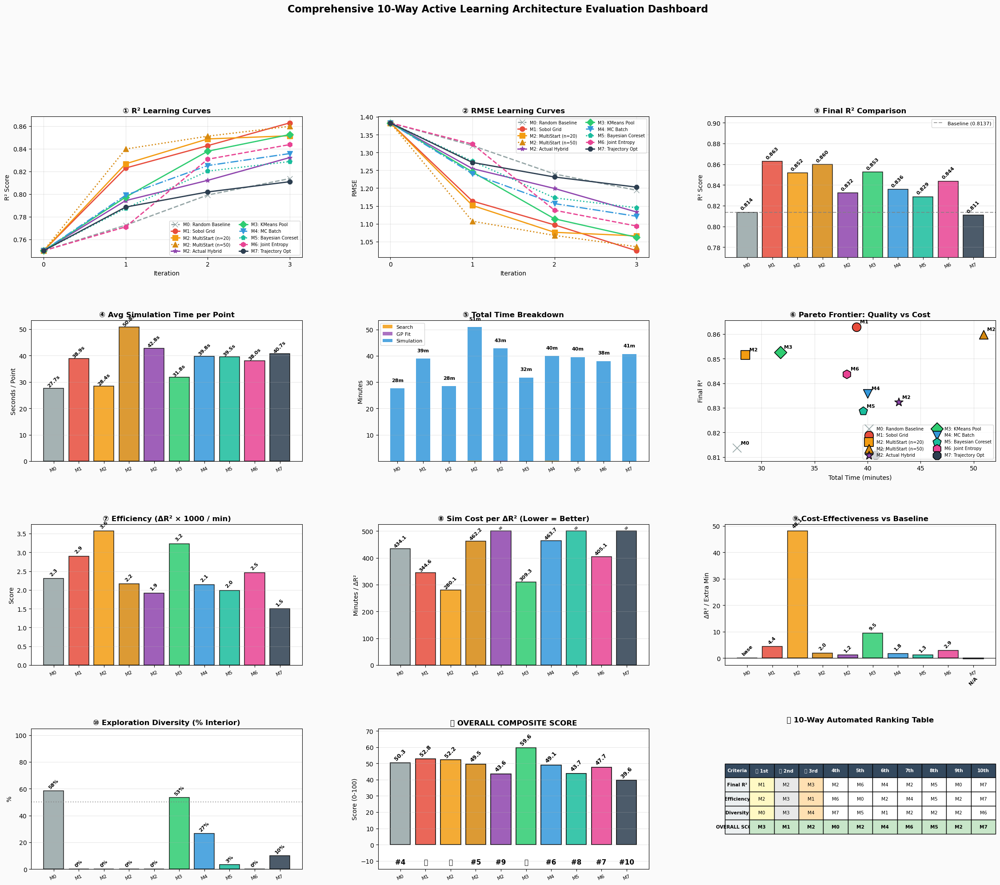

✓ 10-Way Dashboard successfully saved → Ultimate_Active_Learning_Dashboard.png

                                      ACTIVE LEARNING COMPARISON SUMMARY                                      
               Method Final R² ΔR² Gain Total Time (min) Diversity (%) Overall Score
  M0: Random Baseline   0.8137  +0.0638             27.7         58.3%          50.3
       M1: Sobol Grid   0.8629  +0.1130             39.0          0.0%          52.8
M2: MultiStart (n=20)   0.8515  +0.1015             28.5          0.0%          52.2
M2: MultiStart (n=50)   0.8599  +0.1099             50.9          0.0%          49.5
    M2: Actual Hybrid   0.8323  +0.0823             42.9          0.0%          43.6
      M3: KMeans Pool   0.8526  +0.1026             31.8         53.3%          59.6
         M4: MC Batch   0.8358  +0.0858             40.0         26.7%          49.1
 M5: Bayesian Coreset   0.8287  +0.0788             39.6          3.3%          43.7
    M6: Joint Entropy   0.8437  +0.0938     

In [7]:
"""
UNIVERSAL ACTIVE LEARNING COMPARISON & DASHBOARD (DYNAMIC N-WAY)
================================================================================
Compares loaded active learning model checkpoints (M0 through M7).
Automatically scales all 12 analytical panels, metrics, Pareto frontiers, 
and ranking tables to match the exact set of checkpoint files found.
"""

import os
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# ======================================================================
# 1. CONFIGURATION & FILE PATHS
# ======================================================================
N_ITERATIONS         = 3
POINTS_PER_ITERATION = 20
INITIAL_POINTS       = 103

# ======================================================================
# 1. CONFIGURATION & FILE PATHS (UPDATED FOR ACTUAL FILENAMES)
# ======================================================================
PKL_FILES = {
    'M0_Random'    : "M0_Random_Baseline_results_20260716_024107.pkl",
    'M1_Sobol'     : "M1_Sobol_Grid_results_20260716_032006.pkl",
    'M2_n20'       : "M2_MultiStart_results_20260716_034836.pkl",
    'M2_n50'       : "M2_MultiStart_results_20260716_150855.pkl",
    'M2_Actual'    : r"D:\KIT\M2_Actual_Hybrid_results_20260722_221713.pkl",
    'M3_KMeans'    : r"D:\KIT\M3_KMeans_Pool_results_20260722_224903.pkl",
    'M4_Variant'   : "M4_MC_Batch_results_20260723_191607.pkl",
    'M5_Variant'   : "M5_Bayesian_Coreset_results_20260723_195542.pkl",
    'M6_Variant'   : "M6_Maximal_Joint_Entropy_results_20260723_203346.pkl",
    'M7_Trajectory': "M7_Trajectory_Optimization_results_20260724_155604.pkl",
}

PKL_INTERNAL_KEY = {
    'M0_Random'    : 'M0_Random_Baseline',
    'M1_Sobol'     : 'M1_Sobol_Grid',
    'M2_n20'       : 'M2_MultiStart',
    'M2_n50'       : 'M2_MultiStart',
    'M2_Actual'    : 'M2_Actual_Hybrid',
    'M3_KMeans'    : 'M3_KMeans_Pool',
    'M4_Variant'   : 'M4_MC_Batch',
    'M5_Variant'   : 'M5_Bayesian_Coreset',
    'M6_Variant'   : 'M6_Maximal_Joint_Entropy',
    'M7_Trajectory': 'M7_Trajectory_Optimization',
}

LABELS = {
    'M0_Random'    : 'M0: Random Baseline',
    'M1_Sobol'     : 'M1: Sobol Grid',
    'M2_n20'       : 'M2: MultiStart (n=20)',
    'M2_n50'       : 'M2: MultiStart (n=50)',
    'M2_Actual'    : 'M2: Actual Hybrid',
    'M3_KMeans'    : 'M3: KMeans Pool',
    'M4_Variant'   : 'M4: MC Batch',
    'M5_Variant'   : 'M5: Bayesian Coreset',
    'M6_Variant'   : 'M6: Joint Entropy',
    'M7_Trajectory': 'M7: Trajectory Opt',
}

COLORS = {
    'M0_Random'    : '#95a5a6', # Gray
    'M1_Sobol'     : '#e74c3c', # Red
    'M2_n20'       : '#f39c12', # Orange
    'M2_n50'       : '#d68910', # Dark Orange
    'M2_Actual'    : '#8e44ad', # Purple
    'M3_KMeans'    : '#2ecc71', # Green
    'M4_Variant'   : '#3498db', # Blue
    'M5_Variant'   : '#1abc9c', # Teal
    'M6_Variant'   : '#e84393', # Pink
    'M7_Trajectory': '#2c3e50', # Navy
}

MARKERS = {
    'M0_Random'    : 'x',
    'M1_Sobol'     : 'o',
    'M2_n20'       : 's',
    'M2_n50'       : '^',
    'M2_Actual'    : '*',
    'M3_KMeans'    : 'D',
    'M4_Variant'   : 'v',
    'M5_Variant'   : 'p',
    'M6_Variant'   : 'h',
    'M7_Trajectory': '8',
}

LINESTYLES = {
    'M0_Random'    : '--',
    'M1_Sobol'     : '-',
    'M2_n20'       : '-',
    'M2_n50'       : ':',
    'M2_Actual'    : '-',
    'M3_KMeans'    : '-',
    'M4_Variant'   : '-.',
    'M5_Variant'   : ':',
    'M6_Variant'   : '--',
    'M7_Trajectory': '-',
}

# ======================================================================
# 2. DATA LOADING LOGIC (SAFE LOAD)
# ======================================================================
def load_all_data():
    combined_results = {}
    print("="*80)
    print("LOADING ACTIVE LEARNING CHECKPOINT FILES")
    print("="*80)
    for k, filepath in PKL_FILES.items():
        if not os.path.exists(filepath):
            print(f" ✗ [!] File missing for {k}: {filepath}")
            continue
        try:
            with open(filepath, 'rb') as f:
                ckpt = pickle.load(f)
            res = ckpt['results']
            ik = PKL_INTERNAL_KEY[k]
            if ik in res:
                combined_results[k] = res[ik]
            else:
                combined_results[k] = list(res.values())[0]
            print(f" ✓ Successfully loaded: {LABELS[k]} from {filepath}")
        except Exception as e:
            print(f" ✗ [!] Error reading {k} ({filepath}): {e}")
            
    print("="*80)
    print(f"Loaded {len(combined_results)} / {len(PKL_FILES)} models successfully.\n")
    return combined_results

# ======================================================================
# 3. UNIVERSAL METRICS COMPUTATION (DYNAMIC BASELINE)
# ======================================================================
def compute_universal_metrics(all_data):
    metrics = {}
    
    # Establish dynamic baseline reference (M0 if available, else first key)
    base_key = 'M0_Random' if 'M0_Random' in all_data else list(all_data.keys())[0]
    base_r2 = all_data[base_key]['r2_history'][-1]
    base_sim_time = sum(all_data[base_key]['sim_time_history'])

    for k, d in all_data.items():
        r2_init  = d['r2_history'][0]
        r2_final = d['r2_history'][-1]
        rm_final = d['rmse_history'][-1]

        t_search = sum(d['search_time_history'])
        t_sim    = sum(d['sim_time_history'])
        t_fit    = sum(d['fit_time_history'])
        t_total  = t_search + t_sim + t_fit

        r2_gain   = r2_final - r2_init
        advantage = r2_final - base_r2

        tot_b = sum(d['boundary_pts_history'])
        tot_i = sum(d['interior_pts_history'])
        bnd_pct = (tot_b / (tot_b + tot_i) * 100) if (tot_b + tot_i) > 0 else 0
        diversity = 100 - bnd_pct

        # Efficiency & Cost metrics
        efficiency = r2_gain / (t_total / 60) if t_total > 0 else 0
        sim_cost = (t_sim / 60) / r2_gain if r2_gain > 0 else float('inf')
        val_per_pt = r2_gain / (N_ITERATIONS * POINTS_PER_ITERATION)
        speedup = base_sim_time / t_sim if t_sim > 0 else 0

        base_search_fit = (sum(all_data[base_key]['search_time_history']) + 
                           sum(all_data[base_key]['fit_time_history']) + 
                           base_sim_time)
        extra_time_min = (t_total - base_search_fit) / 60

        if abs(extra_time_min) < 0.1:
            cost_eff = float('inf')
        else:
            cost_eff = advantage / extra_time_min if extra_time_min > 0 else -1

        # Composite score (0-100 scale)
        norm_r2  = max(0, min(1, (r2_final - 0.70) / 0.20))
        norm_eff = min(efficiency * 50, 1.0)
        norm_div = diversity / 100
        norm_spd = max(0, min(1, 1.0 - (t_total / 6000)))

        overall = (0.50 * norm_r2 + 0.20 * norm_eff + 0.15 * norm_div + 0.15 * norm_spd) * 100

        metrics[k] = {
            'label'         : LABELS[k],
            'final_r2'      : r2_final,
            'final_rmse'    : rm_final,
            'r2_gain'       : r2_gain,
            'advantage'     : advantage,
            't_search'      : t_search,
            't_sim'         : t_sim,
            't_fit'         : t_fit,
            't_total'       : t_total,
            't_total_min'   : t_total / 60,
            'boundary_pct'  : bnd_pct,
            'diversity'     : diversity,
            'efficiency'    : efficiency,
            'sim_cost'      : sim_cost,
            'val_per_pt'    : val_per_pt,
            'cost_eff'      : cost_eff,
            'speedup'       : speedup,
            'overall_score' : overall,
            'base_r2'       : base_r2
        }
    return metrics

# ======================================================================
# 4. COMPREHENSIVE DYNAMIC DASHBOARD PLOTTER
# ======================================================================
def plot_universal_dashboard(all_data, metrics, save_path='Ultimate_Active_Learning_Dashboard.png'):
    keys   = list(all_data.keys())
    iters  = np.arange(0, N_ITERATIONS + 1)
    x_pos  = np.arange(len(keys))
    bcols  = [COLORS[k] for k in keys]
    num_models = len(keys)

    fig = plt.figure(figsize=(28, 22))
    fig.patch.set_facecolor('#fafafa')
    gs  = GridSpec(4, 3, figure=fig, hspace=0.45, wspace=0.28)

    # ── ROW 1: BASIC PERFORMANCE ──────────────────────────────────────
    # 1. R² Curves
    ax = fig.add_subplot(gs[0, 0])
    for k, d in all_data.items():
        ax.plot(iters, d['r2_history'], color=COLORS[k], marker=MARKERS[k],
                linestyle=LINESTYLES[k], linewidth=2, markersize=8, label=LABELS[k])
    ax.set_title('① R² Learning Curves', fontweight='bold', fontsize=12)
    ax.set_xlabel('Iteration'); ax.set_ylabel('R² Score')
    ax.legend(fontsize=7, loc='lower right', ncol=2 if num_models > 5 else 1); ax.grid(True, alpha=0.3)
    ax.set_xticks(iters)

    # 2. RMSE Curves
    ax = fig.add_subplot(gs[0, 1])
    for k, d in all_data.items():
        ax.plot(iters, d['rmse_history'], color=COLORS[k], marker=MARKERS[k],
                linestyle=LINESTYLES[k], linewidth=2, markersize=8, label=LABELS[k])
    ax.set_title('② RMSE Learning Curves', fontweight='bold', fontsize=12)
    ax.set_xlabel('Iteration'); ax.set_ylabel('RMSE')
    ax.legend(fontsize=7, ncol=2 if num_models > 5 else 1); ax.grid(True, alpha=0.3)
    ax.set_xticks(iters)

    # 3. Final R² Comparison Bar Chart
    ax = fig.add_subplot(gs[0, 2])
    final_r2 = [metrics[k]['final_r2'] for k in keys]
    bars = ax.bar(x_pos, final_r2, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val in zip(bars, final_r2):
        ax.text(bar.get_x() + bar.get_width()/2, val + 0.002, f'{val:.3f}', ha='center', fontsize=8, fontweight='bold', rotation=45)
    
    base_r2 = metrics[keys[0]]['base_r2']
    ax.axhline(base_r2, color='gray', linestyle='--', linewidth=1.5, alpha=0.7, label=f'Baseline ({base_r2:.4f})')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=8, rotation=25)
    ax.set_title('③ Final R² Comparison', fontweight='bold', fontsize=12)
    ax.set_ylabel('R² Score')
    ax.set_ylim(min(final_r2)*0.95, max(final_r2)*1.05)
    ax.legend(fontsize=8); ax.grid(axis='y', alpha=0.3)

    # ── ROW 2: TIME COMPLEXITY & PARETO ───────────────────────────────
    # 4. Simulation Time per Point
    ax = fig.add_subplot(gs[1, 0])
    sim_per_pt = [metrics[k]['t_sim'] / (N_ITERATIONS * POINTS_PER_ITERATION) for k in keys]
    bars = ax.bar(x_pos, sim_per_pt, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val in zip(bars, sim_per_pt):
        ax.text(bar.get_x() + bar.get_width()/2, val + 0.3, f'{val:.1f}s', ha='center', fontsize=8, fontweight='bold', rotation=45)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=8, rotation=25)
    ax.set_title('④ Avg Simulation Time per Point', fontweight='bold', fontsize=12)
    ax.set_ylabel('Seconds / Point'); ax.grid(axis='y', alpha=0.3)

    # 5. Total Computation Time Breakdown (Stacked)
    ax = fig.add_subplot(gs[1, 1])
    w = 0.55
    ts = [metrics[k]['t_search'] / 60 for k in keys]
    tf = [metrics[k]['t_fit'] / 60 for k in keys]
    tm = [metrics[k]['t_sim'] / 60 for k in keys]
    ax.bar(x_pos, ts, w, label='Search', color='#f39c12', alpha=0.85)
    ax.bar(x_pos, tf, w, bottom=ts, label='GP Fit', color='#9b59b6', alpha=0.85)
    ax.bar(x_pos, tm, w, bottom=[a+b for a,b in zip(ts,tf)], label='Simulation', color='#3498db', alpha=0.85)
    for i, tot in enumerate([s+f+m for s,f,m in zip(ts,tf,tm)]):
        ax.text(i, tot + (max(tm)*0.05), f'{tot:.0f}m', ha='center', fontsize=8, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=8, rotation=25)
    ax.set_title('⑤ Total Time Breakdown', fontweight='bold', fontsize=12)
    ax.set_ylabel('Minutes'); ax.legend(fontsize=8, loc='upper left'); ax.grid(axis='y', alpha=0.3)

    # 6. Pareto Frontier: R² vs Total Time
    ax = fig.add_subplot(gs[1, 2])
    for k in keys:
        m = metrics[k]
        ax.scatter(m['t_total_min'], m['final_r2'], color=COLORS[k], marker=MARKERS[k],
                   s=200, edgecolor='black', linewidth=1.2, label=LABELS[k], zorder=3)
        ax.annotate(LABELS[k].split(':')[0], (m['t_total_min'], m['final_r2']),
                    textcoords='offset points', xytext=(6, 6), fontsize=8, fontweight='bold')
    ax.set_title('⑥ Pareto Frontier: Quality vs Cost', fontweight='bold', fontsize=12)
    ax.set_xlabel('Total Time (minutes)'); ax.set_ylabel('Final R²')
    ax.legend(fontsize=7, loc='lower right', ncol=2 if num_models > 5 else 1); ax.grid(True, alpha=0.3)

    # ── ROW 3: EFFICIENCY RATIOS ──────────────────────────────────────
    # 7. Efficiency Score (R² gain per minute)
    ax = fig.add_subplot(gs[2, 0])
    eff_vals = [metrics[k]['efficiency'] * 1000 for k in keys]
    bars = ax.bar(x_pos, eff_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val in zip(bars, eff_vals):
        ax.text(bar.get_x() + bar.get_width()/2, val + (max(eff_vals)*0.02 if max(eff_vals)>0 else 0.1), 
                f'{val:.1f}', ha='center', fontsize=8, fontweight='bold', rotation=45)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=8, rotation=25)
    ax.set_title('⑦ Efficiency (ΔR² × 1000 / min)', fontweight='bold', fontsize=12)
    ax.set_ylabel('Score'); ax.grid(axis='y', alpha=0.3)

    # 8. Simulation Cost per Unit R² Gain
    ax = fig.add_subplot(gs[2, 1])
    sim_cost_vals = [min(metrics[k]['sim_cost'], 500) for k in keys]
    bars = ax.bar(x_pos, sim_cost_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val, k in zip(bars, sim_cost_vals, keys):
        actual = metrics[k]['sim_cost']
        lbl = f'{actual:.1f}' if actual < 500 else '∞'
        ax.text(bar.get_x() + bar.get_width()/2, val + 5, lbl, ha='center', fontsize=8, fontweight='bold', rotation=45)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=8, rotation=25)
    ax.set_title('⑧ Sim Cost per ΔR² (Lower = Better)', fontweight='bold', fontsize=12)
    ax.set_ylabel('Minutes / ΔR²'); ax.grid(axis='y', alpha=0.3)

    # 9. Cost-Effectiveness vs Baseline
    ax = fig.add_subplot(gs[2, 2])
    ce_vals = [metrics[k]['cost_eff'] * 1000 if metrics[k]['cost_eff'] not in [float('inf'), -1] else 0 for k in keys]
    bars = ax.bar(x_pos, ce_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val, k in zip(bars, ce_vals, keys):
        actual = metrics[k]['cost_eff']
        lbl = 'base' if k == 'M0_Random' else (f'{actual*1000:.1f}' if actual > 0 else 'N/A')
        y_offset = (max(ce_vals)*0.02) if val >= 0 else (min(ce_vals)*0.05 - 10)
        ax.text(bar.get_x() + bar.get_width()/2, val + y_offset, lbl, ha='center', fontsize=8, fontweight='bold', rotation=45)
    ax.axhline(0, color='black', linewidth=0.8)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=8, rotation=25)
    ax.set_title('⑨ Cost-Effectiveness vs Baseline', fontweight='bold', fontsize=12)
    ax.set_ylabel('ΔR² / Extra Min'); ax.grid(axis='y', alpha=0.3)

    # ── ROW 4: EXPLORATION, COMPOSITE & RANKING TABLE ─────────────────
    # 10. Exploration Diversity Score
    ax = fig.add_subplot(gs[3, 0])
    div_vals = [metrics[k]['diversity'] for k in keys]
    bars = ax.bar(x_pos, div_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.1)
    for bar, val in zip(bars, div_vals):
        ax.text(bar.get_x() + bar.get_width()/2, val + 1.5, f'{val:.0f}%', ha='center', fontsize=8, fontweight='bold', rotation=45)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=8, rotation=25)
    ax.set_ylim(0, 105); ax.axhline(50, color='gray', linestyle=':', alpha=0.7)
    ax.set_title('⑩ Exploration Diversity (% Interior)', fontweight='bold', fontsize=12)
    ax.set_ylabel('%'); ax.grid(axis='y', alpha=0.3)

    # 11. Overall Composite Score
    ax = fig.add_subplot(gs[3, 1])
    overall_vals = [metrics[k]['overall_score'] for k in keys]
    bars = ax.bar(x_pos, overall_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.3)
    for bar, val in zip(bars, overall_vals):
        ax.text(bar.get_x() + bar.get_width()/2, val + 1.5, f'{val:.1f}', ha='center', fontsize=9, fontweight='bold', rotation=45)
    
    ranked = sorted(zip(keys, overall_vals), key=lambda x: -x[1])
    rank_map = {k: (i+1) for i, (k, _) in enumerate(ranked)}
    medals = {1: '🥇', 2: '🥈', 3: '🥉'}
    for i, k in enumerate(keys):
        r = rank_map[k]
        ax.text(i, -12, medals.get(r, f'#{r}'), ha='center', fontsize=11, fontweight='bold')

    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=8, rotation=25)
    ax.set_ylim(-15, max(overall_vals)*1.20)
    ax.set_title('⑪ OVERALL COMPOSITE SCORE', fontweight='bold', fontsize=12)
    ax.set_ylabel('Score (0-100)'); ax.grid(axis='y', alpha=0.3)

    # 12. Automated Ranking Table (DYNAMICALLY SCALED FIX)
    ax = fig.add_subplot(gs[3, 2])
    ax.axis('off')

    ranks = {
        'Final R²'        : sorted(keys, key=lambda k: -metrics[k]['final_r2']),
        'Efficiency'      : sorted(keys, key=lambda k: -metrics[k]['efficiency']),
        'Diversity'       : sorted(keys, key=lambda k: -metrics[k]['diversity']),
        'OVERALL SCORE'   : sorted(keys, key=lambda k: -metrics[k]['overall_score']),
    }

    rank_labels = ['🥇 1st', '🥈 2nd', '🥉 3rd', '4th', '5th', '6th', '7th', '8th', '9th', '10th']
    header = ['Criteria'] + rank_labels[:num_models]

    table_data = []
    for metric, order in ranks.items():
        row = [metric]
        for k in order:
            row.append(LABELS[k].split(':')[0])
        table_data.append(row)

    tbl = ax.table(cellText=table_data, colLabels=header, cellLoc='center', loc='center')
    tbl.auto_set_font_size(False); tbl.set_fontsize(7.5); tbl.scale(1.0, 1.9)

    for i in range(len(header)):
        tbl[(0, i)].set_facecolor('#34495e')
        tbl[(0, i)].set_text_props(color='white', fontweight='bold')

    for i in range(1, len(table_data) + 1):
        for j in range(len(header)):
            if j == 0:
                tbl[(i, j)].set_facecolor('#ecf0f1')
                tbl[(i, j)].set_text_props(fontweight='bold')
            elif j == 1:
                tbl[(i, j)].set_facecolor('#fff9c4')
            elif j == 2:
                tbl[(i, j)].set_facecolor('#e8e8e8')
            elif j == 3:
                tbl[(i, j)].set_facecolor('#ffe0b2')
        if i == len(table_data):
            for j in range(len(header)):
                tbl[(i, j)].set_text_props(fontweight='bold')
                if j > 0: tbl[(i, j)].set_facecolor('#c8e6c9')

    ax.set_title(f'⑫ {num_models}-Way Automated Ranking Table', fontweight='bold', fontsize=12, pad=10)

    plt.suptitle(f'Comprehensive {num_models}-Way Active Learning Architecture Evaluation Dashboard', fontsize=16, fontweight='bold', y=0.995)
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✓ {num_models}-Way Dashboard successfully saved → {save_path}")

# ======================================================================
# 5. SUMMARY PRINTER
# ======================================================================
def print_final_summary(metrics):
    print(f"\n{'='*110}")
    print(f"{'ACTIVE LEARNING COMPARISON SUMMARY':^110}")
    print(f"{'='*110}")
    rows = []
    for k, m in metrics.items():
        rows.append({
            'Method'          : m['label'],
            'Final R²'        : f"{m['final_r2']:.4f}",
            'ΔR² Gain'        : f"{m['r2_gain']:+.4f}",
            'Total Time (min)': f"{m['t_total_min']:.1f}",
            'Diversity (%)'   : f"{m['diversity']:.1f}%",
            'Overall Score'   : f"{m['overall_score']:.1f}",
        })
    df = pd.DataFrame(rows)
    print(df.to_string(index=False))
    print(f"{'='*110}\n")
    df.to_csv("Active_Learning_Summary.csv", index=False)
    print("✓ Summary saved to Active_Learning_Summary.csv\n")

# ======================================================================
# MAIN EXECUTION
# ======================================================================
if __name__ == "__main__":
    all_data = load_all_data()
    if len(all_data) > 0:
        metrics = compute_universal_metrics(all_data)
        plot_universal_dashboard(all_data, metrics)
        print_final_summary(metrics)
    else:
        print("✗ No checkpoint data could be loaded. Please check file paths.")

LOADING ACTIVE LEARNING CHECKPOINT FILES
 ✓ Successfully loaded: M0: Random Baseline from M0_Random_Baseline_results_20260716_024107.pkl
 ✓ Successfully loaded: M1: Sobol Grid from M1_Sobol_Grid_results_20260716_032006.pkl
 ✓ Successfully loaded: M2: MultiStart (n=20) from M2_MultiStart_results_20260716_034836.pkl
 ✓ Successfully loaded: M2: MultiStart (n=50) from M2_MultiStart_results_20260716_150855.pkl
 ✓ Successfully loaded: M2: Actual Hybrid from D:\KIT\M2_Actual_Hybrid_results_20260722_221713.pkl
 ✓ Successfully loaded: M3: KMeans Pool from D:\KIT\M3_KMeans_Pool_results_20260722_224903.pkl
 ✓ Successfully loaded: M4: MC Batch from M4_MC_Batch_results_20260723_191607.pkl
 ✓ Successfully loaded: M5: Bayesian Coreset from M5_Bayesian_Coreset_results_20260723_195542.pkl
 ✓ Successfully loaded: M6: Joint Entropy from M6_Maximal_Joint_Entropy_results_20260723_203346.pkl
 ✓ Successfully loaded: M7: Trajectory Opt from M7_Trajectory_Optimization_results_20260724_155604.pkl
Loaded 10 / 10

C:\Users\100ra\AppData\Local\Temp\ipykernel_46336\1128980062.py:279: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(m['t_total_min'], m['final_r2'], color=COLORS[k], marker=MARKERS[k],
C:\Users\100ra\AppData\Local\Temp\ipykernel_46336\1128980062.py:354: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\100ra\AppData\Local\Temp\ipykernel_46336\1128980062.py:355: UserWarning: Glyph 9322 (\N{CIRCLED NUMBER ELEVEN}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path, dpi=300, bbox_inches='tight')
C:\Users\100ra\AppData\Local\Temp\ipykernel_46336\1128980062.py:355: UserWarning: Glyph 129352 (\N{SECOND PLACE MEDAL}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path, dpi=300, bbox_inches='tight')
C:\Users\100ra\AppData\Local\Temp\

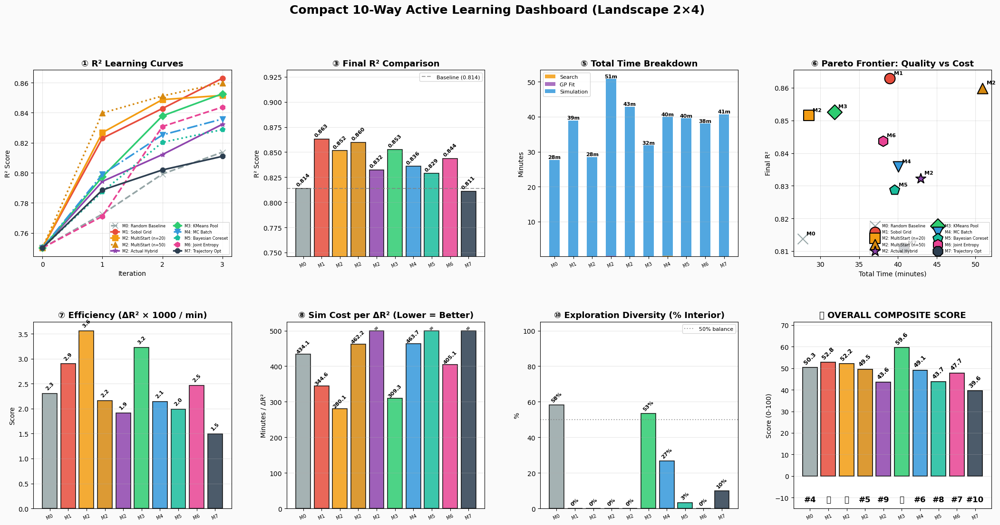

✓ Compact 2x4 landscape dashboard saved → Compact_Active_Learning_Dashboard.png

                                      ACTIVE LEARNING COMPARISON SUMMARY                                      
               Method Final R² ΔR² Gain Total Time (min) Diversity (%) Overall Score
  M0: Random Baseline   0.8137  +0.0638             27.7         58.3%          50.3
       M1: Sobol Grid   0.8629  +0.1130             39.0          0.0%          52.8
M2: MultiStart (n=20)   0.8515  +0.1015             28.5          0.0%          52.2
M2: MultiStart (n=50)   0.8599  +0.1099             50.9          0.0%          49.5
    M2: Actual Hybrid   0.8323  +0.0823             42.9          0.0%          43.6
      M3: KMeans Pool   0.8526  +0.1026             31.8         53.3%          59.6
         M4: MC Batch   0.8358  +0.0858             40.0         26.7%          49.1
 M5: Bayesian Coreset   0.8287  +0.0788             39.6          3.3%          43.7
    M6: Joint Entropy   0.8437  +0.0938    

In [10]:
"""
UNIVERSAL ACTIVE LEARNING COMPARISON & DASHBOARD (DYNAMIC N-WAY)
================================================================================
Compares loaded active learning model checkpoints (M0 through M7).
Generates a compact 8‑plot dashboard (2 rows × 4 columns) optimised for 
landscape presentation slides.
"""

import os
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# ======================================================================
# 1. CONFIGURATION & FILE PATHS
# ======================================================================
N_ITERATIONS         = 3
POINTS_PER_ITERATION = 20
INITIAL_POINTS       = 103

# ======================================================================
# 1. CONFIGURATION & FILE PATHS (UPDATED FOR ACTUAL FILENAMES)
# ======================================================================
PKL_FILES = {
    'M0_Random'    : "M0_Random_Baseline_results_20260716_024107.pkl",
    'M1_Sobol'     : "M1_Sobol_Grid_results_20260716_032006.pkl",
    'M2_n20'       : "M2_MultiStart_results_20260716_034836.pkl",
    'M2_n50'       : "M2_MultiStart_results_20260716_150855.pkl",
    'M2_Actual'    : r"D:\KIT\M2_Actual_Hybrid_results_20260722_221713.pkl",
    'M3_KMeans'    : r"D:\KIT\M3_KMeans_Pool_results_20260722_224903.pkl",
    'M4_Variant'   : "M4_MC_Batch_results_20260723_191607.pkl",
    'M5_Variant'   : "M5_Bayesian_Coreset_results_20260723_195542.pkl",
    'M6_Variant'   : "M6_Maximal_Joint_Entropy_results_20260723_203346.pkl",
    'M7_Trajectory': "M7_Trajectory_Optimization_results_20260724_155604.pkl",
}

PKL_INTERNAL_KEY = {
    'M0_Random'    : 'M0_Random_Baseline',
    'M1_Sobol'     : 'M1_Sobol_Grid',
    'M2_n20'       : 'M2_MultiStart',
    'M2_n50'       : 'M2_MultiStart',
    'M2_Actual'    : 'M2_Actual_Hybrid',
    'M3_KMeans'    : 'M3_KMeans_Pool',
    'M4_Variant'   : 'M4_MC_Batch',
    'M5_Variant'   : 'M5_Bayesian_Coreset',
    'M6_Variant'   : 'M6_Maximal_Joint_Entropy',
    'M7_Trajectory': 'M7_Trajectory_Optimization',
}

LABELS = {
    'M0_Random'    : 'M0: Random Baseline',
    'M1_Sobol'     : 'M1: Sobol Grid',
    'M2_n20'       : 'M2: MultiStart (n=20)',
    'M2_n50'       : 'M2: MultiStart (n=50)',
    'M2_Actual'    : 'M2: Actual Hybrid',
    'M3_KMeans'    : 'M3: KMeans Pool',
    'M4_Variant'   : 'M4: MC Batch',
    'M5_Variant'   : 'M5: Bayesian Coreset',
    'M6_Variant'   : 'M6: Joint Entropy',
    'M7_Trajectory': 'M7: Trajectory Opt',
}

COLORS = {
    'M0_Random'    : '#95a5a6', # Gray
    'M1_Sobol'     : '#e74c3c', # Red
    'M2_n20'       : '#f39c12', # Orange
    'M2_n50'       : '#d68910', # Dark Orange
    'M2_Actual'    : '#8e44ad', # Purple
    'M3_KMeans'    : '#2ecc71', # Green
    'M4_Variant'   : '#3498db', # Blue
    'M5_Variant'   : '#1abc9c', # Teal
    'M6_Variant'   : '#e84393', # Pink
    'M7_Trajectory': '#2c3e50', # Navy
}

MARKERS = {
    'M0_Random'    : 'x',
    'M1_Sobol'     : 'o',
    'M2_n20'       : 's',
    'M2_n50'       : '^',
    'M2_Actual'    : '*',
    'M3_KMeans'    : 'D',
    'M4_Variant'   : 'v',
    'M5_Variant'   : 'p',
    'M6_Variant'   : 'h',
    'M7_Trajectory': '8',
}

LINESTYLES = {
    'M0_Random'    : '--',
    'M1_Sobol'     : '-',
    'M2_n20'       : '-',
    'M2_n50'       : ':',
    'M2_Actual'    : '-',
    'M3_KMeans'    : '-',
    'M4_Variant'   : '-.',
    'M5_Variant'   : ':',
    'M6_Variant'   : '--',
    'M7_Trajectory': '-',
}

# ======================================================================
# 2. DATA LOADING LOGIC (SAFE LOAD)
# ======================================================================
def load_all_data():
    combined_results = {}
    print("="*80)
    print("LOADING ACTIVE LEARNING CHECKPOINT FILES")
    print("="*80)
    for k, filepath in PKL_FILES.items():
        if not os.path.exists(filepath):
            print(f" ✗ [!] File missing for {k}: {filepath}")
            continue
        try:
            with open(filepath, 'rb') as f:
                ckpt = pickle.load(f)
            res = ckpt['results']
            ik = PKL_INTERNAL_KEY[k]
            if ik in res:
                combined_results[k] = res[ik]
            else:
                combined_results[k] = list(res.values())[0]
            print(f" ✓ Successfully loaded: {LABELS[k]} from {filepath}")
        except Exception as e:
            print(f" ✗ [!] Error reading {k} ({filepath}): {e}")
            
    print("="*80)
    print(f"Loaded {len(combined_results)} / {len(PKL_FILES)} models successfully.\n")
    return combined_results

# ======================================================================
# 3. UNIVERSAL METRICS COMPUTATION (DYNAMIC BASELINE)
# ======================================================================
def compute_universal_metrics(all_data):
    metrics = {}
    
    # Establish dynamic baseline reference (M0 if available, else first key)
    base_key = 'M0_Random' if 'M0_Random' in all_data else list(all_data.keys())[0]
    base_r2 = all_data[base_key]['r2_history'][-1]
    base_sim_time = sum(all_data[base_key]['sim_time_history'])

    for k, d in all_data.items():
        r2_init  = d['r2_history'][0]
        r2_final = d['r2_history'][-1]
        rm_final = d['rmse_history'][-1]

        t_search = sum(d['search_time_history'])
        t_sim    = sum(d['sim_time_history'])
        t_fit    = sum(d['fit_time_history'])
        t_total  = t_search + t_sim + t_fit

        r2_gain   = r2_final - r2_init
        advantage = r2_final - base_r2

        tot_b = sum(d['boundary_pts_history'])
        tot_i = sum(d['interior_pts_history'])
        bnd_pct = (tot_b / (tot_b + tot_i) * 100) if (tot_b + tot_i) > 0 else 0
        diversity = 100 - bnd_pct

        # Efficiency & Cost metrics
        efficiency = r2_gain / (t_total / 60) if t_total > 0 else 0
        sim_cost = (t_sim / 60) / r2_gain if r2_gain > 0 else float('inf')
        val_per_pt = r2_gain / (N_ITERATIONS * POINTS_PER_ITERATION)
        speedup = base_sim_time / t_sim if t_sim > 0 else 0

        base_search_fit = (sum(all_data[base_key]['search_time_history']) + 
                           sum(all_data[base_key]['fit_time_history']) + 
                           base_sim_time)
        extra_time_min = (t_total - base_search_fit) / 60

        if abs(extra_time_min) < 0.1:
            cost_eff = float('inf')
        else:
            cost_eff = advantage / extra_time_min if extra_time_min > 0 else -1

        # Composite score (0-100 scale)
        norm_r2  = max(0, min(1, (r2_final - 0.70) / 0.20))
        norm_eff = min(efficiency * 50, 1.0)
        norm_div = diversity / 100
        norm_spd = max(0, min(1, 1.0 - (t_total / 6000)))

        overall = (0.50 * norm_r2 + 0.20 * norm_eff + 0.15 * norm_div + 0.15 * norm_spd) * 100

        metrics[k] = {
            'label'         : LABELS[k],
            'final_r2'      : r2_final,
            'final_rmse'    : rm_final,
            'r2_gain'       : r2_gain,
            'advantage'     : advantage,
            't_search'      : t_search,
            't_sim'         : t_sim,
            't_fit'         : t_fit,
            't_total'       : t_total,
            't_total_min'   : t_total / 60,
            'boundary_pct'  : bnd_pct,
            'diversity'     : diversity,
            'efficiency'    : efficiency,
            'sim_cost'      : sim_cost,
            'val_per_pt'    : val_per_pt,
            'cost_eff'      : cost_eff,
            'speedup'       : speedup,
            'overall_score' : overall,
            'base_r2'       : base_r2
        }
    return metrics

# ======================================================================
# 4. COMPACT 8-PLOT DASHBOARD (2x4 LANDSCAPE LAYOUT)
# ======================================================================
def plot_compact_dashboard(all_data, metrics, save_path='Compact_Active_Learning_Dashboard.png'):
    """
    Generates a clean 8-plot dashboard (2 rows × 4 columns) for landscape PPT slides.
    Plots included: ① R² Curves, ③ Final R², ⑤ Time Breakdown, ⑥ Pareto,
    ⑦ Efficiency, ⑧ Sim Cost, ⑩ Diversity, ⑪ Composite Score.
    """
    keys = list(all_data.keys())
    iters = np.arange(0, N_ITERATIONS + 1)
    x_pos = np.arange(len(keys))
    bcols = [COLORS[k] for k in keys]
    num_models = len(keys)

    # Landscape figure size: wide and not too tall
    fig = plt.figure(figsize=(26, 12))
    fig.patch.set_facecolor('#fafafa')
    gs = GridSpec(2, 4, figure=fig, hspace=0.35, wspace=0.28)

    # ===================== ROW 1 (4 plots) =====================

    # ① R² Learning Curves (Line Plot)
    ax = fig.add_subplot(gs[0, 0])
    for k, d in all_data.items():
        ax.plot(iters, d['r2_history'], color=COLORS[k], marker=MARKERS[k],
                linestyle=LINESTYLES[k], linewidth=2.5, markersize=8, label=LABELS[k])
    ax.set_title('① R² Learning Curves', fontweight='bold', fontsize=13)
    ax.set_xlabel('Iteration', fontsize=10); ax.set_ylabel('R² Score', fontsize=10)
    ax.legend(fontsize=6, loc='lower right', ncol=2 if num_models > 5 else 1)
    ax.grid(True, alpha=0.3); ax.set_xticks(iters)

    # ③ Final R² Comparison (Bar Chart)
    ax = fig.add_subplot(gs[0, 1])
    final_r2 = [metrics[k]['final_r2'] for k in keys]
    bars = ax.bar(x_pos, final_r2, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val in zip(bars, final_r2):
        ax.text(bar.get_x() + bar.get_width()/2, val + 0.002, f'{val:.3f}',
                ha='center', fontsize=8, fontweight='bold', rotation=45)
    base_r2 = metrics[keys[0]]['base_r2']
    ax.axhline(base_r2, color='gray', linestyle='--', linewidth=1.5, alpha=0.7,
               label=f'Baseline ({base_r2:.3f})')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=7, rotation=25)
    ax.set_title('③ Final R² Comparison', fontweight='bold', fontsize=13)
    ax.set_ylabel('R² Score', fontsize=10)
    ax.set_ylim(min(final_r2)*0.92, max(final_r2)*1.08)
    ax.legend(fontsize=8); ax.grid(axis='y', alpha=0.3)

    # ⑤ Total Time Breakdown (Stacked Bar)
    ax = fig.add_subplot(gs[0, 2])
    w = 0.55
    ts = [metrics[k]['t_search'] / 60 for k in keys]
    tf = [metrics[k]['t_fit'] / 60 for k in keys]
    tm = [metrics[k]['t_sim'] / 60 for k in keys]
    ax.bar(x_pos, ts, w, label='Search', color='#f39c12', alpha=0.85)
    ax.bar(x_pos, tf, w, bottom=ts, label='GP Fit', color='#9b59b6', alpha=0.85)
    ax.bar(x_pos, tm, w, bottom=[a+b for a,b in zip(ts,tf)], label='Simulation', color='#3498db', alpha=0.85)
    for i, tot in enumerate([s+f+m for s,f,m in zip(ts,tf,tm)]):
        ax.text(i, tot + 0.3, f'{tot:.0f}m', ha='center', fontsize=8, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=7, rotation=25)
    ax.set_title('⑤ Total Time Breakdown', fontweight='bold', fontsize=13)
    ax.set_ylabel('Minutes', fontsize=10)
    ax.legend(fontsize=8, loc='upper left'); ax.grid(axis='y', alpha=0.3)

    # ⑥ Pareto Frontier: R² vs Total Time (Scatter)
    ax = fig.add_subplot(gs[0, 3])
    for k in keys:
        m = metrics[k]
        ax.scatter(m['t_total_min'], m['final_r2'], color=COLORS[k], marker=MARKERS[k],
                   s=250, edgecolor='black', linewidth=1.5, label=LABELS[k], zorder=3)
        ax.annotate(LABELS[k].split(':')[0], (m['t_total_min'], m['final_r2']),
                    textcoords='offset points', xytext=(6, 6), fontsize=8, fontweight='bold')
    ax.set_title('⑥ Pareto Frontier: Quality vs Cost', fontweight='bold', fontsize=13)
    ax.set_xlabel('Total Time (minutes)', fontsize=10); ax.set_ylabel('Final R²', fontsize=10)
    ax.legend(fontsize=6, loc='lower right', ncol=2 if num_models > 5 else 1)
    ax.grid(True, alpha=0.3)

    # ===================== ROW 2 (4 plots) =====================

    # ⑦ Efficiency (ΔR² per minute × 1000)
    ax = fig.add_subplot(gs[1, 0])
    eff_vals = [metrics[k]['efficiency'] * 1000 for k in keys]
    bars = ax.bar(x_pos, eff_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val in zip(bars, eff_vals):
        ax.text(bar.get_x() + bar.get_width()/2, val + (max(eff_vals)*0.02 or 0.5),
                f'{val:.1f}', ha='center', fontsize=8, fontweight='bold', rotation=45)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=7, rotation=25)
    ax.set_title('⑦ Efficiency (ΔR² × 1000 / min)', fontweight='bold', fontsize=13)
    ax.set_ylabel('Score', fontsize=10); ax.grid(axis='y', alpha=0.3)

    # ⑧ Simulation Cost per ΔR² (Lower = Better)
    ax = fig.add_subplot(gs[1, 1])
    sim_cost_vals = [min(metrics[k]['sim_cost'], 500) for k in keys]
    bars = ax.bar(x_pos, sim_cost_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val, k in zip(bars, sim_cost_vals, keys):
        actual = metrics[k]['sim_cost']
        lbl = f'{actual:.1f}' if actual < 500 else '∞'
        ax.text(bar.get_x() + bar.get_width()/2, val + 2, lbl,
                ha='center', fontsize=8, fontweight='bold', rotation=45)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=7, rotation=25)
    ax.set_title('⑧ Sim Cost per ΔR² (Lower = Better)', fontweight='bold', fontsize=13)
    ax.set_ylabel('Minutes / ΔR²', fontsize=10); ax.grid(axis='y', alpha=0.3)

    # ⑩ Exploration Diversity (% Interior)
    ax = fig.add_subplot(gs[1, 2])
    div_vals = [metrics[k]['diversity'] for k in keys]
    bars = ax.bar(x_pos, div_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.2)
    for bar, val in zip(bars, div_vals):
        ax.text(bar.get_x() + bar.get_width()/2, val + 1.5, f'{val:.0f}%',
                ha='center', fontsize=8, fontweight='bold', rotation=45)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=7, rotation=25)
    ax.set_ylim(0, 105); ax.axhline(50, color='gray', linestyle=':', alpha=0.7, label='50% balance')
    ax.set_title('⑩ Exploration Diversity (% Interior)', fontweight='bold', fontsize=13)
    ax.set_ylabel('%', fontsize=10); ax.legend(fontsize=8); ax.grid(axis='y', alpha=0.3)

    # ⑪ Overall Composite Score
    ax = fig.add_subplot(gs[1, 3])
    overall_vals = [metrics[k]['overall_score'] for k in keys]
    bars = ax.bar(x_pos, overall_vals, color=bcols, alpha=0.85, edgecolor='black', linewidth=1.3)
    for bar, val in zip(bars, overall_vals):
        ax.text(bar.get_x() + bar.get_width()/2, val + 1.5, f'{val:.1f}',
                ha='center', fontsize=9, fontweight='bold', rotation=45)

    # Add ranking medals above bars
    ranked = sorted(zip(keys, overall_vals), key=lambda x: -x[1])
    rank_map = {k: (i+1) for i, (k, _) in enumerate(ranked)}
    medals = {1: '🥇', 2: '🥈', 3: '🥉'}
    for i, k in enumerate(keys):
        r = rank_map[k]
        ax.text(i, -12, medals.get(r, f'#{r}'), ha='center', fontsize=12, fontweight='bold')

    ax.set_xticks(x_pos)
    ax.set_xticklabels([LABELS[k].split(':')[0] for k in keys], fontsize=7, rotation=25)
    ax.set_ylim(-15, max(overall_vals)*1.20)
    ax.set_title('⑪ OVERALL COMPOSITE SCORE', fontweight='bold', fontsize=13)
    ax.set_ylabel('Score (0-100)', fontsize=10); ax.grid(axis='y', alpha=0.3)

    # ────────────────────── FINISH ──────────────────────
    plt.suptitle(f'Compact {num_models}-Way Active Learning Dashboard (Landscape 2×4)',
                 fontsize=18, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✓ Compact 2x4 landscape dashboard saved → {save_path}")


# ======================================================================
# 5. SUMMARY PRINTER
# ======================================================================
def print_final_summary(metrics):
    print(f"\n{'='*110}")
    print(f"{'ACTIVE LEARNING COMPARISON SUMMARY':^110}")
    print(f"{'='*110}")
    rows = []
    for k, m in metrics.items():
        rows.append({
            'Method'          : m['label'],
            'Final R²'        : f"{m['final_r2']:.4f}",
            'ΔR² Gain'        : f"{m['r2_gain']:+.4f}",
            'Total Time (min)': f"{m['t_total_min']:.1f}",
            'Diversity (%)'   : f"{m['diversity']:.1f}%",
            'Overall Score'   : f"{m['overall_score']:.1f}",
        })
    df = pd.DataFrame(rows)
    print(df.to_string(index=False))
    print(f"{'='*110}\n")
    df.to_csv("Active_Learning_Summary.csv", index=False)
    print("✓ Summary saved to Active_Learning_Summary.csv\n")


# ======================================================================
# 6. MAIN EXECUTION
# ======================================================================
if __name__ == "__main__":
    all_data = load_all_data()
    if len(all_data) > 0:
        metrics = compute_universal_metrics(all_data)
        # Generate the 2×4 landscape dashboard
        plot_compact_dashboard(all_data, metrics, save_path='Compact_Active_Learning_Dashboard.png')
        print_final_summary(metrics)
    else:
        print("✗ No checkpoint data could be loaded. Please check file paths.")